## AIM: Train Graph Convulation Networks (GCNs) for ADHD prediction only

In this notebook only the ADHD and healthy controls will be sampled for binary classification using the same graphLambda models, to test how much the original graphLambda models are struggling with the multiclass classification.

Have to use features before feature selection, to maintain even dimensions for each graph. Stat features are standardized before training. Models are tuned using multi-objective Optuna, maximizing val f1 and minimizing val loss

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

import optuna

import lightning.pytorch as pl
import torch
import torch_geometric
import torch.nn.functional as F
from torch.nn import Sequential, Linear, ReLU, BatchNorm1d, Dropout, Dropout1d
from torch_geometric.nn import  GCNConv, global_add_pool,GATConv,GINConv, GATv2Conv
from torch_geometric.loader import DataLoader
from torch_geometric.data import Data
from torch_geometric.utils.convert import from_networkx, to_networkx
import lightning.pytorch as pl
from torchmetrics import F1Score, ConfusionMatrix
from lightning.pytorch.tuner import Tuner
from lightning.pytorch import Trainer
from lightning.pytorch.callbacks import ModelCheckpoint, TQDMProgressBar, RichProgressBar
from lightning.pytorch.callbacks.early_stopping import EarlyStopping

from optuna.visualization.matplotlib import plot_contour
from optuna.visualization.matplotlib import plot_edf
from optuna.visualization.matplotlib import plot_intermediate_values
from optuna.visualization.matplotlib import plot_optimization_history
from optuna.visualization.matplotlib import plot_parallel_coordinate
from optuna.visualization.matplotlib import plot_param_importances
from optuna.visualization.matplotlib import plot_rank
from optuna.visualization.matplotlib import plot_slice
from optuna.visualization.matplotlib import plot_timeline

### Load data & features

In [2]:
import pickle
def load_file(file):
    with open(file, 'rb') as handle:
        return pickle.load(handle)

In [3]:
# import stat & conn features without feature selection
df_stat_conn_features = pd.read_pickle('df_stat_conn_features.pkl')
df_stat_conn_features = df_stat_conn_features.dropna(subset=['diagnosis'])

# filter diagnosis on ADHD and healthy class
df_stat_conn_features = df_stat_conn_features[df_stat_conn_features['diagnosis'].isin(['ADHD', 'HEALTHY'])]
print(df_stat_conn_features['diagnosis'].value_counts())

# label encode diagnosis
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
le.fit(df_stat_conn_features['diagnosis'])
df_stat_conn_features['diagnosis'] = le.transform(df_stat_conn_features['diagnosis'])

print(df_stat_conn_features.shape)
df_stat_conn_features.sample(3)

diagnosis
HEALTHY    540
ADHD       540
Name: count, dtype: int64
(1080, 1218)


,ID,diagnosis,epoch,EO_l_frontal_delta_std,EO_l_frontal_delta_mean,EO_l_frontal_delta_median,EO_l_frontal_delta_skew,EO_l_frontal_delta_kurt,EO_l_frontal_theta_std,EO_l_frontal_theta_mean,...,ratio_gamma_m_central-r_central,ratio_gamma_m_central-l_posterior,ratio_gamma_m_central-m_posterior,ratio_gamma_m_central-r_posterior,ratio_gamma_r_central-l_posterior,ratio_gamma_r_central-m_posterior,ratio_gamma_r_central-r_posterior,ratio_gamma_l_posterior-m_posterior,ratio_gamma_l_posterior-r_posterior,ratio_gamma_m_posterior-r_posterior
1812,sub-88053545,1,1,0.096044,0.058333,0.058333,3.599087,15.815321,0.062609,0.046685,...,1.002828,1.019009,1.032004,1.027333,1.021866,1.025964,1.014938,1.026099,1.022601,1.016683
839,sub-87980913,1,12,0.069974,0.086019,0.086019,2.255171,6.091292,0.027073,0.046034,...,1.059513,1.051162,1.117206,1.044339,1.077469,1.142621,1.024555,1.135161,1.056647,1.139046
2435,sub-88068797,0,12,0.083878,0.110511,0.110511,2.499371,9.120563,0.030834,0.061339,...,1.015806,1.036251,1.036432,1.038488,1.046874,1.039618,1.028691,1.033102,1.042385,1.027049


In [4]:
# create 3 feature sets [EC, EO, ratio] with column ['ID', 'age', 'gender', 'diagnosis', 'epoch']
df_stat_conn_features_ec = df_stat_conn_features[df_stat_conn_features.columns[~(df_stat_conn_features.columns.str.startswith('EO') | df_stat_conn_features.columns.str.startswith('ratio'))]]
df_stat_conn_features_eo = df_stat_conn_features[df_stat_conn_features.columns[~(df_stat_conn_features.columns.str.startswith('EC') | df_stat_conn_features.columns.str.startswith('ratio'))]]
df_stat_conn_features_ratio = df_stat_conn_features[df_stat_conn_features.columns[~(df_stat_conn_features.columns.str.startswith('EC') | df_stat_conn_features.columns.str.startswith('EO'))]]
print(df_stat_conn_features_eo.shape)

# remove missing EC & ratio features
df_stat_conn_features_ec = df_stat_conn_features_ec.dropna(subset=['EC_l_frontal_delta_std'])
df_stat_conn_features_ratio = df_stat_conn_features_ratio.dropna(subset=['ratio_gamma_m_central-r_central'])
print(df_stat_conn_features_ec.shape)
print(df_stat_conn_features_ratio.shape)

(1080, 408)
(1068, 408)
(1068, 408)


In [5]:
synchrony_feature_dict = load_file('synchrony_feature_dict.pkl')
subjects_ec_syncro_matrices = synchrony_feature_dict['EC_syncro']
subjects_eo_syncro_matrices = synchrony_feature_dict['EO_syncro']
subjects_ec_ids = synchrony_feature_dict['EC_IDs']
subjects_eo_ids = synchrony_feature_dict['EO_IDs']

# Select the synchrony matrices from ADHD and HEALTHY subjects
# Find the indices of the stat_conn_features IDs in the synchrony matrices
ec_indices = [subjects_ec_ids.index(ec_id) for ec_id in set(df_stat_conn_features_ec['ID'].tolist())]
eo_indices = [subjects_eo_ids.index(eo_id) for eo_id in set(df_stat_conn_features_ec['ID'].tolist())]
# use those indices to select the synchrony matrices and the IDs
subjects_ec_syncro_matrices = [subjects_ec_syncro_matrices[i] for i in ec_indices]
subjects_eo_syncro_matrices = [subjects_eo_syncro_matrices[i] for i in eo_indices]
subjects_ec_ids = [subjects_ec_ids[i] for i in ec_indices]
subjects_eo_ids = [subjects_eo_ids[i] for i in eo_indices]



print(len(subjects_ec_syncro_matrices), len(subjects_eo_syncro_matrices))
print(len(subjects_ec_ids), len(subjects_eo_ids))
print(subjects_ec_syncro_matrices[0].shape)
print(subjects_ec_ids[0])

89 89
89 89
(12, 5, 9, 9)
sub-88019033


In [6]:
# compute ratio [EC/EO] synchrony matrices

# Convert the lists to sets
subjects_ec_ids_set = set(subjects_ec_ids)
subjects_eo_ids_set = set(subjects_eo_ids)
# find the missing IDs to make sure ratio is computed within the same participant
missing_ids = subjects_eo_ids_set - subjects_ec_ids_set
missing_ids_indices = [subjects_eo_ids.index(id) for id in missing_ids]

# remove missing IDs from EO
ratio_subjects_eo_syncro_matrices = [matrix for i, matrix in enumerate(subjects_eo_syncro_matrices) if i not in missing_ids_indices]
assert len(ratio_subjects_eo_syncro_matrices) == len(subjects_ec_syncro_matrices)

# compute ratio
subjects_ratio_syncro_matrices = []
for i in range(len(subjects_ec_syncro_matrices)):
    ratio_matrix = subjects_ec_syncro_matrices[i] / ratio_subjects_eo_syncro_matrices[i]
    subjects_ratio_syncro_matrices.append(ratio_matrix)
subjects_ratio_ids = subjects_ec_ids
print(len(subjects_ratio_syncro_matrices), len(subjects_ratio_ids))

89 89


/tmp/ipykernel_36455/3185583188.py:17: RuntimeWarning: invalid value encountered in divide
  ratio_matrix = subjects_ec_syncro_matrices[i] / ratio_subjects_eo_syncro_matrices[i]


In [7]:
# define function to store features in PyTorch Geometric Data objects
import networkx as nx
from joblib import Parallel, delayed # for parallel processing
from tqdm import tqdm
def process_subject(syncros, subject_id, df_features):
    graph_dataset = []
    y_list = []

    # obtain statistical features for subject
    subject_stat_features = df_features[df_features['ID'] == subject_id]
    stat_columns = ['epoch', 'mean', 'median', 'std', 'kurt', 'skew'] # select statistical features
    pattern = '|'.join(stat_columns)  # create a pattern string
    subject_stat_features = subject_stat_features[subject_stat_features.columns[subject_stat_features.columns.str.contains(pattern)]]
    
    for epoch, syncro_matrices in enumerate(syncros):
        num_edges = int((syncro_matrices.shape[1] * (syncro_matrices.shape[2] - 1)) / 2)
        bands = syncro_matrices.shape[0]
        edge_attrs = np.zeros((num_edges, bands)) # create empty array to store edge weights for each frequency band

        for i, syncro_matrix in enumerate(syncro_matrices):
            # print(f'{syncro_matrix.shape = }')
            syncro_graph = nx.from_numpy_array(syncro_matrix)
            # print(f'{syncro_graph = }')
            edge_list = nx.to_pandas_edgelist(syncro_graph)
            edge_list = edge_list.dropna(axis=0)
            # print(f'{edge_list = }')
            edge_index = edge_list.iloc[:,0:2].values.T # shape (2, num_edges), edge_index stays the same for all bands right?
            # print(f'{edge_index = }')
            edge_attr = edge_list.iloc[:,2].values#.reshape(-1,1)
            edge_attrs[:,i] = edge_attr

        y = df_stat_conn_features_ec[df_stat_conn_features_ec['ID'] == subject_id]['diagnosis'].values[0]
        
        # store statistical features for subject
        ch_groups = ['l_frontal', 'm_frontal', 'r_frontal', 'l_central', 'm_central', 'r_central', 'l_posterior', 'm_posterior', 'r_posterior']
        bands = ['delta', 'theta', 'alpha', 'beta', 'gamma']
        x = np.zeros((len(ch_groups), len(bands) * (len(stat_columns)-1))) # -1 because of epochs column in stat_columns
        # print(x.shape)
        for num, ch_group in enumerate(ch_groups):
            x[num] = subject_stat_features[subject_stat_features['epoch'] == (epoch + 1)][subject_stat_features.columns[subject_stat_features.columns.str.contains(ch_group)]].values[0]
            

        data = Data(x=torch.tensor(x, dtype=torch.float),                     # Node features [num_nodes, num_node_features]
                    edge_index=torch.tensor(edge_index, dtype=torch.long),    # Adjacency matrix [2, num_edges]
                    edge_attr=torch.tensor(edge_attrs,dtype=torch.float),  # Edge features [num_edges, num_edge_features]
                    y=torch.tensor([y], dtype=torch.long))                    # Target/Label (it should be a list) --> torch.long for classification, torch.float for regression
        graph_dataset.append(data)
        y_list.append(y)

    return graph_dataset, y_list

In [8]:
# retrieve and store data for EC features
# subjects__ec/eo_syncro_matrices : A list of lists, every list is a subject, every element in that list is an array of shape [n_epochs, n_bands, n_channels, n_channels]

results = Parallel(n_jobs=-1)(delayed(process_subject)(syncros, subject_id, df_stat_conn_features_ec) for syncros, subject_id in tqdm(zip(subjects_ec_syncro_matrices, subjects_ec_ids), total=len(subjects_ec_syncro_matrices)))

ec_graph_dataset = []
ec_y_list = []
for result in results:
    ec_graph_dataset.extend(result[0])
    ec_y_list.extend(result[1])
    
assert len(ec_graph_dataset) == len(ec_y_list)

print(f'{ec_graph_dataset[0].x.shape = }, stat features [num_nodes, num_node_features]')
print(f'{ec_graph_dataset[0].edge_attr.shape = }, [num_edges, n_bands]')
print(f'{ec_graph_dataset[0].edge_index.shape = }, [2, num_edges]')
print(f'{len(ec_graph_dataset) = }, subjects: {len(subjects_ec_syncro_matrices)}, epochs: {len(subjects_ec_syncro_matrices[0])}')
print(f'{ec_graph_dataset[0] = }')

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 89/89 [00:03<00:00, 23.48it/s]


ec_graph_dataset[0].x.shape = torch.Size([9, 25]), stat features [num_nodes, num_node_features]
ec_graph_dataset[0].edge_attr.shape = torch.Size([36, 5]), [num_edges, n_bands]
ec_graph_dataset[0].edge_index.shape = torch.Size([2, 36]), [2, num_edges]
len(ec_graph_dataset) = 1068, subjects: 89, epochs: 12
ec_graph_dataset[0] = Data(x=[9, 25], edge_index=[2, 36], edge_attr=[36, 5], y=[1])


In [9]:
# retrieve and store data for EO features
# subjects__ec/eo_syncro_matrices : A list of lists, every list is a subject, every element in that list is an array of shape [n_epochs, n_bands, n_channels, n_channels]

results = Parallel(n_jobs=-1)(delayed(process_subject)(syncros, subject_id, df_stat_conn_features_eo) for syncros, subject_id in tqdm(zip(subjects_eo_syncro_matrices, subjects_eo_ids), total=len(subjects_eo_syncro_matrices)))

eo_graph_dataset = []
eo_y_list = []
for result in results:
    eo_graph_dataset.extend(result[0])
    eo_y_list.extend(result[1])
    
assert len(eo_graph_dataset) == len(eo_y_list)

print(f'{eo_graph_dataset[0].x.shape = }, stat features [num_nodes, num_node_features]')
print(f'{eo_graph_dataset[0].edge_attr.shape = }, [num_edges, n_bands]')
print(f'{eo_graph_dataset[0].edge_index.shape = }, [2, num_edges]')
print(f'{len(eo_graph_dataset) = }, subjects: {len(subjects_eo_syncro_matrices)}, epochs: {len(subjects_eo_syncro_matrices[0])}')
print(f'{eo_graph_dataset[0] = }')

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 89/89 [00:00<00:00, 124.01it/s]


eo_graph_dataset[0].x.shape = torch.Size([9, 25]), stat features [num_nodes, num_node_features]
eo_graph_dataset[0].edge_attr.shape = torch.Size([36, 5]), [num_edges, n_bands]
eo_graph_dataset[0].edge_index.shape = torch.Size([2, 36]), [2, num_edges]
len(eo_graph_dataset) = 1068, subjects: 89, epochs: 12
eo_graph_dataset[0] = Data(x=[9, 25], edge_index=[2, 36], edge_attr=[36, 5], y=[1])


In [10]:
# retrieve and store data for EO features
# subjects__ec/eo_syncro_matrices : A list of lists, every list is a subject, every element in that list is an array of shape [n_epochs, n_bands, n_channels, n_channels]

results = Parallel(n_jobs=-1)(delayed(process_subject)(syncros, subject_id, df_stat_conn_features_ratio) for syncros, subject_id in tqdm(zip(subjects_ratio_syncro_matrices, subjects_ratio_ids), total=len(subjects_ratio_syncro_matrices)))

# process_subject(subjects_ratio_syncro_matrices[0], subjects_ratio_ids[0])

ratio_graph_dataset = []
ratio_y_list = []
for result in results:
    ratio_graph_dataset.extend(result[0])
    ratio_y_list.extend(result[1])
    
assert len(ratio_graph_dataset) == len(ratio_y_list)

print(f'{ratio_graph_dataset[0].x.shape = }, stat features [num_nodes, num_node_features]')
print(f'{ratio_graph_dataset[0].edge_attr.shape = }, [num_edges, n_bands]')
print(f'{ratio_graph_dataset[0].edge_index.shape = }, [2, num_edges]')
print(f'{len(ratio_graph_dataset) = }, subjects: {len(subjects_ratio_syncro_matrices)}, epochs: {len(subjects_ratio_syncro_matrices[0])}')
print(f'{ratio_graph_dataset[0] = }')

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 89/89 [00:00<00:00, 116.80it/s]


ratio_graph_dataset[0].x.shape = torch.Size([9, 25]), stat features [num_nodes, num_node_features]
ratio_graph_dataset[0].edge_attr.shape = torch.Size([36, 5]), [num_edges, n_bands]
ratio_graph_dataset[0].edge_index.shape = torch.Size([2, 36]), [2, num_edges]
len(ratio_graph_dataset) = 1068, subjects: 89, epochs: 12
ratio_graph_dataset[0] = Data(x=[9, 25], edge_index=[2, 36], edge_attr=[36, 5], y=[1])


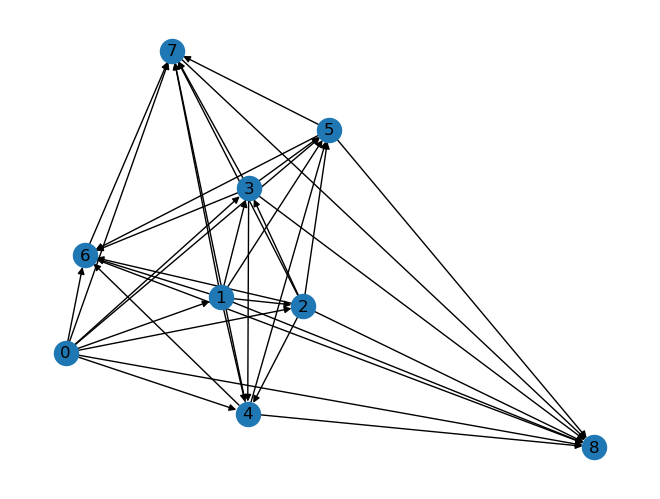

In [11]:
nx.draw(to_networkx(ratio_graph_dataset[0]), with_labels=True)

# GCN models:

### Model: graphLambda without edge_attr

In [12]:
import lightning.pytorch as pl
from torchmetrics import F1Score, ConfusionMatrix
import seaborn as sns
import matplotlib.pyplot as plt
import torch
import torch_geometric
from torch.nn import Sequential, Linear, ReLU, BatchNorm1d, Dropout, Dropout1d, ModuleList
import torch.nn.functional as F
from torch_geometric.nn import  GCNConv, global_add_pool, GATConv, GINConv


n_features = 25 # [Delta, Theta, Alpha, Beta, Gamma] * [mean, median, std, skew, kurt]
num_classes = 2 # healthy, ADHD

class graphLambda_wo_edge_attr(pl.LightningModule):
    def __init__(self, learning_rate, optimizer_name, fc_layers, dropout):
        super(graphLambda_wo_edge_attr, self).__init__()
        self.learning_rate = learning_rate
        self.optimizer_name = optimizer_name

        #GCN-representation
        self.conv1 = GCNConv(n_features, 256, cached=False )
        self.bn01 = BatchNorm1d(256)
        self.conv2 = GCNConv(256, 128, cached=False )
        self.bn02 = BatchNorm1d(128)
        self.conv3 = GCNConv(128, 128, cached=False)
        self.bn03 = BatchNorm1d(128)
        #GAT-representation
        self.gat1 = GATConv(n_features, 256, heads=3)
        self.bn11 = BatchNorm1d(256*3)
        self.gat2 = GATConv(256*3, 128, heads=3)
        self.bn12 = BatchNorm1d(128*3)
        self.gat3 = GATConv(128*3, 128, heads=3)
        self.bn13 = BatchNorm1d(128*3)
        #GIN-representation
        fc_gin1=Sequential(Linear(n_features, 256), ReLU(), Linear(256, 256))
        self.gin1 = GINConv(fc_gin1)
        self.bn21 = BatchNorm1d(256)
        fc_gin2=Sequential(Linear(256, 128), ReLU(), Linear(128, 128))
        self.gin2 = GINConv(fc_gin2)
        self.bn22 = BatchNorm1d(128)
        fc_gin3=Sequential(Linear(128, 64), ReLU(), Linear(64, 64))
        self.gin3 = GINConv(fc_gin3)
        self.bn23 = BatchNorm1d(64)
        # Fully connected layers for concatinating outputs (varied depending on fc_layers)
        self.fcs = ModuleList()
        self.dropouts = ModuleList()
        input_size = 128*4 + 64 # Input size for the first layer
        output_size = num_classes # Output size for the last layer
        sizes = np.linspace(input_size, output_size, fc_layers + 1, dtype=int) # Calculate the size for each layer
        for i in range(fc_layers): # Create the layers
            self.fcs.append(Linear(sizes[i], sizes[i + 1]))
            self.dropouts.append(Dropout(p=dropout))

        # add metrics
        self.train_f1 = F1Score(task='multiclass', num_classes=num_classes, average='macro')
        self.val_f1 = F1Score(task='multiclass', num_classes=num_classes, average='macro')
        self.val_cm = ConfusionMatrix(task = 'binary', num_classes=num_classes, threshold=0.05)
        self.validation_step_yhats = []
        self.validation_step_ys = []
        
    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        y=x
        z=x
        #GCN-representation
        x = F.relu(self.conv1(x, edge_index))
        x = self.bn01(x)
        x = F.relu(self.conv2(x, edge_index))
        x = self.bn02(x)
        x = F.relu(self.conv3(x, edge_index))
        x = self.bn03(x)
        x = global_add_pool(x, data.batch)
        #GAT-representation
        y = F.relu(self.gat1(y, edge_index))
        y = self.bn11(y)
        y = F.relu(self.gat2(y, edge_index))
        y = self.bn12(y)
        y = F.relu(self.gat3(y, edge_index))
        y = self.bn13(y)
        y = global_add_pool(y, data.batch)
        #GIN-representation
        z = F.relu(self.gin1(z, edge_index))
        z = self.bn21(z)
        z = F.relu(self.gin2(z, edge_index))
        z = self.bn22(z)
        z = F.relu(self.gin3(z, edge_index))
        z = self.bn23(z)
        z = global_add_pool(z, data.batch)
        #Concatinating_representations
        cr=torch.cat((x,y,z),1)
        for fc, dropout in zip(self.fcs, self.dropouts):
            cr = F.relu(fc(cr))
            cr = dropout(cr)
        #cr = F.relu(cr).view(-1)
        cr = F.log_softmax(cr, dim=1) # Activation function for classification
        return cr  
    
    def configure_optimizers(self):
        if self.optimizer_name == 'Adam':
            optimizer = torch.optim.Adam(self.parameters(), lr=self.learning_rate)
        elif self.optimizer_name == 'RMSprop':
            optimizer = torch.optim.RMSprop(self.parameters(), lr=self.learning_rate)
        elif self.optimizer_name == 'SGD':
            optimizer = torch.optim.SGD(self.parameters(), lr=self.learning_rate)
        else:
            raise ValueError(f'Unsupported optimizer: {self.optimizer_name}')
        return optimizer
    
    def training_step(self, train_batch, batch_idx):
        x, y = train_batch.x, train_batch.y
        output = self.forward(train_batch)
        output = output.to(torch.float)
        y = y.to(torch.long)
        loss = F.nll_loss(output, y)
        y_hat = output.argmax(dim=1)
        self.log('train_loss', loss, on_epoch=True, prog_bar=True)
        self.log('train_f1', self.train_f1(y, y_hat), on_epoch=True, prog_bar=True)
        return loss
    
    def validation_step(self, val_batch, batch_idx):
        x, y = val_batch.x, val_batch.y
        output = self.forward(val_batch)
        output = output.to(torch.float)
        y = y.to(torch.long)
        loss = F.nll_loss(output, y)
        y_hat = output.argmax(dim=1)
        self.log('val_loss', loss, on_epoch=True, prog_bar=True)
        self.log('val_f1', self.val_f1(y, y_hat), on_epoch=True, prog_bar=True)
        self.validation_step_yhats.append(y_hat)
        self.validation_step_ys.append(y)
        return loss
    
    def test_step(self, test_batch, batch_idx):
        x, y = test_batch.x, test_batch.y
        output = self.forward(test_batch)
        output = output.to(torch.float)
        y = y.to(torch.long)
        loss = F.nll_loss(output, y)
        y_hat = output.argmax(dim=1)
        self.log('test_loss', loss, on_epoch=True, prog_bar=True)
        self.log('test_f1', self.val_f1(y, y_hat), on_epoch=True, prog_bar=True)
        return loss
    
    # def on_train_epoch_end(self, training_step_outputs):
    #     # compute metrics
    #     train_f1 = self.train_f1.compute()
    #     # log metrics
    #     self.log("epoch_train_f1", train_f1)
    #     # reset all metrics
    #     self.train_f1.reset()
    #     print(f"\nf1: {train_f1:.4}")

    # def on_validation_epoch_end(self):
    #     # plot confusion matrix
    #     y_hat = torch.cat(self.validation_step_yhats)
    #     y = torch.cat(self.validation_step_ys)
    #     confusion_matrix = self.val_cm(y_hat, y.int())

    #     confusion_matrix_computed = confusion_matrix.detach().cpu().numpy().astype(int)

    #     df_cm = pd.DataFrame(confusion_matrix_computed)
    #     plt.figure(figsize = (10,7))
    #     fig_ = sns.heatmap(df_cm, annot=True, cmap='Spectral').get_figure()
    #     plt.close(fig_)
    #     self.loggers[0].experiment.add_figure("Confusion matrix", fig_, self.current_epoch)

    #     self.validation_step_yhats.clear() # free memory
    #     self.validation_step_ys.clear()
    
    def predict_step(self, batch):
        x, y = batch.x, batch.y
        output = self.forward(batch)
        loss = F.nll_loss(output, y)
        y_hat = output.argmax(dim=1)
        return y_hat

### Model: graphLambda with edge_attr

In [13]:
#Model
import lightning.pytorch as pl
from torchmetrics import F1Score, ConfusionMatrix
import seaborn as sns
import matplotlib.pyplot as plt
import torch
import torch_geometric
from torch.nn import Sequential, Linear, ReLU, BatchNorm1d, Dropout, Dropout1d, ModuleList
import torch.nn.functional as F
from torch_geometric.nn import  GCNConv, global_add_pool, GATConv, GINConv, GATv2Conv


n_features = 25 # [Delta, Theta, Alpha, Beta, Gamma] * [mean, median, std, skew, kurt]
num_classes = 2 # healthy, ADHD
n_edge_attrs = 5 # [Delta, Theta, Alpha, Beta, Gamma]

class graphLambda_w_edge_attr(pl.LightningModule):
    def __init__(self, learning_rate, optimizer_name, fc_layers, dropout):
        super(graphLambda_w_edge_attr, self).__init__()
        self.learning_rate = learning_rate
        self.optimizer_name = optimizer_name

        #GCN-representation
        self.conv1 = GCNConv(n_features, 256, cached=False )
        self.bn01 = BatchNorm1d(256)
        self.conv2 = GCNConv(256, 128, cached=False )
        self.bn02 = BatchNorm1d(128)
        self.conv3 = GCNConv(128, 128, cached=False)
        self.bn03 = BatchNorm1d(128)
        #GAT-representation
        self.gat1 = GATv2Conv(n_features, 256, heads=3, edge_dim=n_edge_attrs)
        self.bn11 = BatchNorm1d(256*3)
        self.gat2 = GATv2Conv(256*3, 128, heads=3, edge_dim=n_edge_attrs)
        self.bn12 = BatchNorm1d(128*3)
        self.gat3 = GATv2Conv(128*3, 128, heads=3, edge_dim=n_edge_attrs)
        self.bn13 = BatchNorm1d(128*3)
        #GIN-representation
        fc_gin1=Sequential(Linear(n_features, 256), ReLU(), Linear(256, 256))
        self.gin1 = GINConv(fc_gin1)
        self.bn21 = BatchNorm1d(256)
        fc_gin2=Sequential(Linear(256, 128), ReLU(), Linear(128, 128))
        self.gin2 = GINConv(fc_gin2)
        self.bn22 = BatchNorm1d(128)
        fc_gin3=Sequential(Linear(128, 64), ReLU(), Linear(64, 64))
        self.gin3 = GINConv(fc_gin3)
        self.bn23 = BatchNorm1d(64)
        # Fully connected layers for concatinating outputs (varied depending on fc_layers)
        self.fcs = ModuleList()
        self.dropouts = ModuleList()
        input_size = 128*4 + 64 # Input size for the first layer
        output_size = num_classes # Output size for the last layer
        sizes = np.linspace(input_size, output_size, fc_layers + 1, dtype=int) # Calculate the size for each layer
        for i in range(fc_layers): # Create the layers
            self.fcs.append(Linear(sizes[i], sizes[i + 1]))
            self.dropouts.append(Dropout(p=dropout))

        # add metrics
        self.train_f1 = F1Score(task='multiclass', num_classes=num_classes, average='macro')
        self.val_f1 = F1Score(task='multiclass', num_classes=num_classes, average='macro')
        self.val_cm = ConfusionMatrix(task = 'binary', num_classes=num_classes, threshold=0.05)
        self.validation_step_yhats = []
        self.validation_step_ys = []
        
    def forward(self, data):
        x, edge_index, edge_attr = data.x, data.edge_index, data.edge_attr
        y=x
        z=x
        #GCN-representation
        x = F.relu(self.conv1(x, edge_index))
        x = self.bn01(x)
        x = F.relu(self.conv2(x, edge_index))
        x = self.bn02(x)
        x = F.relu(self.conv3(x, edge_index))
        x = self.bn03(x)
        x = global_add_pool(x, data.batch)
        #GAT-representation
        y = F.relu(self.gat1(y, edge_index, edge_attr))
        y = self.bn11(y)
        y = F.relu(self.gat2(y, edge_index, edge_attr))
        y = self.bn12(y)
        y = F.relu(self.gat3(y, edge_index, edge_attr))
        y = self.bn13(y)
        y = global_add_pool(y, data.batch)
        #GIN-representation
        z = F.relu(self.gin1(z, edge_index))
        z = self.bn21(z)
        z = F.relu(self.gin2(z, edge_index))
        z = self.bn22(z)
        z = F.relu(self.gin3(z, edge_index))
        z = self.bn23(z)
        z = global_add_pool(z, data.batch)
        #Concatinating_representations
        cr=torch.cat((x,y,z),1)
        for fc, dropout in zip(self.fcs, self.dropouts):
            cr = F.relu(fc(cr))
            cr = dropout(cr)
        #cr = F.relu(cr).view(-1)
        cr = F.log_softmax(cr, dim=1) # Activation function for classification
        return cr  
    
    def configure_optimizers(self):
        if self.optimizer_name == 'Adam':
            optimizer = torch.optim.Adam(self.parameters(), lr=self.learning_rate)
        elif self.optimizer_name == 'RMSprop':
            optimizer = torch.optim.RMSprop(self.parameters(), lr=self.learning_rate)
        elif self.optimizer_name == 'SGD':
            optimizer = torch.optim.SGD(self.parameters(), lr=self.learning_rate)
        else:
            raise ValueError(f'Unsupported optimizer: {self.optimizer_name}')
        return optimizer
    
    def training_step(self, train_batch, batch_idx):
        x, y = train_batch.x, train_batch.y
        output = self.forward(train_batch)
        output = output.to(torch.float)
        y = y.to(torch.long)
        loss = F.nll_loss(output, y)
        y_hat = output.argmax(dim=1)
        self.log('train_loss', loss, on_epoch=True, prog_bar=True)
        self.log('train_f1', self.train_f1(y, y_hat), on_epoch=True, prog_bar=True)
        return loss
    
    def validation_step(self, val_batch, batch_idx):
        x, y = val_batch.x, val_batch.y
        output = self.forward(val_batch)
        output = output.to(torch.float)
        y = y.to(torch.long)
        loss = F.nll_loss(output, y)
        y_hat = output.argmax(dim=1)
        self.log('val_loss', loss, on_epoch=True, prog_bar=True)
        self.log('val_f1', self.val_f1(y, y_hat), on_epoch=True, prog_bar=True)
        self.validation_step_yhats.append(y_hat)
        self.validation_step_ys.append(y)
        return loss
    
    def test_step(self, test_batch, batch_idx):
        x, y = test_batch.x, test_batch.y
        output = self.forward(test_batch)
        output = output.to(torch.float)
        y = y.to(torch.long)
        loss = F.nll_loss(output, y)
        y_hat = output.argmax(dim=1)
        self.log('test_loss', loss, on_epoch=True, prog_bar=True)
        self.log('test_f1', self.val_f1(y, y_hat), on_epoch=True, prog_bar=True)
        return loss
    
    # def on_train_epoch_end(self, training_step_outputs):
    #     # compute metrics
    #     train_f1 = self.train_f1.compute()
    #     # log metrics
    #     self.log("epoch_train_f1", train_f1)
    #     # reset all metrics
    #     self.train_f1.reset()
    #     print(f"\nf1: {train_f1:.4}")

    # def on_validation_epoch_end(self):
    #     # plot confusion matrix
    #     y_hat = torch.cat(self.validation_step_yhats)
    #     y = torch.cat(self.validation_step_ys)
    #     confusion_matrix = self.val_cm(y_hat, y.int())

    #     confusion_matrix_computed = confusion_matrix.detach().cpu().numpy().astype(int)

    #     df_cm = pd.DataFrame(confusion_matrix_computed)
    #     plt.figure(figsize = (10,7))
    #     fig_ = sns.heatmap(df_cm, annot=True, cmap='Spectral').get_figure()
    #     plt.close(fig_)
    #     self.loggers[0].experiment.add_figure("Confusion matrix", fig_, self.current_epoch)

    #     self.validation_step_yhats.clear() # free memory
    #     self.validation_step_ys.clear()
    
    def predict_step(self, batch):
        x, y = batch.x, batch.y
        output = self.forward(batch)
        loss = F.nll_loss(output, y)
        y_hat = output.argmax(dim=1)
        return y_hat

# 1. EC feature set

In [14]:
from sklearn.model_selection import StratifiedGroupKFold

groups = [elem for elem in subjects_ec_ids for i in range(12)] # times 12 for each epoch
print(f'{len(ec_graph_dataset) = }')

X = ec_graph_dataset
Y = ec_y_list
# first splitting train/val from test
desired_test_ratio = 0.1
n_splits = int(1 / desired_test_ratio) # for some reason (?), n_splits also determines the proportion between train & test indices
sgkf = StratifiedGroupKFold(n_splits=n_splits, shuffle=False)
trainval_idxs, test_idxs = sgkf.split(X, Y, groups).__next__()

X_trainval = [X[i] for i in trainval_idxs] # X also includes y values, because they are stored in the Data object
X_test = [X[i] for i in test_idxs]
Y_trainval =[Y[i] for i in trainval_idxs]
Y_test = [Y[i] for i in test_idxs]
groups_trainval = [groups[i] for i in trainval_idxs]

# now splitting the train from the val set
desired_val_ratio = 0.20
n_splits = int(1 / desired_val_ratio) # for some reason (?), n_splits also determines the proportion between train & test indices
sgkf = StratifiedGroupKFold(n_splits=n_splits, shuffle=False)  # should shuffle be true?

train_idxs, val_idxs = sgkf.split(X_trainval, Y_trainval, groups_trainval).__next__() # just take the first split
print(f'{len(X_trainval) = }, {len(X_test) = }')
X_train = [X_trainval[i] for i in train_idxs]
X_val = [X_trainval[i] for i in val_idxs]
Y_train = [Y_trainval[i] for i in train_idxs]
Y_val = [Y_trainval[i] for i in val_idxs]
print(f'{len(X_train) = }, {len(X_val) = }, {len(X_test) = }')


len(ec_graph_dataset) = 1068
len(X_trainval) = 960, len(X_test) = 108
len(X_train) = 768, len(X_val) = 192, len(X_test) = 108


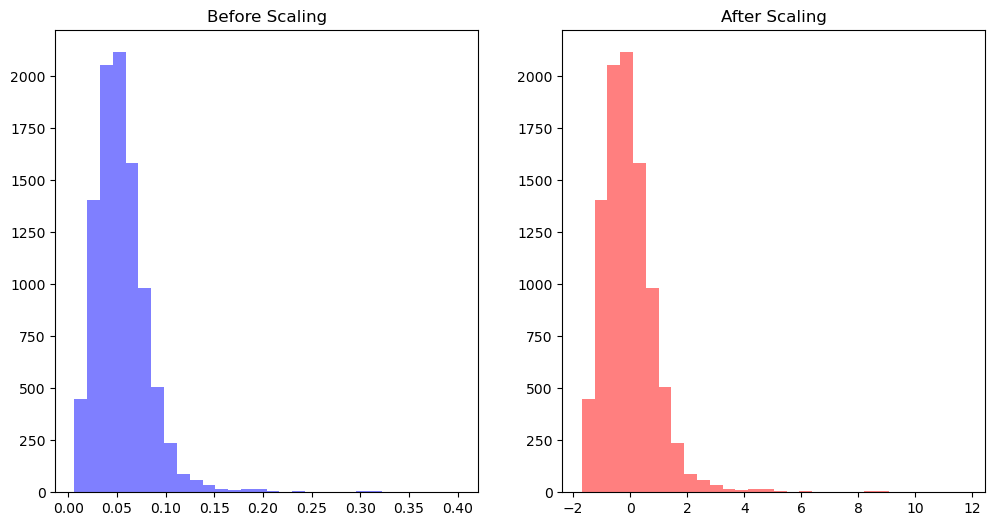

In [15]:
# standardize statistical node features
from sklearn.preprocessing import StandardScaler

# Concatenate all x values before scaling for the first feature, as a sanity check for standardization
x_before = np.concatenate([data.x.numpy()[:, 0] for data in X_train + X_val + X_test])

scaler = StandardScaler()
scaler.fit(np.vstack([data.x.numpy() for data in X_train + X_val]))


# Transform the x values of the data in X_train
for data in X_train:
    data.x = torch.from_numpy(scaler.transform(data.x.numpy()))

# Transform the x values of the data in X_val
for data in X_val:
    data.x = torch.from_numpy(scaler.transform(data.x.numpy()))

# Transform the x values of the data in X_test
for data in X_test:
    data.x = torch.from_numpy(scaler.transform(data.x.numpy()))

# Concatenate all x values after scaling for the first feature, as a sanity check for standardization
x_after = np.concatenate([data.x.numpy()[:, 0] for data in X_train + X_val + X_test])

# Plot the distribution of the first x feature before and after scaling as a sanity check
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.hist(x_before, bins=30, color='b', alpha=0.5)
plt.title('Before Scaling')

plt.subplot(1, 2, 2)
plt.hist(x_after, bins=30, color='r', alpha=0.5)
plt.title('After Scaling')

plt.show()

### Model: graphLambda without edge_attr

In [16]:
import optuna
from optuna.integration import PyTorchLightningPruningCallback
from lightning.pytorch import Trainer
from lightning.pytorch.callbacks import RichProgressBar
import logging
import warnings

warnings.filterwarnings("ignore", ".*Consider increasing the value of the `num_workers` argument*")
warnings.filterwarnings("ignore", "Trying to infer the `batch_size` from an ambiguous collection.*")
torch.set_float32_matmul_precision('high')
logging.getLogger("lightning.pytorch.utilities.rank_zero").setLevel(logging.WARNING)
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

def objective(trial):
    # Suggest values for the hyperparameters
    learning_rate = trial.suggest_float('learning_rate', 1e-5, 1e-1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    batch_size = trial.suggest_categorical('batch_size', [48, 96, 192, 348, 768])
    fc_layers = trial.suggest_int('fc_layers', 1, 8)
    # fc_layers = 1
    dropout = trial.suggest_float('dropout', 0, 0.8)
    hyperparameters = dict(learning_rate=learning_rate, optimizer_name=optimizer_name, batch_size=batch_size, fc_layers=fc_layers, dropout=dropout)
    print(f'Tested parameters: {hyperparameters}')
    n_epochs = batch_size * 4 # vary training epochs based on batch size

    # Create the model
    model = graphLambda_wo_edge_attr(learning_rate=learning_rate, optimizer_name=optimizer_name, fc_layers=fc_layers, dropout=dropout)

    

    # Create the PyTorch Lightning trainer
    trainer = Trainer(
        accelerator='gpu',
        devices=1,
        max_epochs=n_epochs,
        callbacks=[PyTorchLightningPruningCallback(trial, monitor="val_f1")],
        enable_progress_bar=False,
        enable_model_summary=False,
        logger=True,
        enable_checkpointing=False
    )

    # Define the data loaders
    train_loader = DataLoader(X_train, batch_size=batch_size, shuffle=True,
                              drop_last=True) # , num_workers=0, persistent_workers=True
    val_loader = DataLoader(X_val, batch_size=len(X_val), shuffle=False,
                            drop_last=True) # , num_workers=0, persistent_workers=True

    # Log the hyperparameters
    trainer.logger.log_hyperparams(hyperparameters)

    # Train the model
    trainer.fit(model, train_loader, val_loader)

    print(f'{trainer.callback_metrics = }')
    # Evaluate the model
    val_f1 = trainer.callback_metrics["val_f1"].item()

    return val_f1

study = optuna.create_study(direction='maximize', pruner=optuna.pruners.ThresholdPruner(lower=0.35, n_warmup_steps=200))
study.optimize(objective, n_trials=100)

print("Best trial:")
trial = study.best_trial

print("  Value: {}".format(trial.value))

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

df = study.trials_dataframe()
df.to_pickle('ec_ADHD_results_wo_edge_attrs_trials.pkl')

[I 2024-06-10 10:55:38,206] A new study created in memory with name: no-name-e3c4f139-b819-4d61-9bb6-8ac5739a7dc2


Tested parameters: {'learning_rate': 0.0033105840958984846, 'optimizer_name': 'RMSprop', 'batch_size': 96, 'fc_layers': 4, 'dropout': 0.7287809445109559}


/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/logger_connector/logger_connector.py:75: Starting from v1.9.0, `tensorboardX` has been removed as a dependency of the `lightning.pytorch` package, due to potential conflicts with other packages in the ML ecosystem. For this reason, `logger=True` will use `CSVLogger` as the default logger, unless the `tensorboard` or `tensorboardX` packages are found. Please `pip install lightning[extra]` or one of them to enable TensorBoard support by default
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (8) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
[I 2024-06-10 10:56:13,463] Trial 0 pruned. Trial was pruned at epoch 200.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch

Tested parameters: {'learning_rate': 0.0023459573302028244, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.21528437047084614}


[I 2024-06-10 10:59:20,769] Trial 1 finished with value: 0.7331516742706299 and parameters: {'learning_rate': 0.0023459573302028244, 'optimizer': 'Adam', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.21528437047084614}. Best is trial 1 with value: 0.7331516742706299.


trainer.callback_metrics = {'train_loss': tensor(0.1913), 'train_loss_step': tensor(0.1913), 'train_f1': tensor(0.8757), 'train_f1_step': tensor(0.8757), 'val_loss': tensor(12.3393), 'val_f1': tensor(0.7332), 'train_loss_epoch': tensor(0.1913), 'train_f1_epoch': tensor(0.8757)}
Tested parameters: {'learning_rate': 3.065440938314082e-05, 'optimizer_name': 'RMSprop', 'batch_size': 96, 'fc_layers': 2, 'dropout': 0.7573615927783623}


[I 2024-06-10 11:00:18,681] Trial 2 finished with value: 0.6015625 and parameters: {'learning_rate': 3.065440938314082e-05, 'optimizer': 'RMSprop', 'batch_size': 96, 'fc_layers': 2, 'dropout': 0.7573615927783623}. Best is trial 1 with value: 0.7331516742706299.


trainer.callback_metrics = {'train_loss': tensor(0.6445), 'train_loss_step': tensor(0.6547), 'train_f1': tensor(0.4034), 'train_f1_step': tensor(0.3992), 'val_loss': tensor(0.4247), 'val_f1': tensor(0.6016), 'train_loss_epoch': tensor(0.6445), 'train_f1_epoch': tensor(0.4034)}
Tested parameters: {'learning_rate': 0.004100504008341353, 'optimizer_name': 'SGD', 'batch_size': 96, 'fc_layers': 3, 'dropout': 0.7679908159063656}


[I 2024-06-10 11:00:49,608] Trial 3 pruned. Trial was pruned at epoch 200.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (2) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Tested parameters: {'learning_rate': 1.2024065788543487e-05, 'optimizer_name': 'Adam', 'batch_size': 348, 'fc_layers': 1, 'dropout': 0.38288538926105753}


[I 2024-06-10 11:02:24,527] Trial 4 finished with value: 0.6926999688148499 and parameters: {'learning_rate': 1.2024065788543487e-05, 'optimizer': 'Adam', 'batch_size': 348, 'fc_layers': 1, 'dropout': 0.38288538926105753}. Best is trial 1 with value: 0.7331516742706299.


trainer.callback_metrics = {'train_loss': tensor(0.3177), 'train_loss_step': tensor(0.3141), 'train_f1': tensor(0.7621), 'train_f1_step': tensor(0.7637), 'val_loss': tensor(1.0546), 'val_f1': tensor(0.6927), 'train_loss_epoch': tensor(0.3177), 'train_f1_epoch': tensor(0.7621)}
Tested parameters: {'learning_rate': 0.004160264686686978, 'optimizer_name': 'RMSprop', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.7034520190075909}


[I 2024-06-10 11:02:36,423] Trial 5 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 1.0295812876202263e-05, 'optimizer_name': 'SGD', 'batch_size': 96, 'fc_layers': 5, 'dropout': 0.13030442365480352}


[I 2024-06-10 11:03:36,463] Trial 6 finished with value: 0.5208711624145508 and parameters: {'learning_rate': 1.0295812876202263e-05, 'optimizer': 'SGD', 'batch_size': 96, 'fc_layers': 5, 'dropout': 0.13030442365480352}. Best is trial 1 with value: 0.7331516742706299.


trainer.callback_metrics = {'train_loss': tensor(0.6913), 'train_loss_step': tensor(0.6890), 'train_f1': tensor(0.5055), 'train_f1_step': tensor(0.5136), 'val_loss': tensor(0.6927), 'val_f1': tensor(0.5209), 'train_loss_epoch': tensor(0.6913), 'train_f1_epoch': tensor(0.5055)}
Tested parameters: {'learning_rate': 0.04081970420588455, 'optimizer_name': 'Adam', 'batch_size': 96, 'fc_layers': 2, 'dropout': 0.33982490346640193}


[I 2024-06-10 11:04:06,963] Trial 7 pruned. Trial was pruned at epoch 200.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (16) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Tested parameters: {'learning_rate': 6.68700375570481e-05, 'optimizer_name': 'RMSprop', 'batch_size': 48, 'fc_layers': 4, 'dropout': 0.3488381894304191}


[I 2024-06-10 11:05:02,222] Trial 8 finished with value: 0.648898720741272 and parameters: {'learning_rate': 6.68700375570481e-05, 'optimizer': 'RMSprop', 'batch_size': 48, 'fc_layers': 4, 'dropout': 0.3488381894304191}. Best is trial 1 with value: 0.7331516742706299.


trainer.callback_metrics = {'train_loss': tensor(0.2419), 'train_loss_step': tensor(0.2318), 'train_f1': tensor(0.8301), 'train_f1_step': tensor(0.8730), 'val_loss': tensor(1.5989), 'val_f1': tensor(0.6489), 'train_loss_epoch': tensor(0.2419), 'train_f1_epoch': tensor(0.8301)}
Tested parameters: {'learning_rate': 0.0010348476768834768, 'optimizer_name': 'RMSprop', 'batch_size': 96, 'fc_layers': 7, 'dropout': 0.015432448966012391}


[I 2024-06-10 11:05:33,942] Trial 9 pruned. Trial was pruned at epoch 200.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (4) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Tested parameters: {'learning_rate': 0.07592305402145984, 'optimizer_name': 'Adam', 'batch_size': 192, 'fc_layers': 7, 'dropout': 0.1940181823866608}


[I 2024-06-10 11:05:53,696] Trial 10 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.00022596833061763123, 'optimizer_name': 'Adam', 'batch_size': 348, 'fc_layers': 1, 'dropout': 0.5071945090213066}


[I 2024-06-10 11:07:27,602] Trial 11 finished with value: 0.718719482421875 and parameters: {'learning_rate': 0.00022596833061763123, 'optimizer': 'Adam', 'batch_size': 348, 'fc_layers': 1, 'dropout': 0.5071945090213066}. Best is trial 1 with value: 0.7331516742706299.


trainer.callback_metrics = {'train_loss': tensor(0.3516), 'train_loss_step': tensor(0.3545), 'train_f1': tensor(0.7262), 'train_f1_step': tensor(0.7313), 'val_loss': tensor(2.0383), 'val_f1': tensor(0.7187), 'train_loss_epoch': tensor(0.3516), 'train_f1_epoch': tensor(0.7262)}
Tested parameters: {'learning_rate': 0.00019083157192361356, 'optimizer_name': 'Adam', 'batch_size': 348, 'fc_layers': 6, 'dropout': 0.5796757890734872}


[I 2024-06-10 11:07:41,770] Trial 12 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.0003458335542591292, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.585153675113505}


[I 2024-06-10 11:10:44,108] Trial 13 finished with value: 0.718719482421875 and parameters: {'learning_rate': 0.0003458335542591292, 'optimizer': 'Adam', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.585153675113505}. Best is trial 1 with value: 0.7331516742706299.


trainer.callback_metrics = {'train_loss': tensor(0.4305), 'train_loss_step': tensor(0.4305), 'train_f1': tensor(0.6537), 'train_f1_step': tensor(0.6537), 'val_loss': tensor(1.0973), 'val_f1': tensor(0.7187), 'train_loss_epoch': tensor(0.4305), 'train_f1_epoch': tensor(0.6537)}
Tested parameters: {'learning_rate': 0.000884450500665662, 'optimizer_name': 'Adam', 'batch_size': 348, 'fc_layers': 8, 'dropout': 0.519690579379245}


[I 2024-06-10 11:12:22,022] Trial 14 finished with value: 0.7078261375427246 and parameters: {'learning_rate': 0.000884450500665662, 'optimizer': 'Adam', 'batch_size': 348, 'fc_layers': 8, 'dropout': 0.519690579379245}. Best is trial 1 with value: 0.7331516742706299.


trainer.callback_metrics = {'train_loss': tensor(0.3436), 'train_loss_step': tensor(0.3386), 'train_f1': tensor(0.7487), 'train_f1_step': tensor(0.7625), 'val_loss': tensor(9.3733), 'val_f1': tensor(0.7078), 'train_loss_epoch': tensor(0.3436), 'train_f1_epoch': tensor(0.7487)}
Tested parameters: {'learning_rate': 0.017339524825088902, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.21781797982070544}


[I 2024-06-10 11:12:34,085] Trial 15 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.00013545675224768675, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 3, 'dropout': 0.4801345772915163}


[I 2024-06-10 11:12:52,589] Trial 16 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.0009423360658208673, 'optimizer_name': 'Adam', 'batch_size': 48, 'fc_layers': 2, 'dropout': 0.27695532414577045}


[I 2024-06-10 11:13:43,690] Trial 17 finished with value: 0.6963019371032715 and parameters: {'learning_rate': 0.0009423360658208673, 'optimizer': 'Adam', 'batch_size': 48, 'fc_layers': 2, 'dropout': 0.27695532414577045}. Best is trial 1 with value: 0.7331516742706299.


trainer.callback_metrics = {'train_loss': tensor(0.4043), 'train_loss_step': tensor(0.3624), 'train_f1': tensor(0.7170), 'train_f1_step': tensor(0.7581), 'val_loss': tensor(0.8008), 'val_f1': tensor(0.6963), 'train_loss_epoch': tensor(0.4043), 'train_f1_epoch': tensor(0.7170)}
Tested parameters: {'learning_rate': 0.013996222292041952, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 6, 'dropout': 0.04954894736385784}


[I 2024-06-10 11:13:55,630] Trial 18 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.0004224422306039187, 'optimizer_name': 'Adam', 'batch_size': 348, 'fc_layers': 1, 'dropout': 0.4459453107945409}


[I 2024-06-10 11:15:28,482] Trial 19 finished with value: 0.7235909104347229 and parameters: {'learning_rate': 0.0004224422306039187, 'optimizer': 'Adam', 'batch_size': 348, 'fc_layers': 1, 'dropout': 0.4459453107945409}. Best is trial 1 with value: 0.7331516742706299.


trainer.callback_metrics = {'train_loss': tensor(0.3217), 'train_loss_step': tensor(0.3147), 'train_f1': tensor(0.7670), 'train_f1_step': tensor(0.7767), 'val_loss': tensor(1.9224), 'val_f1': tensor(0.7236), 'train_loss_epoch': tensor(0.3217), 'train_f1_epoch': tensor(0.7670)}
Tested parameters: {'learning_rate': 0.0023447909140871573, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.11397125061229715}


[I 2024-06-10 11:18:34,033] Trial 20 finished with value: 0.6873643398284912 and parameters: {'learning_rate': 0.0023447909140871573, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.11397125061229715}. Best is trial 1 with value: 0.7331516742706299.


trainer.callback_metrics = {'train_loss': tensor(0.0734), 'train_loss_step': tensor(0.0734), 'train_f1': tensor(0.9491), 'train_f1_step': tensor(0.9491), 'val_loss': tensor(1.4643), 'val_f1': tensor(0.6874), 'train_loss_epoch': tensor(0.0734), 'train_f1_epoch': tensor(0.9491)}
Tested parameters: {'learning_rate': 0.00034128619869769355, 'optimizer_name': 'Adam', 'batch_size': 348, 'fc_layers': 1, 'dropout': 0.43568867957175694}


[I 2024-06-10 11:20:10,387] Trial 21 finished with value: 0.6613755822181702 and parameters: {'learning_rate': 0.00034128619869769355, 'optimizer': 'Adam', 'batch_size': 348, 'fc_layers': 1, 'dropout': 0.43568867957175694}. Best is trial 1 with value: 0.7331516742706299.


trainer.callback_metrics = {'train_loss': tensor(0.2928), 'train_loss_step': tensor(0.3287), 'train_f1': tensor(0.7843), 'train_f1_step': tensor(0.7579), 'val_loss': tensor(2.1765), 'val_f1': tensor(0.6614), 'train_loss_epoch': tensor(0.2928), 'train_f1_epoch': tensor(0.7843)}
Tested parameters: {'learning_rate': 0.0003879939362704253, 'optimizer_name': 'Adam', 'batch_size': 348, 'fc_layers': 2, 'dropout': 0.6015584727578783}


[I 2024-06-10 11:21:48,996] Trial 22 finished with value: 0.6818687915802002 and parameters: {'learning_rate': 0.0003879939362704253, 'optimizer': 'Adam', 'batch_size': 348, 'fc_layers': 2, 'dropout': 0.6015584727578783}. Best is trial 1 with value: 0.7331516742706299.


trainer.callback_metrics = {'train_loss': tensor(0.4437), 'train_loss_step': tensor(0.4291), 'train_f1': tensor(0.6481), 'train_f1_step': tensor(0.7024), 'val_loss': tensor(2.5328), 'val_f1': tensor(0.6819), 'train_loss_epoch': tensor(0.4437), 'train_f1_epoch': tensor(0.6481)}
Tested parameters: {'learning_rate': 7.950695435184319e-05, 'optimizer_name': 'Adam', 'batch_size': 348, 'fc_layers': 1, 'dropout': 0.2859901185852744}


[I 2024-06-10 11:23:21,931] Trial 23 finished with value: 0.7024712562561035 and parameters: {'learning_rate': 7.950695435184319e-05, 'optimizer': 'Adam', 'batch_size': 348, 'fc_layers': 1, 'dropout': 0.2859901185852744}. Best is trial 1 with value: 0.7331516742706299.


trainer.callback_metrics = {'train_loss': tensor(0.2191), 'train_loss_step': tensor(0.2172), 'train_f1': tensor(0.8430), 'train_f1_step': tensor(0.8326), 'val_loss': tensor(1.3282), 'val_f1': tensor(0.7025), 'train_loss_epoch': tensor(0.2191), 'train_f1_epoch': tensor(0.8430)}
Tested parameters: {'learning_rate': 0.001440726232951521, 'optimizer_name': 'Adam', 'batch_size': 348, 'fc_layers': 3, 'dropout': 0.4488492259826501}


[I 2024-06-10 11:23:35,406] Trial 24 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.0004153472084047849, 'optimizer_name': 'Adam', 'batch_size': 348, 'fc_layers': 2, 'dropout': 0.5223861369062023}


[I 2024-06-10 11:25:09,210] Trial 25 finished with value: 0.7760355472564697 and parameters: {'learning_rate': 0.0004153472084047849, 'optimizer': 'Adam', 'batch_size': 348, 'fc_layers': 2, 'dropout': 0.5223861369062023}. Best is trial 25 with value: 0.7760355472564697.


trainer.callback_metrics = {'train_loss': tensor(0.3845), 'train_loss_step': tensor(0.3868), 'train_f1': tensor(0.7026), 'train_f1_step': tensor(0.6888), 'val_loss': tensor(3.1560), 'val_f1': tensor(0.7760), 'train_loss_epoch': tensor(0.3845), 'train_f1_epoch': tensor(0.7026)}
Tested parameters: {'learning_rate': 0.011145528413284183, 'optimizer_name': 'Adam', 'batch_size': 48, 'fc_layers': 2, 'dropout': 0.6662404871711188}


[I 2024-06-10 11:26:00,769] Trial 26 finished with value: 0.3333333432674408 and parameters: {'learning_rate': 0.011145528413284183, 'optimizer': 'Adam', 'batch_size': 48, 'fc_layers': 2, 'dropout': 0.6662404871711188}. Best is trial 25 with value: 0.7760355472564697.


trainer.callback_metrics = {'train_loss': tensor(0.6931), 'train_loss_step': tensor(0.6931), 'train_f1': tensor(0.3324), 'train_f1_step': tensor(0.3333), 'val_loss': tensor(0.6931), 'val_f1': tensor(0.3333), 'train_loss_epoch': tensor(0.6931), 'train_f1_epoch': tensor(0.3324)}
Tested parameters: {'learning_rate': 0.0005419015154547823, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.3904422894887509}


[I 2024-06-10 11:29:05,438] Trial 27 finished with value: 0.7393287420272827 and parameters: {'learning_rate': 0.0005419015154547823, 'optimizer': 'Adam', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.3904422894887509}. Best is trial 25 with value: 0.7760355472564697.


trainer.callback_metrics = {'train_loss': tensor(0.2843), 'train_loss_step': tensor(0.2843), 'train_f1': tensor(0.7969), 'train_f1_step': tensor(0.7969), 'val_loss': tensor(2.6615), 'val_f1': tensor(0.7393), 'train_loss_epoch': tensor(0.2843), 'train_f1_epoch': tensor(0.7969)}
Tested parameters: {'learning_rate': 0.008203793090922267, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.2907950343780558}


[I 2024-06-10 11:32:10,795] Trial 28 finished with value: 0.7497556209564209 and parameters: {'learning_rate': 0.008203793090922267, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.2907950343780558}. Best is trial 25 with value: 0.7760355472564697.


trainer.callback_metrics = {'train_loss': tensor(0.2060), 'train_loss_step': tensor(0.2060), 'train_f1': tensor(0.8398), 'train_f1_step': tensor(0.8398), 'val_loss': tensor(1.0861), 'val_f1': tensor(0.7498), 'train_loss_epoch': tensor(0.2060), 'train_f1_epoch': tensor(0.8398)}
Tested parameters: {'learning_rate': 0.007830482417961724, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.31295567405421587}


[I 2024-06-10 11:32:23,122] Trial 29 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.03866846956892405, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.3895191335143344}


[I 2024-06-10 11:35:25,586] Trial 30 finished with value: 0.7239508628845215 and parameters: {'learning_rate': 0.03866846956892405, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.3895191335143344}. Best is trial 25 with value: 0.7760355472564697.


trainer.callback_metrics = {'train_loss': tensor(0.2699), 'train_loss_step': tensor(0.2699), 'train_f1': tensor(0.8028), 'train_f1_step': tensor(0.8028), 'val_loss': tensor(1.6061), 'val_f1': tensor(0.7240), 'train_loss_epoch': tensor(0.2699), 'train_f1_epoch': tensor(0.8028)}
Tested parameters: {'learning_rate': 0.0018939971182130796, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.20395285336051902}


[I 2024-06-10 11:38:33,985] Trial 31 finished with value: 0.7027298808097839 and parameters: {'learning_rate': 0.0018939971182130796, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.20395285336051902}. Best is trial 25 with value: 0.7760355472564697.


trainer.callback_metrics = {'train_loss': tensor(0.1516), 'train_loss_step': tensor(0.1516), 'train_f1': tensor(0.8935), 'train_f1_step': tensor(0.8935), 'val_loss': tensor(1.0192), 'val_f1': tensor(0.7027), 'train_loss_epoch': tensor(0.1516), 'train_f1_epoch': tensor(0.8935)}
Tested parameters: {'learning_rate': 0.0006132551477614863, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.2701566995597385}


[I 2024-06-10 11:41:39,575] Trial 32 finished with value: 0.7083016633987427 and parameters: {'learning_rate': 0.0006132551477614863, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.2701566995597385}. Best is trial 25 with value: 0.7760355472564697.


trainer.callback_metrics = {'train_loss': tensor(0.3875), 'train_loss_step': tensor(0.3875), 'train_f1': tensor(0.7805), 'train_f1_step': tensor(0.7805), 'val_loss': tensor(0.4902), 'val_f1': tensor(0.7083), 'train_loss_epoch': tensor(0.3875), 'train_f1_epoch': tensor(0.7805)}
Tested parameters: {'learning_rate': 0.0053263217028584825, 'optimizer_name': 'RMSprop', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.16394060234996}


[I 2024-06-10 11:41:51,556] Trial 33 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.003163126655294327, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 3, 'dropout': 0.2560609241093065}


[I 2024-06-10 11:43:05,167] Trial 34 finished with value: 0.6822830438613892 and parameters: {'learning_rate': 0.003163126655294327, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 3, 'dropout': 0.2560609241093065}. Best is trial 25 with value: 0.7760355472564697.


trainer.callback_metrics = {'train_loss': tensor(0.1646), 'train_loss_step': tensor(0.1498), 'train_f1': tensor(0.8831), 'train_f1_step': tensor(0.9048), 'val_loss': tensor(1.2086), 'val_f1': tensor(0.6823), 'train_loss_epoch': tensor(0.1646), 'train_f1_epoch': tensor(0.8831)}
Tested parameters: {'learning_rate': 0.0018188953286832172, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.3641462293938968}


[I 2024-06-10 11:43:17,966] Trial 35 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.006039897669906674, 'optimizer_name': 'RMSprop', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.5394907560339826}


[I 2024-06-10 11:43:31,768] Trial 36 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 3.484739584603883e-05, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 2, 'dropout': 0.6521588356884208}


[I 2024-06-10 11:43:57,142] Trial 37 pruned. Trial was pruned at epoch 427.


Tested parameters: {'learning_rate': 0.003325478709541994, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.4070979728053821}


[I 2024-06-10 11:44:09,510] Trial 38 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.02628290592668474, 'optimizer_name': 'RMSprop', 'batch_size': 96, 'fc_layers': 3, 'dropout': 0.09270765268498649}


[I 2024-06-10 11:44:39,628] Trial 39 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.0006007603137973753, 'optimizer_name': 'Adam', 'batch_size': 48, 'fc_layers': 5, 'dropout': 0.7930860692724778}


[I 2024-06-10 11:45:32,415] Trial 40 finished with value: 0.3333333432674408 and parameters: {'learning_rate': 0.0006007603137973753, 'optimizer': 'Adam', 'batch_size': 48, 'fc_layers': 5, 'dropout': 0.7930860692724778}. Best is trial 25 with value: 0.7760355472564697.


trainer.callback_metrics = {'train_loss': tensor(0.6931), 'train_loss_step': tensor(0.6931), 'train_f1': tensor(0.3328), 'train_f1_step': tensor(0.3514), 'val_loss': tensor(0.6931), 'val_f1': tensor(0.3333), 'train_loss_epoch': tensor(0.6931), 'train_f1_epoch': tensor(0.3328)}
Tested parameters: {'learning_rate': 0.09200688495783567, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.3949470494710291}


[I 2024-06-10 11:48:35,217] Trial 41 finished with value: 0.7343101501464844 and parameters: {'learning_rate': 0.09200688495783567, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.3949470494710291}. Best is trial 25 with value: 0.7760355472564697.


trainer.callback_metrics = {'train_loss': tensor(0.2699), 'train_loss_step': tensor(0.2699), 'train_f1': tensor(0.7984), 'train_f1_step': tensor(0.7984), 'val_loss': tensor(1.7352), 'val_f1': tensor(0.7343), 'train_loss_epoch': tensor(0.2699), 'train_f1_epoch': tensor(0.7984)}
Tested parameters: {'learning_rate': 0.07092018484077524, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 2, 'dropout': 0.3171168275401031}


[I 2024-06-10 11:48:47,309] Trial 42 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.0011727638715962674, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.41016859101739067}


[I 2024-06-10 11:51:56,302] Trial 43 finished with value: 0.7075400352478027 and parameters: {'learning_rate': 0.0011727638715962674, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.41016859101739067}. Best is trial 25 with value: 0.7760355472564697.


trainer.callback_metrics = {'train_loss': tensor(0.3312), 'train_loss_step': tensor(0.3312), 'train_f1': tensor(0.7659), 'train_f1_step': tensor(0.7659), 'val_loss': tensor(0.6125), 'val_f1': tensor(0.7075), 'train_loss_epoch': tensor(0.3312), 'train_f1_epoch': tensor(0.7659)}
Tested parameters: {'learning_rate': 0.00011389521504349418, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.23471206490680993}


[I 2024-06-10 11:53:08,333] Trial 44 finished with value: 0.729793906211853 and parameters: {'learning_rate': 0.00011389521504349418, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.23471206490680993}. Best is trial 25 with value: 0.7760355472564697.


trainer.callback_metrics = {'train_loss': tensor(0.6434), 'train_loss_step': tensor(0.6359), 'train_f1': tensor(0.5757), 'train_f1_step': tensor(0.5959), 'val_loss': tensor(0.5930), 'val_f1': tensor(0.7298), 'train_loss_epoch': tensor(0.6434), 'train_f1_epoch': tensor(0.5757)}
Tested parameters: {'learning_rate': 0.08520410630778989, 'optimizer_name': 'SGD', 'batch_size': 96, 'fc_layers': 3, 'dropout': 0.33314219758000574}


[I 2024-06-10 11:54:05,155] Trial 45 finished with value: 0.6920316219329834 and parameters: {'learning_rate': 0.08520410630778989, 'optimizer': 'SGD', 'batch_size': 96, 'fc_layers': 3, 'dropout': 0.33314219758000574}. Best is trial 25 with value: 0.7760355472564697.


trainer.callback_metrics = {'train_loss': tensor(0.2448), 'train_loss_step': tensor(0.2816), 'train_f1': tensor(0.8146), 'train_f1_step': tensor(0.7287), 'val_loss': tensor(1.2854), 'val_f1': tensor(0.6920), 'train_loss_epoch': tensor(0.2448), 'train_f1_epoch': tensor(0.8146)}
Tested parameters: {'learning_rate': 0.0006261258421827287, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 2, 'dropout': 0.36382800474934796}


[I 2024-06-10 11:57:09,679] Trial 46 finished with value: 0.6803406476974487 and parameters: {'learning_rate': 0.0006261258421827287, 'optimizer': 'Adam', 'batch_size': 768, 'fc_layers': 2, 'dropout': 0.36382800474934796}. Best is trial 25 with value: 0.7760355472564697.


trainer.callback_metrics = {'train_loss': tensor(0.2518), 'train_loss_step': tensor(0.2518), 'train_f1': tensor(0.8042), 'train_f1_step': tensor(0.8042), 'val_loss': tensor(5.8759), 'val_f1': tensor(0.6803), 'train_loss_epoch': tensor(0.2518), 'train_f1_epoch': tensor(0.8042)}
Tested parameters: {'learning_rate': 0.0002203385623618043, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.15874457753973745}


[I 2024-06-10 12:00:15,442] Trial 47 finished with value: 0.7758896350860596 and parameters: {'learning_rate': 0.0002203385623618043, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.15874457753973745}. Best is trial 25 with value: 0.7760355472564697.


trainer.callback_metrics = {'train_loss': tensor(0.5245), 'train_loss_step': tensor(0.5245), 'train_f1': tensor(0.7184), 'train_f1_step': tensor(0.7184), 'val_loss': tensor(0.4527), 'val_f1': tensor(0.7759), 'train_loss_epoch': tensor(0.5245), 'train_f1_epoch': tensor(0.7184)}
Tested parameters: {'learning_rate': 0.00023096130394328727, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.16864910197113653}


[I 2024-06-10 12:03:26,876] Trial 48 finished with value: 0.7864525318145752 and parameters: {'learning_rate': 0.00023096130394328727, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.16864910197113653}. Best is trial 48 with value: 0.7864525318145752.


trainer.callback_metrics = {'train_loss': tensor(0.5443), 'train_loss_step': tensor(0.5443), 'train_f1': tensor(0.6911), 'train_f1_step': tensor(0.6911), 'val_loss': tensor(0.4610), 'val_f1': tensor(0.7865), 'train_loss_epoch': tensor(0.5443), 'train_f1_epoch': tensor(0.6911)}
Tested parameters: {'learning_rate': 0.00022084230612265474, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 6, 'dropout': 0.1455841312069786}


[I 2024-06-10 12:03:38,811] Trial 49 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 5.779219157133609e-05, 'optimizer_name': 'SGD', 'batch_size': 48, 'fc_layers': 5, 'dropout': 0.0707776363405042}


[I 2024-06-10 12:04:30,932] Trial 50 finished with value: 0.6419482231140137 and parameters: {'learning_rate': 5.779219157133609e-05, 'optimizer': 'SGD', 'batch_size': 48, 'fc_layers': 5, 'dropout': 0.0707776363405042}. Best is trial 48 with value: 0.7864525318145752.


trainer.callback_metrics = {'train_loss': tensor(0.6891), 'train_loss_step': tensor(0.6825), 'train_f1': tensor(0.5292), 'train_f1_step': tensor(0.5206), 'val_loss': tensor(0.6824), 'val_f1': tensor(0.6419), 'train_loss_epoch': tensor(0.6891), 'train_f1_epoch': tensor(0.5292)}
Tested parameters: {'learning_rate': 0.00016001941129549895, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.15883217451655318}


[I 2024-06-10 12:07:34,729] Trial 51 finished with value: 0.7493199706077576 and parameters: {'learning_rate': 0.00016001941129549895, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.15883217451655318}. Best is trial 48 with value: 0.7864525318145752.


trainer.callback_metrics = {'train_loss': tensor(0.5877), 'train_loss_step': tensor(0.5877), 'train_f1': tensor(0.6558), 'train_f1_step': tensor(0.6558), 'val_loss': tensor(0.5057), 'val_f1': tensor(0.7493), 'train_loss_epoch': tensor(0.5877), 'train_f1_epoch': tensor(0.6558)}
Tested parameters: {'learning_rate': 0.00015486197940133142, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.0015063594533253066}


[I 2024-06-10 12:10:39,200] Trial 52 finished with value: 0.7760355472564697 and parameters: {'learning_rate': 0.00015486197940133142, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.0015063594533253066}. Best is trial 48 with value: 0.7864525318145752.


trainer.callback_metrics = {'train_loss': tensor(0.4628), 'train_loss_step': tensor(0.4628), 'train_f1': tensor(0.8229), 'train_f1_step': tensor(0.8229), 'val_loss': tensor(0.4560), 'val_f1': tensor(0.7760), 'train_loss_epoch': tensor(0.4628), 'train_f1_epoch': tensor(0.8229)}
Tested parameters: {'learning_rate': 0.00013567056374824948, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.0008969186049393544}


[I 2024-06-10 12:13:46,616] Trial 53 finished with value: 0.7235909104347229 and parameters: {'learning_rate': 0.00013567056374824948, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.0008969186049393544}. Best is trial 48 with value: 0.7864525318145752.


trainer.callback_metrics = {'train_loss': tensor(0.4708), 'train_loss_step': tensor(0.4708), 'train_f1': tensor(0.8124), 'train_f1_step': tensor(0.8124), 'val_loss': tensor(0.4854), 'val_f1': tensor(0.7236), 'train_loss_epoch': tensor(0.4708), 'train_f1_epoch': tensor(0.8124)}
Tested parameters: {'learning_rate': 1.6422993981893877e-05, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.17292787647955418}


[I 2024-06-10 12:16:59,915] Trial 54 finished with value: 0.6390470862388611 and parameters: {'learning_rate': 1.6422993981893877e-05, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.17292787647955418}. Best is trial 48 with value: 0.7864525318145752.


trainer.callback_metrics = {'train_loss': tensor(0.6851), 'train_loss_step': tensor(0.6851), 'train_f1': tensor(0.5054), 'train_f1_step': tensor(0.5054), 'val_loss': tensor(0.6700), 'val_f1': tensor(0.6390), 'train_loss_epoch': tensor(0.6851), 'train_f1_epoch': tensor(0.5054)}
Tested parameters: {'learning_rate': 0.0002664832777019168, 'optimizer_name': 'SGD', 'batch_size': 348, 'fc_layers': 5, 'dropout': 0.05437849939011389}


[I 2024-06-10 12:18:34,309] Trial 55 finished with value: 0.406593382358551 and parameters: {'learning_rate': 0.0002664832777019168, 'optimizer': 'SGD', 'batch_size': 348, 'fc_layers': 5, 'dropout': 0.05437849939011389}. Best is trial 48 with value: 0.7864525318145752.


trainer.callback_metrics = {'train_loss': tensor(0.6433), 'train_loss_step': tensor(0.6416), 'train_f1': tensor(0.4175), 'train_f1_step': tensor(0.4265), 'val_loss': tensor(0.6086), 'val_f1': tensor(0.4066), 'train_loss_epoch': tensor(0.6433), 'train_f1_epoch': tensor(0.4175)}
Tested parameters: {'learning_rate': 9.536796442670176e-05, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.12015693181811715}


[I 2024-06-10 12:19:50,127] Trial 56 finished with value: 0.713533878326416 and parameters: {'learning_rate': 9.536796442670176e-05, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.12015693181811715}. Best is trial 48 with value: 0.7864525318145752.


trainer.callback_metrics = {'train_loss': tensor(0.5840), 'train_loss_step': tensor(0.5875), 'train_f1': tensor(0.6871), 'train_f1_step': tensor(0.6874), 'val_loss': tensor(0.5399), 'val_f1': tensor(0.7135), 'train_loss_epoch': tensor(0.5840), 'train_f1_epoch': tensor(0.6871)}
Tested parameters: {'learning_rate': 0.00016653954333025202, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.04079448730895702}


[I 2024-06-10 12:22:56,430] Trial 57 finished with value: 0.6903488636016846 and parameters: {'learning_rate': 0.00016653954333025202, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.04079448730895702}. Best is trial 48 with value: 0.7864525318145752.


trainer.callback_metrics = {'train_loss': tensor(0.6623), 'train_loss_step': tensor(0.6623), 'train_f1': tensor(0.5800), 'train_f1_step': tensor(0.5800), 'val_loss': tensor(0.6506), 'val_f1': tensor(0.6903), 'train_loss_epoch': tensor(0.6623), 'train_f1_epoch': tensor(0.5800)}
Tested parameters: {'learning_rate': 5.1931261176528424e-05, 'optimizer_name': 'SGD', 'batch_size': 96, 'fc_layers': 6, 'dropout': 0.23102875162385697}


[I 2024-06-10 12:23:27,820] Trial 58 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.0002625097528164212, 'optimizer_name': 'SGD', 'batch_size': 348, 'fc_layers': 4, 'dropout': 0.18424359952399896}


[I 2024-06-10 12:25:04,349] Trial 59 finished with value: 0.686956524848938 and parameters: {'learning_rate': 0.0002625097528164212, 'optimizer': 'SGD', 'batch_size': 348, 'fc_layers': 4, 'dropout': 0.18424359952399896}. Best is trial 48 with value: 0.7864525318145752.


trainer.callback_metrics = {'train_loss': tensor(0.5325), 'train_loss_step': tensor(0.5258), 'train_f1': tensor(0.7091), 'train_f1_step': tensor(0.7064), 'val_loss': tensor(0.5160), 'val_f1': tensor(0.6870), 'train_loss_epoch': tensor(0.5325), 'train_f1_epoch': tensor(0.7091)}
Tested parameters: {'learning_rate': 0.00018798290194416812, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 7, 'dropout': 0.10018604182732285}


[I 2024-06-10 12:25:16,933] Trial 60 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.0004986530156649849, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.07979122095955253}


[I 2024-06-10 12:28:20,819] Trial 61 finished with value: 0.7915761470794678 and parameters: {'learning_rate': 0.0004986530156649849, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.07979122095955253}. Best is trial 61 with value: 0.7915761470794678.


trainer.callback_metrics = {'train_loss': tensor(0.2237), 'train_loss_step': tensor(0.2237), 'train_f1': tensor(0.9206), 'train_f1_step': tensor(0.9206), 'val_loss': tensor(0.4798), 'val_f1': tensor(0.7916), 'train_loss_epoch': tensor(0.2237), 'train_f1_epoch': tensor(0.9206)}
Tested parameters: {'learning_rate': 0.00032397695780444325, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.025534653950079395}


[I 2024-06-10 12:31:25,215] Trial 62 finished with value: 0.7394702434539795 and parameters: {'learning_rate': 0.00032397695780444325, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.025534653950079395}. Best is trial 61 with value: 0.7915761470794678.


trainer.callback_metrics = {'train_loss': tensor(0.2867), 'train_loss_step': tensor(0.2867), 'train_f1': tensor(0.9062), 'train_f1_step': tensor(0.9062), 'val_loss': tensor(0.4559), 'val_f1': tensor(0.7395), 'train_loss_epoch': tensor(0.2867), 'train_f1_epoch': tensor(0.9062)}
Tested parameters: {'learning_rate': 0.0008506828584071613, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.14478098378211904}


[I 2024-06-10 12:34:30,261] Trial 63 finished with value: 0.6926999688148499 and parameters: {'learning_rate': 0.0008506828584071613, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.14478098378211904}. Best is trial 61 with value: 0.7915761470794678.


trainer.callback_metrics = {'train_loss': tensor(0.2823), 'train_loss_step': tensor(0.2823), 'train_f1': tensor(0.8709), 'train_f1_step': tensor(0.8709), 'val_loss': tensor(0.5075), 'val_f1': tensor(0.6927), 'train_loss_epoch': tensor(0.2823), 'train_f1_epoch': tensor(0.8709)}
Tested parameters: {'learning_rate': 0.00016340010792145727, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.08135513323093885}


[I 2024-06-10 12:37:36,614] Trial 64 finished with value: 0.759765088558197 and parameters: {'learning_rate': 0.00016340010792145727, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.08135513323093885}. Best is trial 61 with value: 0.7915761470794678.


trainer.callback_metrics = {'train_loss': tensor(0.5153), 'train_loss_step': tensor(0.5153), 'train_f1': tensor(0.7407), 'train_f1_step': tensor(0.7407), 'val_loss': tensor(0.4860), 'val_f1': tensor(0.7598), 'train_loss_epoch': tensor(0.5153), 'train_f1_epoch': tensor(0.7407)}
Tested parameters: {'learning_rate': 0.0004196817924009701, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.09025116603707874}


[I 2024-06-10 12:37:48,872] Trial 65 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 9.01905121883852e-05, 'optimizer_name': 'RMSprop', 'batch_size': 348, 'fc_layers': 5, 'dropout': 0.06880984616429525}


[I 2024-06-10 12:39:26,297] Trial 66 finished with value: 0.7238908410072327 and parameters: {'learning_rate': 9.01905121883852e-05, 'optimizer': 'RMSprop', 'batch_size': 348, 'fc_layers': 5, 'dropout': 0.06880984616429525}. Best is trial 61 with value: 0.7915761470794678.


trainer.callback_metrics = {'train_loss': tensor(0.0538), 'train_loss_step': tensor(0.0558), 'train_f1': tensor(0.9554), 'train_f1_step': tensor(0.9538), 'val_loss': tensor(2.3247), 'val_f1': tensor(0.7239), 'train_loss_epoch': tensor(0.0538), 'train_f1_epoch': tensor(0.9554)}
Tested parameters: {'learning_rate': 4.104827123206343e-05, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.0018428141111927314}


[I 2024-06-10 12:42:31,919] Trial 67 finished with value: 0.6591845750808716 and parameters: {'learning_rate': 4.104827123206343e-05, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.0018428141111927314}. Best is trial 61 with value: 0.7915761470794678.


trainer.callback_metrics = {'train_loss': tensor(0.6474), 'train_loss_step': tensor(0.6474), 'train_f1': tensor(0.6417), 'train_f1_step': tensor(0.6417), 'val_loss': tensor(0.6510), 'val_f1': tensor(0.6592), 'train_loss_epoch': tensor(0.6474), 'train_f1_epoch': tensor(0.6417)}
Tested parameters: {'learning_rate': 0.0005092922144121646, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 8, 'dropout': 0.11859917764576167}


[I 2024-06-10 12:42:44,980] Trial 68 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.0002940947071128458, 'optimizer_name': 'SGD', 'batch_size': 48, 'fc_layers': 3, 'dropout': 0.025190601444341477}


[I 2024-06-10 12:43:38,702] Trial 69 finished with value: 0.6970950365066528 and parameters: {'learning_rate': 0.0002940947071128458, 'optimizer': 'SGD', 'batch_size': 48, 'fc_layers': 3, 'dropout': 0.025190601444341477}. Best is trial 61 with value: 0.7915761470794678.


trainer.callback_metrics = {'train_loss': tensor(0.2839), 'train_loss_step': tensor(0.3341), 'train_f1': tensor(0.8749), 'train_f1_step': tensor(0.8526), 'val_loss': tensor(0.6292), 'val_f1': tensor(0.6971), 'train_loss_epoch': tensor(0.2839), 'train_f1_epoch': tensor(0.8749)}
Tested parameters: {'learning_rate': 0.00022420236722398514, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.19819128526005636}


[I 2024-06-10 12:43:51,350] Trial 70 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.00015117023331603333, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.15948514650172146}


[I 2024-06-10 12:47:01,678] Trial 71 finished with value: 0.75 and parameters: {'learning_rate': 0.00015117023331603333, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.15948514650172146}. Best is trial 61 with value: 0.7915761470794678.


trainer.callback_metrics = {'train_loss': tensor(0.5671), 'train_loss_step': tensor(0.5671), 'train_f1': tensor(0.6804), 'train_f1_step': tensor(0.6804), 'val_loss': tensor(0.4968), 'val_f1': tensor(0.7500), 'train_loss_epoch': tensor(0.5671), 'train_f1_epoch': tensor(0.6804)}
Tested parameters: {'learning_rate': 0.00011866217646310552, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.075448651566945}


[I 2024-06-10 12:47:14,333] Trial 72 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 6.870667798643043e-05, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.13385949403344663}


[I 2024-06-10 12:50:24,476] Trial 73 finished with value: 0.7238908410072327 and parameters: {'learning_rate': 6.870667798643043e-05, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.13385949403344663}. Best is trial 61 with value: 0.7915761470794678.


trainer.callback_metrics = {'train_loss': tensor(0.6082), 'train_loss_step': tensor(0.6082), 'train_f1': tensor(0.6457), 'train_f1_step': tensor(0.6457), 'val_loss': tensor(0.5674), 'val_f1': tensor(0.7239), 'train_loss_epoch': tensor(0.6082), 'train_f1_epoch': tensor(0.6457)}
Tested parameters: {'learning_rate': 0.0004526927308751771, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.04689863429368215}


[I 2024-06-10 12:53:30,913] Trial 74 finished with value: 0.6718659996986389 and parameters: {'learning_rate': 0.0004526927308751771, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.04689863429368215}. Best is trial 61 with value: 0.7915761470794678.


trainer.callback_metrics = {'train_loss': tensor(0.0837), 'train_loss_step': tensor(0.0837), 'train_f1': tensor(0.9596), 'train_f1_step': tensor(0.9596), 'val_loss': tensor(0.7230), 'val_f1': tensor(0.6719), 'train_loss_epoch': tensor(0.0837), 'train_f1_epoch': tensor(0.9596)}
Tested parameters: {'learning_rate': 0.00015875056079909546, 'optimizer_name': 'RMSprop', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.10397613217744131}


[I 2024-06-10 12:56:44,819] Trial 75 finished with value: 0.7030525207519531 and parameters: {'learning_rate': 0.00015875056079909546, 'optimizer': 'RMSprop', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.10397613217744131}. Best is trial 61 with value: 0.7915761470794678.


trainer.callback_metrics = {'train_loss': tensor(0.0731), 'train_loss_step': tensor(0.0731), 'train_f1': tensor(0.9530), 'train_f1_step': tensor(0.9530), 'val_loss': tensor(3.0836), 'val_f1': tensor(0.7031), 'train_loss_epoch': tensor(0.0731), 'train_f1_epoch': tensor(0.9530)}
Tested parameters: {'learning_rate': 2.5895500138798898e-05, 'optimizer_name': 'SGD', 'batch_size': 348, 'fc_layers': 4, 'dropout': 0.24250493946748597}


[I 2024-06-10 12:58:22,589] Trial 76 finished with value: 0.45351046323776245 and parameters: {'learning_rate': 2.5895500138798898e-05, 'optimizer': 'SGD', 'batch_size': 348, 'fc_layers': 4, 'dropout': 0.24250493946748597}. Best is trial 61 with value: 0.7915761470794678.


trainer.callback_metrics = {'train_loss': tensor(0.6965), 'train_loss_step': tensor(0.6988), 'train_f1': tensor(0.4317), 'train_f1_step': tensor(0.4174), 'val_loss': tensor(0.6840), 'val_f1': tensor(0.4535), 'train_loss_epoch': tensor(0.6965), 'train_f1_epoch': tensor(0.4317)}
Tested parameters: {'learning_rate': 0.0008601163171599354, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 3, 'dropout': 0.29820184959349055}


[I 2024-06-10 12:59:34,850] Trial 77 finished with value: 0.6920316219329834 and parameters: {'learning_rate': 0.0008601163171599354, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 3, 'dropout': 0.29820184959349055}. Best is trial 61 with value: 0.7915761470794678.


trainer.callback_metrics = {'train_loss': tensor(0.2758), 'train_loss_step': tensor(0.3050), 'train_f1': tensor(0.8277), 'train_f1_step': tensor(0.8115), 'val_loss': tensor(0.6802), 'val_f1': tensor(0.6920), 'train_loss_epoch': tensor(0.2758), 'train_f1_epoch': tensor(0.8277)}
Tested parameters: {'learning_rate': 0.0007412554319603554, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.4806816100413684}


[I 2024-06-10 13:00:22,632] Trial 78 pruned. Trial was pruned at epoch 797.


Tested parameters: {'learning_rate': 0.00035977383995471, 'optimizer_name': 'SGD', 'batch_size': 96, 'fc_layers': 6, 'dropout': 0.2169755882664084}


[I 2024-06-10 13:00:53,265] Trial 79 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.001317117161835723, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.7206978464836307}


[I 2024-06-10 13:01:05,722] Trial 80 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.00014434563215136043, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.14600160612647164}


[I 2024-06-10 13:04:08,868] Trial 81 finished with value: 0.7341946959495544 and parameters: {'learning_rate': 0.00014434563215136043, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.14600160612647164}. Best is trial 61 with value: 0.7915761470794678.


trainer.callback_metrics = {'train_loss': tensor(0.5763), 'train_loss_step': tensor(0.5763), 'train_f1': tensor(0.6888), 'train_f1_step': tensor(0.6888), 'val_loss': tensor(0.5255), 'val_f1': tensor(0.7342), 'train_loss_epoch': tensor(0.5763), 'train_f1_epoch': tensor(0.6888)}
Tested parameters: {'learning_rate': 0.0001952071728963312, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.16535946801297496}


[I 2024-06-10 13:07:13,368] Trial 82 finished with value: 0.7550421953201294 and parameters: {'learning_rate': 0.0001952071728963312, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.16535946801297496}. Best is trial 61 with value: 0.7915761470794678.


trainer.callback_metrics = {'train_loss': tensor(0.5554), 'train_loss_step': tensor(0.5554), 'train_f1': tensor(0.6802), 'train_f1_step': tensor(0.6802), 'val_loss': tensor(0.4794), 'val_f1': tensor(0.7550), 'train_loss_epoch': tensor(0.5554), 'train_f1_epoch': tensor(0.6802)}
Tested parameters: {'learning_rate': 0.0002128396117713183, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.1852372247250248}


[I 2024-06-10 13:10:22,668] Trial 83 finished with value: 0.7235909104347229 and parameters: {'learning_rate': 0.0002128396117713183, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.1852372247250248}. Best is trial 61 with value: 0.7915761470794678.


trainer.callback_metrics = {'train_loss': tensor(0.3771), 'train_loss_step': tensor(0.3771), 'train_f1': tensor(0.7911), 'train_f1_step': tensor(0.7911), 'val_loss': tensor(0.4462), 'val_f1': tensor(0.7236), 'train_loss_epoch': tensor(0.3771), 'train_f1_epoch': tensor(0.7911)}
Tested parameters: {'learning_rate': 8.96066839487495e-05, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.08458414031357499}


[I 2024-06-10 13:10:34,862] Trial 84 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.0001113482078910519, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.25472693760621634}


[I 2024-06-10 13:13:38,605] Trial 85 finished with value: 0.7176470756530762 and parameters: {'learning_rate': 0.0001113482078910519, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.25472693760621634}. Best is trial 61 with value: 0.7915761470794678.


trainer.callback_metrics = {'train_loss': tensor(0.6806), 'train_loss_step': tensor(0.6806), 'train_f1': tensor(0.5520), 'train_f1_step': tensor(0.5520), 'val_loss': tensor(0.6488), 'val_f1': tensor(0.7176), 'train_loss_epoch': tensor(0.6806), 'train_f1_epoch': tensor(0.5520)}
Tested parameters: {'learning_rate': 0.0002780320760178971, 'optimizer_name': 'Adam', 'batch_size': 348, 'fc_layers': 4, 'dropout': 0.16577590145755833}


[I 2024-06-10 13:15:13,456] Trial 86 finished with value: 0.6707944273948669 and parameters: {'learning_rate': 0.0002780320760178971, 'optimizer': 'Adam', 'batch_size': 348, 'fc_layers': 4, 'dropout': 0.16577590145755833}. Best is trial 61 with value: 0.7915761470794678.


trainer.callback_metrics = {'train_loss': tensor(0.1115), 'train_loss_step': tensor(0.1235), 'train_f1': tensor(0.9230), 'train_f1_step': tensor(0.9236), 'val_loss': tensor(3.4504), 'val_f1': tensor(0.6708), 'train_loss_epoch': tensor(0.1115), 'train_f1_epoch': tensor(0.9230)}
Tested parameters: {'learning_rate': 0.00036670331906483696, 'optimizer_name': 'RMSprop', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.1313705627386253}


[I 2024-06-10 13:18:15,276] Trial 87 finished with value: 0.6769430637359619 and parameters: {'learning_rate': 0.00036670331906483696, 'optimizer': 'RMSprop', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.1313705627386253}. Best is trial 61 with value: 0.7915761470794678.


trainer.callback_metrics = {'train_loss': tensor(0.1309), 'train_loss_step': tensor(0.1309), 'train_f1': tensor(0.9027), 'train_f1_step': tensor(0.9027), 'val_loss': tensor(2.6927), 'val_f1': tensor(0.6769), 'train_loss_epoch': tensor(0.1309), 'train_f1_epoch': tensor(0.9027)}
Tested parameters: {'learning_rate': 0.000188437056621283, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.6004086968580974}


[I 2024-06-10 13:18:31,713] Trial 88 pruned. Trial was pruned at epoch 275.


Tested parameters: {'learning_rate': 6.857944133784747e-05, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.21175137349674805}


[I 2024-06-10 13:18:51,397] Trial 89 pruned. Trial was pruned at epoch 324.


Tested parameters: {'learning_rate': 0.000123915883912534, 'optimizer_name': 'SGD', 'batch_size': 48, 'fc_layers': 5, 'dropout': 0.0626892563386792}


[I 2024-06-10 13:19:47,321] Trial 90 finished with value: 0.664765477180481 and parameters: {'learning_rate': 0.000123915883912534, 'optimizer': 'SGD', 'batch_size': 48, 'fc_layers': 5, 'dropout': 0.0626892563386792}. Best is trial 61 with value: 0.7915761470794678.


trainer.callback_metrics = {'train_loss': tensor(0.6647), 'train_loss_step': tensor(0.6460), 'train_f1': tensor(0.5559), 'train_f1_step': tensor(0.5822), 'val_loss': tensor(0.6316), 'val_f1': tensor(0.6648), 'train_loss_epoch': tensor(0.6647), 'train_f1_epoch': tensor(0.5559)}
Tested parameters: {'learning_rate': 0.0001680481306739225, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.16781701554375528}


[I 2024-06-10 13:22:56,981] Trial 91 finished with value: 0.7552016973495483 and parameters: {'learning_rate': 0.0001680481306739225, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.16781701554375528}. Best is trial 61 with value: 0.7915761470794678.


trainer.callback_metrics = {'train_loss': tensor(0.5368), 'train_loss_step': tensor(0.5368), 'train_f1': tensor(0.7002), 'train_f1_step': tensor(0.7002), 'val_loss': tensor(0.4758), 'val_f1': tensor(0.7552), 'train_loss_epoch': tensor(0.5368), 'train_f1_epoch': tensor(0.7002)}
Tested parameters: {'learning_rate': 0.0002205026487266835, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.1839581845683359}


[I 2024-06-10 13:26:00,450] Trial 92 finished with value: 0.7706093192100525 and parameters: {'learning_rate': 0.0002205026487266835, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.1839581845683359}. Best is trial 61 with value: 0.7915761470794678.


trainer.callback_metrics = {'train_loss': tensor(0.4871), 'train_loss_step': tensor(0.4871), 'train_f1': tensor(0.7362), 'train_f1_step': tensor(0.7362), 'val_loss': tensor(0.4550), 'val_f1': tensor(0.7706), 'train_loss_epoch': tensor(0.4871), 'train_f1_epoch': tensor(0.7362)}
Tested parameters: {'learning_rate': 0.00023897911012214134, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.1124516276137203}


[I 2024-06-10 13:29:06,384] Trial 93 finished with value: 0.7759869694709778 and parameters: {'learning_rate': 0.00023897911012214134, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.1124516276137203}. Best is trial 61 with value: 0.7915761470794678.


trainer.callback_metrics = {'train_loss': tensor(0.4713), 'train_loss_step': tensor(0.4713), 'train_f1': tensor(0.7772), 'train_f1_step': tensor(0.7772), 'val_loss': tensor(0.4378), 'val_f1': tensor(0.7760), 'train_loss_epoch': tensor(0.4713), 'train_f1_epoch': tensor(0.7772)}
Tested parameters: {'learning_rate': 0.0002491685460851784, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.5459158970606746}


[I 2024-06-10 13:29:31,236] Trial 94 pruned. Trial was pruned at epoch 412.


Tested parameters: {'learning_rate': 0.00019082287696714994, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.033955621391676905}


[I 2024-06-10 13:32:36,191] Trial 95 finished with value: 0.718719482421875 and parameters: {'learning_rate': 0.00019082287696714994, 'optimizer': 'Adam', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.033955621391676905}. Best is trial 61 with value: 0.7915761470794678.


trainer.callback_metrics = {'train_loss': tensor(0.0217), 'train_loss_step': tensor(0.0217), 'train_f1': tensor(0.9831), 'train_f1_step': tensor(0.9831), 'val_loss': tensor(2.9745), 'val_f1': tensor(0.7187), 'train_loss_epoch': tensor(0.0217), 'train_f1_epoch': tensor(0.9831)}
Tested parameters: {'learning_rate': 0.0006871726755044102, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.10648112105753961}


[I 2024-06-10 13:32:48,353] Trial 96 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.00044029317746542497, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.18219925443783183}


[I 2024-06-10 13:33:59,533] Trial 97 finished with value: 0.7442297339439392 and parameters: {'learning_rate': 0.00044029317746542497, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.18219925443783183}. Best is trial 61 with value: 0.7915761470794678.


trainer.callback_metrics = {'train_loss': tensor(0.4753), 'train_loss_step': tensor(0.4425), 'train_f1': tensor(0.7441), 'train_f1_step': tensor(0.7809), 'val_loss': tensor(0.4412), 'val_f1': tensor(0.7442), 'train_loss_epoch': tensor(0.4753), 'train_f1_epoch': tensor(0.7441)}
Tested parameters: {'learning_rate': 0.00032413773891297926, 'optimizer_name': 'SGD', 'batch_size': 348, 'fc_layers': 4, 'dropout': 0.13034987748575808}


[I 2024-06-10 13:35:34,126] Trial 98 finished with value: 0.7759869694709778 and parameters: {'learning_rate': 0.00032413773891297926, 'optimizer': 'SGD', 'batch_size': 348, 'fc_layers': 4, 'dropout': 0.13034987748575808}. Best is trial 61 with value: 0.7915761470794678.


trainer.callback_metrics = {'train_loss': tensor(0.4319), 'train_loss_step': tensor(0.4174), 'train_f1': tensor(0.7914), 'train_f1_step': tensor(0.8045), 'val_loss': tensor(0.4528), 'val_f1': tensor(0.7760), 'train_loss_epoch': tensor(0.4319), 'train_f1_epoch': tensor(0.7914)}
Tested parameters: {'learning_rate': 0.00032551556024009484, 'optimizer_name': 'SGD', 'batch_size': 348, 'fc_layers': 5, 'dropout': 0.12630769490647867}


[I 2024-06-10 13:37:11,695] Trial 99 finished with value: 0.7812262773513794 and parameters: {'learning_rate': 0.00032551556024009484, 'optimizer': 'SGD', 'batch_size': 348, 'fc_layers': 5, 'dropout': 0.12630769490647867}. Best is trial 61 with value: 0.7915761470794678.


trainer.callback_metrics = {'train_loss': tensor(0.5774), 'train_loss_step': tensor(0.5815), 'train_f1': tensor(0.6938), 'train_f1_step': tensor(0.6695), 'val_loss': tensor(0.4980), 'val_f1': tensor(0.7812), 'train_loss_epoch': tensor(0.5774), 'train_f1_epoch': tensor(0.6938)}
Best trial:
  Value: 0.7915761470794678
  Params: 
    learning_rate: 0.0004986530156649849
    optimizer: SGD
    batch_size: 768
    fc_layers: 4
    dropout: 0.07979122095955253


In [17]:
df_trials = pd.read_pickle('ec_ADHD_results_wo_edge_attrs_trials.pkl')
df_trials.sort_values('value', ascending=False).head(10)

,number,value,datetime_start,datetime_complete,duration,params_batch_size,params_dropout,params_fc_layers,params_learning_rate,params_optimizer,state
61,61,0.791576,2024-06-10 12:25:16.933989,2024-06-10 12:28:20.815869,0 days 00:03:03.881880,768,0.079791,4,0.000499,SGD,COMPLETE
48,48,0.786453,2024-06-10 12:00:15.443555,2024-06-10 12:03:26.873276,0 days 00:03:11.429721,768,0.168649,4,0.000231,SGD,COMPLETE
99,99,0.781226,2024-06-10 13:35:34.128388,2024-06-10 13:37:11.692448,0 days 00:01:37.564060,348,0.126308,5,0.000326,SGD,COMPLETE
25,25,0.776036,2024-06-10 11:23:35.407399,2024-06-10 11:25:09.209164,0 days 00:01:33.801765,348,0.522386,2,0.000415,Adam,COMPLETE
52,52,0.776036,2024-06-10 12:07:34.731225,2024-06-10 12:10:39.196755,0 days 00:03:04.465530,768,0.001506,4,0.000155,SGD,COMPLETE
98,98,0.775987,2024-06-10 13:33:59.533996,2024-06-10 13:35:34.124197,0 days 00:01:34.590201,348,0.130350,4,0.000324,SGD,COMPLETE
93,93,0.775987,2024-06-10 13:26:00.451528,2024-06-10 13:29:06.380824,0 days 00:03:05.929296,768,0.112452,4,0.000239,SGD,COMPLETE
47,47,0.775890,2024-06-10 11:57:09.680059,2024-06-10 12:00:15.439655,0 days 00:03:05.759596,768,0.158745,4,0.000220,SGD,COMPLETE
92,92,0.770609,2024-06-10 13:22:56.982439,2024-06-10 13:26:00.446722,0 days 00:03:03.464283,768,0.183958,4,0.000221,SGD,COMPLETE
64,64,0.759765,2024-06-10 12:34:30.262688,2024-06-10 12:37:36.611449,0 days 00:03:06.348761,768,0.081355,4,0.000163,SGD,COMPLETE


#### Visualizations

In [18]:
# function to change axes size
def set_size(w,h, ax=None):
    """ w, h: width, height in inches """
    if not ax: ax=plt.gca()
    l = ax.figure.subplotpars.left
    r = ax.figure.subplotpars.right
    t = ax.figure.subplotpars.top
    b = ax.figure.subplotpars.bottom
    figw = float(w)/(r-l)
    figh = float(h)/(t-b)
    ax.figure.set_size_inches(figw, figh)

/tmp/ipykernel_36455/1755039964.py:2: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(study)


<Axes: title={'center': 'Optimization History Plot'}, xlabel='Trial', ylabel='Objective Value'>

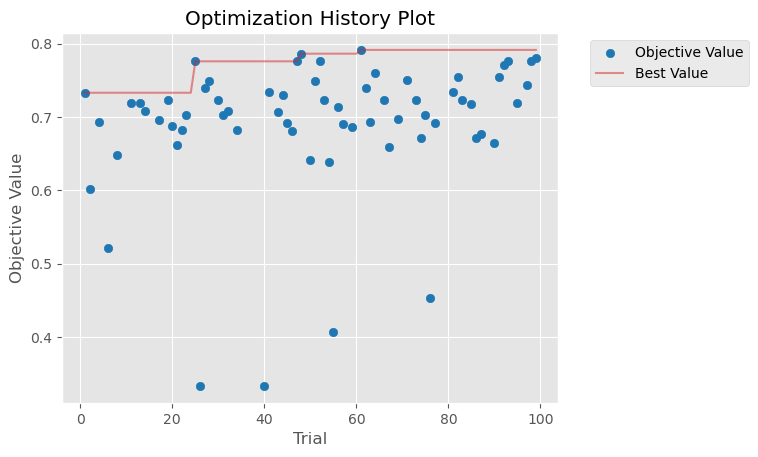

In [19]:
# Visualize the optimization history
plot_optimization_history(study)

[I 2024-06-10 13:37:12,108] A new study created in memory with name: no-name-f7350d8e-f6b8-408f-8f37-9b0d51a5b522
/tmp/ipykernel_36455/3414932042.py:7: ExperimentalWarning: plot_intermediate_values is experimental (supported from v2.2.0). The interface can change in the future.
  plot_intermediate_values(plotted_study)


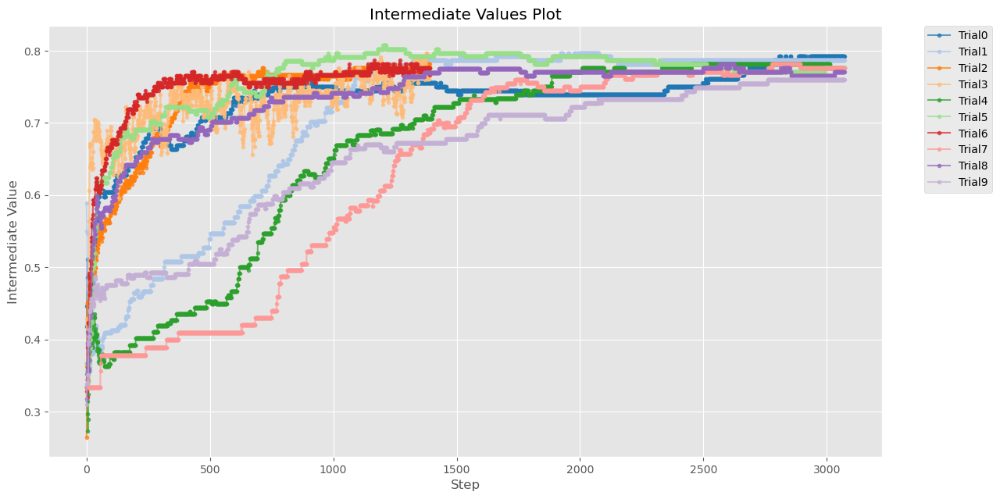

In [20]:
# Visualize the learning curves of the best 10 trials
trials = study.trials
plotted_trials = sorted(trials, key=lambda t: t.value, reverse=True)[:10]
plotted_study = optuna.create_study()
for trial in plotted_trials:
    plotted_study.add_trial(trial)
plot_intermediate_values(plotted_study)
set_size(10, 5)

/tmp/ipykernel_36455/2919792376.py:2: ExperimentalWarning: plot_parallel_coordinate is experimental (supported from v2.2.0). The interface can change in the future.
  plot_parallel_coordinate(study)


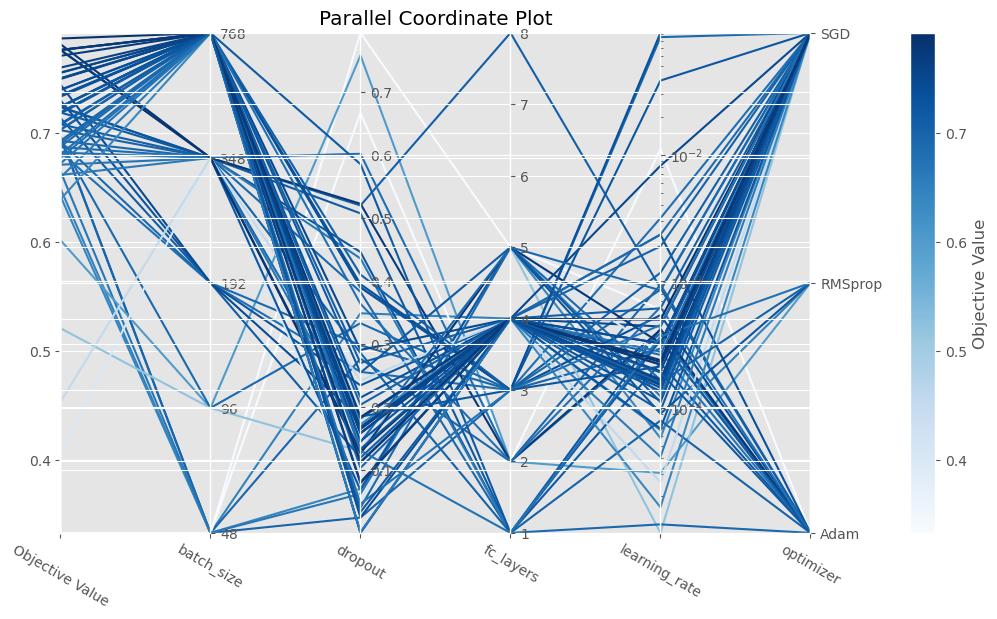

In [21]:
# Visualize high-dimensional parameter relationships.
plot_parallel_coordinate(study)
set_size(10, 5)

/tmp/ipykernel_36455/624402143.py:2: ExperimentalWarning: plot_contour is experimental (supported from v2.2.0). The interface can change in the future.
  plot_contour(study)
[W 2024-06-10 13:37:13,244] Output figures of this Matplotlib-based `plot_contour` function would be different from those of the Plotly-based `plot_contour`.


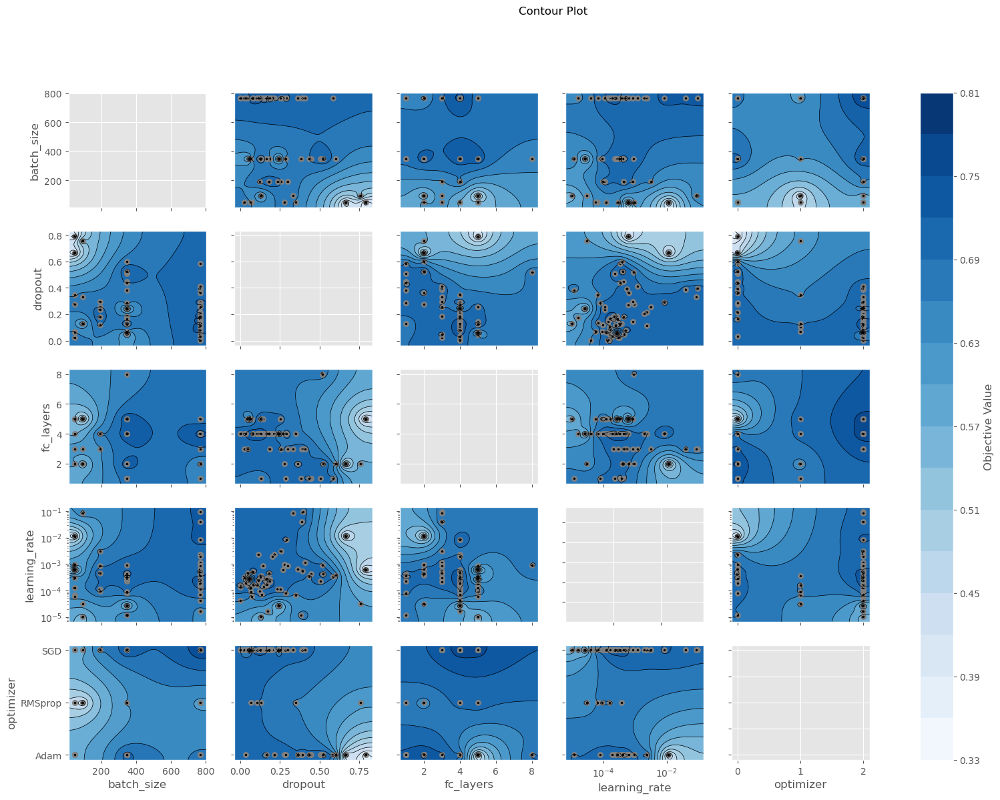

In [22]:
# Visualize hyperparameter relationships
plot_contour(study)
set_size(15, 10)

/tmp/ipykernel_36455/1888575690.py:2: ExperimentalWarning: plot_slice is experimental (supported from v2.2.0). The interface can change in the future.
  plot_slice(study)


array([<Axes: xlabel='batch_size', ylabel='Objective Value'>,
       <Axes: xlabel='dropout'>, <Axes: xlabel='fc_layers'>,
       <Axes: xlabel='learning_rate'>, <Axes: xlabel='optimizer'>],
      dtype=object)

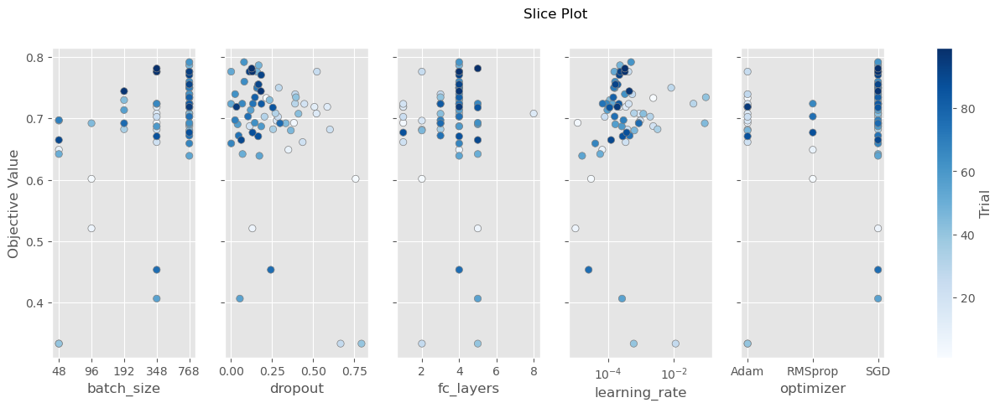

In [23]:
# Visualize individual hyperparameters as slice plot
plot_slice(study)

/tmp/ipykernel_36455/1473508994.py:2: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(study)


<Axes: title={'left': 'Hyperparameter Importances'}, xlabel='Hyperparameter Importance', ylabel='Hyperparameter'>

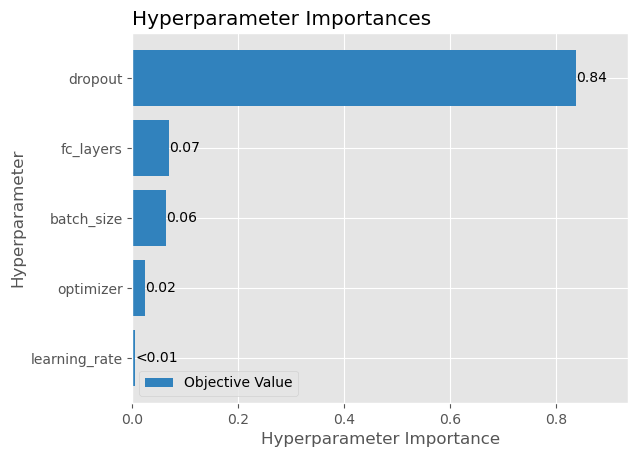

In [24]:
# Visualize parameter importances.
plot_param_importances(study)

/tmp/ipykernel_36455/3113371256.py:2: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


<Axes: title={'left': 'Hyperparameter Importances'}, xlabel='Hyperparameter Importance', ylabel='Hyperparameter'>

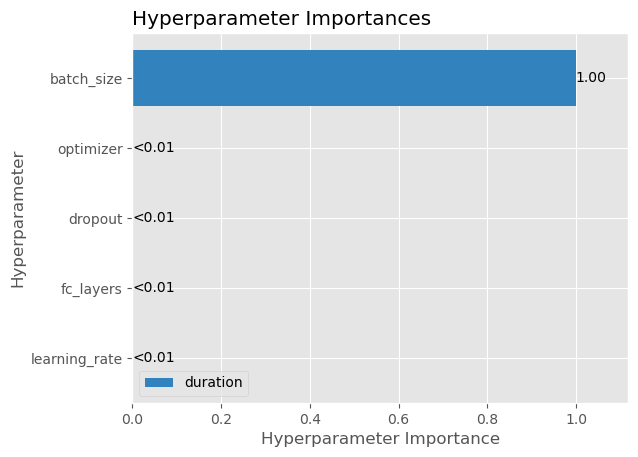

In [25]:
# Learn which hyperparameters are affecting the trial duration with hyperparameter importance.
plot_param_importances(
    study, target=lambda t: t.duration.total_seconds(), target_name="duration"
)

/tmp/ipykernel_36455/1828777839.py:2: ExperimentalWarning: plot_edf is experimental (supported from v2.2.0). The interface can change in the future.
  plot_edf(study)


<Axes: title={'center': 'Empirical Distribution Function Plot'}, xlabel='Objective Value', ylabel='Cumulative Probability'>

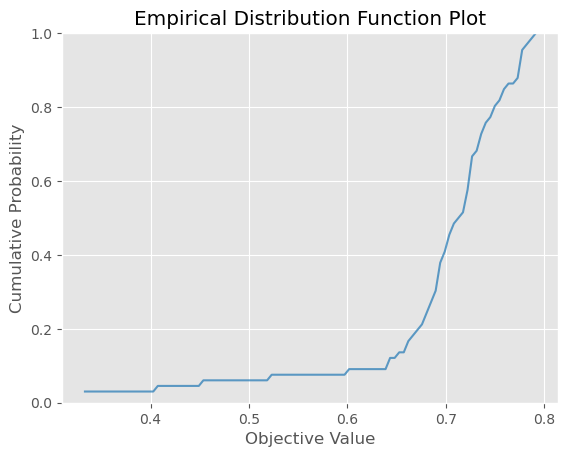

In [26]:
# Visualize empirical distribution function.
plot_edf(study)

/tmp/ipykernel_36455/1172520691.py:2: ExperimentalWarning: plot_rank is experimental (supported from v3.2.0). The interface can change in the future.
  plot_rank(study)
[W 2024-06-10 13:37:20,095] Output figures of this Matplotlib-based `plot_rank` function would be different from those of the Plotly-based `plot_rank`.


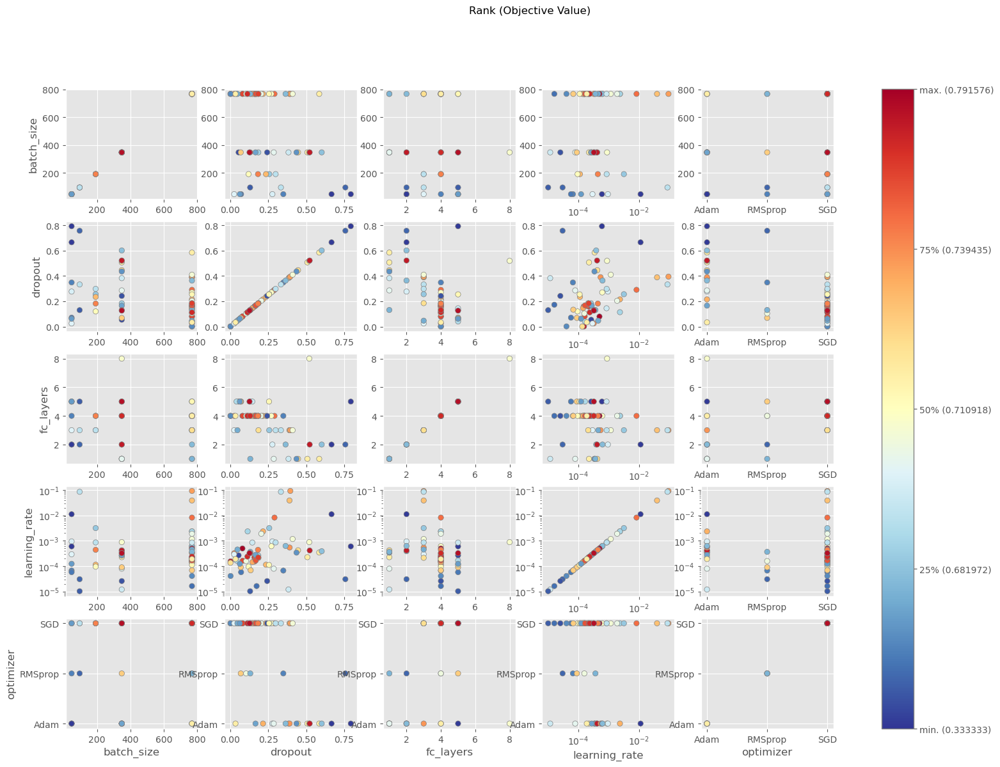

In [27]:
# Visualize parameter relations with scatter plots colored by objective values.
plot_rank(study)
set_size(15, 10)

/tmp/ipykernel_36455/124343896.py:2: ExperimentalWarning: plot_timeline is experimental (supported from v3.2.0). The interface can change in the future.
  plot_timeline(study)


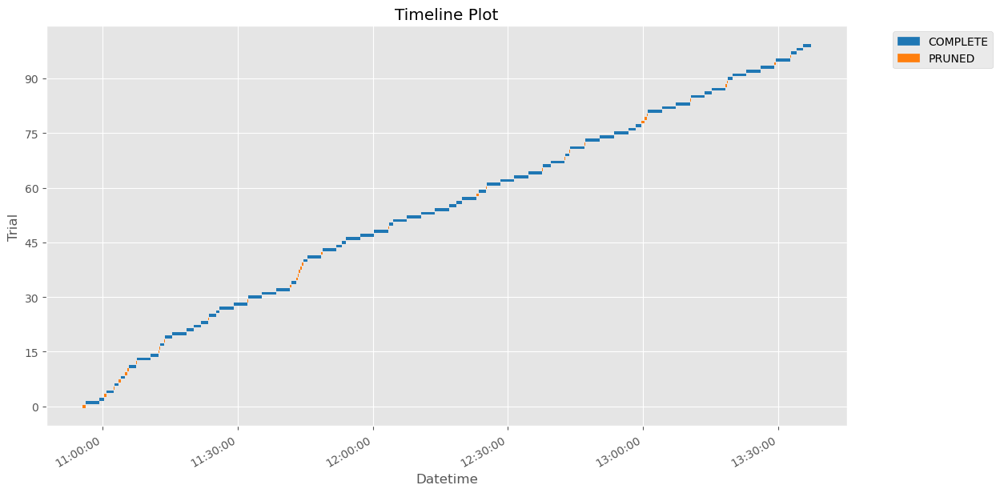

In [28]:
# Visualize the optimization timeline of performed trials.
plot_timeline(study)
set_size(10, 5)

### Model: graphLambda with edge_attr

In [29]:
import optuna
from optuna.integration import PyTorchLightningPruningCallback
from lightning.pytorch import Trainer
from lightning.pytorch.callbacks import RichProgressBar
import logging
import warnings

warnings.filterwarnings("ignore", ".*Consider increasing the value of the `num_workers` argument*")
warnings.filterwarnings("ignore", "Trying to infer the `batch_size` from an ambiguous collection.*")
torch.set_float32_matmul_precision('high')
logging.getLogger("lightning.pytorch.utilities.rank_zero").setLevel(logging.WARNING)
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

def objective(trial):
    # Suggest values for the hyperparameters
    learning_rate = trial.suggest_float('learning_rate', 1e-5, 1e-1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    batch_size = trial.suggest_categorical('batch_size', [48, 96, 192, 348, 768])
    fc_layers = trial.suggest_int('fc_layers', 1, 8)
    # fc_layers = 1
    dropout = trial.suggest_float('dropout', 0, 0.8)
    hyperparameters = dict(learning_rate=learning_rate, optimizer_name=optimizer_name, batch_size=batch_size, fc_layers=fc_layers, dropout=dropout)
    print(f'Tested parameters: {hyperparameters}')
    n_epochs = batch_size * 4 # vary training epochs based on batch size


    # Create the model
    model = graphLambda_w_edge_attr(learning_rate=learning_rate, optimizer_name=optimizer_name, fc_layers=fc_layers, dropout=dropout)

    

    # Create the PyTorch Lightning trainer
    trainer = Trainer(
        accelerator='gpu',
        devices=1,
        max_epochs=n_epochs,
        callbacks=[PyTorchLightningPruningCallback(trial, monitor="val_f1")],
        enable_progress_bar=False,
        enable_model_summary=False,
        logger=True,
        enable_checkpointing=False
    )

    # Define the data loaders
    train_loader = DataLoader(X_train, batch_size=batch_size, shuffle=True,
                              drop_last=True) # , num_workers=0, persistent_workers=True
    val_loader = DataLoader(X_val, batch_size=len(X_val), shuffle=False,
                            drop_last=True) # , num_workers=0, persistent_workers=True

    # Log the hyperparameters
    trainer.logger.log_hyperparams(hyperparameters)

    # Train the model
    trainer.fit(model, train_loader, val_loader)

    # Evaluate the model
    val_f1 = trainer.callback_metrics["val_f1"].item()

    return val_f1

study = optuna.create_study(direction='maximize', pruner=optuna.pruners.ThresholdPruner(lower=0.35, n_warmup_steps=200))
study.optimize(objective, n_trials=100)

print("Best trial:")
trial = study.best_trial

print("  Value: {}".format(trial.value))

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

df = study.trials_dataframe()
df.to_pickle('ec_ADHD_results_w_edge_attrs_trials.pkl')

[I 2024-06-10 13:37:23,444] A new study created in memory with name: no-name-787122ed-c168-420e-859c-ba053348c4b7
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (2) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Tested parameters: {'learning_rate': 0.05642092071687946, 'optimizer_name': 'SGD', 'batch_size': 348, 'fc_layers': 3, 'dropout': 0.48179596904270794}


[I 2024-06-10 13:39:12,657] Trial 0 finished with value: 0.6562126874923706 and parameters: {'learning_rate': 0.05642092071687946, 'optimizer': 'SGD', 'batch_size': 348, 'fc_layers': 3, 'dropout': 0.48179596904270794}. Best is trial 0 with value: 0.6562126874923706.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (4) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Tested parameters: {'learning_rate': 2.2090774252256235e-05, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 6, 'dropout': 0.37928938493015835}


[I 2024-06-10 13:39:34,134] Trial 1 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.0032614608913985525, 'optimizer_name': 'SGD', 'batch_size': 348, 'fc_layers': 2, 'dropout': 0.4402243784120364}


[I 2024-06-10 13:41:25,095] Trial 2 finished with value: 0.713347315788269 and parameters: {'learning_rate': 0.0032614608913985525, 'optimizer': 'SGD', 'batch_size': 348, 'fc_layers': 2, 'dropout': 0.4402243784120364}. Best is trial 2 with value: 0.713347315788269.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (8) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Tested parameters: {'learning_rate': 8.452815171377132e-05, 'optimizer_name': 'SGD', 'batch_size': 96, 'fc_layers': 2, 'dropout': 0.7076113271138452}


[I 2024-06-10 13:41:57,625] Trial 3 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.03465656943181758, 'optimizer_name': 'RMSprop', 'batch_size': 348, 'fc_layers': 1, 'dropout': 0.015404880411629573}


[I 2024-06-10 13:42:13,814] Trial 4 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.006504132012426819, 'optimizer_name': 'Adam', 'batch_size': 96, 'fc_layers': 1, 'dropout': 0.13771971566502472}


[I 2024-06-10 13:43:20,008] Trial 5 finished with value: 0.7367266416549683 and parameters: {'learning_rate': 0.006504132012426819, 'optimizer': 'Adam', 'batch_size': 96, 'fc_layers': 1, 'dropout': 0.13771971566502472}. Best is trial 5 with value: 0.7367266416549683.


Tested parameters: {'learning_rate': 0.00016952521206659788, 'optimizer_name': 'Adam', 'batch_size': 348, 'fc_layers': 4, 'dropout': 0.7113375955697135}


[I 2024-06-10 13:43:37,450] Trial 6 pruned. Trial was pruned at epoch 200.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (1) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Tested parameters: {'learning_rate': 0.015064101967888861, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 6, 'dropout': 0.35734574787718953}


[I 2024-06-10 13:43:53,101] Trial 7 pruned. Trial was pruned at epoch 200.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (16) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Tested parameters: {'learning_rate': 0.0058112802386910125, 'optimizer_name': 'RMSprop', 'batch_size': 48, 'fc_layers': 5, 'dropout': 0.01559382256847286}


[I 2024-06-10 13:44:50,971] Trial 8 finished with value: 0.3333333432674408 and parameters: {'learning_rate': 0.0058112802386910125, 'optimizer': 'RMSprop', 'batch_size': 48, 'fc_layers': 5, 'dropout': 0.01559382256847286}. Best is trial 5 with value: 0.7367266416549683.


Tested parameters: {'learning_rate': 0.03757935829628811, 'optimizer_name': 'RMSprop', 'batch_size': 96, 'fc_layers': 5, 'dropout': 0.33904124003349534}


[I 2024-06-10 13:45:26,502] Trial 9 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.0008757035772618946, 'optimizer_name': 'Adam', 'batch_size': 96, 'fc_layers': 8, 'dropout': 0.19589014865639787}


[I 2024-06-10 13:46:33,577] Trial 10 finished with value: 0.6637110114097595 and parameters: {'learning_rate': 0.0008757035772618946, 'optimizer': 'Adam', 'batch_size': 96, 'fc_layers': 8, 'dropout': 0.19589014865639787}. Best is trial 5 with value: 0.7367266416549683.


Tested parameters: {'learning_rate': 0.002569406647954376, 'optimizer_name': 'Adam', 'batch_size': 48, 'fc_layers': 1, 'dropout': 0.5499903944668194}


[I 2024-06-10 13:47:29,371] Trial 11 finished with value: 0.3333333432674408 and parameters: {'learning_rate': 0.002569406647954376, 'optimizer': 'Adam', 'batch_size': 48, 'fc_layers': 1, 'dropout': 0.5499903944668194}. Best is trial 5 with value: 0.7367266416549683.


Tested parameters: {'learning_rate': 0.0007375891640638493, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 2, 'dropout': 0.2234102291195597}


[I 2024-06-10 13:51:15,355] Trial 12 finished with value: 0.6717948913574219 and parameters: {'learning_rate': 0.0007375891640638493, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 2, 'dropout': 0.2234102291195597}. Best is trial 5 with value: 0.7367266416549683.


Tested parameters: {'learning_rate': 0.003357593616744819, 'optimizer_name': 'Adam', 'batch_size': 192, 'fc_layers': 3, 'dropout': 0.1782398903951331}


[I 2024-06-10 13:51:36,564] Trial 13 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.00959428895446966, 'optimizer_name': 'SGD', 'batch_size': 348, 'fc_layers': 1, 'dropout': 0.5885916048043064}


[I 2024-06-10 13:53:25,787] Trial 14 finished with value: 0.7112782001495361 and parameters: {'learning_rate': 0.00959428895446966, 'optimizer': 'SGD', 'batch_size': 348, 'fc_layers': 1, 'dropout': 0.5885916048043064}. Best is trial 5 with value: 0.7367266416549683.


Tested parameters: {'learning_rate': 0.0004815257687302454, 'optimizer_name': 'Adam', 'batch_size': 96, 'fc_layers': 3, 'dropout': 0.26514422410377714}


[I 2024-06-10 13:54:29,967] Trial 15 finished with value: 0.682214081287384 and parameters: {'learning_rate': 0.0004815257687302454, 'optimizer': 'Adam', 'batch_size': 96, 'fc_layers': 3, 'dropout': 0.26514422410377714}. Best is trial 5 with value: 0.7367266416549683.


Tested parameters: {'learning_rate': 0.0021859994313277896, 'optimizer_name': 'SGD', 'batch_size': 96, 'fc_layers': 2, 'dropout': 0.11551112658323931}


[I 2024-06-10 13:55:34,564] Trial 16 finished with value: 0.6762049794197083 and parameters: {'learning_rate': 0.0021859994313277896, 'optimizer': 'SGD', 'batch_size': 96, 'fc_layers': 2, 'dropout': 0.11551112658323931}. Best is trial 5 with value: 0.7367266416549683.


Tested parameters: {'learning_rate': 0.019817959584922672, 'optimizer_name': 'SGD', 'batch_size': 348, 'fc_layers': 4, 'dropout': 0.4579212712844618}


[I 2024-06-10 13:57:27,223] Trial 17 finished with value: 0.7082066535949707 and parameters: {'learning_rate': 0.019817959584922672, 'optimizer': 'SGD', 'batch_size': 348, 'fc_layers': 4, 'dropout': 0.4579212712844618}. Best is trial 5 with value: 0.7367266416549683.


Tested parameters: {'learning_rate': 0.00024197952438150008, 'optimizer_name': 'Adam', 'batch_size': 48, 'fc_layers': 2, 'dropout': 0.10588169684845583}


[I 2024-06-10 13:58:23,474] Trial 18 finished with value: 0.739130437374115 and parameters: {'learning_rate': 0.00024197952438150008, 'optimizer': 'Adam', 'batch_size': 48, 'fc_layers': 2, 'dropout': 0.10588169684845583}. Best is trial 18 with value: 0.739130437374115.


Tested parameters: {'learning_rate': 0.00021573497704636838, 'optimizer_name': 'Adam', 'batch_size': 48, 'fc_layers': 8, 'dropout': 0.10269652265313248}


[I 2024-06-10 13:59:24,989] Trial 19 finished with value: 0.7024712562561035 and parameters: {'learning_rate': 0.00021573497704636838, 'optimizer': 'Adam', 'batch_size': 48, 'fc_layers': 8, 'dropout': 0.10269652265313248}. Best is trial 18 with value: 0.739130437374115.


Tested parameters: {'learning_rate': 1.1553739744013582e-05, 'optimizer_name': 'Adam', 'batch_size': 48, 'fc_layers': 1, 'dropout': 0.11494091742285933}


[I 2024-06-10 14:00:25,129] Trial 20 finished with value: 0.6976214051246643 and parameters: {'learning_rate': 1.1553739744013582e-05, 'optimizer': 'Adam', 'batch_size': 48, 'fc_layers': 1, 'dropout': 0.11494091742285933}. Best is trial 18 with value: 0.739130437374115.


Tested parameters: {'learning_rate': 0.001620870476209695, 'optimizer_name': 'Adam', 'batch_size': 48, 'fc_layers': 2, 'dropout': 0.26897111271373453}


[I 2024-06-10 14:01:21,255] Trial 21 finished with value: 0.3333333432674408 and parameters: {'learning_rate': 0.001620870476209695, 'optimizer': 'Adam', 'batch_size': 48, 'fc_layers': 2, 'dropout': 0.26897111271373453}. Best is trial 18 with value: 0.739130437374115.


Tested parameters: {'learning_rate': 6.126330429144499e-05, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.44294587231268406}


[I 2024-06-10 14:05:03,973] Trial 22 finished with value: 0.7552016973495483 and parameters: {'learning_rate': 6.126330429144499e-05, 'optimizer': 'Adam', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.44294587231268406}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 5.071952096777029e-05, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.3023627664354652}


[I 2024-06-10 14:08:46,986] Trial 23 finished with value: 0.7551484704017639 and parameters: {'learning_rate': 5.071952096777029e-05, 'optimizer': 'Adam', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.3023627664354652}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 4.088359010102614e-05, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.31158566089820716}


[I 2024-06-10 14:12:35,001] Trial 24 finished with value: 0.7395550608634949 and parameters: {'learning_rate': 4.088359010102614e-05, 'optimizer': 'Adam', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.31158566089820716}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 4.6136746531139607e-05, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.31389570353557283}


[I 2024-06-10 14:16:19,568] Trial 25 finished with value: 0.7029235363006592 and parameters: {'learning_rate': 4.6136746531139607e-05, 'optimizer': 'Adam', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.31389570353557283}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 3.7771958230596767e-05, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.5371320762347814}


[I 2024-06-10 14:16:33,994] Trial 26 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.0001003184822143665, 'optimizer_name': 'RMSprop', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.6436728875586881}


[I 2024-06-10 14:16:48,479] Trial 27 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 1.5038512355364265e-05, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.4101512659895904}


[I 2024-06-10 14:20:32,228] Trial 28 finished with value: 0.7029235363006592 and parameters: {'learning_rate': 1.5038512355364265e-05, 'optimizer': 'Adam', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.4101512659895904}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 4.0524299353731026e-05, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.4997705001873407}


[I 2024-06-10 14:24:23,911] Trial 29 finished with value: 0.7238908410072327 and parameters: {'learning_rate': 4.0524299353731026e-05, 'optimizer': 'Adam', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.4997705001873407}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 7.183898103144647e-05, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.29622647877068786}


[I 2024-06-10 14:28:10,692] Trial 30 finished with value: 0.6924998164176941 and parameters: {'learning_rate': 7.183898103144647e-05, 'optimizer': 'Adam', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.29622647877068786}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 0.00032028588616242037, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 2, 'dropout': 0.24640743074339427}


[I 2024-06-10 14:31:53,298] Trial 31 finished with value: 0.6922993659973145 and parameters: {'learning_rate': 0.00032028588616242037, 'optimizer': 'Adam', 'batch_size': 768, 'fc_layers': 2, 'dropout': 0.24640743074339427}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 2.2494287037303575e-05, 'optimizer_name': 'Adam', 'batch_size': 192, 'fc_layers': 3, 'dropout': 0.07233565693612656}


[I 2024-06-10 14:33:15,400] Trial 32 finished with value: 0.7182608842849731 and parameters: {'learning_rate': 2.2494287037303575e-05, 'optimizer': 'Adam', 'batch_size': 192, 'fc_layers': 3, 'dropout': 0.07233565693612656}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 0.0001582064873205146, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.3996491711551282}


[I 2024-06-10 14:37:00,608] Trial 33 finished with value: 0.7080482244491577 and parameters: {'learning_rate': 0.0001582064873205146, 'optimizer': 'Adam', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.3996491711551282}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 2.0219553702798188e-05, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 2, 'dropout': 0.7831347519468749}


[I 2024-06-10 14:40:43,033] Trial 34 finished with value: 0.6940880417823792 and parameters: {'learning_rate': 2.0219553702798188e-05, 'optimizer': 'Adam', 'batch_size': 768, 'fc_layers': 2, 'dropout': 0.7831347519468749}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 9.817267281080911e-05, 'optimizer_name': 'RMSprop', 'batch_size': 48, 'fc_layers': 4, 'dropout': 0.4336311830485742}


[I 2024-06-10 14:41:41,654] Trial 35 finished with value: 0.6762049794197083 and parameters: {'learning_rate': 9.817267281080911e-05, 'optimizer': 'RMSprop', 'batch_size': 48, 'fc_layers': 4, 'dropout': 0.4336311830485742}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 5.081018021315069e-05, 'optimizer_name': 'Adam', 'batch_size': 192, 'fc_layers': 7, 'dropout': 0.37479762815125156}


[I 2024-06-10 14:43:08,711] Trial 36 finished with value: 0.7394702434539795 and parameters: {'learning_rate': 5.081018021315069e-05, 'optimizer': 'Adam', 'batch_size': 192, 'fc_layers': 7, 'dropout': 0.37479762815125156}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 5.926501693569846e-05, 'optimizer_name': 'Adam', 'batch_size': 192, 'fc_layers': 7, 'dropout': 0.34999486040144656}


[I 2024-06-10 14:44:35,032] Trial 37 finished with value: 0.7235909104347229 and parameters: {'learning_rate': 5.926501693569846e-05, 'optimizer': 'Adam', 'batch_size': 192, 'fc_layers': 7, 'dropout': 0.34999486040144656}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 3.035055181989239e-05, 'optimizer_name': 'Adam', 'batch_size': 192, 'fc_layers': 6, 'dropout': 0.4816169999076}


[I 2024-06-10 14:46:01,061] Trial 38 finished with value: 0.7238908410072327 and parameters: {'learning_rate': 3.035055181989239e-05, 'optimizer': 'Adam', 'batch_size': 192, 'fc_layers': 6, 'dropout': 0.4816169999076}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 0.00012367413961643424, 'optimizer_name': 'RMSprop', 'batch_size': 192, 'fc_layers': 7, 'dropout': 0.37906901417474936}


[I 2024-06-10 14:47:32,209] Trial 39 finished with value: 0.7238908410072327 and parameters: {'learning_rate': 0.00012367413961643424, 'optimizer': 'RMSprop', 'batch_size': 192, 'fc_layers': 7, 'dropout': 0.37906901417474936}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 2.540151383590964e-05, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 7, 'dropout': 0.3088271410996621}


[I 2024-06-10 14:51:19,343] Trial 40 finished with value: 0.7083333134651184 and parameters: {'learning_rate': 2.540151383590964e-05, 'optimizer': 'Adam', 'batch_size': 768, 'fc_layers': 7, 'dropout': 0.3088271410996621}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 0.00027220309835983796, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.17325000023728268}


[I 2024-06-10 14:55:05,520] Trial 41 finished with value: 0.7290491461753845 and parameters: {'learning_rate': 0.00027220309835983796, 'optimizer': 'Adam', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.17325000023728268}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 5.497595630941202e-05, 'optimizer_name': 'Adam', 'batch_size': 192, 'fc_layers': 2, 'dropout': 0.4333934842092704}


[I 2024-06-10 14:56:27,717] Trial 42 finished with value: 0.7186278700828552 and parameters: {'learning_rate': 5.497595630941202e-05, 'optimizer': 'Adam', 'batch_size': 192, 'fc_layers': 2, 'dropout': 0.4333934842092704}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 1.0452416655565634e-05, 'optimizer_name': 'Adam', 'batch_size': 48, 'fc_layers': 5, 'dropout': 0.3801456855560392}


[I 2024-06-10 14:57:26,238] Trial 43 finished with value: 0.7184751033782959 and parameters: {'learning_rate': 1.0452416655565634e-05, 'optimizer': 'Adam', 'batch_size': 48, 'fc_layers': 5, 'dropout': 0.3801456855560392}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 0.00015265017507697505, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 6, 'dropout': 0.0018509476650886286}


[I 2024-06-10 15:01:13,510] Trial 44 finished with value: 0.7062936425209045 and parameters: {'learning_rate': 0.00015265017507697505, 'optimizer': 'Adam', 'batch_size': 768, 'fc_layers': 6, 'dropout': 0.0018509476650886286}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 0.00045107094163536915, 'optimizer_name': 'Adam', 'batch_size': 192, 'fc_layers': 2, 'dropout': 0.055855521859586026}


[I 2024-06-10 15:02:38,667] Trial 45 finished with value: 0.686956524848938 and parameters: {'learning_rate': 0.00045107094163536915, 'optimizer': 'Adam', 'batch_size': 192, 'fc_layers': 2, 'dropout': 0.055855521859586026}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 8.619471693709169e-05, 'optimizer_name': 'SGD', 'batch_size': 348, 'fc_layers': 1, 'dropout': 0.20602742602021323}


[I 2024-06-10 15:04:27,300] Trial 46 finished with value: 0.668630063533783 and parameters: {'learning_rate': 8.619471693709169e-05, 'optimizer': 'SGD', 'batch_size': 348, 'fc_layers': 1, 'dropout': 0.20602742602021323}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 1.784891024158075e-05, 'optimizer_name': 'Adam', 'batch_size': 48, 'fc_layers': 3, 'dropout': 0.3374751750387199}


[I 2024-06-10 15:05:26,280] Trial 47 finished with value: 0.6920316219329834 and parameters: {'learning_rate': 1.784891024158075e-05, 'optimizer': 'Adam', 'batch_size': 48, 'fc_layers': 3, 'dropout': 0.3374751750387199}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 3.320523214890968e-05, 'optimizer_name': 'RMSprop', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.5067240005986361}


[I 2024-06-10 15:09:11,740] Trial 48 finished with value: 0.7238908410072327 and parameters: {'learning_rate': 3.320523214890968e-05, 'optimizer': 'RMSprop', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.5067240005986361}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 7.225199890112499e-05, 'optimizer_name': 'Adam', 'batch_size': 192, 'fc_layers': 5, 'dropout': 0.6144957153196454}


[I 2024-06-10 15:09:33,427] Trial 49 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.00023527064018034536, 'optimizer_name': 'Adam', 'batch_size': 96, 'fc_layers': 3, 'dropout': 0.2765935101702174}


[I 2024-06-10 15:10:39,417] Trial 50 finished with value: 0.6820760369300842 and parameters: {'learning_rate': 0.00023527064018034536, 'optimizer': 'Adam', 'batch_size': 96, 'fc_layers': 3, 'dropout': 0.2765935101702174}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 0.0012354207683310469, 'optimizer_name': 'Adam', 'batch_size': 96, 'fc_layers': 1, 'dropout': 0.13439575053419195}


[I 2024-06-10 15:11:43,583] Trial 51 finished with value: 0.6970950365066528 and parameters: {'learning_rate': 0.0012354207683310469, 'optimizer': 'Adam', 'batch_size': 96, 'fc_layers': 1, 'dropout': 0.13439575053419195}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 0.004790611091313216, 'optimizer_name': 'Adam', 'batch_size': 96, 'fc_layers': 1, 'dropout': 0.16642046170851216}


[I 2024-06-10 15:12:46,955] Trial 52 finished with value: 0.7212283611297607 and parameters: {'learning_rate': 0.004790611091313216, 'optimizer': 'Adam', 'batch_size': 96, 'fc_layers': 1, 'dropout': 0.16642046170851216}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 0.0006273175305322428, 'optimizer_name': 'SGD', 'batch_size': 96, 'fc_layers': 2, 'dropout': 0.23894184566797766}


[I 2024-06-10 15:13:48,950] Trial 53 finished with value: 0.7237709760665894 and parameters: {'learning_rate': 0.0006273175305322428, 'optimizer': 'SGD', 'batch_size': 96, 'fc_layers': 2, 'dropout': 0.23894184566797766}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 0.07984437499916684, 'optimizer_name': 'Adam', 'batch_size': 348, 'fc_layers': 1, 'dropout': 0.0589659968596016}


[I 2024-06-10 15:14:04,611] Trial 54 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.010362993559970462, 'optimizer_name': 'Adam', 'batch_size': 48, 'fc_layers': 2, 'dropout': 0.2103673431775217}


[I 2024-06-10 15:15:01,557] Trial 55 finished with value: 0.3333333432674408 and parameters: {'learning_rate': 0.010362993559970462, 'optimizer': 'Adam', 'batch_size': 48, 'fc_layers': 2, 'dropout': 0.2103673431775217}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 0.022435944801215742, 'optimizer_name': 'Adam', 'batch_size': 96, 'fc_layers': 2, 'dropout': 0.14451121712096407}


[I 2024-06-10 15:15:37,635] Trial 56 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 5.030551651279118e-05, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 8, 'dropout': 0.45859606321219154}


[I 2024-06-10 15:19:26,232] Trial 57 finished with value: 0.7289019227027893 and parameters: {'learning_rate': 5.030551651279118e-05, 'optimizer': 'Adam', 'batch_size': 768, 'fc_layers': 8, 'dropout': 0.45859606321219154}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 0.0001184043130349361, 'optimizer_name': 'SGD', 'batch_size': 48, 'fc_layers': 1, 'dropout': 0.027319984122242846}


[I 2024-06-10 15:20:20,432] Trial 58 finished with value: 0.7212283611297607 and parameters: {'learning_rate': 0.0001184043130349361, 'optimizer': 'SGD', 'batch_size': 48, 'fc_layers': 1, 'dropout': 0.027319984122242846}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 1.3901330565225081e-05, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.32790713695039253}


[I 2024-06-10 15:24:05,122] Trial 59 finished with value: 0.7082066535949707 and parameters: {'learning_rate': 1.3901330565225081e-05, 'optimizer': 'Adam', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.32790713695039253}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 0.00019643425733368891, 'optimizer_name': 'RMSprop', 'batch_size': 96, 'fc_layers': 2, 'dropout': 0.364396754170623}


[I 2024-06-10 15:25:09,418] Trial 60 finished with value: 0.7394702434539795 and parameters: {'learning_rate': 0.00019643425733368891, 'optimizer': 'RMSprop', 'batch_size': 96, 'fc_layers': 2, 'dropout': 0.364396754170623}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 0.00020508952494050205, 'optimizer_name': 'RMSprop', 'batch_size': 96, 'fc_layers': 2, 'dropout': 0.3688329529728441}


[I 2024-06-10 15:26:12,880] Trial 61 finished with value: 0.713533878326416 and parameters: {'learning_rate': 0.00020508952494050205, 'optimizer': 'RMSprop', 'batch_size': 96, 'fc_layers': 2, 'dropout': 0.3688329529728441}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 0.00033341612747889897, 'optimizer_name': 'RMSprop', 'batch_size': 96, 'fc_layers': 3, 'dropout': 0.4006251453011097}


[I 2024-06-10 15:26:46,654] Trial 62 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 7.035559674325201e-05, 'optimizer_name': 'RMSprop', 'batch_size': 96, 'fc_layers': 2, 'dropout': 0.2883857125315532}


[I 2024-06-10 15:27:52,450] Trial 63 finished with value: 0.6767677068710327 and parameters: {'learning_rate': 7.035559674325201e-05, 'optimizer': 'RMSprop', 'batch_size': 96, 'fc_layers': 2, 'dropout': 0.2883857125315532}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 2.9044513095069137e-05, 'optimizer_name': 'RMSprop', 'batch_size': 96, 'fc_layers': 3, 'dropout': 0.09397764932398321}


[I 2024-06-10 15:28:57,594] Trial 64 finished with value: 0.7343677878379822 and parameters: {'learning_rate': 2.9044513095069137e-05, 'optimizer': 'RMSprop', 'batch_size': 96, 'fc_layers': 3, 'dropout': 0.09397764932398321}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 4.172057005299755e-05, 'optimizer_name': 'RMSprop', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.2582310780323056}


[I 2024-06-10 15:32:43,277] Trial 65 finished with value: 0.6967320442199707 and parameters: {'learning_rate': 4.172057005299755e-05, 'optimizer': 'RMSprop', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.2582310780323056}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 0.0001451563074385136, 'optimizer_name': 'Adam', 'batch_size': 348, 'fc_layers': 4, 'dropout': 0.3570187092445263}


[I 2024-06-10 15:34:34,912] Trial 66 finished with value: 0.7083333134651184 and parameters: {'learning_rate': 0.0001451563074385136, 'optimizer': 'Adam', 'batch_size': 348, 'fc_layers': 4, 'dropout': 0.3570187092445263}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 0.0005149449609629879, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 2, 'dropout': 0.4252347968186382}


[I 2024-06-10 15:38:18,106] Trial 67 finished with value: 0.7027298808097839 and parameters: {'learning_rate': 0.0005149449609629879, 'optimizer': 'Adam', 'batch_size': 768, 'fc_layers': 2, 'dropout': 0.4252347968186382}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 0.001433515365109955, 'optimizer_name': 'Adam', 'batch_size': 96, 'fc_layers': 3, 'dropout': 0.3192815020043406}


[I 2024-06-10 15:38:51,733] Trial 68 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.03764757301140476, 'optimizer_name': 'Adam', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.4580837056010513}


[I 2024-06-10 15:39:14,038] Trial 69 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.0023839122138640386, 'optimizer_name': 'RMSprop', 'batch_size': 48, 'fc_layers': 1, 'dropout': 0.5275281609451314}


[I 2024-06-10 15:40:13,070] Trial 70 finished with value: 0.3333333432674408 and parameters: {'learning_rate': 0.0023839122138640386, 'optimizer': 'RMSprop', 'batch_size': 48, 'fc_layers': 1, 'dropout': 0.5275281609451314}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 3.97856657900343e-05, 'optimizer_name': 'RMSprop', 'batch_size': 96, 'fc_layers': 3, 'dropout': 0.08461040578420492}


[I 2024-06-10 15:41:16,453] Trial 71 finished with value: 0.7290491461753845 and parameters: {'learning_rate': 3.97856657900343e-05, 'optimizer': 'RMSprop', 'batch_size': 96, 'fc_layers': 3, 'dropout': 0.08461040578420492}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 2.7534832801550812e-05, 'optimizer_name': 'RMSprop', 'batch_size': 96, 'fc_layers': 3, 'dropout': 0.10906082348792341}


[I 2024-06-10 15:42:23,698] Trial 72 finished with value: 0.7031169533729553 and parameters: {'learning_rate': 2.7534832801550812e-05, 'optimizer': 'RMSprop', 'batch_size': 96, 'fc_layers': 3, 'dropout': 0.10906082348792341}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 0.0009368875724428843, 'optimizer_name': 'RMSprop', 'batch_size': 96, 'fc_layers': 3, 'dropout': 0.039382345507332814}


[I 2024-06-10 15:42:58,174] Trial 73 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 5.587485364042567e-05, 'optimizer_name': 'RMSprop', 'batch_size': 96, 'fc_layers': 2, 'dropout': 0.08687028245283886}


[I 2024-06-10 15:44:06,992] Trial 74 finished with value: 0.6770482659339905 and parameters: {'learning_rate': 5.587485364042567e-05, 'optimizer': 'RMSprop', 'batch_size': 96, 'fc_layers': 2, 'dropout': 0.08687028245283886}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 0.00010315405933585605, 'optimizer_name': 'RMSprop', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.15340813277805876}


[I 2024-06-10 15:47:53,547] Trial 75 finished with value: 0.7237709760665894 and parameters: {'learning_rate': 0.00010315405933585605, 'optimizer': 'RMSprop', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.15340813277805876}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 1.8093279255229297e-05, 'optimizer_name': 'Adam', 'batch_size': 96, 'fc_layers': 4, 'dropout': 0.2241734135033297}


[I 2024-06-10 15:48:59,528] Trial 76 finished with value: 0.6973912715911865 and parameters: {'learning_rate': 1.8093279255229297e-05, 'optimizer': 'Adam', 'batch_size': 96, 'fc_layers': 4, 'dropout': 0.2241734135033297}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 2.9453654923228894e-05, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 2, 'dropout': 0.18625434296984392}


[I 2024-06-10 15:52:41,993] Trial 77 finished with value: 0.6333333253860474 and parameters: {'learning_rate': 2.9453654923228894e-05, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 2, 'dropout': 0.18625434296984392}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 7.031946250777007e-05, 'optimizer_name': 'Adam', 'batch_size': 192, 'fc_layers': 3, 'dropout': 0.12568743140358218}


[I 2024-06-10 15:54:08,529] Trial 78 finished with value: 0.7337899804115295 and parameters: {'learning_rate': 7.031946250777007e-05, 'optimizer': 'Adam', 'batch_size': 192, 'fc_layers': 3, 'dropout': 0.12568743140358218}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 0.00019367707359759306, 'optimizer_name': 'Adam', 'batch_size': 48, 'fc_layers': 6, 'dropout': 0.39098057320568674}


[I 2024-06-10 15:55:10,710] Trial 79 finished with value: 0.7237709760665894 and parameters: {'learning_rate': 0.00019367707359759306, 'optimizer': 'Adam', 'batch_size': 48, 'fc_layers': 6, 'dropout': 0.39098057320568674}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 2.1290026111046655e-05, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 7, 'dropout': 0.48222779168896834}


[I 2024-06-10 15:55:25,758] Trial 80 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 8.331878461633827e-05, 'optimizer_name': 'Adam', 'batch_size': 192, 'fc_layers': 3, 'dropout': 0.13108665094958927}


[I 2024-06-10 15:56:47,008] Trial 81 finished with value: 0.7340214252471924 and parameters: {'learning_rate': 8.331878461633827e-05, 'optimizer': 'Adam', 'batch_size': 192, 'fc_layers': 3, 'dropout': 0.13108665094958927}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 8.5074120715481e-05, 'optimizer_name': 'Adam', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.0890559970102415}


[I 2024-06-10 15:58:11,641] Trial 82 finished with value: 0.6922993659973145 and parameters: {'learning_rate': 8.5074120715481e-05, 'optimizer': 'Adam', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.0890559970102415}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 3.4489162671781476e-05, 'optimizer_name': 'Adam', 'batch_size': 192, 'fc_layers': 3, 'dropout': 0.4215710920214446}


[I 2024-06-10 15:59:34,218] Trial 83 finished with value: 0.6874660849571228 and parameters: {'learning_rate': 3.4489162671781476e-05, 'optimizer': 'Adam', 'batch_size': 192, 'fc_layers': 3, 'dropout': 0.4215710920214446}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 0.00012043335933000759, 'optimizer_name': 'Adam', 'batch_size': 192, 'fc_layers': 2, 'dropout': 0.34817035676216546}


[I 2024-06-10 16:00:59,733] Trial 84 finished with value: 0.6822830438613892 and parameters: {'learning_rate': 0.00012043335933000759, 'optimizer': 'Adam', 'batch_size': 192, 'fc_layers': 2, 'dropout': 0.34817035676216546}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 4.771766285713776e-05, 'optimizer_name': 'Adam', 'batch_size': 192, 'fc_layers': 3, 'dropout': 0.1566347390216594}


[I 2024-06-10 16:02:23,392] Trial 85 finished with value: 0.7031169533729553 and parameters: {'learning_rate': 4.771766285713776e-05, 'optimizer': 'Adam', 'batch_size': 192, 'fc_layers': 3, 'dropout': 0.1566347390216594}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 0.00037140321308505434, 'optimizer_name': 'Adam', 'batch_size': 96, 'fc_layers': 3, 'dropout': 0.3019308456123986}


[I 2024-06-10 16:03:28,611] Trial 86 finished with value: 0.6384180784225464 and parameters: {'learning_rate': 0.00037140321308505434, 'optimizer': 'Adam', 'batch_size': 96, 'fc_layers': 3, 'dropout': 0.3019308456123986}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 7.1547971566628e-05, 'optimizer_name': 'RMSprop', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.5657418097499267}


[I 2024-06-10 16:07:15,827] Trial 87 finished with value: 0.7343677878379822 and parameters: {'learning_rate': 7.1547971566628e-05, 'optimizer': 'RMSprop', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.5657418097499267}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 2.497867064678153e-05, 'optimizer_name': 'RMSprop', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.7115583130891612}


[I 2024-06-10 16:07:30,387] Trial 88 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 1.3127858906028577e-05, 'optimizer_name': 'RMSprop', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.6039107258091093}


[I 2024-06-10 16:07:44,817] Trial 89 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.0001671268242909673, 'optimizer_name': 'RMSprop', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.6455425305942281}


[I 2024-06-10 16:07:59,600] Trial 90 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 6.36944996774037e-05, 'optimizer_name': 'RMSprop', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.06398614243139493}


[I 2024-06-10 16:11:42,736] Trial 91 finished with value: 0.7495652437210083 and parameters: {'learning_rate': 6.36944996774037e-05, 'optimizer': 'RMSprop', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.06398614243139493}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 5.0773196108896466e-05, 'optimizer_name': 'RMSprop', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.5646156248302894}


[I 2024-06-10 16:15:28,241] Trial 92 finished with value: 0.7082066535949707 and parameters: {'learning_rate': 5.0773196108896466e-05, 'optimizer': 'RMSprop', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.5646156248302894}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 5.961129798063247e-05, 'optimizer_name': 'RMSprop', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.041163225362712774}


[I 2024-06-10 16:19:12,697] Trial 93 finished with value: 0.7237709760665894 and parameters: {'learning_rate': 5.961129798063247e-05, 'optimizer': 'RMSprop', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.041163225362712774}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 3.8039212200388676e-05, 'optimizer_name': 'RMSprop', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.062061920516169565}


[I 2024-06-10 16:22:56,456] Trial 94 finished with value: 0.6952381134033203 and parameters: {'learning_rate': 3.8039212200388676e-05, 'optimizer': 'RMSprop', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.062061920516169565}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 0.00010259677246466158, 'optimizer_name': 'RMSprop', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.37076261946101585}


[I 2024-06-10 16:26:40,854] Trial 95 finished with value: 0.7343101501464844 and parameters: {'learning_rate': 0.00010259677246466158, 'optimizer': 'RMSprop', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.37076261946101585}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 0.000281872265378785, 'optimizer_name': 'RMSprop', 'batch_size': 348, 'fc_layers': 2, 'dropout': 0.013064945344206276}


[I 2024-06-10 16:28:33,056] Trial 96 finished with value: 0.7134717106819153 and parameters: {'learning_rate': 0.000281872265378785, 'optimizer': 'RMSprop', 'batch_size': 348, 'fc_layers': 2, 'dropout': 0.013064945344206276}. Best is trial 22 with value: 0.7552016973495483.


Tested parameters: {'learning_rate': 6.238417291907888e-05, 'optimizer_name': 'RMSprop', 'batch_size': 768, 'fc_layers': 8, 'dropout': 0.33907988845957304}


[I 2024-06-10 16:32:23,318] Trial 97 finished with value: 0.7707338929176331 and parameters: {'learning_rate': 6.238417291907888e-05, 'optimizer': 'RMSprop', 'batch_size': 768, 'fc_layers': 8, 'dropout': 0.33907988845957304}. Best is trial 97 with value: 0.7707338929176331.


Tested parameters: {'learning_rate': 0.0001337793675795023, 'optimizer_name': 'SGD', 'batch_size': 48, 'fc_layers': 8, 'dropout': 0.27710624085840674}


[I 2024-06-10 16:33:21,932] Trial 98 finished with value: 0.38021978735923767 and parameters: {'learning_rate': 0.0001337793675795023, 'optimizer': 'SGD', 'batch_size': 48, 'fc_layers': 8, 'dropout': 0.27710624085840674}. Best is trial 97 with value: 0.7707338929176331.


Tested parameters: {'learning_rate': 0.009337916755590816, 'optimizer_name': 'RMSprop', 'batch_size': 768, 'fc_layers': 8, 'dropout': 0.4034526497625598}


[I 2024-06-10 16:33:36,804] Trial 99 pruned. Trial was pruned at epoch 200.


Best trial:
  Value: 0.7707338929176331
  Params: 
    learning_rate: 6.238417291907888e-05
    optimizer: RMSprop
    batch_size: 768
    fc_layers: 8
    dropout: 0.33907988845957304


In [30]:
df_trials = pd.read_pickle('ec_ADHD_results_w_edge_attrs_trials.pkl')
df_trials.sort_values('value', ascending=False).head(10)

,number,value,datetime_start,datetime_complete,duration,params_batch_size,params_dropout,params_fc_layers,params_learning_rate,params_optimizer,state
97,97,0.770734,2024-06-10 16:28:33.057948,2024-06-10 16:32:23.314535,0 days 00:03:50.256587,768,0.339080,8,0.000062,RMSprop,COMPLETE
22,22,0.755202,2024-06-10 14:01:21.256605,2024-06-10 14:05:03.969366,0 days 00:03:42.712761,768,0.442946,3,0.000061,Adam,COMPLETE
23,23,0.755148,2024-06-10 14:05:03.974142,2024-06-10 14:08:46.982191,0 days 00:03:43.008049,768,0.302363,3,0.000051,Adam,COMPLETE
91,91,0.749565,2024-06-10 16:07:59.601384,2024-06-10 16:11:42.732023,0 days 00:03:43.130639,768,0.063986,4,0.000064,RMSprop,COMPLETE
24,24,0.739555,2024-06-10 14:08:46.986997,2024-06-10 14:12:34.997853,0 days 00:03:48.010856,768,0.311586,3,0.000041,Adam,COMPLETE
60,60,0.739470,2024-06-10 15:24:05.123302,2024-06-10 15:25:09.416089,0 days 00:01:04.292787,96,0.364397,2,0.000196,RMSprop,COMPLETE
36,36,0.739470,2024-06-10 14:41:41.655532,2024-06-10 14:43:08.709182,0 days 00:01:27.053650,192,0.374798,7,0.000051,Adam,COMPLETE
18,18,0.739130,2024-06-10 13:57:27.224793,2024-06-10 13:58:23.474008,0 days 00:00:56.249215,48,0.105882,2,0.000242,Adam,COMPLETE
5,5,0.736727,2024-06-10 13:42:13.815951,2024-06-10 13:43:20.007952,0 days 00:01:06.192001,96,0.137720,1,0.006504,Adam,COMPLETE
64,64,0.734368,2024-06-10 15:27:52.451385,2024-06-10 15:28:57.592164,0 days 00:01:05.140779,96,0.093978,3,0.000029,RMSprop,COMPLETE


#### Visualizations

/tmp/ipykernel_36455/1755039964.py:2: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(study)


<Axes: title={'center': 'Optimization History Plot'}, xlabel='Trial', ylabel='Objective Value'>

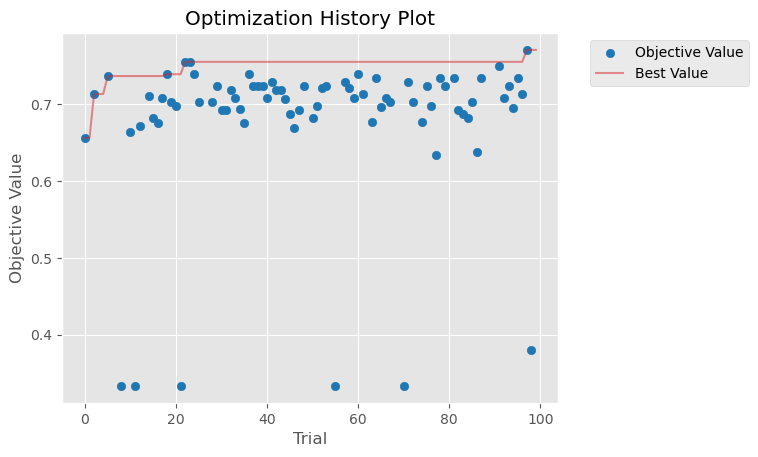

In [31]:
# Visualize the optimization history
plot_optimization_history(study)

[I 2024-06-10 16:33:37,159] A new study created in memory with name: no-name-92a8ffa8-df8a-4d4c-810a-a4f22cf5756d
/tmp/ipykernel_36455/3414932042.py:7: ExperimentalWarning: plot_intermediate_values is experimental (supported from v2.2.0). The interface can change in the future.
  plot_intermediate_values(plotted_study)


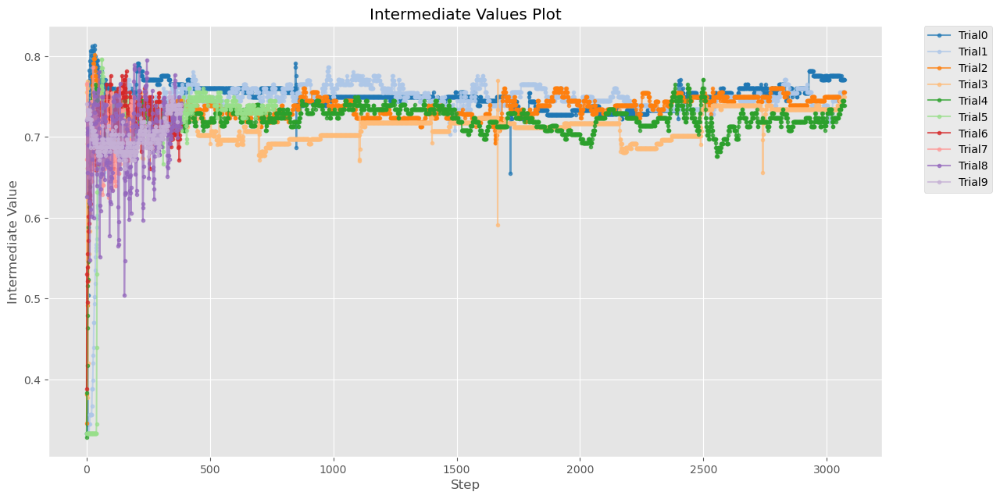

In [32]:
# Visualize the learning curves of the best 10 trials
trials = study.trials
plotted_trials = sorted(trials, key=lambda t: t.value, reverse=True)[:10]
plotted_study = optuna.create_study()
for trial in plotted_trials:
    plotted_study.add_trial(trial)
plot_intermediate_values(plotted_study)
set_size(10, 5)

/tmp/ipykernel_36455/2919792376.py:2: ExperimentalWarning: plot_parallel_coordinate is experimental (supported from v2.2.0). The interface can change in the future.
  plot_parallel_coordinate(study)


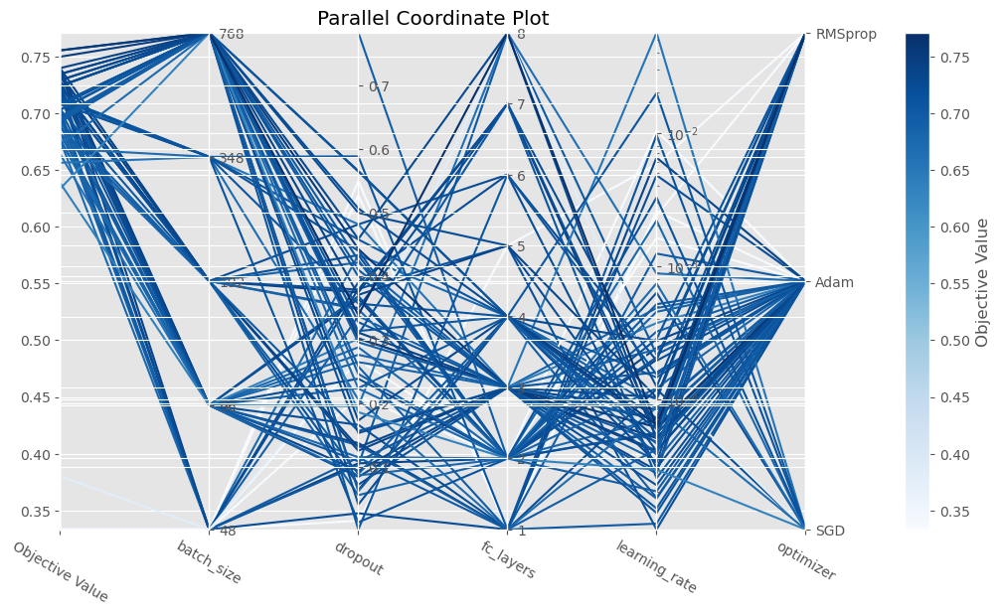

In [33]:
# Visualize high-dimensional parameter relationships.
plot_parallel_coordinate(study)
set_size(10, 5)

/tmp/ipykernel_36455/624402143.py:2: ExperimentalWarning: plot_contour is experimental (supported from v2.2.0). The interface can change in the future.
  plot_contour(study)
[W 2024-06-10 16:33:38,278] Output figures of this Matplotlib-based `plot_contour` function would be different from those of the Plotly-based `plot_contour`.


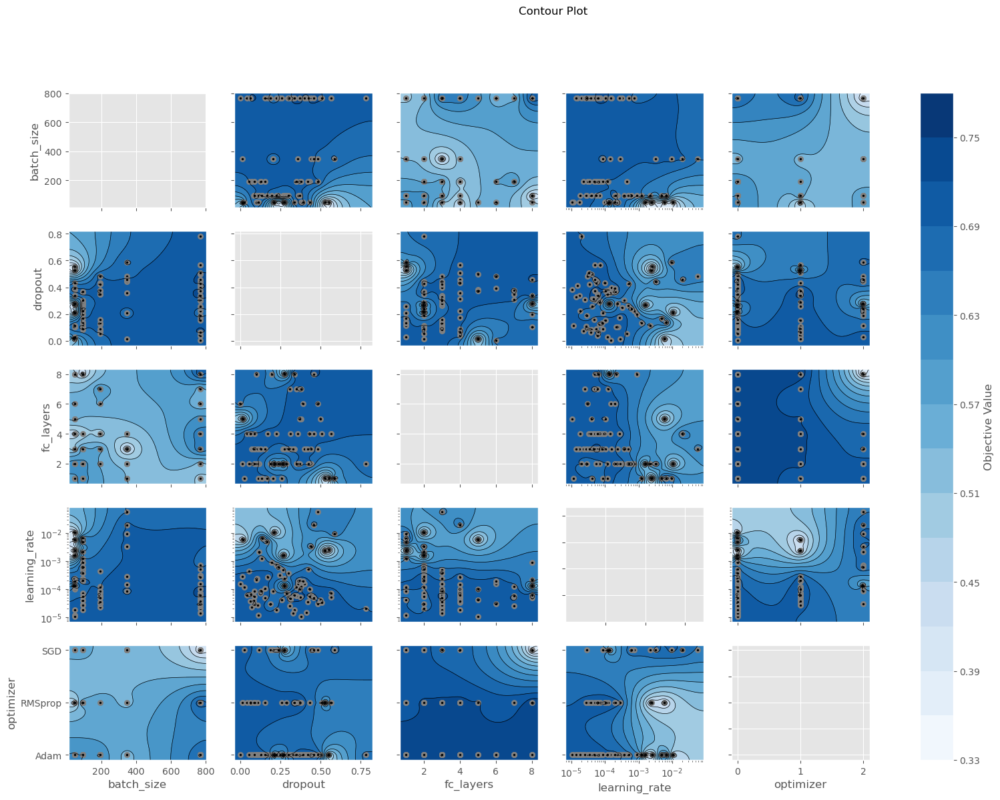

In [34]:
# Visualize hyperparameter relationships
plot_contour(study)
set_size(15, 10)

/tmp/ipykernel_36455/1888575690.py:2: ExperimentalWarning: plot_slice is experimental (supported from v2.2.0). The interface can change in the future.
  plot_slice(study)


array([<Axes: xlabel='batch_size', ylabel='Objective Value'>,
       <Axes: xlabel='dropout'>, <Axes: xlabel='fc_layers'>,
       <Axes: xlabel='learning_rate'>, <Axes: xlabel='optimizer'>],
      dtype=object)

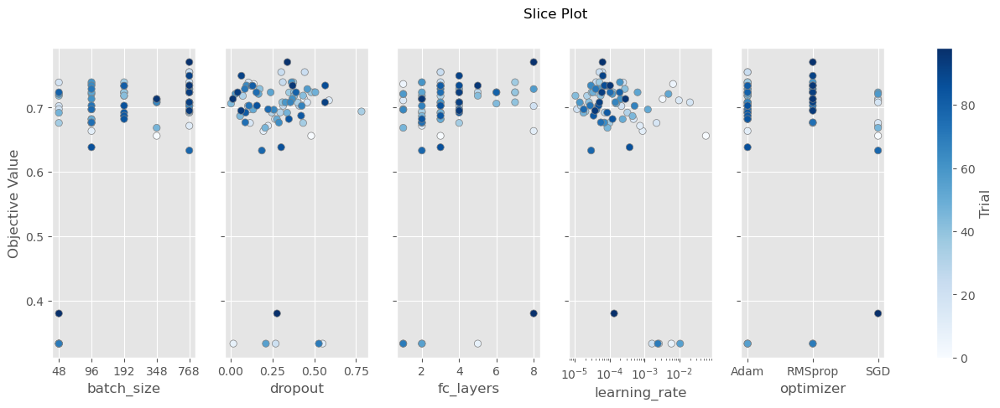

In [35]:
# Visualize individual hyperparameters as slice plot
plot_slice(study)

/tmp/ipykernel_36455/1473508994.py:2: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(study)


<Axes: title={'left': 'Hyperparameter Importances'}, xlabel='Hyperparameter Importance', ylabel='Hyperparameter'>

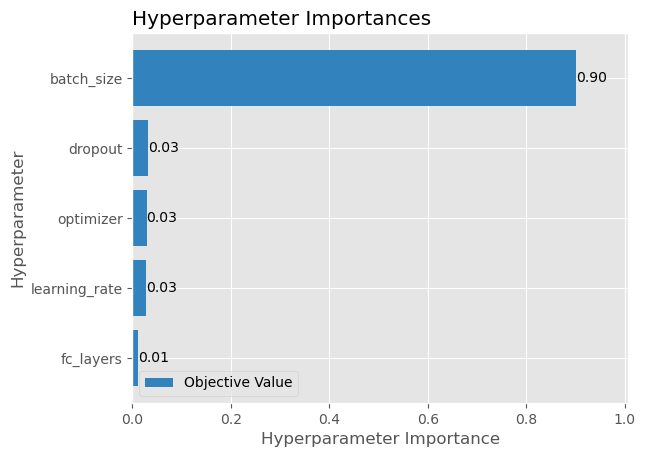

In [36]:
# Visualize parameter importances.
plot_param_importances(study)

/tmp/ipykernel_36455/3113371256.py:2: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


<Axes: title={'left': 'Hyperparameter Importances'}, xlabel='Hyperparameter Importance', ylabel='Hyperparameter'>

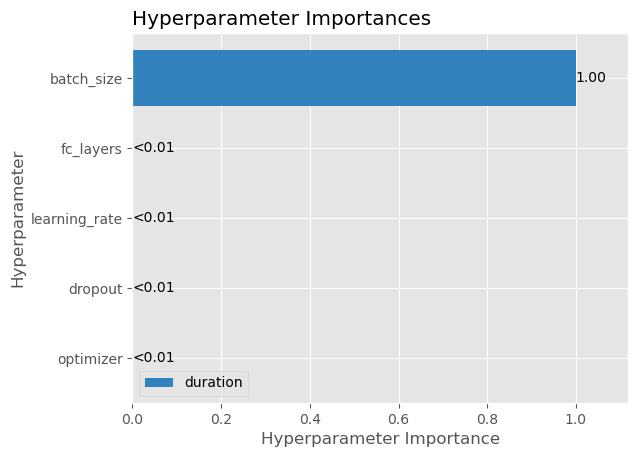

In [37]:
# Learn which hyperparameters are affecting the trial duration with hyperparameter importance.
plot_param_importances(
    study, target=lambda t: t.duration.total_seconds(), target_name="duration"
)

/tmp/ipykernel_36455/1828777839.py:2: ExperimentalWarning: plot_edf is experimental (supported from v2.2.0). The interface can change in the future.
  plot_edf(study)


<Axes: title={'center': 'Empirical Distribution Function Plot'}, xlabel='Objective Value', ylabel='Cumulative Probability'>

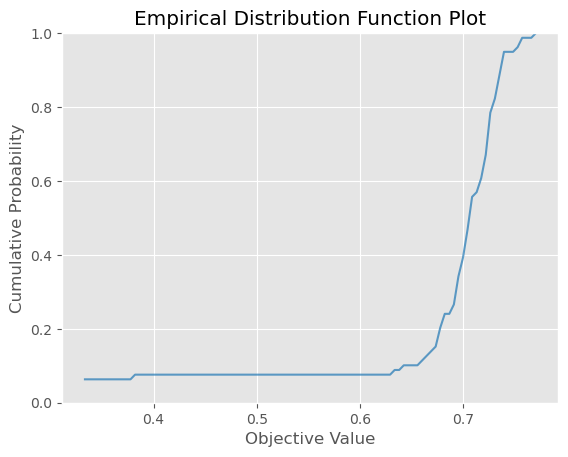

In [38]:
# Visualize empirical distribution function.
plot_edf(study)

/tmp/ipykernel_36455/1172520691.py:2: ExperimentalWarning: plot_rank is experimental (supported from v3.2.0). The interface can change in the future.
  plot_rank(study)
[W 2024-06-10 16:33:46,351] Output figures of this Matplotlib-based `plot_rank` function would be different from those of the Plotly-based `plot_rank`.


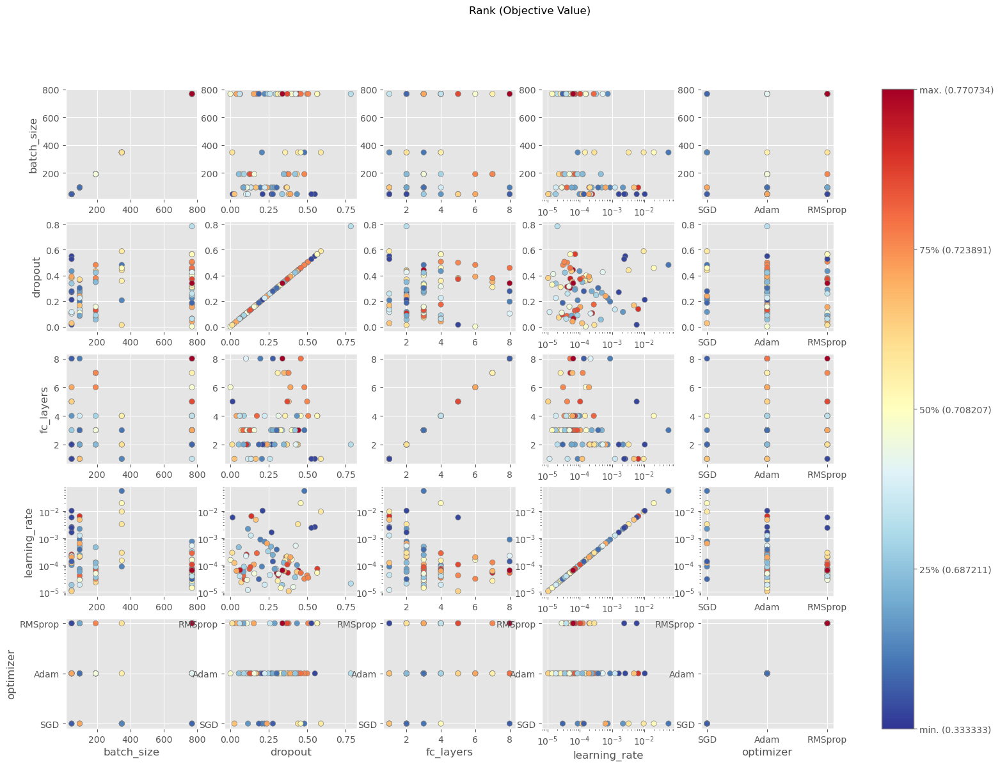

In [39]:
# Visualize parameter relations with scatter plots colored by objective values.
plot_rank(study)
set_size(15, 10)

/tmp/ipykernel_36455/124343896.py:2: ExperimentalWarning: plot_timeline is experimental (supported from v3.2.0). The interface can change in the future.
  plot_timeline(study)


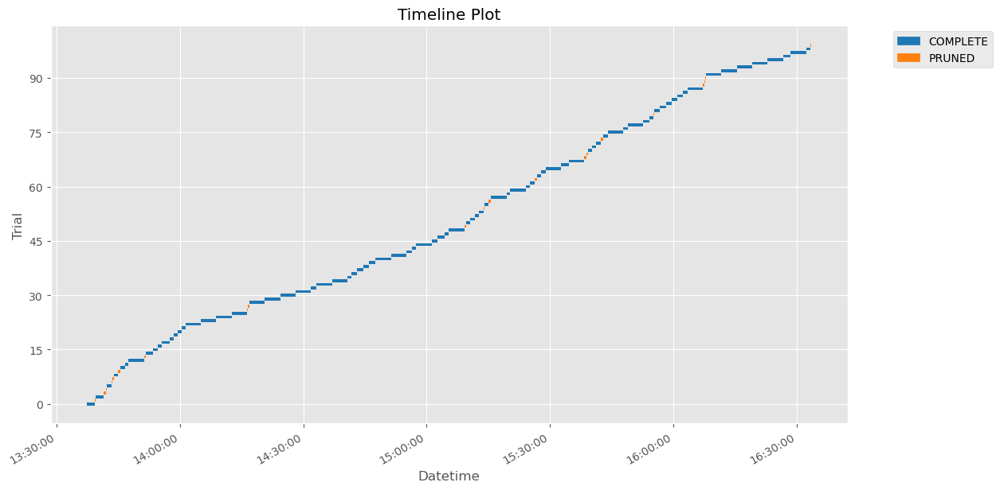

In [40]:
# Visualize the optimization timeline of performed trials.
plot_timeline(study)
set_size(10, 5)

# 2. EO feature set

In [41]:
from sklearn.model_selection import StratifiedGroupKFold

groups = [elem for elem in subjects_eo_ids for i in range(12)] # times 12 for each epoch
print(f'{len(eo_graph_dataset) = }')

X = eo_graph_dataset
Y = eo_y_list
# first splitting train/val from test
desired_test_ratio = 0.1
n_splits = int(1 / desired_test_ratio) # for some reason (?), n_splits also determines the proportion between train & test indices
sgkf = StratifiedGroupKFold(n_splits=n_splits, shuffle=False)
trainval_idxs, test_idxs = sgkf.split(X, Y, groups).__next__()

X_trainval = [X[i] for i in trainval_idxs] # X also includes y values, because they are stored in the Data object
X_test = [X[i] for i in test_idxs]
Y_trainval =[Y[i] for i in trainval_idxs]
Y_test = [Y[i] for i in test_idxs]
groups_trainval = [groups[i] for i in trainval_idxs]

# now splitting the train from the val set
desired_val_ratio = 0.20
n_splits = int(1 / desired_val_ratio) # for some reason (?), n_splits also determines the proportion between train & test indices
sgkf = StratifiedGroupKFold(n_splits=n_splits, shuffle=False)  # should shuffle be true?

train_idxs, val_idxs = sgkf.split(X_trainval, Y_trainval, groups_trainval).__next__() # just take the first split
print(f'{len(X_trainval) = }, {len(X_test) = }')
X_train = [X_trainval[i] for i in train_idxs]
X_val = [X_trainval[i] for i in val_idxs]
Y_train = [Y_trainval[i] for i in train_idxs]
Y_val = [Y_trainval[i] for i in val_idxs]
print(f'{len(X_train) = }, {len(X_val) = }, {len(X_test) = }')


len(eo_graph_dataset) = 1068
len(X_trainval) = 960, len(X_test) = 108
len(X_train) = 768, len(X_val) = 192, len(X_test) = 108


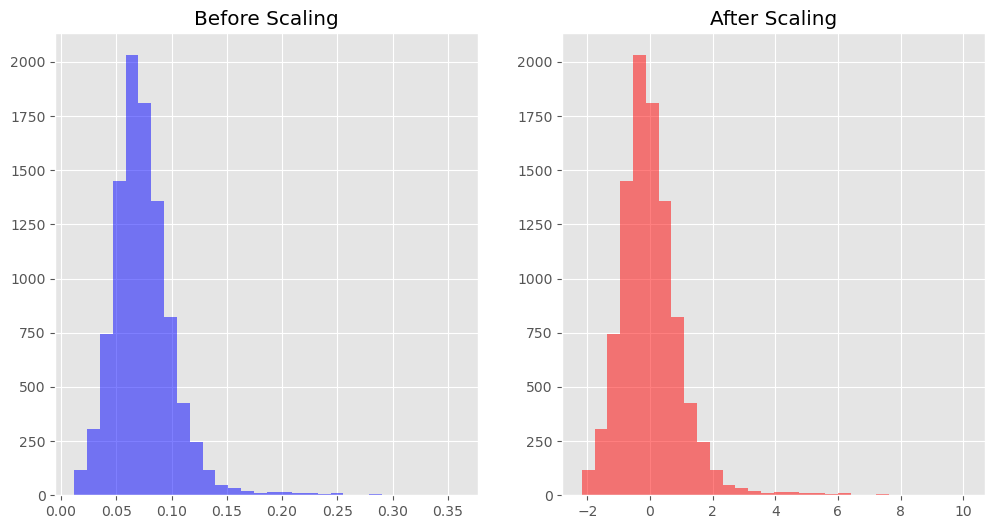

In [42]:
# standardize statistical node features
from sklearn.preprocessing import StandardScaler

# Concatenate all x values before scaling for the first feature, as a sanity check for standardization
x_before = np.concatenate([data.x.numpy()[:, 0] for data in X_train + X_val + X_test])

scaler = StandardScaler()
scaler.fit(np.vstack([data.x.numpy() for data in X_train + X_val])) # fit on training and validation data


# Transform the x values of the data in X_train
for data in X_train:
    data.x = torch.from_numpy(scaler.transform(data.x.numpy()))

# Transform the x values of the data in X_val
for data in X_val:
    data.x = torch.from_numpy(scaler.transform(data.x.numpy()))

# Transform the x values of the data in X_test
for data in X_test:
    data.x = torch.from_numpy(scaler.transform(data.x.numpy()))

# Concatenate all x values after scaling for the first feature, as a sanity check for standardization
x_after = np.concatenate([data.x.numpy()[:, 0] for data in X_train + X_val + X_test])

# Plot the distribution of the first x feature before and after scaling as a sanity check
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.hist(x_before, bins=30, color='b', alpha=0.5)
plt.title('Before Scaling')

plt.subplot(1, 2, 2)
plt.hist(x_after, bins=30, color='r', alpha=0.5)
plt.title('After Scaling')

plt.show()

### Model: graphLambda without edge_attr

In [43]:
import optuna
from optuna.integration import PyTorchLightningPruningCallback
from lightning.pytorch import Trainer
from lightning.pytorch.callbacks import RichProgressBar
import logging
import warnings

warnings.filterwarnings("ignore", ".*Consider increasing the value of the `num_workers` argument*")
warnings.filterwarnings("ignore", "Trying to infer the `batch_size` from an ambiguous collection.*")
torch.set_float32_matmul_precision('high')
logging.getLogger("lightning.pytorch.utilities.rank_zero").setLevel(logging.WARNING)
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

def objective(trial):
    # Suggest values for the hyperparameters
    learning_rate = trial.suggest_float('learning_rate', 1e-5, 1e-1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    batch_size = trial.suggest_categorical('batch_size', [48, 96, 192, 348, 768])
    fc_layers = trial.suggest_int('fc_layers', 1, 8)
    dropout = trial.suggest_float('dropout', 0, 0.8)
    hyperparameters = dict(learning_rate=learning_rate, optimizer_name=optimizer_name, batch_size=batch_size, fc_layers=fc_layers, dropout=dropout)
    print(f'Tested parameters: {hyperparameters}')
    n_epochs = batch_size * 4 # vary training epochs based on batch size

    # Create the model
    model = graphLambda_wo_edge_attr(learning_rate=learning_rate, optimizer_name=optimizer_name, fc_layers=fc_layers, dropout=dropout)

    

    # Create the PyTorch Lightning trainer
    trainer = Trainer(
        accelerator='gpu',
        devices=1,
        max_epochs=n_epochs,
        callbacks=[PyTorchLightningPruningCallback(trial, monitor="val_f1")],
        enable_progress_bar=False,
        enable_model_summary=False,
        logger=True,
        enable_checkpointing=False
    )

    # Define the data loaders
    train_loader = DataLoader(X_train, batch_size=batch_size, shuffle=True,
                              drop_last=True) # , num_workers=0, persistent_workers=True
    val_loader = DataLoader(X_val, batch_size=len(X_val), shuffle=False,
                            drop_last=True) # , num_workers=0, persistent_workers=True

    # Log the hyperparameters
    trainer.logger.log_hyperparams(hyperparameters)

    # Train the model
    trainer.fit(model, train_loader, val_loader)

    # Evaluate the model
    val_f1 = trainer.callback_metrics["val_f1"].item()

    return val_f1

study = optuna.create_study(direction='maximize', pruner=optuna.pruners.ThresholdPruner(lower=0.35, n_warmup_steps=200))
study.optimize(objective, n_trials=100)

print("Best trial:")
trial = study.best_trial

print("  Value: {}".format(trial.value))

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

df = study.trials_dataframe()
df.to_pickle('eo_ADHD_results_wo_edge_attrs_trials.pkl')

[I 2024-06-10 16:33:50,370] A new study created in memory with name: no-name-5ea028b0-ff15-4ade-835b-6f875cf06493
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (2) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Tested parameters: {'learning_rate': 0.00039843172941402796, 'optimizer_name': 'RMSprop', 'batch_size': 348, 'fc_layers': 2, 'dropout': 0.2817679675669557}


[I 2024-06-10 16:35:27,048] Trial 0 finished with value: 0.6248371601104736 and parameters: {'learning_rate': 0.00039843172941402796, 'optimizer': 'RMSprop', 'batch_size': 348, 'fc_layers': 2, 'dropout': 0.2817679675669557}. Best is trial 0 with value: 0.6248371601104736.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (4) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Tested parameters: {'learning_rate': 0.00031995248483582814, 'optimizer_name': 'Adam', 'batch_size': 192, 'fc_layers': 8, 'dropout': 0.585258828367583}


[I 2024-06-10 16:36:48,563] Trial 1 finished with value: 0.6145415306091309 and parameters: {'learning_rate': 0.00031995248483582814, 'optimizer': 'Adam', 'batch_size': 192, 'fc_layers': 8, 'dropout': 0.585258828367583}. Best is trial 0 with value: 0.6248371601104736.


Tested parameters: {'learning_rate': 0.016294829425721274, 'optimizer_name': 'Adam', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.643936736434789}


[I 2024-06-10 16:37:08,432] Trial 2 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 1.940888285151274e-05, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.3711248563967835}


[I 2024-06-10 16:38:21,868] Trial 3 finished with value: 0.5205373167991638 and parameters: {'learning_rate': 1.940888285151274e-05, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.3711248563967835}. Best is trial 0 with value: 0.6248371601104736.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (1) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Tested parameters: {'learning_rate': 0.001357338426005506, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.7534546082781296}


[I 2024-06-10 16:41:27,674] Trial 4 finished with value: 0.5942609310150146 and parameters: {'learning_rate': 0.001357338426005506, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.7534546082781296}. Best is trial 0 with value: 0.6248371601104736.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (16) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Tested parameters: {'learning_rate': 0.006726386165078964, 'optimizer_name': 'RMSprop', 'batch_size': 48, 'fc_layers': 8, 'dropout': 0.5436757949468117}


[I 2024-06-10 16:42:24,261] Trial 5 finished with value: 0.3333333432674408 and parameters: {'learning_rate': 0.006726386165078964, 'optimizer': 'RMSprop', 'batch_size': 48, 'fc_layers': 8, 'dropout': 0.5436757949468117}. Best is trial 0 with value: 0.6248371601104736.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (8) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Tested parameters: {'learning_rate': 0.00206763807255452, 'optimizer_name': 'SGD', 'batch_size': 96, 'fc_layers': 2, 'dropout': 0.43963522814365447}


[I 2024-06-10 16:43:23,288] Trial 6 finished with value: 0.6406152248382568 and parameters: {'learning_rate': 0.00206763807255452, 'optimizer': 'SGD', 'batch_size': 96, 'fc_layers': 2, 'dropout': 0.43963522814365447}. Best is trial 6 with value: 0.6406152248382568.


Tested parameters: {'learning_rate': 0.003209967181747575, 'optimizer_name': 'RMSprop', 'batch_size': 96, 'fc_layers': 6, 'dropout': 0.31053676032738153}


[I 2024-06-10 16:43:55,371] Trial 7 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.008315636632982293, 'optimizer_name': 'Adam', 'batch_size': 96, 'fc_layers': 3, 'dropout': 0.09141848191203668}


[I 2024-06-10 16:44:28,283] Trial 8 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.0011801455586222338, 'optimizer_name': 'RMSprop', 'batch_size': 48, 'fc_layers': 8, 'dropout': 0.3987552922404639}


[I 2024-06-10 16:45:24,929] Trial 9 finished with value: 0.3333333432674408 and parameters: {'learning_rate': 0.0011801455586222338, 'optimizer': 'RMSprop', 'batch_size': 48, 'fc_layers': 8, 'dropout': 0.3987552922404639}. Best is trial 6 with value: 0.6406152248382568.


Tested parameters: {'learning_rate': 4.694622484266019e-05, 'optimizer_name': 'SGD', 'batch_size': 96, 'fc_layers': 1, 'dropout': 0.04145514149946067}


[I 2024-06-10 16:46:23,165] Trial 10 finished with value: 0.5949921607971191 and parameters: {'learning_rate': 4.694622484266019e-05, 'optimizer': 'SGD', 'batch_size': 96, 'fc_layers': 1, 'dropout': 0.04145514149946067}. Best is trial 6 with value: 0.6406152248382568.


Tested parameters: {'learning_rate': 0.09102936876290027, 'optimizer_name': 'RMSprop', 'batch_size': 348, 'fc_layers': 2, 'dropout': 0.1891981218710238}


[I 2024-06-10 16:46:37,980] Trial 11 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.00017313636576302325, 'optimizer_name': 'SGD', 'batch_size': 348, 'fc_layers': 2, 'dropout': 0.22787869628273993}


[I 2024-06-10 16:48:15,426] Trial 12 finished with value: 0.5907114744186401 and parameters: {'learning_rate': 0.00017313636576302325, 'optimizer': 'SGD', 'batch_size': 348, 'fc_layers': 2, 'dropout': 0.22787869628273993}. Best is trial 6 with value: 0.6406152248382568.


Tested parameters: {'learning_rate': 0.000278725565776415, 'optimizer_name': 'SGD', 'batch_size': 348, 'fc_layers': 6, 'dropout': 0.485213598328987}


[I 2024-06-10 16:48:43,041] Trial 13 pruned. Trial was pruned at epoch 388.


Tested parameters: {'learning_rate': 0.0001395290859385289, 'optimizer_name': 'RMSprop', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.24587322227348682}


[I 2024-06-10 16:51:52,965] Trial 14 finished with value: 0.6406152248382568 and parameters: {'learning_rate': 0.0001395290859385289, 'optimizer': 'RMSprop', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.24587322227348682}. Best is trial 6 with value: 0.6406152248382568.


Tested parameters: {'learning_rate': 8.064525220978521e-05, 'optimizer_name': 'RMSprop', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.46789315030575435}


[I 2024-06-10 16:55:03,491] Trial 15 finished with value: 0.6196988224983215 and parameters: {'learning_rate': 8.064525220978521e-05, 'optimizer': 'RMSprop', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.46789315030575435}. Best is trial 6 with value: 0.6406152248382568.


Tested parameters: {'learning_rate': 1.211970526500954e-05, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.14592436789106034}


[I 2024-06-10 16:58:14,961] Trial 16 finished with value: 0.41818180680274963 and parameters: {'learning_rate': 1.211970526500954e-05, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.14592436789106034}. Best is trial 6 with value: 0.6406152248382568.


Tested parameters: {'learning_rate': 5.877689506629272e-05, 'optimizer_name': 'RMSprop', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.35839151924306883}


[I 2024-06-10 17:01:23,637] Trial 17 finished with value: 0.6770833134651184 and parameters: {'learning_rate': 5.877689506629272e-05, 'optimizer': 'RMSprop', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.35839151924306883}. Best is trial 17 with value: 0.6770833134651184.


Tested parameters: {'learning_rate': 0.03965332008664393, 'optimizer_name': 'SGD', 'batch_size': 96, 'fc_layers': 5, 'dropout': 0.676490529899539}


[I 2024-06-10 17:01:54,830] Trial 18 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 3.321572815891631e-05, 'optimizer_name': 'Adam', 'batch_size': 96, 'fc_layers': 1, 'dropout': 0.46042785012723186}


[I 2024-06-10 17:02:53,490] Trial 19 finished with value: 0.582608699798584 and parameters: {'learning_rate': 3.321572815891631e-05, 'optimizer': 'Adam', 'batch_size': 96, 'fc_layers': 1, 'dropout': 0.46042785012723186}. Best is trial 17 with value: 0.6770833134651184.


Tested parameters: {'learning_rate': 0.0024763061951037246, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.3374701702724013}


[I 2024-06-10 17:06:03,057] Trial 20 finished with value: 0.6403810977935791 and parameters: {'learning_rate': 0.0024763061951037246, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.3374701702724013}. Best is trial 17 with value: 0.6770833134651184.


Tested parameters: {'learning_rate': 8.360514331588522e-05, 'optimizer_name': 'RMSprop', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.2554117796758137}


[I 2024-06-10 17:09:16,153] Trial 21 finished with value: 0.6510322093963623 and parameters: {'learning_rate': 8.360514331588522e-05, 'optimizer': 'RMSprop', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.2554117796758137}. Best is trial 17 with value: 0.6770833134651184.


Tested parameters: {'learning_rate': 0.0006643653358139517, 'optimizer_name': 'RMSprop', 'batch_size': 768, 'fc_layers': 2, 'dropout': 0.42189306105724494}


[I 2024-06-10 17:12:24,023] Trial 22 finished with value: 0.6085147857666016 and parameters: {'learning_rate': 0.0006643653358139517, 'optimizer': 'RMSprop', 'batch_size': 768, 'fc_layers': 2, 'dropout': 0.42189306105724494}. Best is trial 17 with value: 0.6770833134651184.


Tested parameters: {'learning_rate': 0.0001115450422684759, 'optimizer_name': 'RMSprop', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.14263100450943472}


[I 2024-06-10 17:15:33,758] Trial 23 finished with value: 0.6562126874923706 and parameters: {'learning_rate': 0.0001115450422684759, 'optimizer': 'RMSprop', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.14263100450943472}. Best is trial 17 with value: 0.6770833134651184.


Tested parameters: {'learning_rate': 7.496381366401611e-05, 'optimizer_name': 'RMSprop', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.0044473127681715074}


[I 2024-06-10 17:18:42,734] Trial 24 finished with value: 0.6612285375595093 and parameters: {'learning_rate': 7.496381366401611e-05, 'optimizer': 'RMSprop', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.0044473127681715074}. Best is trial 17 with value: 0.6770833134651184.


Tested parameters: {'learning_rate': 3.417554067734629e-05, 'optimizer_name': 'RMSprop', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.009945373350987254}


[I 2024-06-10 17:21:52,103] Trial 25 finished with value: 0.6510322093963623 and parameters: {'learning_rate': 3.417554067734629e-05, 'optimizer': 'RMSprop', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.009945373350987254}. Best is trial 17 with value: 0.6770833134651184.


Tested parameters: {'learning_rate': 8.02670291753606e-05, 'optimizer_name': 'RMSprop', 'batch_size': 768, 'fc_layers': 6, 'dropout': 0.07166541308300939}


[I 2024-06-10 17:25:03,599] Trial 26 finished with value: 0.6350603699684143 and parameters: {'learning_rate': 8.02670291753606e-05, 'optimizer': 'RMSprop', 'batch_size': 768, 'fc_layers': 6, 'dropout': 0.07166541308300939}. Best is trial 17 with value: 0.6770833134651184.


Tested parameters: {'learning_rate': 2.1892394828419985e-05, 'optimizer_name': 'RMSprop', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.1355579374232376}


[I 2024-06-10 17:28:13,455] Trial 27 finished with value: 0.6401466727256775 and parameters: {'learning_rate': 2.1892394828419985e-05, 'optimizer': 'RMSprop', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.1355579374232376}. Best is trial 17 with value: 0.6770833134651184.


Tested parameters: {'learning_rate': 0.00015632575295618383, 'optimizer_name': 'RMSprop', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.11956117697072095}


[I 2024-06-10 17:31:23,407] Trial 28 finished with value: 0.682214081287384 and parameters: {'learning_rate': 0.00015632575295618383, 'optimizer': 'RMSprop', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.11956117697072095}. Best is trial 28 with value: 0.682214081287384.


Tested parameters: {'learning_rate': 0.0006729405510667835, 'optimizer_name': 'RMSprop', 'batch_size': 48, 'fc_layers': 7, 'dropout': 0.01191698667585845}


[I 2024-06-10 17:32:20,969] Trial 29 finished with value: 0.6405372619628906 and parameters: {'learning_rate': 0.0006729405510667835, 'optimizer': 'RMSprop', 'batch_size': 48, 'fc_layers': 7, 'dropout': 0.01191698667585845}. Best is trial 28 with value: 0.682214081287384.


Tested parameters: {'learning_rate': 0.00023494383845537177, 'optimizer_name': 'RMSprop', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.09336118934720083}


[I 2024-06-10 17:35:31,791] Trial 30 finished with value: 0.6613755822181702 and parameters: {'learning_rate': 0.00023494383845537177, 'optimizer': 'RMSprop', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.09336118934720083}. Best is trial 28 with value: 0.682214081287384.


Tested parameters: {'learning_rate': 0.00025440623259782516, 'optimizer_name': 'RMSprop', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.10602166659749092}


[I 2024-06-10 17:38:43,906] Trial 31 finished with value: 0.5986862182617188 and parameters: {'learning_rate': 0.00025440623259782516, 'optimizer': 'RMSprop', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.10602166659749092}. Best is trial 28 with value: 0.682214081287384.


Tested parameters: {'learning_rate': 0.00048677745928544505, 'optimizer_name': 'RMSprop', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.18097269357845414}


[I 2024-06-10 17:38:56,151] Trial 32 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 5.420104069202536e-05, 'optimizer_name': 'RMSprop', 'batch_size': 192, 'fc_layers': 5, 'dropout': 0.0608951524087333}


[I 2024-06-10 17:39:16,270] Trial 33 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.0001814167590991756, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.20094291536254766}


[I 2024-06-10 17:42:25,985] Trial 34 finished with value: 0.6765217781066895 and parameters: {'learning_rate': 0.0001814167590991756, 'optimizer': 'Adam', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.20094291536254766}. Best is trial 28 with value: 0.682214081287384.


Tested parameters: {'learning_rate': 0.00019398225110541209, 'optimizer_name': 'Adam', 'batch_size': 192, 'fc_layers': 6, 'dropout': 0.19615574984392278}


[I 2024-06-10 17:43:43,087] Trial 35 finished with value: 0.6922993659973145 and parameters: {'learning_rate': 0.00019398225110541209, 'optimizer': 'Adam', 'batch_size': 192, 'fc_layers': 6, 'dropout': 0.19615574984392278}. Best is trial 35 with value: 0.6922993659973145.


Tested parameters: {'learning_rate': 0.00039460117006584916, 'optimizer_name': 'Adam', 'batch_size': 192, 'fc_layers': 7, 'dropout': 0.28312666771678674}


[I 2024-06-10 17:45:03,188] Trial 36 finished with value: 0.650577187538147 and parameters: {'learning_rate': 0.00039460117006584916, 'optimizer': 'Adam', 'batch_size': 192, 'fc_layers': 7, 'dropout': 0.28312666771678674}. Best is trial 35 with value: 0.6922993659973145.


Tested parameters: {'learning_rate': 0.00015834921291282987, 'optimizer_name': 'Adam', 'batch_size': 192, 'fc_layers': 7, 'dropout': 0.3580694704262439}


[I 2024-06-10 17:46:25,003] Trial 37 finished with value: 0.6249592900276184 and parameters: {'learning_rate': 0.00015834921291282987, 'optimizer': 'Adam', 'batch_size': 192, 'fc_layers': 7, 'dropout': 0.3580694704262439}. Best is trial 35 with value: 0.6922993659973145.


Tested parameters: {'learning_rate': 1.0843985671831921e-05, 'optimizer_name': 'Adam', 'batch_size': 192, 'fc_layers': 6, 'dropout': 0.20038220893572115}


[I 2024-06-10 17:47:43,085] Trial 38 finished with value: 0.6246334314346313 and parameters: {'learning_rate': 1.0843985671831921e-05, 'optimizer': 'Adam', 'batch_size': 192, 'fc_layers': 6, 'dropout': 0.20038220893572115}. Best is trial 35 with value: 0.6922993659973145.


Tested parameters: {'learning_rate': 2.3285337881968655e-05, 'optimizer_name': 'Adam', 'batch_size': 192, 'fc_layers': 3, 'dropout': 0.29440239255716405}


[I 2024-06-10 17:48:58,723] Trial 39 finished with value: 0.6454871296882629 and parameters: {'learning_rate': 2.3285337881968655e-05, 'optimizer': 'Adam', 'batch_size': 192, 'fc_layers': 3, 'dropout': 0.29440239255716405}. Best is trial 35 with value: 0.6922993659973145.


Tested parameters: {'learning_rate': 0.0007231338062182134, 'optimizer_name': 'Adam', 'batch_size': 48, 'fc_layers': 4, 'dropout': 0.5306811622404974}


[I 2024-06-10 17:49:52,940] Trial 40 finished with value: 0.3333333432674408 and parameters: {'learning_rate': 0.0007231338062182134, 'optimizer': 'Adam', 'batch_size': 48, 'fc_layers': 4, 'dropout': 0.5306811622404974}. Best is trial 35 with value: 0.6922993659973145.


Tested parameters: {'learning_rate': 0.00027143439634940347, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.11253293247373734}


[I 2024-06-10 17:53:03,767] Trial 41 finished with value: 0.6559139490127563 and parameters: {'learning_rate': 0.00027143439634940347, 'optimizer': 'Adam', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.11253293247373734}. Best is trial 35 with value: 0.6922993659973145.


Tested parameters: {'learning_rate': 0.00019291332144237826, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 6, 'dropout': 0.2208714806246053}


[I 2024-06-10 17:56:15,097] Trial 42 finished with value: 0.6666305065155029 and parameters: {'learning_rate': 0.00019291332144237826, 'optimizer': 'Adam', 'batch_size': 768, 'fc_layers': 6, 'dropout': 0.2208714806246053}. Best is trial 35 with value: 0.6922993659973145.


Tested parameters: {'learning_rate': 4.618031350600096e-05, 'optimizer_name': 'Adam', 'batch_size': 192, 'fc_layers': 6, 'dropout': 0.20699801564129133}


[I 2024-06-10 17:57:33,273] Trial 43 finished with value: 0.65625 and parameters: {'learning_rate': 4.618031350600096e-05, 'optimizer': 'Adam', 'batch_size': 192, 'fc_layers': 6, 'dropout': 0.20699801564129133}. Best is trial 35 with value: 0.6922993659973145.


Tested parameters: {'learning_rate': 0.00017662035420537328, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 7, 'dropout': 0.31977626189616004}


[I 2024-06-10 18:00:45,718] Trial 44 finished with value: 0.65625 and parameters: {'learning_rate': 0.00017662035420537328, 'optimizer': 'Adam', 'batch_size': 768, 'fc_layers': 7, 'dropout': 0.31977626189616004}. Best is trial 35 with value: 0.6922993659973145.


Tested parameters: {'learning_rate': 0.0014452699236983217, 'optimizer_name': 'Adam', 'batch_size': 348, 'fc_layers': 4, 'dropout': 0.16071490074731182}


[I 2024-06-10 18:02:22,940] Trial 45 finished with value: 0.6196988224983215 and parameters: {'learning_rate': 0.0014452699236983217, 'optimizer': 'Adam', 'batch_size': 348, 'fc_layers': 4, 'dropout': 0.16071490074731182}. Best is trial 35 with value: 0.6922993659973145.


Tested parameters: {'learning_rate': 0.00041244289911475385, 'optimizer_name': 'Adam', 'batch_size': 48, 'fc_layers': 6, 'dropout': 0.25029165955614374}


[I 2024-06-10 18:03:17,719] Trial 46 finished with value: 0.6509564518928528 and parameters: {'learning_rate': 0.00041244289911475385, 'optimizer': 'Adam', 'batch_size': 48, 'fc_layers': 6, 'dropout': 0.25029165955614374}. Best is trial 35 with value: 0.6922993659973145.


Tested parameters: {'learning_rate': 0.00011480925791921596, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.38679282169114576}


[I 2024-06-10 18:06:26,498] Trial 47 finished with value: 0.6612285375595093 and parameters: {'learning_rate': 0.00011480925791921596, 'optimizer': 'Adam', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.38679282169114576}. Best is trial 35 with value: 0.6922993659973145.


Tested parameters: {'learning_rate': 0.00018855606041361797, 'optimizer_name': 'Adam', 'batch_size': 192, 'fc_layers': 8, 'dropout': 0.2161548456438001}


[I 2024-06-10 18:07:44,551] Trial 48 finished with value: 0.6352582573890686 and parameters: {'learning_rate': 0.00018855606041361797, 'optimizer': 'Adam', 'batch_size': 192, 'fc_layers': 8, 'dropout': 0.2161548456438001}. Best is trial 35 with value: 0.6922993659973145.


Tested parameters: {'learning_rate': 0.000998951134608306, 'optimizer_name': 'Adam', 'batch_size': 348, 'fc_layers': 3, 'dropout': 0.26446567624348905}


[I 2024-06-10 18:09:21,380] Trial 49 finished with value: 0.6603434681892395 and parameters: {'learning_rate': 0.000998951134608306, 'optimizer': 'Adam', 'batch_size': 348, 'fc_layers': 3, 'dropout': 0.26446567624348905}. Best is trial 35 with value: 0.6922993659973145.


Tested parameters: {'learning_rate': 5.7310016799398486e-05, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.7640650002046013}


[I 2024-06-10 18:09:34,183] Trial 50 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.00024917982511951826, 'optimizer_name': 'RMSprop', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.17617564136742458}


[I 2024-06-10 18:12:44,247] Trial 51 finished with value: 0.6562126874923706 and parameters: {'learning_rate': 0.00024917982511951826, 'optimizer': 'RMSprop', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.17617564136742458}. Best is trial 35 with value: 0.6922993659973145.


Tested parameters: {'learning_rate': 9.888327740810019e-05, 'optimizer_name': 'RMSprop', 'batch_size': 768, 'fc_layers': 6, 'dropout': 0.11384513211930053}


[I 2024-06-10 18:15:56,221] Trial 52 finished with value: 0.635377049446106 and parameters: {'learning_rate': 9.888327740810019e-05, 'optimizer': 'RMSprop', 'batch_size': 768, 'fc_layers': 6, 'dropout': 0.11384513211930053}. Best is trial 35 with value: 0.6922993659973145.


Tested parameters: {'learning_rate': 0.00018969423078513757, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.05808255062824201}


[I 2024-06-10 18:19:06,480] Trial 53 finished with value: 0.6926999688148499 and parameters: {'learning_rate': 0.00018969423078513757, 'optimizer': 'Adam', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.05808255062824201}. Best is trial 53 with value: 0.6926999688148499.


Tested parameters: {'learning_rate': 0.00012889048916123904, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 6, 'dropout': 0.04427212374468159}


[I 2024-06-10 18:22:18,535] Trial 54 finished with value: 0.6873643398284912 and parameters: {'learning_rate': 0.00012889048916123904, 'optimizer': 'Adam', 'batch_size': 768, 'fc_layers': 6, 'dropout': 0.04427212374468159}. Best is trial 53 with value: 0.6926999688148499.


Tested parameters: {'learning_rate': 3.4780346194368544e-05, 'optimizer_name': 'Adam', 'batch_size': 96, 'fc_layers': 4, 'dropout': 0.04385626694815227}


[I 2024-06-10 18:23:20,449] Trial 55 finished with value: 0.6770833134651184 and parameters: {'learning_rate': 3.4780346194368544e-05, 'optimizer': 'Adam', 'batch_size': 96, 'fc_layers': 4, 'dropout': 0.04385626694815227}. Best is trial 53 with value: 0.6926999688148499.


Tested parameters: {'learning_rate': 1.3862314746712475e-05, 'optimizer_name': 'Adam', 'batch_size': 96, 'fc_layers': 5, 'dropout': 0.04221970585283727}


[I 2024-06-10 18:24:22,167] Trial 56 finished with value: 0.6770482659339905 and parameters: {'learning_rate': 1.3862314746712475e-05, 'optimizer': 'Adam', 'batch_size': 96, 'fc_layers': 5, 'dropout': 0.04221970585283727}. Best is trial 53 with value: 0.6926999688148499.


Tested parameters: {'learning_rate': 4.050739134029598e-05, 'optimizer_name': 'Adam', 'batch_size': 96, 'fc_layers': 7, 'dropout': 0.04267973872807895}


[I 2024-06-10 18:25:25,051] Trial 57 finished with value: 0.6714382767677307 and parameters: {'learning_rate': 4.050739134029598e-05, 'optimizer': 'Adam', 'batch_size': 96, 'fc_layers': 7, 'dropout': 0.04267973872807895}. Best is trial 53 with value: 0.6926999688148499.


Tested parameters: {'learning_rate': 2.731016214762718e-05, 'optimizer_name': 'SGD', 'batch_size': 96, 'fc_layers': 4, 'dropout': 0.07046403722811087}


[I 2024-06-10 18:26:24,428] Trial 58 finished with value: 0.5483603477478027 and parameters: {'learning_rate': 2.731016214762718e-05, 'optimizer': 'SGD', 'batch_size': 96, 'fc_layers': 4, 'dropout': 0.07046403722811087}. Best is trial 53 with value: 0.6926999688148499.


Tested parameters: {'learning_rate': 1.681953550288766e-05, 'optimizer_name': 'Adam', 'batch_size': 96, 'fc_layers': 2, 'dropout': 0.03214892534827296}


[I 2024-06-10 18:27:24,206] Trial 59 finished with value: 0.6509564518928528 and parameters: {'learning_rate': 1.681953550288766e-05, 'optimizer': 'Adam', 'batch_size': 96, 'fc_layers': 2, 'dropout': 0.03214892534827296}. Best is trial 53 with value: 0.6926999688148499.


Tested parameters: {'learning_rate': 0.004890028468618107, 'optimizer_name': 'Adam', 'batch_size': 96, 'fc_layers': 3, 'dropout': 0.13327214614409016}


[I 2024-06-10 18:27:55,494] Trial 60 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 1.7056985955146462e-05, 'optimizer_name': 'Adam', 'batch_size': 96, 'fc_layers': 5, 'dropout': 0.04436620675692378}


[I 2024-06-10 18:28:57,522] Trial 61 finished with value: 0.5909091234207153 and parameters: {'learning_rate': 1.7056985955146462e-05, 'optimizer': 'Adam', 'batch_size': 96, 'fc_layers': 5, 'dropout': 0.04436620675692378}. Best is trial 53 with value: 0.6926999688148499.


Tested parameters: {'learning_rate': 6.0112303129498685e-05, 'optimizer_name': 'Adam', 'batch_size': 96, 'fc_layers': 5, 'dropout': 0.08152793906772007}


[I 2024-06-10 18:29:59,387] Trial 62 finished with value: 0.6561007499694824 and parameters: {'learning_rate': 6.0112303129498685e-05, 'optimizer': 'Adam', 'batch_size': 96, 'fc_layers': 5, 'dropout': 0.08152793906772007}. Best is trial 53 with value: 0.6926999688148499.


Tested parameters: {'learning_rate': 0.0001255113560946935, 'optimizer_name': 'Adam', 'batch_size': 96, 'fc_layers': 6, 'dropout': 0.029845387986520165}


[I 2024-06-10 18:31:05,529] Trial 63 finished with value: 0.60936439037323 and parameters: {'learning_rate': 0.0001255113560946935, 'optimizer': 'Adam', 'batch_size': 96, 'fc_layers': 6, 'dropout': 0.029845387986520165}. Best is trial 53 with value: 0.6926999688148499.


Tested parameters: {'learning_rate': 1.5350093364864404e-05, 'optimizer_name': 'Adam', 'batch_size': 96, 'fc_layers': 5, 'dropout': 0.6074205898645008}


[I 2024-06-10 18:31:37,914] Trial 64 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 3.0156635705680493e-05, 'optimizer_name': 'Adam', 'batch_size': 348, 'fc_layers': 6, 'dropout': 0.06329646663106056}


[I 2024-06-10 18:33:16,689] Trial 65 finished with value: 0.6822830438613892 and parameters: {'learning_rate': 3.0156635705680493e-05, 'optimizer': 'Adam', 'batch_size': 348, 'fc_layers': 6, 'dropout': 0.06329646663106056}. Best is trial 53 with value: 0.6926999688148499.


Tested parameters: {'learning_rate': 6.83644780121621e-05, 'optimizer_name': 'SGD', 'batch_size': 348, 'fc_layers': 6, 'dropout': 0.09139966323097687}


[I 2024-06-10 18:34:53,805] Trial 66 finished with value: 0.40710240602493286 and parameters: {'learning_rate': 6.83644780121621e-05, 'optimizer': 'SGD', 'batch_size': 348, 'fc_layers': 6, 'dropout': 0.09139966323097687}. Best is trial 53 with value: 0.6926999688148499.


Tested parameters: {'learning_rate': 3.425247637067822e-05, 'optimizer_name': 'Adam', 'batch_size': 348, 'fc_layers': 7, 'dropout': 0.7160706822360297}


[I 2024-06-10 18:35:08,002] Trial 67 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 9.079189945445587e-05, 'optimizer_name': 'RMSprop', 'batch_size': 348, 'fc_layers': 6, 'dropout': 0.058653202744342006}


[I 2024-06-10 18:36:45,949] Trial 68 finished with value: 0.6871945261955261 and parameters: {'learning_rate': 9.079189945445587e-05, 'optimizer': 'RMSprop', 'batch_size': 348, 'fc_layers': 6, 'dropout': 0.058653202744342006}. Best is trial 53 with value: 0.6926999688148499.


Tested parameters: {'learning_rate': 9.245228292914806e-05, 'optimizer_name': 'RMSprop', 'batch_size': 348, 'fc_layers': 6, 'dropout': 0.15588165699646805}


[I 2024-06-10 18:38:24,182] Trial 69 finished with value: 0.6822830438613892 and parameters: {'learning_rate': 9.245228292914806e-05, 'optimizer': 'RMSprop', 'batch_size': 348, 'fc_layers': 6, 'dropout': 0.15588165699646805}. Best is trial 53 with value: 0.6926999688148499.


Tested parameters: {'learning_rate': 0.0003495901699246789, 'optimizer_name': 'RMSprop', 'batch_size': 348, 'fc_layers': 6, 'dropout': 0.1637270953935618}


[I 2024-06-10 18:38:38,491] Trial 70 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.00010955639090484618, 'optimizer_name': 'RMSprop', 'batch_size': 348, 'fc_layers': 6, 'dropout': 0.12748874936689553}


[I 2024-06-10 18:40:17,176] Trial 71 finished with value: 0.6406152248382568 and parameters: {'learning_rate': 0.00010955639090484618, 'optimizer': 'RMSprop', 'batch_size': 348, 'fc_layers': 6, 'dropout': 0.12748874936689553}. Best is trial 53 with value: 0.6926999688148499.


Tested parameters: {'learning_rate': 9.467502137789212e-05, 'optimizer_name': 'RMSprop', 'batch_size': 348, 'fc_layers': 6, 'dropout': 0.007346530695070755}


[I 2024-06-10 18:41:54,904] Trial 72 finished with value: 0.661449134349823 and parameters: {'learning_rate': 9.467502137789212e-05, 'optimizer': 'RMSprop', 'batch_size': 348, 'fc_layers': 6, 'dropout': 0.007346530695070755}. Best is trial 53 with value: 0.6926999688148499.


Tested parameters: {'learning_rate': 0.0001376437031534476, 'optimizer_name': 'RMSprop', 'batch_size': 348, 'fc_layers': 7, 'dropout': 0.06717460479037071}


[I 2024-06-10 18:43:36,803] Trial 73 finished with value: 0.5624525547027588 and parameters: {'learning_rate': 0.0001376437031534476, 'optimizer': 'RMSprop', 'batch_size': 348, 'fc_layers': 7, 'dropout': 0.06717460479037071}. Best is trial 53 with value: 0.6926999688148499.


Tested parameters: {'learning_rate': 0.01663499058811829, 'optimizer_name': 'RMSprop', 'batch_size': 348, 'fc_layers': 6, 'dropout': 0.10428899260362418}


[I 2024-06-10 18:43:51,014] Trial 74 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 7.589471032149704e-05, 'optimizer_name': 'RMSprop', 'batch_size': 348, 'fc_layers': 7, 'dropout': 0.15972493053891412}


[I 2024-06-10 18:45:30,305] Trial 75 finished with value: 0.6562126874923706 and parameters: {'learning_rate': 7.589471032149704e-05, 'optimizer': 'RMSprop', 'batch_size': 348, 'fc_layers': 7, 'dropout': 0.15972493053891412}. Best is trial 53 with value: 0.6926999688148499.


Tested parameters: {'learning_rate': 0.0004812174005935683, 'optimizer_name': 'RMSprop', 'batch_size': 348, 'fc_layers': 6, 'dropout': 0.1259040112781229}


[I 2024-06-10 18:47:10,525] Trial 76 finished with value: 0.6195336580276489 and parameters: {'learning_rate': 0.0004812174005935683, 'optimizer': 'RMSprop', 'batch_size': 348, 'fc_layers': 6, 'dropout': 0.1259040112781229}. Best is trial 53 with value: 0.6926999688148499.


Tested parameters: {'learning_rate': 4.6303078209213906e-05, 'optimizer_name': 'RMSprop', 'batch_size': 348, 'fc_layers': 6, 'dropout': 0.06250231908883686}


[I 2024-06-10 18:48:49,078] Trial 77 finished with value: 0.6301982998847961 and parameters: {'learning_rate': 4.6303078209213906e-05, 'optimizer': 'RMSprop', 'batch_size': 348, 'fc_layers': 6, 'dropout': 0.06250231908883686}. Best is trial 53 with value: 0.6926999688148499.


Tested parameters: {'learning_rate': 2.6479540216611203e-05, 'optimizer_name': 'RMSprop', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.08653290951552348}


[I 2024-06-10 18:51:59,627] Trial 78 finished with value: 0.661449134349823 and parameters: {'learning_rate': 2.6479540216611203e-05, 'optimizer': 'RMSprop', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.08653290951552348}. Best is trial 53 with value: 0.6926999688148499.


Tested parameters: {'learning_rate': 0.00013221822305440142, 'optimizer_name': 'RMSprop', 'batch_size': 192, 'fc_layers': 7, 'dropout': 0.4943572976402209}


[I 2024-06-10 18:53:18,699] Trial 79 finished with value: 0.6350603699684143 and parameters: {'learning_rate': 0.00013221822305440142, 'optimizer': 'RMSprop', 'batch_size': 192, 'fc_layers': 7, 'dropout': 0.4943572976402209}. Best is trial 53 with value: 0.6926999688148499.


Tested parameters: {'learning_rate': 0.00022137728250247023, 'optimizer_name': 'SGD', 'batch_size': 48, 'fc_layers': 6, 'dropout': 0.14861979797062955}


[I 2024-06-10 18:54:14,876] Trial 80 finished with value: 0.5671329498291016 and parameters: {'learning_rate': 0.00022137728250247023, 'optimizer': 'SGD', 'batch_size': 48, 'fc_layers': 6, 'dropout': 0.14861979797062955}. Best is trial 53 with value: 0.6926999688148499.


Tested parameters: {'learning_rate': 6.770251500754605e-05, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.05898893763288446}


[I 2024-06-10 18:57:23,024] Trial 81 finished with value: 0.6197813749313354 and parameters: {'learning_rate': 6.770251500754605e-05, 'optimizer': 'Adam', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.05898893763288446}. Best is trial 53 with value: 0.6926999688148499.


Tested parameters: {'learning_rate': 3.9323027293820215e-05, 'optimizer_name': 'RMSprop', 'batch_size': 348, 'fc_layers': 5, 'dropout': 0.01464670181542431}


[I 2024-06-10 18:59:01,610] Trial 82 finished with value: 0.6874660849571228 and parameters: {'learning_rate': 3.9323027293820215e-05, 'optimizer': 'RMSprop', 'batch_size': 348, 'fc_layers': 5, 'dropout': 0.01464670181542431}. Best is trial 53 with value: 0.6926999688148499.


Tested parameters: {'learning_rate': 8.925529046862188e-05, 'optimizer_name': 'RMSprop', 'batch_size': 348, 'fc_layers': 5, 'dropout': 0.01889535717037537}


[I 2024-06-10 19:00:40,173] Trial 83 finished with value: 0.6195336580276489 and parameters: {'learning_rate': 8.925529046862188e-05, 'optimizer': 'RMSprop', 'batch_size': 348, 'fc_layers': 5, 'dropout': 0.01889535717037537}. Best is trial 53 with value: 0.6926999688148499.


Tested parameters: {'learning_rate': 0.00029938855864950284, 'optimizer_name': 'RMSprop', 'batch_size': 348, 'fc_layers': 5, 'dropout': 0.09453281086757753}


[I 2024-06-10 19:00:54,297] Trial 84 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 4.9951422677172495e-05, 'optimizer_name': 'RMSprop', 'batch_size': 348, 'fc_layers': 6, 'dropout': 0.41851962309481894}


[I 2024-06-10 19:02:32,688] Trial 85 finished with value: 0.6556521654129028 and parameters: {'learning_rate': 4.9951422677172495e-05, 'optimizer': 'RMSprop', 'batch_size': 348, 'fc_layers': 6, 'dropout': 0.41851962309481894}. Best is trial 53 with value: 0.6926999688148499.


Tested parameters: {'learning_rate': 2.9183441582619935e-05, 'optimizer_name': 'RMSprop', 'batch_size': 768, 'fc_layers': 2, 'dropout': 0.23531602747101832}


[I 2024-06-10 19:05:40,074] Trial 86 finished with value: 0.6509564518928528 and parameters: {'learning_rate': 2.9183441582619935e-05, 'optimizer': 'RMSprop', 'batch_size': 768, 'fc_layers': 2, 'dropout': 0.23531602747101832}. Best is trial 53 with value: 0.6926999688148499.


Tested parameters: {'learning_rate': 0.00014941396505522002, 'optimizer_name': 'RMSprop', 'batch_size': 348, 'fc_layers': 5, 'dropout': 0.1877873069387592}


[I 2024-06-10 19:07:17,524] Trial 87 finished with value: 0.6660869717597961 and parameters: {'learning_rate': 0.00014941396505522002, 'optimizer': 'RMSprop', 'batch_size': 348, 'fc_layers': 5, 'dropout': 0.1877873069387592}. Best is trial 53 with value: 0.6926999688148499.


Tested parameters: {'learning_rate': 2.1830122921518192e-05, 'optimizer_name': 'RMSprop', 'batch_size': 192, 'fc_layers': 6, 'dropout': 0.006823708689002887}


[I 2024-06-10 19:08:33,109] Trial 88 finished with value: 0.6405372619628906 and parameters: {'learning_rate': 2.1830122921518192e-05, 'optimizer': 'RMSprop', 'batch_size': 192, 'fc_layers': 6, 'dropout': 0.006823708689002887}. Best is trial 53 with value: 0.6926999688148499.


Tested parameters: {'learning_rate': 5.9591985177906084e-05, 'optimizer_name': 'RMSprop', 'batch_size': 768, 'fc_layers': 6, 'dropout': 0.1194249639506055}


[I 2024-06-10 19:11:46,045] Trial 89 finished with value: 0.6030899882316589 and parameters: {'learning_rate': 5.9591985177906084e-05, 'optimizer': 'RMSprop', 'batch_size': 768, 'fc_layers': 6, 'dropout': 0.1194249639506055}. Best is trial 53 with value: 0.6926999688148499.


Tested parameters: {'learning_rate': 4.011260597715778e-05, 'optimizer_name': 'RMSprop', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.025020750443661546}


[I 2024-06-10 19:14:56,320] Trial 90 finished with value: 0.6394414305686951 and parameters: {'learning_rate': 4.011260597715778e-05, 'optimizer': 'RMSprop', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.025020750443661546}. Best is trial 53 with value: 0.6926999688148499.


Tested parameters: {'learning_rate': 3.700445707458405e-05, 'optimizer_name': 'Adam', 'batch_size': 348, 'fc_layers': 4, 'dropout': 0.04598312815066468}


[I 2024-06-10 19:16:33,717] Trial 91 finished with value: 0.6248371601104736 and parameters: {'learning_rate': 3.700445707458405e-05, 'optimizer': 'Adam', 'batch_size': 348, 'fc_layers': 4, 'dropout': 0.04598312815066468}. Best is trial 53 with value: 0.6926999688148499.


Tested parameters: {'learning_rate': 9.115586388131447e-05, 'optimizer_name': 'Adam', 'batch_size': 48, 'fc_layers': 4, 'dropout': 0.07728681580094071}


[I 2024-06-10 19:17:27,969] Trial 92 finished with value: 0.6808284521102905 and parameters: {'learning_rate': 9.115586388131447e-05, 'optimizer': 'Adam', 'batch_size': 48, 'fc_layers': 4, 'dropout': 0.07728681580094071}. Best is trial 53 with value: 0.6926999688148499.


Tested parameters: {'learning_rate': 8.973036892132221e-05, 'optimizer_name': 'Adam', 'batch_size': 48, 'fc_layers': 4, 'dropout': 0.07529623390685153}


[I 2024-06-10 19:18:22,110] Trial 93 finished with value: 0.6196988224983215 and parameters: {'learning_rate': 8.973036892132221e-05, 'optimizer': 'Adam', 'batch_size': 48, 'fc_layers': 4, 'dropout': 0.07529623390685153}. Best is trial 53 with value: 0.6926999688148499.


Tested parameters: {'learning_rate': 0.00015872710373963282, 'optimizer_name': 'Adam', 'batch_size': 48, 'fc_layers': 3, 'dropout': 0.05810447659270934}


[I 2024-06-10 19:19:14,998] Trial 94 finished with value: 0.6770833134651184 and parameters: {'learning_rate': 0.00015872710373963282, 'optimizer': 'Adam', 'batch_size': 48, 'fc_layers': 3, 'dropout': 0.05810447659270934}. Best is trial 53 with value: 0.6926999688148499.


Tested parameters: {'learning_rate': 0.00010815127942877248, 'optimizer_name': 'Adam', 'batch_size': 48, 'fc_layers': 6, 'dropout': 0.14744744950418565}


[I 2024-06-10 19:20:09,846] Trial 95 finished with value: 0.6405372619628906 and parameters: {'learning_rate': 0.00010815127942877248, 'optimizer': 'Adam', 'batch_size': 48, 'fc_layers': 6, 'dropout': 0.14744744950418565}. Best is trial 53 with value: 0.6926999688148499.


Tested parameters: {'learning_rate': 6.49444704846316e-05, 'optimizer_name': 'Adam', 'batch_size': 48, 'fc_layers': 5, 'dropout': 0.10614515699821918}


[I 2024-06-10 19:21:03,939] Trial 96 finished with value: 0.6509564518928528 and parameters: {'learning_rate': 6.49444704846316e-05, 'optimizer': 'Adam', 'batch_size': 48, 'fc_layers': 5, 'dropout': 0.10614515699821918}. Best is trial 53 with value: 0.6926999688148499.


Tested parameters: {'learning_rate': 0.00018799831553224664, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.0010369642572553225}


[I 2024-06-10 19:24:13,552] Trial 97 finished with value: 0.713533878326416 and parameters: {'learning_rate': 0.00018799831553224664, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.0010369642572553225}. Best is trial 97 with value: 0.713533878326416.


Tested parameters: {'learning_rate': 0.00021703931793210117, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.004687127865275915}


[I 2024-06-10 19:25:28,736] Trial 98 finished with value: 0.7134717106819153 and parameters: {'learning_rate': 0.00021703931793210117, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.004687127865275915}. Best is trial 97 with value: 0.713533878326416.


Tested parameters: {'learning_rate': 0.00020346306624360484, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.01995878393925745}


[I 2024-06-10 19:26:42,585] Trial 99 finished with value: 0.6973912715911865 and parameters: {'learning_rate': 0.00020346306624360484, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.01995878393925745}. Best is trial 97 with value: 0.713533878326416.


Best trial:
  Value: 0.713533878326416
  Params: 
    learning_rate: 0.00018799831553224664
    optimizer: SGD
    batch_size: 768
    fc_layers: 4
    dropout: 0.0010369642572553225


In [44]:
df_trials = pd.read_pickle('eo_ADHD_results_wo_edge_attrs_trials.pkl')
df_trials.sort_values('value', ascending=False).head(10)

,number,value,datetime_start,datetime_complete,duration,params_batch_size,params_dropout,params_fc_layers,params_learning_rate,params_optimizer,state
97,97,0.713534,2024-06-10 19:21:03.940586,2024-06-10 19:24:13.548505,0 days 00:03:09.607919,768,0.001037,4,0.000188,SGD,COMPLETE
98,98,0.713472,2024-06-10 19:24:13.553570,2024-06-10 19:25:28.733806,0 days 00:01:15.180236,192,0.004687,4,0.000217,SGD,COMPLETE
99,99,0.697391,2024-06-10 19:25:28.737377,2024-06-10 19:26:42.582848,0 days 00:01:13.845471,192,0.019959,4,0.000203,SGD,COMPLETE
53,53,0.692700,2024-06-10 18:15:56.222671,2024-06-10 18:19:06.476300,0 days 00:03:10.253629,768,0.058083,5,0.000190,Adam,COMPLETE
35,35,0.692299,2024-06-10 17:42:25.985790,2024-06-10 17:43:43.086098,0 days 00:01:17.100308,192,0.196156,6,0.000194,Adam,COMPLETE
82,82,0.687466,2024-06-10 18:57:23.025567,2024-06-10 18:59:01.607598,0 days 00:01:38.582031,348,0.014647,5,0.000039,RMSprop,COMPLETE
54,54,0.687364,2024-06-10 18:19:06.481037,2024-06-10 18:22:18.531236,0 days 00:03:12.050199,768,0.044272,6,0.000129,Adam,COMPLETE
68,68,0.687195,2024-06-10 18:35:08.002750,2024-06-10 18:36:45.946077,0 days 00:01:37.943327,348,0.058653,6,0.000091,RMSprop,COMPLETE
65,65,0.682283,2024-06-10 18:31:37.915612,2024-06-10 18:33:16.686884,0 days 00:01:38.771272,348,0.063296,6,0.000030,Adam,COMPLETE
69,69,0.682283,2024-06-10 18:36:45.950219,2024-06-10 18:38:24.179997,0 days 00:01:38.229778,348,0.155882,6,0.000092,RMSprop,COMPLETE


#### Visualizations

/tmp/ipykernel_36455/1755039964.py:2: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(study)


<Axes: title={'center': 'Optimization History Plot'}, xlabel='Trial', ylabel='Objective Value'>

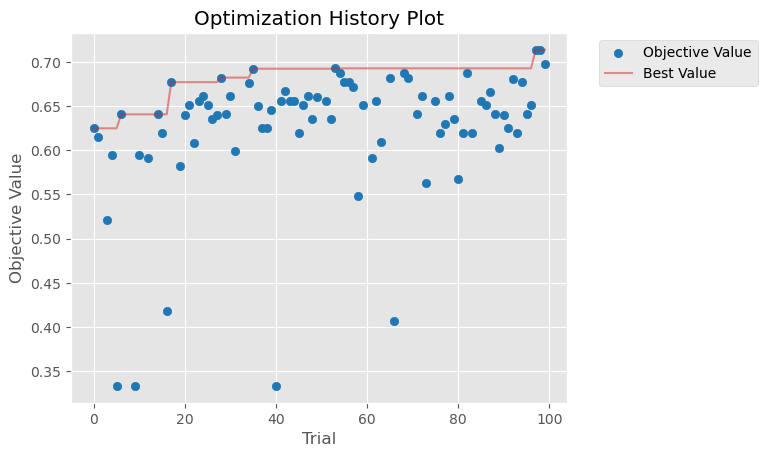

In [45]:
# Visualize the optimization history
plot_optimization_history(study)

[I 2024-06-10 19:26:43,006] A new study created in memory with name: no-name-3ae1d550-4545-467b-96d8-d47af0f28700
/tmp/ipykernel_36455/3414932042.py:7: ExperimentalWarning: plot_intermediate_values is experimental (supported from v2.2.0). The interface can change in the future.
  plot_intermediate_values(plotted_study)


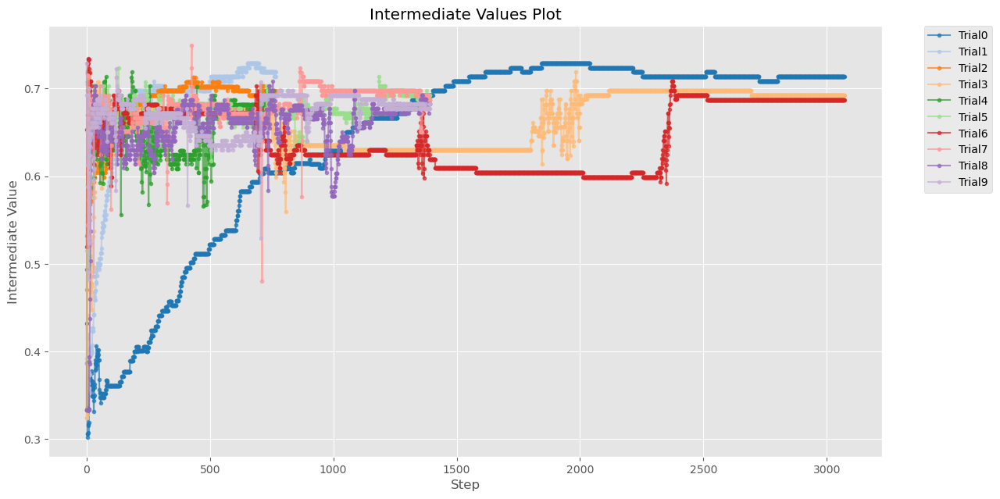

In [46]:
# Visualize the learning curves of the best 10 trials
trials = study.trials
plotted_trials = sorted(trials, key=lambda t: t.value, reverse=True)[:10]
plotted_study = optuna.create_study()
for trial in plotted_trials:
    plotted_study.add_trial(trial)
plot_intermediate_values(plotted_study)
set_size(10, 5)

/tmp/ipykernel_36455/2919792376.py:2: ExperimentalWarning: plot_parallel_coordinate is experimental (supported from v2.2.0). The interface can change in the future.
  plot_parallel_coordinate(study)


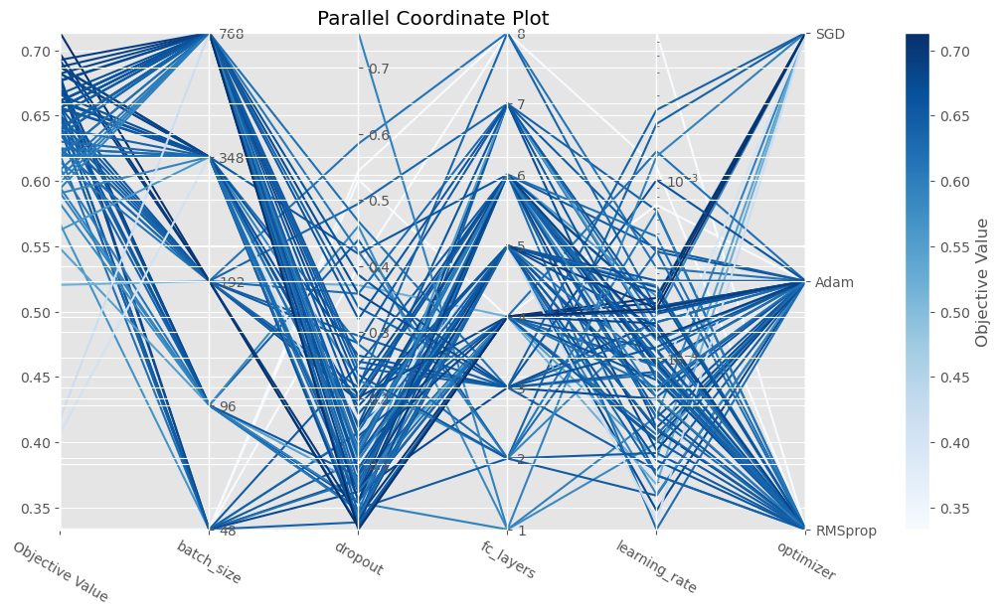

In [47]:
# Visualize high-dimensional parameter relationships.
plot_parallel_coordinate(study)
set_size(10, 5)

/tmp/ipykernel_36455/624402143.py:2: ExperimentalWarning: plot_contour is experimental (supported from v2.2.0). The interface can change in the future.
  plot_contour(study)
[W 2024-06-10 19:26:44,112] Output figures of this Matplotlib-based `plot_contour` function would be different from those of the Plotly-based `plot_contour`.


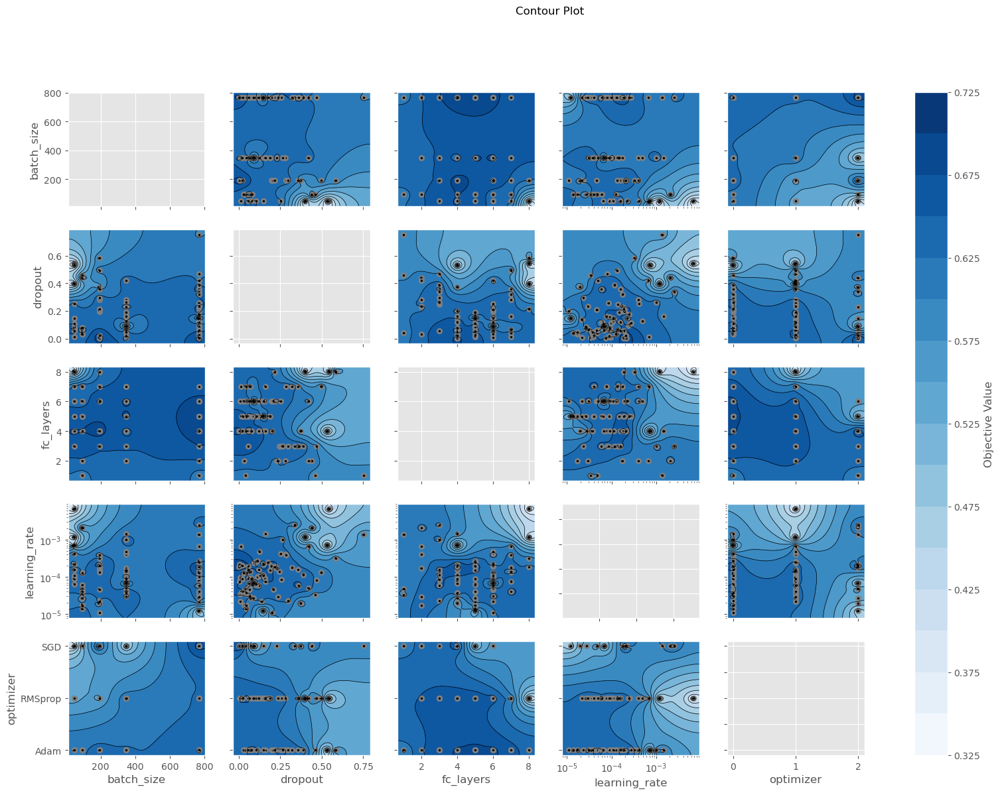

In [48]:
# Visualize hyperparameter relationships
plot_contour(study)
set_size(15, 10)

/tmp/ipykernel_36455/1888575690.py:2: ExperimentalWarning: plot_slice is experimental (supported from v2.2.0). The interface can change in the future.
  plot_slice(study)


array([<Axes: xlabel='batch_size', ylabel='Objective Value'>,
       <Axes: xlabel='dropout'>, <Axes: xlabel='fc_layers'>,
       <Axes: xlabel='learning_rate'>, <Axes: xlabel='optimizer'>],
      dtype=object)

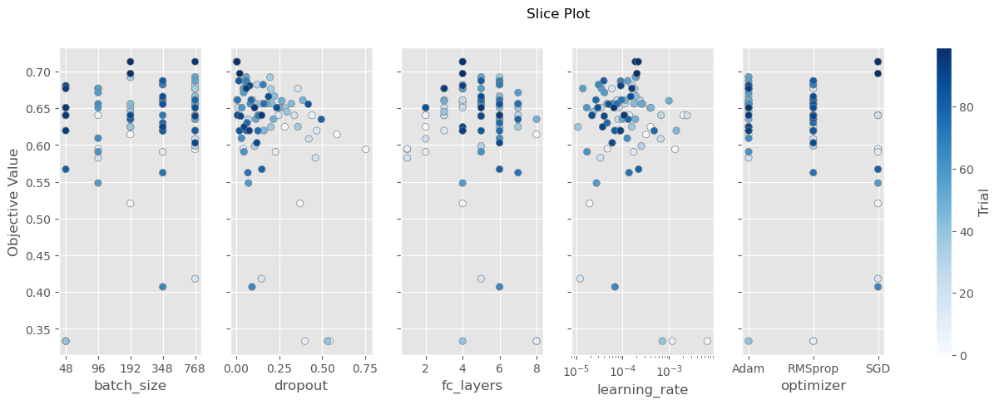

In [49]:
# Visualize individual hyperparameters as slice plot
plot_slice(study)

/tmp/ipykernel_36455/1473508994.py:2: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(study)


<Axes: title={'left': 'Hyperparameter Importances'}, xlabel='Hyperparameter Importance', ylabel='Hyperparameter'>

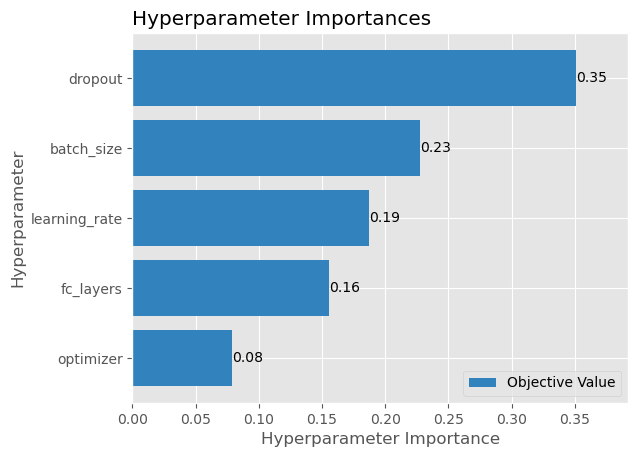

In [50]:
# Visualize parameter importances.
plot_param_importances(study)

/tmp/ipykernel_36455/3113371256.py:2: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


<Axes: title={'left': 'Hyperparameter Importances'}, xlabel='Hyperparameter Importance', ylabel='Hyperparameter'>

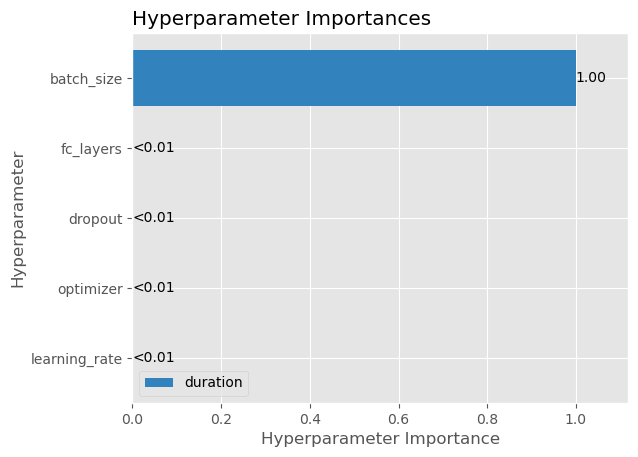

In [51]:
# Learn which hyperparameters are affecting the trial duration with hyperparameter importance.
plot_param_importances(
    study, target=lambda t: t.duration.total_seconds(), target_name="duration"
)

/tmp/ipykernel_36455/1828777839.py:2: ExperimentalWarning: plot_edf is experimental (supported from v2.2.0). The interface can change in the future.
  plot_edf(study)


<Axes: title={'center': 'Empirical Distribution Function Plot'}, xlabel='Objective Value', ylabel='Cumulative Probability'>

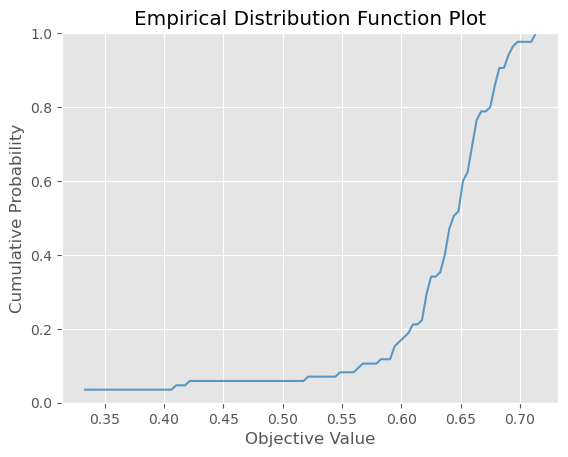

In [52]:
# Visualize empirical distribution function.
plot_edf(study)

/tmp/ipykernel_36455/1172520691.py:2: ExperimentalWarning: plot_rank is experimental (supported from v3.2.0). The interface can change in the future.
  plot_rank(study)
[W 2024-06-10 19:26:52,131] Output figures of this Matplotlib-based `plot_rank` function would be different from those of the Plotly-based `plot_rank`.


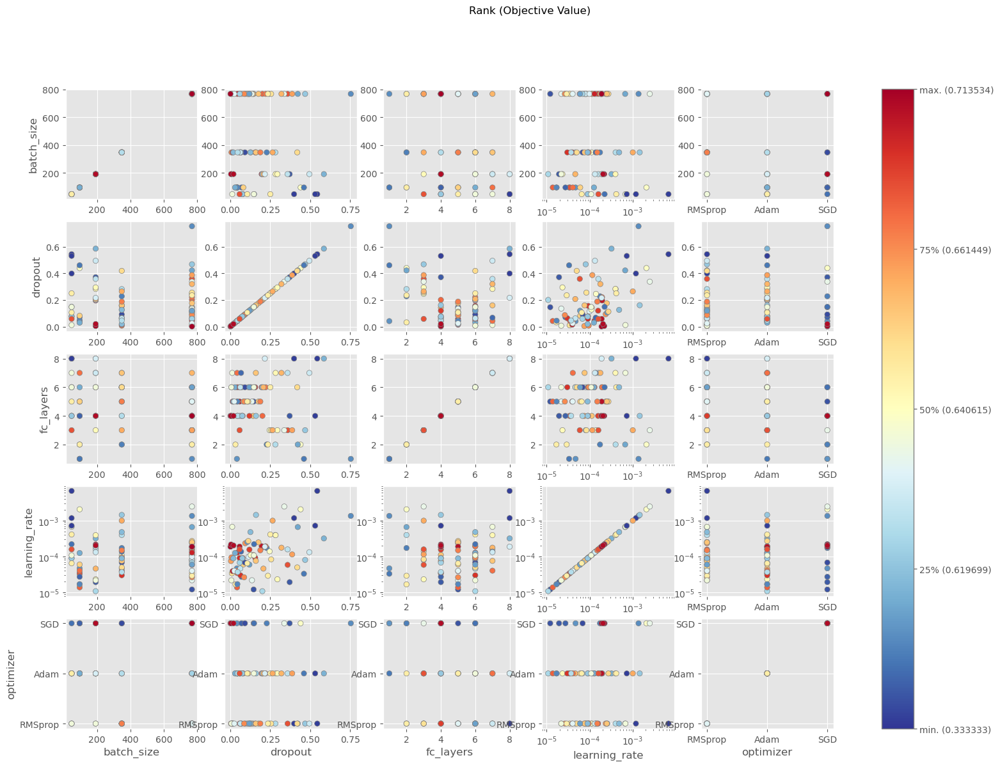

In [53]:
# Visualize parameter relations with scatter plots colored by objective values.
plot_rank(study)
set_size(15, 10)

/tmp/ipykernel_36455/124343896.py:2: ExperimentalWarning: plot_timeline is experimental (supported from v3.2.0). The interface can change in the future.
  plot_timeline(study)


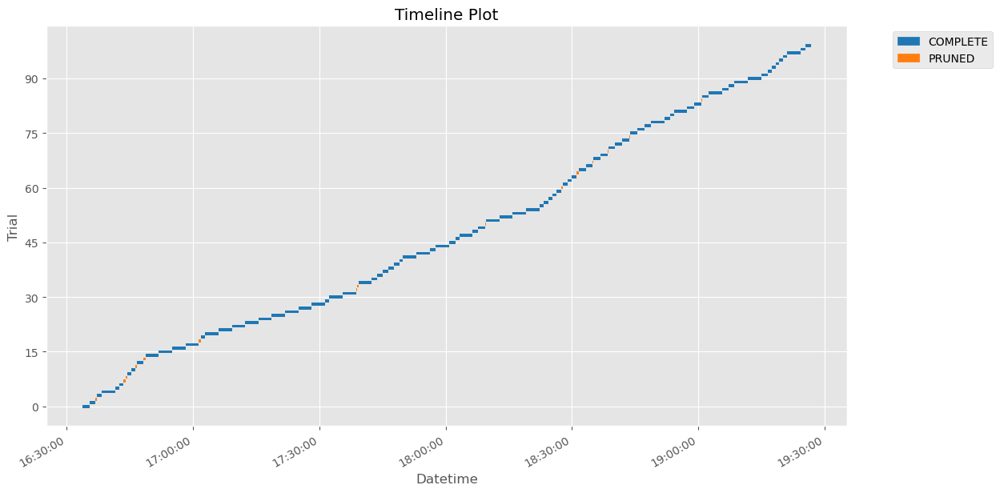

In [54]:
# Visualize the optimization timeline of performed trials.
plot_timeline(study)
set_size(10, 5)

### Model: graphLambda with edge_attr

In [55]:
import optuna
from optuna.integration import PyTorchLightningPruningCallback
from lightning.pytorch import Trainer
from lightning.pytorch.callbacks import RichProgressBar
import logging
import warnings

warnings.filterwarnings("ignore", ".*Consider increasing the value of the `num_workers` argument*")
warnings.filterwarnings("ignore", "Trying to infer the `batch_size` from an ambiguous collection.*")
torch.set_float32_matmul_precision('high')
logging.getLogger("lightning.pytorch.utilities.rank_zero").setLevel(logging.WARNING)
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

def objective(trial):
    # Suggest values for the hyperparameters
    learning_rate = trial.suggest_float('learning_rate', 1e-5, 1e-1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    batch_size = trial.suggest_categorical('batch_size', [48, 96, 192, 348, 768])
    fc_layers = trial.suggest_int('fc_layers', 1, 8)
    dropout = trial.suggest_float('dropout', 0, 0.8)
    hyperparameters = dict(learning_rate=learning_rate, optimizer_name=optimizer_name, batch_size=batch_size, fc_layers=fc_layers, dropout=dropout)
    print(f'Tested parameters: {hyperparameters}')
    n_epochs = batch_size * 4 # vary training epochs based on batch size

    # Create the model
    model = graphLambda_w_edge_attr(learning_rate=learning_rate, optimizer_name=optimizer_name, fc_layers=fc_layers, dropout=dropout)

    

    # Create the PyTorch Lightning trainer
    trainer = Trainer(
        accelerator='gpu',
        devices=1,
        max_epochs=n_epochs,
        callbacks=[PyTorchLightningPruningCallback(trial, monitor="val_f1")],
        enable_progress_bar=False,
        enable_model_summary=False,
        logger=True,
        enable_checkpointing=False
    )

    # Define the data loaders
    train_loader = DataLoader(X_train, batch_size=batch_size, shuffle=True,
                              drop_last=True) # , num_workers=0, persistent_workers=True
    val_loader = DataLoader(X_val, batch_size=len(X_val), shuffle=False,
                            drop_last=True) # , num_workers=0, persistent_workers=True

    # Log the hyperparameters
    trainer.logger.log_hyperparams(hyperparameters)

    # Train the model
    trainer.fit(model, train_loader, val_loader)

    # Evaluate the model
    val_f1 = trainer.callback_metrics["val_f1"].item()

    return val_f1

study = optuna.create_study(direction='maximize', pruner=optuna.pruners.ThresholdPruner(lower=0.35, n_warmup_steps=200))
study.optimize(objective, n_trials=100)

print("Best trial:")
trial = study.best_trial

print("  Value: {}".format(trial.value))

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

df = study.trials_dataframe()
df.to_pickle('eo_ADHD_results_w_edge_attrs_trials.pkl')

[I 2024-06-10 19:26:55,875] A new study created in memory with name: no-name-bc1e6766-86b3-4af4-96d1-84b848f55c25
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (1) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Tested parameters: {'learning_rate': 3.5500723172210926e-05, 'optimizer_name': 'RMSprop', 'batch_size': 768, 'fc_layers': 8, 'dropout': 0.054622407161481236}


[I 2024-06-10 19:30:46,404] Trial 0 finished with value: 0.6607128381729126 and parameters: {'learning_rate': 3.5500723172210926e-05, 'optimizer': 'RMSprop', 'batch_size': 768, 'fc_layers': 8, 'dropout': 0.054622407161481236}. Best is trial 0 with value: 0.6607128381729126.


Tested parameters: {'learning_rate': 7.186391301414358e-05, 'optimizer_name': 'RMSprop', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.3562340402371761}


[I 2024-06-10 19:34:36,469] Trial 1 finished with value: 0.6978838443756104 and parameters: {'learning_rate': 7.186391301414358e-05, 'optimizer': 'RMSprop', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.3562340402371761}. Best is trial 1 with value: 0.6978838443756104.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (4) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Tested parameters: {'learning_rate': 1.8617337187662182e-05, 'optimizer_name': 'Adam', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.4098876077491019}


[I 2024-06-10 19:36:00,189] Trial 2 finished with value: 0.608855128288269 and parameters: {'learning_rate': 1.8617337187662182e-05, 'optimizer': 'Adam', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.4098876077491019}. Best is trial 1 with value: 0.6978838443756104.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (2) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Tested parameters: {'learning_rate': 0.042232676511620305, 'optimizer_name': 'Adam', 'batch_size': 348, 'fc_layers': 3, 'dropout': 0.5546885123153997}


[I 2024-06-10 19:36:16,515] Trial 3 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.001910965146387735, 'optimizer_name': 'RMSprop', 'batch_size': 348, 'fc_layers': 3, 'dropout': 0.7712628860335761}


[I 2024-06-10 19:36:32,579] Trial 4 pruned. Trial was pruned at epoch 200.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (16) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Tested parameters: {'learning_rate': 0.09376240017714473, 'optimizer_name': 'Adam', 'batch_size': 48, 'fc_layers': 7, 'dropout': 0.3143965602373972}


[I 2024-06-10 19:37:36,011] Trial 5 finished with value: 0.3333333432674408 and parameters: {'learning_rate': 0.09376240017714473, 'optimizer': 'Adam', 'batch_size': 48, 'fc_layers': 7, 'dropout': 0.3143965602373972}. Best is trial 1 with value: 0.6978838443756104.


Tested parameters: {'learning_rate': 0.01337625706367588, 'optimizer_name': 'Adam', 'batch_size': 192, 'fc_layers': 2, 'dropout': 0.6140439101583617}


[I 2024-06-10 19:37:57,694] Trial 6 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 8.23048756772076e-05, 'optimizer_name': 'Adam', 'batch_size': 348, 'fc_layers': 3, 'dropout': 0.3638397450098103}


[I 2024-06-10 19:39:51,112] Trial 7 finished with value: 0.6249592900276184 and parameters: {'learning_rate': 8.23048756772076e-05, 'optimizer': 'Adam', 'batch_size': 348, 'fc_layers': 3, 'dropout': 0.3638397450098103}. Best is trial 1 with value: 0.6978838443756104.


Tested parameters: {'learning_rate': 7.135571870200615e-05, 'optimizer_name': 'RMSprop', 'batch_size': 348, 'fc_layers': 7, 'dropout': 0.7247767981433363}


[I 2024-06-10 19:40:07,789] Trial 8 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.008447350848201685, 'optimizer_name': 'RMSprop', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.536964003747386}


[I 2024-06-10 19:40:29,812] Trial 9 pruned. Trial was pruned at epoch 200.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (8) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Tested parameters: {'learning_rate': 0.00039220217969627747, 'optimizer_name': 'SGD', 'batch_size': 96, 'fc_layers': 1, 'dropout': 0.140938544273988}


[I 2024-06-10 19:41:35,387] Trial 10 finished with value: 0.7062936425209045 and parameters: {'learning_rate': 0.00039220217969627747, 'optimizer': 'SGD', 'batch_size': 96, 'fc_layers': 1, 'dropout': 0.140938544273988}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 0.00041764758968491434, 'optimizer_name': 'SGD', 'batch_size': 96, 'fc_layers': 1, 'dropout': 0.12012345201895526}


[I 2024-06-10 19:42:38,290] Trial 11 finished with value: 0.6516767144203186 and parameters: {'learning_rate': 0.00041764758968491434, 'optimizer': 'SGD', 'batch_size': 96, 'fc_layers': 1, 'dropout': 0.12012345201895526}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 0.00040033115044188055, 'optimizer_name': 'SGD', 'batch_size': 96, 'fc_layers': 1, 'dropout': 0.19574288519721994}


[I 2024-06-10 19:43:40,526] Trial 12 finished with value: 0.6403810977935791 and parameters: {'learning_rate': 0.00040033115044188055, 'optimizer': 'SGD', 'batch_size': 96, 'fc_layers': 1, 'dropout': 0.19574288519721994}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 0.0002412957176814869, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 6, 'dropout': 0.22247066268239396}


[I 2024-06-10 19:47:28,670] Trial 13 finished with value: 0.6450233459472656 and parameters: {'learning_rate': 0.0002412957176814869, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 6, 'dropout': 0.22247066268239396}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 0.0021546358414810305, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.0029044590159087447}


[I 2024-06-10 19:51:16,414] Trial 14 finished with value: 0.6354166865348816 and parameters: {'learning_rate': 0.0021546358414810305, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.0029044590159087447}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 0.00018439220368966853, 'optimizer_name': 'RMSprop', 'batch_size': 96, 'fc_layers': 5, 'dropout': 0.26605088127108123}


[I 2024-06-10 19:52:23,580] Trial 15 finished with value: 0.661449134349823 and parameters: {'learning_rate': 0.00018439220368966853, 'optimizer': 'RMSprop', 'batch_size': 96, 'fc_layers': 5, 'dropout': 0.26605088127108123}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 1.1898823468838549e-05, 'optimizer_name': 'SGD', 'batch_size': 48, 'fc_layers': 2, 'dropout': 0.42308314277447223}


[I 2024-06-10 19:53:19,181] Trial 16 finished with value: 0.3457269072532654 and parameters: {'learning_rate': 1.1898823468838549e-05, 'optimizer': 'SGD', 'batch_size': 48, 'fc_layers': 2, 'dropout': 0.42308314277447223}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 0.0009476793066449112, 'optimizer_name': 'RMSprop', 'batch_size': 96, 'fc_layers': 2, 'dropout': 0.14954585431731254}


[I 2024-06-10 19:53:52,601] Trial 17 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 8.153526599951028e-05, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 6, 'dropout': 0.4772925953853271}


[I 2024-06-10 19:54:07,820] Trial 18 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.0010085418173383588, 'optimizer_name': 'SGD', 'batch_size': 96, 'fc_layers': 1, 'dropout': 0.319092264634352}


[I 2024-06-10 19:55:09,709] Trial 19 finished with value: 0.6334678530693054 and parameters: {'learning_rate': 0.0010085418173383588, 'optimizer': 'SGD', 'batch_size': 96, 'fc_layers': 1, 'dropout': 0.319092264634352}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 0.005318548827217917, 'optimizer_name': 'RMSprop', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.09452528019665507}


[I 2024-06-10 19:55:24,654] Trial 20 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.00020774699912550976, 'optimizer_name': 'RMSprop', 'batch_size': 96, 'fc_layers': 5, 'dropout': 0.26242424329788144}


[I 2024-06-10 19:56:30,201] Trial 21 finished with value: 0.6509564518928528 and parameters: {'learning_rate': 0.00020774699912550976, 'optimizer': 'RMSprop', 'batch_size': 96, 'fc_layers': 5, 'dropout': 0.26242424329788144}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 0.00016709926512813573, 'optimizer_name': 'RMSprop', 'batch_size': 96, 'fc_layers': 6, 'dropout': 0.27674512598597456}


[I 2024-06-10 19:57:37,495] Trial 22 finished with value: 0.6666305065155029 and parameters: {'learning_rate': 0.00016709926512813573, 'optimizer': 'RMSprop', 'batch_size': 96, 'fc_layers': 6, 'dropout': 0.27674512598597456}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 3.650266457046318e-05, 'optimizer_name': 'RMSprop', 'batch_size': 96, 'fc_layers': 6, 'dropout': 0.18146392999161262}


[I 2024-06-10 19:58:43,407] Trial 23 finished with value: 0.6350603699684143 and parameters: {'learning_rate': 3.650266457046318e-05, 'optimizer': 'RMSprop', 'batch_size': 96, 'fc_layers': 6, 'dropout': 0.18146392999161262}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 0.0001183613589849886, 'optimizer_name': 'RMSprop', 'batch_size': 96, 'fc_layers': 8, 'dropout': 0.35403839848933244}


[I 2024-06-10 19:59:50,591] Trial 24 finished with value: 0.6406152248382568 and parameters: {'learning_rate': 0.0001183613589849886, 'optimizer': 'RMSprop', 'batch_size': 96, 'fc_layers': 8, 'dropout': 0.35403839848933244}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 0.0005365194522295647, 'optimizer_name': 'RMSprop', 'batch_size': 48, 'fc_layers': 7, 'dropout': 0.2643230397088302}


[I 2024-06-10 20:00:49,738] Trial 25 finished with value: 0.3333333432674408 and parameters: {'learning_rate': 0.0005365194522295647, 'optimizer': 'RMSprop', 'batch_size': 48, 'fc_layers': 7, 'dropout': 0.2643230397088302}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 3.422557381594104e-05, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 6, 'dropout': 0.4612939172136805}


[I 2024-06-10 20:01:04,397] Trial 26 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.0009329349909874854, 'optimizer_name': 'RMSprop', 'batch_size': 96, 'fc_layers': 5, 'dropout': 0.07089244063979755}


[I 2024-06-10 20:01:38,853] Trial 27 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.00011633304911624436, 'optimizer_name': 'RMSprop', 'batch_size': 96, 'fc_layers': 3, 'dropout': 0.14953042102021125}


[I 2024-06-10 20:02:43,123] Trial 28 finished with value: 0.6458333134651184 and parameters: {'learning_rate': 0.00011633304911624436, 'optimizer': 'RMSprop', 'batch_size': 96, 'fc_layers': 3, 'dropout': 0.14953042102021125}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 4.1399321525142314e-05, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 7, 'dropout': 0.004662993740691096}


[I 2024-06-10 20:02:58,261] Trial 29 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 2.4271205739855523e-05, 'optimizer_name': 'RMSprop', 'batch_size': 768, 'fc_layers': 8, 'dropout': 0.23258233164502784}


[I 2024-06-10 20:06:47,707] Trial 30 finished with value: 0.6344249844551086 and parameters: {'learning_rate': 2.4271205739855523e-05, 'optimizer': 'RMSprop', 'batch_size': 768, 'fc_layers': 8, 'dropout': 0.23258233164502784}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 0.00019831307728474686, 'optimizer_name': 'RMSprop', 'batch_size': 96, 'fc_layers': 5, 'dropout': 0.2856152563484295}


[I 2024-06-10 20:08:01,035] Trial 31 finished with value: 0.6663408875465393 and parameters: {'learning_rate': 0.00019831307728474686, 'optimizer': 'RMSprop', 'batch_size': 96, 'fc_layers': 5, 'dropout': 0.2856152563484295}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 0.0002893964007289503, 'optimizer_name': 'RMSprop', 'batch_size': 96, 'fc_layers': 4, 'dropout': 0.3240202438071755}


[I 2024-06-10 20:09:07,554] Trial 32 finished with value: 0.6718659996986389 and parameters: {'learning_rate': 0.0002893964007289503, 'optimizer': 'RMSprop', 'batch_size': 96, 'fc_layers': 4, 'dropout': 0.3240202438071755}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 0.0003334044154364139, 'optimizer_name': 'RMSprop', 'batch_size': 96, 'fc_layers': 4, 'dropout': 0.376068708230378}


[I 2024-06-10 20:10:14,187] Trial 33 finished with value: 0.618539571762085 and parameters: {'learning_rate': 0.0003334044154364139, 'optimizer': 'RMSprop', 'batch_size': 96, 'fc_layers': 4, 'dropout': 0.376068708230378}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 0.0017640476977925658, 'optimizer_name': 'RMSprop', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.42380139057983945}


[I 2024-06-10 20:10:36,111] Trial 34 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.0005434939543637604, 'optimizer_name': 'Adam', 'batch_size': 96, 'fc_layers': 3, 'dropout': 0.32423276619474206}


[I 2024-06-10 20:11:42,309] Trial 35 finished with value: 0.629716157913208 and parameters: {'learning_rate': 0.0005434939543637604, 'optimizer': 'Adam', 'batch_size': 96, 'fc_layers': 3, 'dropout': 0.32423276619474206}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 5.7393579534861816e-05, 'optimizer_name': 'RMSprop', 'batch_size': 48, 'fc_layers': 2, 'dropout': 0.5240906694920415}


[I 2024-06-10 20:12:39,708] Trial 36 finished with value: 0.6190476417541504 and parameters: {'learning_rate': 5.7393579534861816e-05, 'optimizer': 'RMSprop', 'batch_size': 48, 'fc_layers': 2, 'dropout': 0.5240906694920415}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 0.00013474910149835365, 'optimizer_name': 'Adam', 'batch_size': 348, 'fc_layers': 4, 'dropout': 0.2047610905807537}


[I 2024-06-10 20:14:32,990] Trial 37 finished with value: 0.650804877281189 and parameters: {'learning_rate': 0.00013474910149835365, 'optimizer': 'Adam', 'batch_size': 348, 'fc_layers': 4, 'dropout': 0.2047610905807537}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 1.4799596747922298e-05, 'optimizer_name': 'RMSprop', 'batch_size': 192, 'fc_layers': 3, 'dropout': 0.3404140305689961}


[I 2024-06-10 20:15:56,951] Trial 38 finished with value: 0.6196988224983215 and parameters: {'learning_rate': 1.4799596747922298e-05, 'optimizer': 'RMSprop', 'batch_size': 192, 'fc_layers': 3, 'dropout': 0.3404140305689961}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 0.00029464521632929216, 'optimizer_name': 'Adam', 'batch_size': 96, 'fc_layers': 3, 'dropout': 0.6039407851413713}


[I 2024-06-10 20:17:02,862] Trial 39 finished with value: 0.5952136516571045 and parameters: {'learning_rate': 0.00029464521632929216, 'optimizer': 'Adam', 'batch_size': 96, 'fc_layers': 3, 'dropout': 0.6039407851413713}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 0.03405135211154217, 'optimizer_name': 'RMSprop', 'batch_size': 348, 'fc_layers': 6, 'dropout': 0.39876986843814194}


[I 2024-06-10 20:17:19,670] Trial 40 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.0001659530741464394, 'optimizer_name': 'RMSprop', 'batch_size': 96, 'fc_layers': 5, 'dropout': 0.28578272720820275}


[I 2024-06-10 20:18:28,842] Trial 41 finished with value: 0.6394414305686951 and parameters: {'learning_rate': 0.0001659530741464394, 'optimizer': 'RMSprop', 'batch_size': 96, 'fc_layers': 5, 'dropout': 0.28578272720820275}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 0.0007007112720717387, 'optimizer_name': 'RMSprop', 'batch_size': 96, 'fc_layers': 7, 'dropout': 0.28842759189157663}


[I 2024-06-10 20:19:35,907] Trial 42 finished with value: 0.650804877281189 and parameters: {'learning_rate': 0.0007007112720717387, 'optimizer': 'RMSprop', 'batch_size': 96, 'fc_layers': 7, 'dropout': 0.28842759189157663}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 0.00010039027765168975, 'optimizer_name': 'RMSprop', 'batch_size': 96, 'fc_layers': 5, 'dropout': 0.1631982502774154}


[I 2024-06-10 20:20:41,716] Trial 43 finished with value: 0.625 and parameters: {'learning_rate': 0.00010039027765168975, 'optimizer': 'RMSprop', 'batch_size': 96, 'fc_layers': 5, 'dropout': 0.1631982502774154}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 5.1556916781784134e-05, 'optimizer_name': 'RMSprop', 'batch_size': 96, 'fc_layers': 4, 'dropout': 0.24079394341014776}


[I 2024-06-10 20:21:49,520] Trial 44 finished with value: 0.6405372619628906 and parameters: {'learning_rate': 5.1556916781784134e-05, 'optimizer': 'RMSprop', 'batch_size': 96, 'fc_layers': 4, 'dropout': 0.24079394341014776}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 0.00025687638994486607, 'optimizer_name': 'SGD', 'batch_size': 96, 'fc_layers': 6, 'dropout': 0.39414606306126854}


[I 2024-06-10 20:22:55,648] Trial 45 finished with value: 0.39047619700431824 and parameters: {'learning_rate': 0.00025687638994486607, 'optimizer': 'SGD', 'batch_size': 96, 'fc_layers': 6, 'dropout': 0.39414606306126854}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 2.390173807704664e-05, 'optimizer_name': 'RMSprop', 'batch_size': 192, 'fc_layers': 5, 'dropout': 0.4572260386685863}


[I 2024-06-10 20:24:20,340] Trial 46 finished with value: 0.635377049446106 and parameters: {'learning_rate': 2.390173807704664e-05, 'optimizer': 'RMSprop', 'batch_size': 192, 'fc_layers': 5, 'dropout': 0.4572260386685863}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 0.0014662343019765643, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.30959600618419225}


[I 2024-06-10 20:28:05,186] Trial 47 finished with value: 0.6299574375152588 and parameters: {'learning_rate': 0.0014662343019765643, 'optimizer': 'Adam', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.30959600618419225}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 0.00040532625466522854, 'optimizer_name': 'SGD', 'batch_size': 48, 'fc_layers': 4, 'dropout': 0.11365054437948989}


[I 2024-06-10 20:29:06,337] Trial 48 finished with value: 0.7027298808097839 and parameters: {'learning_rate': 0.00040532625466522854, 'optimizer': 'SGD', 'batch_size': 48, 'fc_layers': 4, 'dropout': 0.11365054437948989}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 0.0004009634029249159, 'optimizer_name': 'SGD', 'batch_size': 48, 'fc_layers': 3, 'dropout': 0.12384229001851424}


[I 2024-06-10 20:30:04,201] Trial 49 finished with value: 0.6354166865348816 and parameters: {'learning_rate': 0.0004009634029249159, 'optimizer': 'SGD', 'batch_size': 48, 'fc_layers': 3, 'dropout': 0.12384229001851424}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 0.003191834920290175, 'optimizer_name': 'SGD', 'batch_size': 48, 'fc_layers': 4, 'dropout': 0.0618959181516473}


[I 2024-06-10 20:31:01,825] Trial 50 finished with value: 0.6666666865348816 and parameters: {'learning_rate': 0.003191834920290175, 'optimizer': 'SGD', 'batch_size': 48, 'fc_layers': 4, 'dropout': 0.0618959181516473}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 0.0029243322079244567, 'optimizer_name': 'SGD', 'batch_size': 48, 'fc_layers': 4, 'dropout': 0.05698638294779998}


[I 2024-06-10 20:31:58,580] Trial 51 finished with value: 0.6354166865348816 and parameters: {'learning_rate': 0.0029243322079244567, 'optimizer': 'SGD', 'batch_size': 48, 'fc_layers': 4, 'dropout': 0.05698638294779998}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 0.004269072479015077, 'optimizer_name': 'SGD', 'batch_size': 48, 'fc_layers': 4, 'dropout': 0.09511917307285184}


[I 2024-06-10 20:32:59,851] Trial 52 finished with value: 0.6454871296882629 and parameters: {'learning_rate': 0.004269072479015077, 'optimizer': 'SGD', 'batch_size': 48, 'fc_layers': 4, 'dropout': 0.09511917307285184}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 0.007169934679636902, 'optimizer_name': 'SGD', 'batch_size': 48, 'fc_layers': 2, 'dropout': 0.12279656025800034}


[I 2024-06-10 20:33:56,525] Trial 53 finished with value: 0.6666666865348816 and parameters: {'learning_rate': 0.007169934679636902, 'optimizer': 'SGD', 'batch_size': 48, 'fc_layers': 2, 'dropout': 0.12279656025800034}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 0.012931377730938208, 'optimizer_name': 'SGD', 'batch_size': 48, 'fc_layers': 1, 'dropout': 0.017382002258084547}


[I 2024-06-10 20:34:54,493] Trial 54 finished with value: 0.6314173340797424 and parameters: {'learning_rate': 0.012931377730938208, 'optimizer': 'SGD', 'batch_size': 48, 'fc_layers': 1, 'dropout': 0.017382002258084547}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 0.005959053944870223, 'optimizer_name': 'SGD', 'batch_size': 48, 'fc_layers': 2, 'dropout': 0.04463428262030278}


[I 2024-06-10 20:35:53,484] Trial 55 finished with value: 0.7030525207519531 and parameters: {'learning_rate': 0.005959053944870223, 'optimizer': 'SGD', 'batch_size': 48, 'fc_layers': 2, 'dropout': 0.04463428262030278}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 0.03290642865811328, 'optimizer_name': 'SGD', 'batch_size': 48, 'fc_layers': 2, 'dropout': 0.04862580490008964}


[I 2024-06-10 20:36:49,052] Trial 56 finished with value: 0.6384180784225464 and parameters: {'learning_rate': 0.03290642865811328, 'optimizer': 'SGD', 'batch_size': 48, 'fc_layers': 2, 'dropout': 0.04862580490008964}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 0.0028362651325707353, 'optimizer_name': 'SGD', 'batch_size': 48, 'fc_layers': 1, 'dropout': 0.7097351909667909}


[I 2024-06-10 20:37:44,316] Trial 57 finished with value: 0.5789473652839661 and parameters: {'learning_rate': 0.0028362651325707353, 'optimizer': 'SGD', 'batch_size': 48, 'fc_layers': 1, 'dropout': 0.7097351909667909}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 0.009605307152129195, 'optimizer_name': 'SGD', 'batch_size': 48, 'fc_layers': 3, 'dropout': 0.026888152706419463}


[I 2024-06-10 20:38:43,245] Trial 58 finished with value: 0.6561007499694824 and parameters: {'learning_rate': 0.009605307152129195, 'optimizer': 'SGD', 'batch_size': 48, 'fc_layers': 3, 'dropout': 0.026888152706419463}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 0.0012409827597134322, 'optimizer_name': 'SGD', 'batch_size': 48, 'fc_layers': 2, 'dropout': 0.09809885864632915}


[I 2024-06-10 20:39:38,798] Trial 59 finished with value: 0.6192855834960938 and parameters: {'learning_rate': 0.0012409827597134322, 'optimizer': 'SGD', 'batch_size': 48, 'fc_layers': 2, 'dropout': 0.09809885864632915}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 0.01946156315669415, 'optimizer_name': 'SGD', 'batch_size': 48, 'fc_layers': 4, 'dropout': 0.0740773932041203}


[I 2024-06-10 20:40:35,376] Trial 60 finished with value: 0.6405372619628906 and parameters: {'learning_rate': 0.01946156315669415, 'optimizer': 'SGD', 'batch_size': 48, 'fc_layers': 4, 'dropout': 0.0740773932041203}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 0.006707248591042762, 'optimizer_name': 'SGD', 'batch_size': 48, 'fc_layers': 2, 'dropout': 0.13406543183853442}


[I 2024-06-10 20:41:30,916] Trial 61 finished with value: 0.6561007499694824 and parameters: {'learning_rate': 0.006707248591042762, 'optimizer': 'SGD', 'batch_size': 48, 'fc_layers': 2, 'dropout': 0.13406543183853442}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 0.004255112750878423, 'optimizer_name': 'SGD', 'batch_size': 48, 'fc_layers': 1, 'dropout': 0.03601723388597034}


[I 2024-06-10 20:42:25,706] Trial 62 finished with value: 0.6494345664978027 and parameters: {'learning_rate': 0.004255112750878423, 'optimizer': 'SGD', 'batch_size': 48, 'fc_layers': 1, 'dropout': 0.03601723388597034}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 0.0007640563435593269, 'optimizer_name': 'SGD', 'batch_size': 48, 'fc_layers': 3, 'dropout': 0.18033031462063395}


[I 2024-06-10 20:43:22,386] Trial 63 finished with value: 0.6458333134651184 and parameters: {'learning_rate': 0.0007640563435593269, 'optimizer': 'SGD', 'batch_size': 48, 'fc_layers': 3, 'dropout': 0.18033031462063395}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 0.0033246568843251145, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 2, 'dropout': 0.09053404083190397}


[I 2024-06-10 20:47:08,076] Trial 64 finished with value: 0.6714382767677307 and parameters: {'learning_rate': 0.0033246568843251145, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 2, 'dropout': 0.09053404083190397}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 0.0024731997307065206, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.1010730356829362}


[I 2024-06-10 20:50:59,359] Trial 65 finished with value: 0.650804877281189 and parameters: {'learning_rate': 0.0024731997307065206, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.1010730356829362}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 0.0005191892748635746, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.0634505670742802}


[I 2024-06-10 20:54:43,147] Trial 66 finished with value: 0.6392173767089844 and parameters: {'learning_rate': 0.0005191892748635746, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.0634505670742802}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 0.0037690385730836697, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 2, 'dropout': 0.20878523971649954}


[I 2024-06-10 20:58:28,123] Trial 67 finished with value: 0.6457949280738831 and parameters: {'learning_rate': 0.0037690385730836697, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 2, 'dropout': 0.20878523971649954}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 0.0016579423085071594, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.1565970198955229}


[I 2024-06-10 21:02:13,574] Trial 68 finished with value: 0.6666305065155029 and parameters: {'learning_rate': 0.0016579423085071594, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.1565970198955229}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 0.001238424147426278, 'optimizer_name': 'SGD', 'batch_size': 348, 'fc_layers': 4, 'dropout': 0.08368183684631439}


[I 2024-06-10 21:04:05,040] Trial 69 finished with value: 0.6406152248382568 and parameters: {'learning_rate': 0.001238424147426278, 'optimizer': 'SGD', 'batch_size': 348, 'fc_layers': 4, 'dropout': 0.08368183684631439}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 0.016595003206160305, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 2, 'dropout': 0.18600128197580518}


[I 2024-06-10 21:07:49,460] Trial 70 finished with value: 0.6301179528236389 and parameters: {'learning_rate': 0.016595003206160305, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 2, 'dropout': 0.18600128197580518}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 0.008093353008538282, 'optimizer_name': 'SGD', 'batch_size': 48, 'fc_layers': 2, 'dropout': 0.11062057739409449}


[I 2024-06-10 21:08:46,483] Trial 71 finished with value: 0.6006568670272827 and parameters: {'learning_rate': 0.008093353008538282, 'optimizer': 'SGD', 'batch_size': 48, 'fc_layers': 2, 'dropout': 0.11062057739409449}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 0.008141725684650917, 'optimizer_name': 'SGD', 'batch_size': 48, 'fc_layers': 2, 'dropout': 0.13587967243031662}


[I 2024-06-10 21:09:42,660] Trial 72 finished with value: 0.5249979496002197 and parameters: {'learning_rate': 0.008141725684650917, 'optimizer': 'SGD', 'batch_size': 48, 'fc_layers': 2, 'dropout': 0.13587967243031662}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 0.011109461159759942, 'optimizer_name': 'SGD', 'batch_size': 48, 'fc_layers': 3, 'dropout': 0.0021015806518504057}


[I 2024-06-10 21:10:39,027] Trial 73 finished with value: 0.6666305065155029 and parameters: {'learning_rate': 0.011109461159759942, 'optimizer': 'SGD', 'batch_size': 48, 'fc_layers': 3, 'dropout': 0.0021015806518504057}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 0.006279937493131979, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.05103142547655261}


[I 2024-06-10 21:14:23,209] Trial 74 finished with value: 0.7024712562561035 and parameters: {'learning_rate': 0.006279937493131979, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.05103142547655261}. Best is trial 10 with value: 0.7062936425209045.


Tested parameters: {'learning_rate': 0.005530764189371293, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.04257980936590457}


[I 2024-06-10 21:18:06,687] Trial 75 finished with value: 0.7331516742706299 and parameters: {'learning_rate': 0.005530764189371293, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.04257980936590457}. Best is trial 75 with value: 0.7331516742706299.


Tested parameters: {'learning_rate': 0.005091636489208919, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.035829443363640766}


[I 2024-06-10 21:21:51,365] Trial 76 finished with value: 0.6299574375152588 and parameters: {'learning_rate': 0.005091636489208919, 'optimizer': 'Adam', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.035829443363640766}. Best is trial 75 with value: 0.7331516742706299.


Tested parameters: {'learning_rate': 0.005666981139505848, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.04523021719155598}


[I 2024-06-10 21:25:35,603] Trial 77 finished with value: 0.6920316219329834 and parameters: {'learning_rate': 0.005666981139505848, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.04523021719155598}. Best is trial 75 with value: 0.7331516742706299.


Tested parameters: {'learning_rate': 0.005226325478058362, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.042928744217034145}


[I 2024-06-10 21:29:19,683] Trial 78 finished with value: 0.6598991751670837 and parameters: {'learning_rate': 0.005226325478058362, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.042928744217034145}. Best is trial 75 with value: 0.7331516742706299.


Tested parameters: {'learning_rate': 0.08096172859495286, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.014197163965036619}


[I 2024-06-10 21:30:11,726] Trial 79 pruned. Trial was pruned at epoch 713.


Tested parameters: {'learning_rate': 0.00217567700279607, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.5044338318043907}


[I 2024-06-10 21:33:57,627] Trial 80 finished with value: 0.6190476417541504 and parameters: {'learning_rate': 0.00217567700279607, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.5044338318043907}. Best is trial 75 with value: 0.7331516742706299.


Tested parameters: {'learning_rate': 0.006373248629033051, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.08215618627608387}


[I 2024-06-10 21:37:45,663] Trial 81 finished with value: 0.7017577886581421 and parameters: {'learning_rate': 0.006373248629033051, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.08215618627608387}. Best is trial 75 with value: 0.7331516742706299.


Tested parameters: {'learning_rate': 0.017575867402887427, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.0670402969932961}


[I 2024-06-10 21:41:30,027] Trial 82 finished with value: 0.6922993659973145 and parameters: {'learning_rate': 0.017575867402887427, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.0670402969932961}. Best is trial 75 with value: 0.7331516742706299.


Tested parameters: {'learning_rate': 0.01935783446501309, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.0725672540941136}


[I 2024-06-10 21:45:14,588] Trial 83 finished with value: 0.6791496276855469 and parameters: {'learning_rate': 0.01935783446501309, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.0725672540941136}. Best is trial 75 with value: 0.7331516742706299.


Tested parameters: {'learning_rate': 0.006003218119706716, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.04600293603226008}


[I 2024-06-10 21:48:57,950] Trial 84 finished with value: 0.6239799857139587 and parameters: {'learning_rate': 0.006003218119706716, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.04600293603226008}. Best is trial 75 with value: 0.7331516742706299.


Tested parameters: {'learning_rate': 0.023878811817057113, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.024189715076890515}


[I 2024-06-10 21:52:41,885] Trial 85 finished with value: 0.6439402103424072 and parameters: {'learning_rate': 0.023878811817057113, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.024189715076890515}. Best is trial 75 with value: 0.7331516742706299.


Tested parameters: {'learning_rate': 0.010936809882468054, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.1154871155248518}


[I 2024-06-10 21:56:26,187] Trial 86 finished with value: 0.7436163425445557 and parameters: {'learning_rate': 0.010936809882468054, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.1154871155248518}. Best is trial 86 with value: 0.7436163425445557.


Tested parameters: {'learning_rate': 0.016095471630031728, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.14220493968002523}


[I 2024-06-10 22:00:10,273] Trial 87 finished with value: 0.6812454462051392 and parameters: {'learning_rate': 0.016095471630031728, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.14220493968002523}. Best is trial 86 with value: 0.7436163425445557.


Tested parameters: {'learning_rate': 0.05380933354452034, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.1699342925111201}


[I 2024-06-10 22:03:55,966] Trial 88 finished with value: 0.6282724738121033 and parameters: {'learning_rate': 0.05380933354452034, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.1699342925111201}. Best is trial 86 with value: 0.7436163425445557.


Tested parameters: {'learning_rate': 0.011442772171915968, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 1, 'dropout': 0.11608324832879674}


[I 2024-06-10 22:05:18,221] Trial 89 finished with value: 0.6030899882316589 and parameters: {'learning_rate': 0.011442772171915968, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 1, 'dropout': 0.11608324832879674}. Best is trial 86 with value: 0.7436163425445557.


Tested parameters: {'learning_rate': 0.008756956818199517, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.5803577325122784}


[I 2024-06-10 22:09:01,663] Trial 90 finished with value: 0.6587833166122437 and parameters: {'learning_rate': 0.008756956818199517, 'optimizer': 'Adam', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.5803577325122784}. Best is trial 86 with value: 0.7436163425445557.


Tested parameters: {'learning_rate': 0.010241469932043817, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.07597935188715048}


[I 2024-06-10 22:12:45,355] Trial 91 finished with value: 0.6510322093963623 and parameters: {'learning_rate': 0.010241469932043817, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.07597935188715048}. Best is trial 86 with value: 0.7436163425445557.


Tested parameters: {'learning_rate': 0.00599010212240137, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.055083809984717326}


[I 2024-06-10 22:16:29,913] Trial 92 finished with value: 0.648284375667572 and parameters: {'learning_rate': 0.00599010212240137, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.055083809984717326}. Best is trial 86 with value: 0.7436163425445557.


Tested parameters: {'learning_rate': 0.01433831109090462, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.10928424995236753}


[I 2024-06-10 22:20:13,515] Trial 93 finished with value: 0.6926999688148499 and parameters: {'learning_rate': 0.01433831109090462, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.10928424995236753}. Best is trial 86 with value: 0.7436163425445557.


Tested parameters: {'learning_rate': 0.02508732686814399, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.1106403495314556}


[I 2024-06-10 22:23:58,349] Trial 94 finished with value: 0.6265512108802795 and parameters: {'learning_rate': 0.02508732686814399, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.1106403495314556}. Best is trial 86 with value: 0.7436163425445557.


Tested parameters: {'learning_rate': 0.015342639145668762, 'optimizer_name': 'SGD', 'batch_size': 348, 'fc_layers': 1, 'dropout': 0.0822736611334237}


[I 2024-06-10 22:25:50,190] Trial 95 finished with value: 0.6195336580276489 and parameters: {'learning_rate': 0.015342639145668762, 'optimizer': 'SGD', 'batch_size': 348, 'fc_layers': 1, 'dropout': 0.0822736611334237}. Best is trial 86 with value: 0.7436163425445557.


Tested parameters: {'learning_rate': 0.026107656259114036, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 2, 'dropout': 0.13076325773901643}


[I 2024-06-10 22:29:35,964] Trial 96 finished with value: 0.6456795334815979 and parameters: {'learning_rate': 0.026107656259114036, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 2, 'dropout': 0.13076325773901643}. Best is trial 86 with value: 0.7436163425445557.


Tested parameters: {'learning_rate': 0.04769460841117828, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.6864538201155501}


[I 2024-06-10 22:33:27,770] Trial 97 finished with value: 0.6296855211257935 and parameters: {'learning_rate': 0.04769460841117828, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.6864538201155501}. Best is trial 86 with value: 0.7436163425445557.


Tested parameters: {'learning_rate': 0.00445494592208512, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 2, 'dropout': 0.1044480690647918}


[I 2024-06-10 22:37:12,749] Trial 98 finished with value: 0.6457949280738831 and parameters: {'learning_rate': 0.00445494592208512, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 2, 'dropout': 0.1044480690647918}. Best is trial 86 with value: 0.7436163425445557.


Tested parameters: {'learning_rate': 0.034233153813661245, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.16340648231165905}


[I 2024-06-10 22:40:55,921] Trial 99 finished with value: 0.6581102013587952 and parameters: {'learning_rate': 0.034233153813661245, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.16340648231165905}. Best is trial 86 with value: 0.7436163425445557.


Best trial:
  Value: 0.7436163425445557
  Params: 
    learning_rate: 0.010936809882468054
    optimizer: SGD
    batch_size: 768
    fc_layers: 1
    dropout: 0.1154871155248518


In [56]:
df_trials = pd.read_pickle('eo_ADHD_results_w_edge_attrs_trials.pkl')
df_trials.sort_values('value', ascending=False).head(10)

,number,value,datetime_start,datetime_complete,duration,params_batch_size,params_dropout,params_fc_layers,params_learning_rate,params_optimizer,state
86,86,0.743616,2024-06-10 21:52:41.886042,2024-06-10 21:56:26.183892,0 days 00:03:44.297850,768,0.115487,1,0.010937,SGD,COMPLETE
75,75,0.733152,2024-06-10 21:14:23.210164,2024-06-10 21:18:06.683290,0 days 00:03:43.473126,768,0.042580,1,0.005531,SGD,COMPLETE
10,10,0.706294,2024-06-10 19:40:29.812930,2024-06-10 19:41:35.386441,0 days 00:01:05.573511,96,0.140939,1,0.000392,SGD,COMPLETE
55,55,0.703053,2024-06-10 20:34:54.494454,2024-06-10 20:35:53.484163,0 days 00:00:58.989709,48,0.044634,2,0.005959,SGD,COMPLETE
48,48,0.702730,2024-06-10 20:28:05.187631,2024-06-10 20:29:06.336692,0 days 00:01:01.149061,48,0.113651,4,0.000405,SGD,COMPLETE
74,74,0.702471,2024-06-10 21:10:39.028383,2024-06-10 21:14:23.206977,0 days 00:03:44.178594,768,0.051031,1,0.006280,SGD,COMPLETE
81,81,0.701758,2024-06-10 21:33:57.627934,2024-06-10 21:37:45.659549,0 days 00:03:48.031615,768,0.082156,1,0.006373,SGD,COMPLETE
1,1,0.697884,2024-06-10 19:30:46.405689,2024-06-10 19:34:36.465645,0 days 00:03:50.059956,768,0.356234,4,0.000072,RMSprop,COMPLETE
93,93,0.692700,2024-06-10 22:16:29.913907,2024-06-10 22:20:13.511502,0 days 00:03:43.597595,768,0.109284,1,0.014338,SGD,COMPLETE
82,82,0.692299,2024-06-10 21:37:45.664203,2024-06-10 21:41:30.023023,0 days 00:03:44.358820,768,0.067040,1,0.017576,SGD,COMPLETE


#### Visualizations

/tmp/ipykernel_36455/1755039964.py:2: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(study)


<Axes: title={'center': 'Optimization History Plot'}, xlabel='Trial', ylabel='Objective Value'>

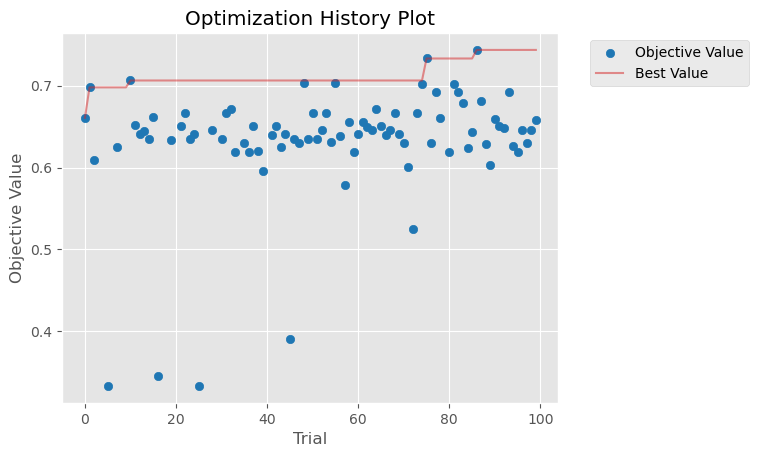

In [57]:
# Visualize the optimization history
plot_optimization_history(study)

[I 2024-06-10 22:40:56,294] A new study created in memory with name: no-name-052ea822-2528-43cf-affb-45b4e9472cdb
/tmp/ipykernel_36455/3414932042.py:7: ExperimentalWarning: plot_intermediate_values is experimental (supported from v2.2.0). The interface can change in the future.
  plot_intermediate_values(plotted_study)


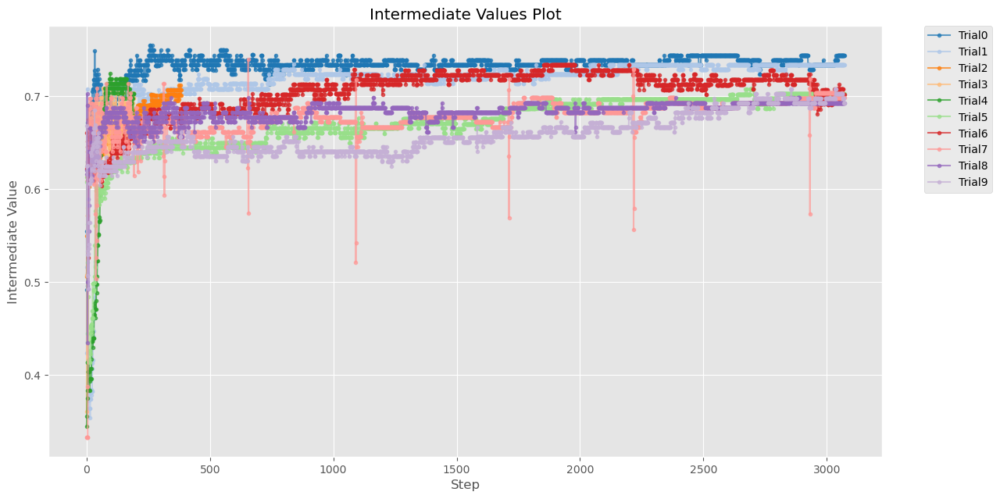

In [58]:
# Visualize the learning curves of the best 10 trials
trials = study.trials
plotted_trials = sorted(trials, key=lambda t: t.value, reverse=True)[:10]
plotted_study = optuna.create_study()
for trial in plotted_trials:
    plotted_study.add_trial(trial)
plot_intermediate_values(plotted_study)
set_size(10, 5)

/tmp/ipykernel_36455/2919792376.py:2: ExperimentalWarning: plot_parallel_coordinate is experimental (supported from v2.2.0). The interface can change in the future.
  plot_parallel_coordinate(study)


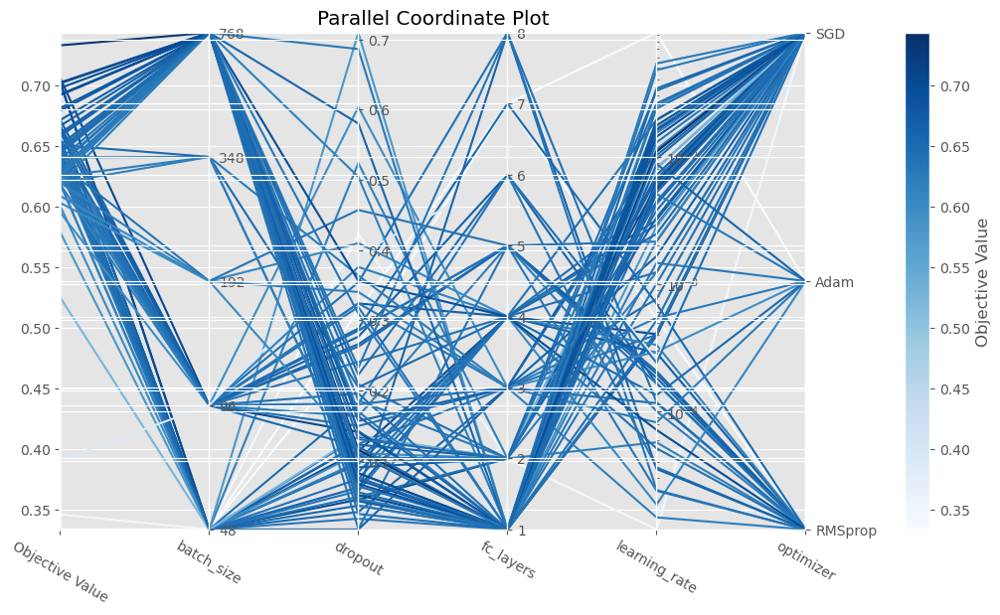

In [59]:
# Visualize high-dimensional parameter relationships.
plot_parallel_coordinate(study)
set_size(10, 5)

/tmp/ipykernel_36455/624402143.py:2: ExperimentalWarning: plot_contour is experimental (supported from v2.2.0). The interface can change in the future.
  plot_contour(study)
[W 2024-06-10 22:40:57,456] Output figures of this Matplotlib-based `plot_contour` function would be different from those of the Plotly-based `plot_contour`.


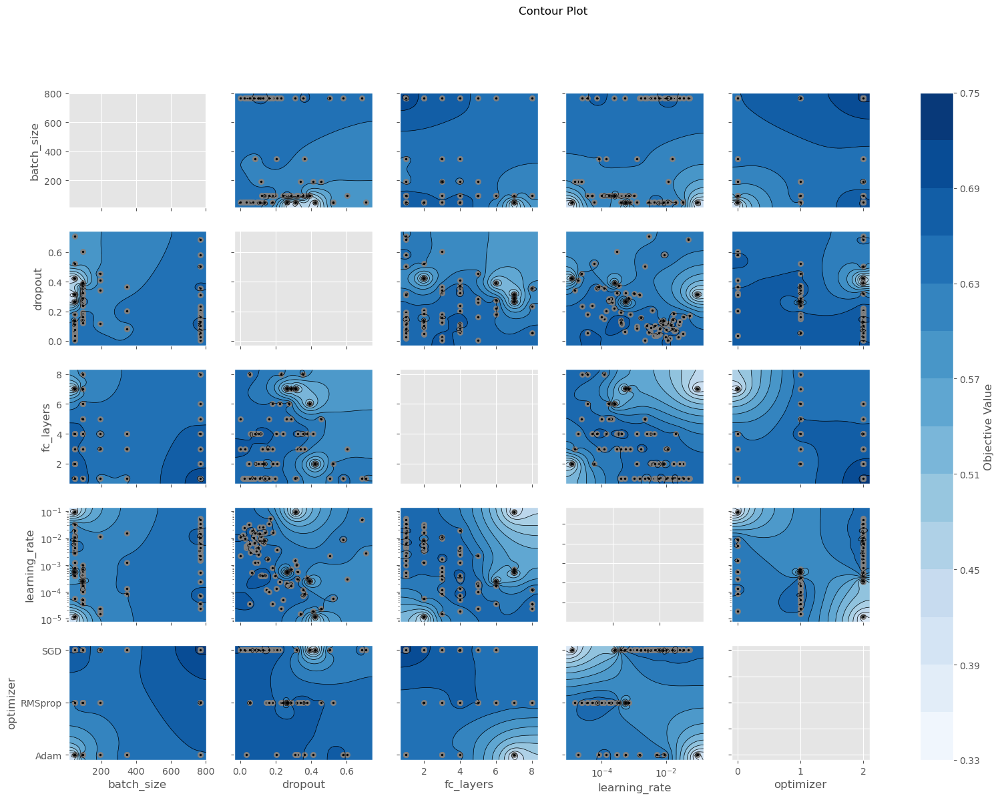

In [60]:
# Visualize hyperparameter relationships
plot_contour(study)
set_size(15, 10)

/tmp/ipykernel_36455/1888575690.py:2: ExperimentalWarning: plot_slice is experimental (supported from v2.2.0). The interface can change in the future.
  plot_slice(study)


array([<Axes: xlabel='batch_size', ylabel='Objective Value'>,
       <Axes: xlabel='dropout'>, <Axes: xlabel='fc_layers'>,
       <Axes: xlabel='learning_rate'>, <Axes: xlabel='optimizer'>],
      dtype=object)

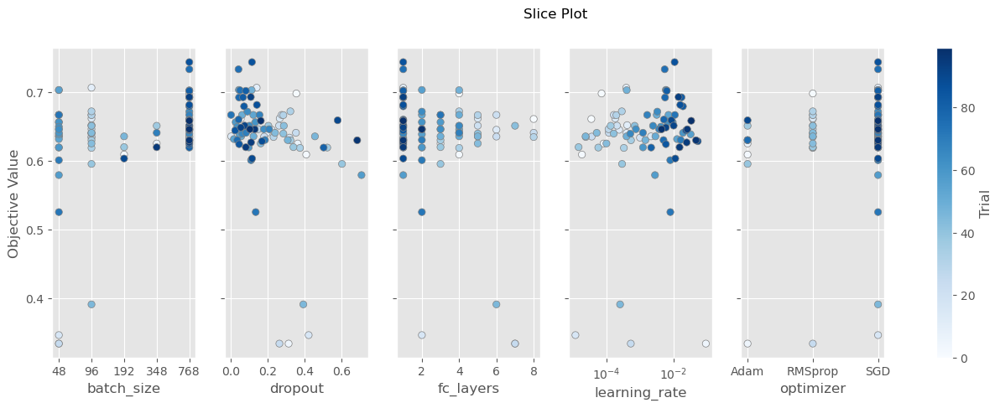

In [61]:
# Visualize individual hyperparameters as slice plot
plot_slice(study)

/tmp/ipykernel_36455/1473508994.py:2: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(study)


<Axes: title={'left': 'Hyperparameter Importances'}, xlabel='Hyperparameter Importance', ylabel='Hyperparameter'>

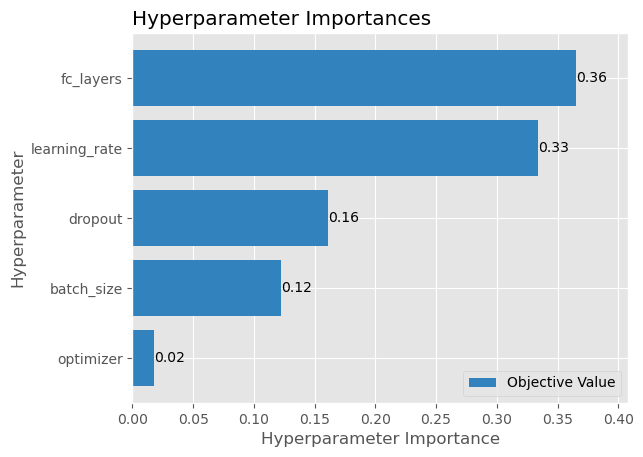

In [62]:
# Visualize parameter importances.
plot_param_importances(study)

/tmp/ipykernel_36455/3113371256.py:2: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


<Axes: title={'left': 'Hyperparameter Importances'}, xlabel='Hyperparameter Importance', ylabel='Hyperparameter'>

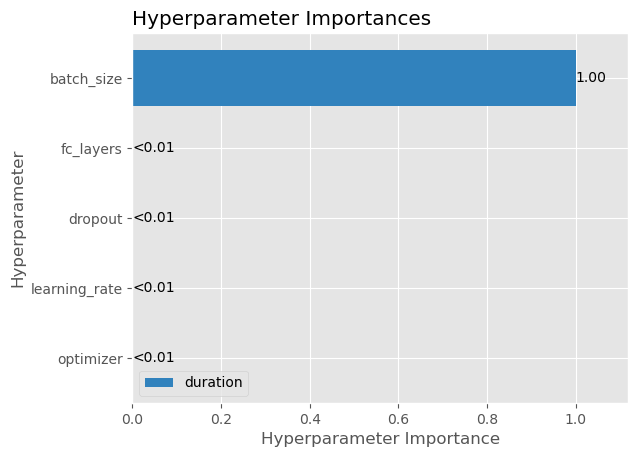

In [63]:
# Learn which hyperparameters are affecting the trial duration with hyperparameter importance.
plot_param_importances(
    study, target=lambda t: t.duration.total_seconds(), target_name="duration"
)

/tmp/ipykernel_36455/1828777839.py:2: ExperimentalWarning: plot_edf is experimental (supported from v2.2.0). The interface can change in the future.
  plot_edf(study)


<Axes: title={'center': 'Empirical Distribution Function Plot'}, xlabel='Objective Value', ylabel='Cumulative Probability'>

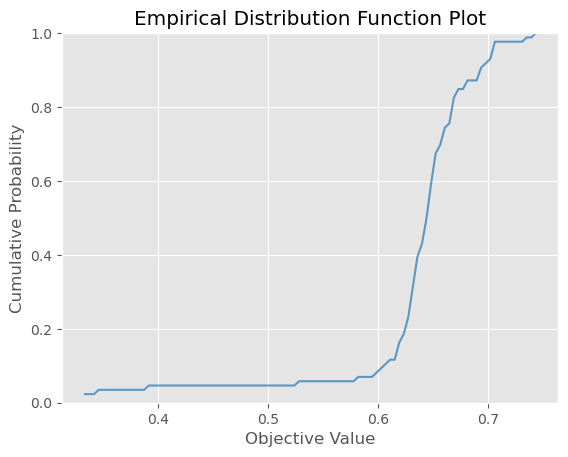

In [64]:
# Visualize empirical distribution function.
plot_edf(study)

/tmp/ipykernel_36455/1172520691.py:2: ExperimentalWarning: plot_rank is experimental (supported from v3.2.0). The interface can change in the future.
  plot_rank(study)
[W 2024-06-10 22:41:04,811] Output figures of this Matplotlib-based `plot_rank` function would be different from those of the Plotly-based `plot_rank`.


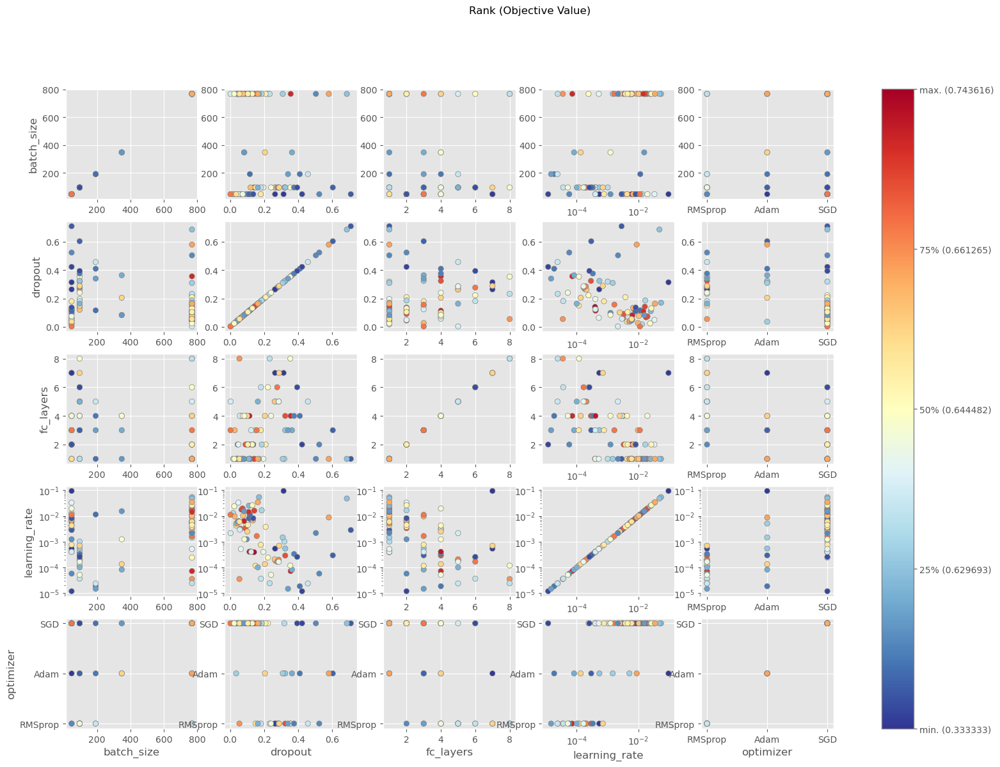

In [65]:
# Visualize parameter relations with scatter plots colored by objective values.
plot_rank(study)
set_size(15, 10)

/tmp/ipykernel_36455/124343896.py:2: ExperimentalWarning: plot_timeline is experimental (supported from v3.2.0). The interface can change in the future.
  plot_timeline(study)


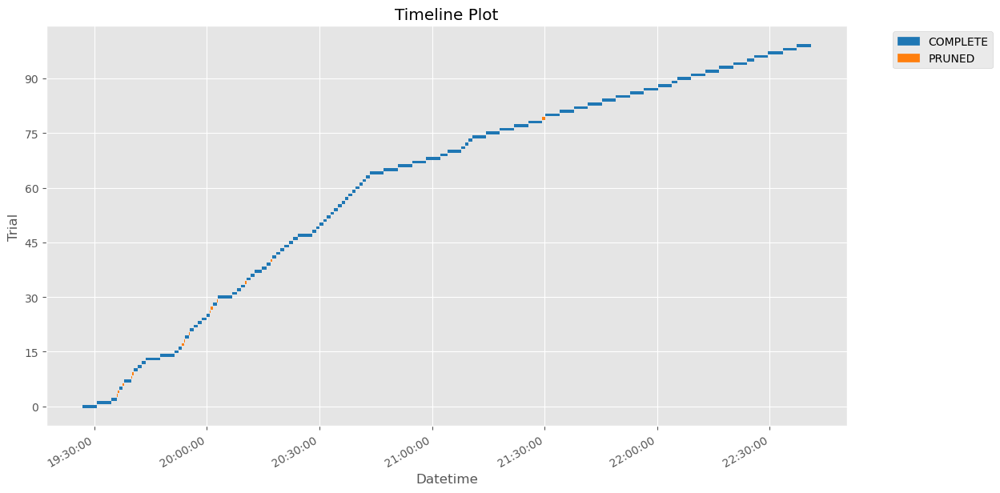

In [66]:
# Visualize the optimization timeline of performed trials.
plot_timeline(study)
set_size(10, 5)

# 3. ratio feature set

In [67]:
from sklearn.model_selection import StratifiedGroupKFold

groups = [elem for elem in subjects_ratio_ids for i in range(12)] # times 12 for each epoch
print(f'{len(ratio_graph_dataset) = }')

X = ratio_graph_dataset
Y = ratio_y_list
# first splitting train/val from test
desired_test_ratio = 0.1
n_splits = int(1 / desired_test_ratio) # for some reason (?), n_splits also determines the proportion between train & test indices
sgkf = StratifiedGroupKFold(n_splits=n_splits, shuffle=False)
trainval_idxs, test_idxs = sgkf.split(X, Y, groups).__next__()

X_trainval = [X[i] for i in trainval_idxs] # X also includes y values, because they are stored in the Data object
X_test = [X[i] for i in test_idxs]
Y_trainval =[Y[i] for i in trainval_idxs]
Y_test = [Y[i] for i in test_idxs]
groups_trainval = [groups[i] for i in trainval_idxs]

# now splitting the train from the val set
desired_val_ratio = 0.20
n_splits = int(1 / desired_val_ratio) # for some reason (?), n_splits also determines the proportion between train & test indices
sgkf = StratifiedGroupKFold(n_splits=n_splits, shuffle=False)  # should shuffle be true?

train_idxs, val_idxs = sgkf.split(X_trainval, Y_trainval, groups_trainval).__next__() # just take the first split
print(f'{len(X_trainval) = }, {len(X_test) = }')
X_train = [X_trainval[i] for i in train_idxs]
X_val = [X_trainval[i] for i in val_idxs]
Y_train = [Y_trainval[i] for i in train_idxs]
Y_val = [Y_trainval[i] for i in val_idxs]
print(f'{len(X_train) = }, {len(X_val) = }, {len(X_test) = }')

len(ratio_graph_dataset) = 1068
len(X_trainval) = 960, len(X_test) = 108
len(X_train) = 768, len(X_val) = 192, len(X_test) = 108


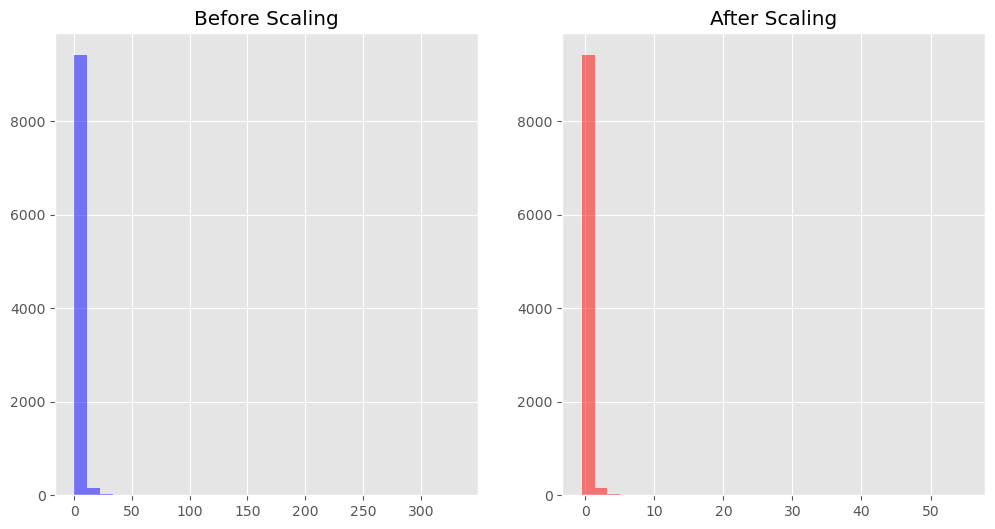

In [68]:
# standardize statistical node features
from sklearn.preprocessing import StandardScaler

# Concatenate all x values before scaling for the first feature, as a sanity check for standardization
x_before = np.concatenate([data.x.numpy()[:, 0] for data in X_train + X_val + X_test])

scaler = StandardScaler()
scaler.fit(np.vstack([data.x.numpy() for data in X_train + X_val])) # fit on training and validation data


# Transform the x values of the data in X_train
for data in X_train:
    data.x = torch.from_numpy(scaler.transform(data.x.numpy()))

# Transform the x values of the data in X_val
for data in X_val:
    data.x = torch.from_numpy(scaler.transform(data.x.numpy()))

# Transform the x values of the data in X_test
for data in X_test:
    data.x = torch.from_numpy(scaler.transform(data.x.numpy()))

# Concatenate all x values after scaling for the first feature, as a sanity check for standardization
x_after = np.concatenate([data.x.numpy()[:, 0] for data in X_train + X_val + X_test])

# Plot the distribution of the first x feature before and after scaling as a sanity check
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.hist(x_before, bins=30, color='b', alpha=0.5)
plt.title('Before Scaling')

plt.subplot(1, 2, 2)
plt.hist(x_after, bins=30, color='r', alpha=0.5)
plt.title('After Scaling')

plt.show()

### Model: graphLambda without edge_attr

In [69]:
import optuna
from optuna.integration import PyTorchLightningPruningCallback
from lightning.pytorch import Trainer
from lightning.pytorch.callbacks import RichProgressBar
import logging
import warnings

warnings.filterwarnings("ignore", ".*Consider increasing the value of the `num_workers` argument*")
warnings.filterwarnings("ignore", "Trying to infer the `batch_size` from an ambiguous collection.*")
torch.set_float32_matmul_precision('high')
logging.getLogger("lightning.pytorch.utilities.rank_zero").setLevel(logging.WARNING)
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

def objective(trial):
    # Suggest values for the hyperparameters
    learning_rate = trial.suggest_float('learning_rate', 1e-5, 1e-1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    batch_size = trial.suggest_categorical('batch_size', [48, 96, 192, 348, 768])
    fc_layers = trial.suggest_int('fc_layers', 1, 8)
    # fc_layers = 1
    dropout = trial.suggest_float('dropout', 0, 0.8)
    hyperparameters = dict(learning_rate=learning_rate, optimizer_name=optimizer_name, batch_size=batch_size, fc_layers=fc_layers, dropout=dropout)
    print(f'Tested parameters: {hyperparameters}')
    n_epochs = batch_size * 4 # vary training epochs based on batch size

    # Create the model
    model = graphLambda_wo_edge_attr(learning_rate=learning_rate, optimizer_name=optimizer_name, fc_layers=fc_layers, dropout=dropout)

    

    # Create the PyTorch Lightning trainer
    trainer = Trainer(
        accelerator='gpu',
        devices=1,
        max_epochs=n_epochs,
        callbacks=[PyTorchLightningPruningCallback(trial, monitor="val_f1")],
        enable_progress_bar=False,
        enable_model_summary=False,
        logger=True,
        enable_checkpointing=False
    )

    # Define the data loaders
    train_loader = DataLoader(X_train, batch_size=batch_size, shuffle=True,
                              drop_last=True) # , num_workers=0, persistent_workers=True
    val_loader = DataLoader(X_val, batch_size=len(X_val), shuffle=False,
                            drop_last=True) # , num_workers=0, persistent_workers=True

    # Log the hyperparameters
    trainer.logger.log_hyperparams(hyperparameters)

    # Train the model
    trainer.fit(model, train_loader, val_loader)

    # Evaluate the model
    val_f1 = trainer.callback_metrics["val_f1"].item()

    return val_f1

study = optuna.create_study(direction='maximize', pruner=optuna.pruners.ThresholdPruner(lower=0.35, n_warmup_steps=200))
study.optimize(objective, n_trials=100)

print("Best trial:")
trial = study.best_trial

print("  Value: {}".format(trial.value))

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

df = study.trials_dataframe()
df.to_pickle('ratio_ADHD_results_wo_edge_attrs_trials.pkl')

[I 2024-06-10 22:41:08,777] A new study created in memory with name: no-name-2c6b59d7-23a6-497f-9775-4cf605f13680
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (16) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Tested parameters: {'learning_rate': 0.0003345342832630627, 'optimizer_name': 'Adam', 'batch_size': 48, 'fc_layers': 5, 'dropout': 0.21632019794439084}


[I 2024-06-10 22:42:02,208] Trial 0 finished with value: 0.5866466760635376 and parameters: {'learning_rate': 0.0003345342832630627, 'optimizer': 'Adam', 'batch_size': 48, 'fc_layers': 5, 'dropout': 0.21632019794439084}. Best is trial 0 with value: 0.5866466760635376.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (8) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Tested parameters: {'learning_rate': 0.07786067011832813, 'optimizer_name': 'Adam', 'batch_size': 96, 'fc_layers': 5, 'dropout': 0.12644008438447737}


[I 2024-06-10 22:42:34,177] Trial 1 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.08200429376656992, 'optimizer_name': 'RMSprop', 'batch_size': 96, 'fc_layers': 6, 'dropout': 0.022693913254962884}


[I 2024-06-10 22:43:06,001] Trial 2 pruned. Trial was pruned at epoch 200.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (2) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Tested parameters: {'learning_rate': 0.008875318939301819, 'optimizer_name': 'Adam', 'batch_size': 348, 'fc_layers': 6, 'dropout': 0.39306558010312465}


[I 2024-06-10 22:43:20,193] Trial 3 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.00600291443476212, 'optimizer_name': 'Adam', 'batch_size': 96, 'fc_layers': 4, 'dropout': 0.13201190883318495}


[I 2024-06-10 22:43:52,457] Trial 4 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 1.8162593418346414e-05, 'optimizer_name': 'SGD', 'batch_size': 96, 'fc_layers': 7, 'dropout': 0.21910924323230907}


[I 2024-06-10 22:44:24,852] Trial 5 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.09465153707332695, 'optimizer_name': 'RMSprop', 'batch_size': 48, 'fc_layers': 6, 'dropout': 0.548652244554927}


[I 2024-06-10 22:45:20,385] Trial 6 finished with value: 0.3333333432674408 and parameters: {'learning_rate': 0.09465153707332695, 'optimizer': 'RMSprop', 'batch_size': 48, 'fc_layers': 6, 'dropout': 0.548652244554927}. Best is trial 0 with value: 0.5866466760635376.


Tested parameters: {'learning_rate': 2.2360403983254377e-05, 'optimizer_name': 'RMSprop', 'batch_size': 96, 'fc_layers': 7, 'dropout': 0.2774941885930168}


[I 2024-06-10 22:46:23,801] Trial 7 finished with value: 0.5567023754119873 and parameters: {'learning_rate': 2.2360403983254377e-05, 'optimizer': 'RMSprop', 'batch_size': 96, 'fc_layers': 7, 'dropout': 0.2774941885930168}. Best is trial 0 with value: 0.5866466760635376.


Tested parameters: {'learning_rate': 0.0001499271664258513, 'optimizer_name': 'SGD', 'batch_size': 96, 'fc_layers': 2, 'dropout': 0.7942041194212369}


[I 2024-06-10 22:46:53,540] Trial 8 pruned. Trial was pruned at epoch 200.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (1) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Tested parameters: {'learning_rate': 4.804014222377135e-05, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.5538158827816412}


[I 2024-06-10 22:47:05,536] Trial 9 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.0005503459756737997, 'optimizer_name': 'Adam', 'batch_size': 48, 'fc_layers': 1, 'dropout': 0.40704129741095885}


[I 2024-06-10 22:47:56,859] Trial 10 finished with value: 0.5402779579162598 and parameters: {'learning_rate': 0.0005503459756737997, 'optimizer': 'Adam', 'batch_size': 48, 'fc_layers': 1, 'dropout': 0.40704129741095885}. Best is trial 0 with value: 0.5866466760635376.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (4) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Tested parameters: {'learning_rate': 1.2210871216940499e-05, 'optimizer_name': 'RMSprop', 'batch_size': 192, 'fc_layers': 8, 'dropout': 0.2863540724188258}


[I 2024-06-10 22:49:13,742] Trial 11 finished with value: 0.5402779579162598 and parameters: {'learning_rate': 1.2210871216940499e-05, 'optimizer': 'RMSprop', 'batch_size': 192, 'fc_layers': 8, 'dropout': 0.2863540724188258}. Best is trial 0 with value: 0.5866466760635376.


Tested parameters: {'learning_rate': 0.00020503465623081585, 'optimizer_name': 'RMSprop', 'batch_size': 48, 'fc_layers': 8, 'dropout': 0.33147159084150724}


[I 2024-06-10 22:50:09,003] Trial 12 finished with value: 0.5657174587249756 and parameters: {'learning_rate': 0.00020503465623081585, 'optimizer': 'RMSprop', 'batch_size': 48, 'fc_layers': 8, 'dropout': 0.33147159084150724}. Best is trial 0 with value: 0.5866466760635376.


Tested parameters: {'learning_rate': 0.0004494446266885772, 'optimizer_name': 'RMSprop', 'batch_size': 48, 'fc_layers': 8, 'dropout': 0.4160133457439668}


[I 2024-06-10 22:51:04,105] Trial 13 finished with value: 0.3333333432674408 and parameters: {'learning_rate': 0.0004494446266885772, 'optimizer': 'RMSprop', 'batch_size': 48, 'fc_layers': 8, 'dropout': 0.4160133457439668}. Best is trial 0 with value: 0.5866466760635376.


Tested parameters: {'learning_rate': 0.0020888235652068896, 'optimizer_name': 'SGD', 'batch_size': 48, 'fc_layers': 4, 'dropout': 0.5359212651999942}


[I 2024-06-10 22:51:58,547] Trial 14 finished with value: 0.3333333432674408 and parameters: {'learning_rate': 0.0020888235652068896, 'optimizer': 'SGD', 'batch_size': 48, 'fc_layers': 4, 'dropout': 0.5359212651999942}. Best is trial 0 with value: 0.5866466760635376.


Tested parameters: {'learning_rate': 0.0001313052422662933, 'optimizer_name': 'Adam', 'batch_size': 48, 'fc_layers': 5, 'dropout': 0.029361103713682613}


[I 2024-06-10 22:52:52,872] Trial 15 finished with value: 0.5249979496002197 and parameters: {'learning_rate': 0.0001313052422662933, 'optimizer': 'Adam', 'batch_size': 48, 'fc_layers': 5, 'dropout': 0.029361103713682613}. Best is trial 0 with value: 0.5866466760635376.


Tested parameters: {'learning_rate': 0.00017979230617999408, 'optimizer_name': 'RMSprop', 'batch_size': 768, 'fc_layers': 7, 'dropout': 0.17623859459949984}


[I 2024-06-10 22:56:04,110] Trial 16 finished with value: 0.5971112847328186 and parameters: {'learning_rate': 0.00017979230617999408, 'optimizer': 'RMSprop', 'batch_size': 768, 'fc_layers': 7, 'dropout': 0.17623859459949984}. Best is trial 16 with value: 0.5971112847328186.


Tested parameters: {'learning_rate': 0.0013162856028611312, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.15870753653828587}


[I 2024-06-10 22:59:18,672] Trial 17 finished with value: 0.5529134273529053 and parameters: {'learning_rate': 0.0013162856028611312, 'optimizer': 'Adam', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.15870753653828587}. Best is trial 16 with value: 0.5971112847328186.


Tested parameters: {'learning_rate': 5.861428978527489e-05, 'optimizer_name': 'RMSprop', 'batch_size': 768, 'fc_layers': 7, 'dropout': 0.20752864174705077}


[I 2024-06-10 23:02:30,919] Trial 18 finished with value: 0.5613099932670593 and parameters: {'learning_rate': 5.861428978527489e-05, 'optimizer': 'RMSprop', 'batch_size': 768, 'fc_layers': 7, 'dropout': 0.20752864174705077}. Best is trial 16 with value: 0.5971112847328186.


Tested parameters: {'learning_rate': 0.0033889351389168694, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 5, 'dropout': 0.08334832618931329}


[I 2024-06-10 23:03:47,189] Trial 19 finished with value: 0.5767357349395752 and parameters: {'learning_rate': 0.0033889351389168694, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 5, 'dropout': 0.08334832618931329}. Best is trial 16 with value: 0.5971112847328186.


Tested parameters: {'learning_rate': 0.0004465927261924388, 'optimizer_name': 'Adam', 'batch_size': 348, 'fc_layers': 6, 'dropout': 0.7600163782398788}


[I 2024-06-10 23:04:01,228] Trial 20 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.004983160157441049, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 5, 'dropout': 0.09754698993214136}


[I 2024-06-10 23:05:16,002] Trial 21 finished with value: 0.5728703141212463 and parameters: {'learning_rate': 0.004983160157441049, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 5, 'dropout': 0.09754698993214136}. Best is trial 16 with value: 0.5971112847328186.


Tested parameters: {'learning_rate': 0.013061745083578272, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.08183886122159777}


[I 2024-06-10 23:06:32,437] Trial 22 finished with value: 0.5392167568206787 and parameters: {'learning_rate': 0.013061745083578272, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.08183886122159777}. Best is trial 16 with value: 0.5971112847328186.


Tested parameters: {'learning_rate': 0.002287649632220577, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.19326371371856263}


[I 2024-06-10 23:09:40,799] Trial 23 finished with value: 0.5408695936203003 and parameters: {'learning_rate': 0.002287649632220577, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.19326371371856263}. Best is trial 16 with value: 0.5971112847328186.


Tested parameters: {'learning_rate': 0.026116006956403585, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 5, 'dropout': 0.010929213756907183}


[I 2024-06-10 23:10:56,295] Trial 24 finished with value: 0.5885305404663086 and parameters: {'learning_rate': 0.026116006956403585, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 5, 'dropout': 0.010929213756907183}. Best is trial 16 with value: 0.5971112847328186.


Tested parameters: {'learning_rate': 0.017099757882912375, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 7, 'dropout': 0.0006467737689901665}


[I 2024-06-10 23:11:08,728] Trial 25 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.0007502395173497508, 'optimizer_name': 'RMSprop', 'batch_size': 192, 'fc_layers': 6, 'dropout': 0.26588054363872354}


[I 2024-06-10 23:11:28,693] Trial 26 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.025618754186687367, 'optimizer_name': 'SGD', 'batch_size': 348, 'fc_layers': 4, 'dropout': 0.07269267371652399}


[I 2024-06-10 23:13:04,869] Trial 27 finished with value: 0.5207812786102295 and parameters: {'learning_rate': 0.025618754186687367, 'optimizer': 'SGD', 'batch_size': 348, 'fc_layers': 4, 'dropout': 0.07269267371652399}. Best is trial 16 with value: 0.5971112847328186.


Tested parameters: {'learning_rate': 6.269308193952041e-05, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.3380032046011907}


[I 2024-06-10 23:16:15,925] Trial 28 finished with value: 0.5949921607971191 and parameters: {'learning_rate': 6.269308193952041e-05, 'optimizer': 'Adam', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.3380032046011907}. Best is trial 16 with value: 0.5971112847328186.


Tested parameters: {'learning_rate': 7.572939134485436e-05, 'optimizer_name': 'RMSprop', 'batch_size': 768, 'fc_layers': 2, 'dropout': 0.48552926743641395}


[I 2024-06-10 23:19:25,559] Trial 29 finished with value: 0.5728703141212463 and parameters: {'learning_rate': 7.572939134485436e-05, 'optimizer': 'RMSprop', 'batch_size': 768, 'fc_layers': 2, 'dropout': 0.48552926743641395}. Best is trial 16 with value: 0.5971112847328186.


Tested parameters: {'learning_rate': 3.3842098600490246e-05, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.6589892487476736}


[I 2024-06-10 23:19:37,917] Trial 30 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.00026206742490164837, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.3381743973263552}


[I 2024-06-10 23:22:48,499] Trial 31 finished with value: 0.5206252336502075 and parameters: {'learning_rate': 0.00026206742490164837, 'optimizer': 'Adam', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.3381743973263552}. Best is trial 16 with value: 0.5971112847328186.


Tested parameters: {'learning_rate': 0.00010765327843585108, 'optimizer_name': 'Adam', 'batch_size': 192, 'fc_layers': 6, 'dropout': 0.16036276703201346}


[I 2024-06-10 23:24:05,553] Trial 32 finished with value: 0.541218638420105 and parameters: {'learning_rate': 0.00010765327843585108, 'optimizer': 'Adam', 'batch_size': 192, 'fc_layers': 6, 'dropout': 0.16036276703201346}. Best is trial 16 with value: 0.5971112847328186.


Tested parameters: {'learning_rate': 0.0003073399414554345, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.3145758646052038}


[I 2024-06-10 23:27:16,415] Trial 33 finished with value: 0.4739440679550171 and parameters: {'learning_rate': 0.0003073399414554345, 'optimizer': 'Adam', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.3145758646052038}. Best is trial 16 with value: 0.5971112847328186.


Tested parameters: {'learning_rate': 0.0013628975700321884, 'optimizer_name': 'Adam', 'batch_size': 348, 'fc_layers': 4, 'dropout': 0.20882694938516752}


[I 2024-06-10 23:28:54,699] Trial 34 finished with value: 0.49246490001678467 and parameters: {'learning_rate': 0.0013628975700321884, 'optimizer': 'Adam', 'batch_size': 348, 'fc_layers': 4, 'dropout': 0.20882694938516752}. Best is trial 16 with value: 0.5971112847328186.


Tested parameters: {'learning_rate': 0.036646419013465555, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 6, 'dropout': 0.36879636160580276}


[I 2024-06-10 23:29:07,307] Trial 35 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.05025615373069632, 'optimizer_name': 'Adam', 'batch_size': 48, 'fc_layers': 7, 'dropout': 0.24630454396206297}


[I 2024-06-10 23:30:02,951] Trial 36 finished with value: 0.3333333432674408 and parameters: {'learning_rate': 0.05025615373069632, 'optimizer': 'Adam', 'batch_size': 48, 'fc_layers': 7, 'dropout': 0.24630454396206297}. Best is trial 16 with value: 0.5971112847328186.


Tested parameters: {'learning_rate': 3.184128604214474e-05, 'optimizer_name': 'RMSprop', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.1407222365176704}


[I 2024-06-10 23:31:18,098] Trial 37 finished with value: 0.6080886125564575 and parameters: {'learning_rate': 3.184128604214474e-05, 'optimizer': 'RMSprop', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.1407222365176704}. Best is trial 37 with value: 0.6080886125564575.


Tested parameters: {'learning_rate': 1.0313447810803822e-05, 'optimizer_name': 'RMSprop', 'batch_size': 192, 'fc_layers': 3, 'dropout': 0.12408489195619875}


[I 2024-06-10 23:32:32,252] Trial 38 finished with value: 0.5567023754119873 and parameters: {'learning_rate': 1.0313447810803822e-05, 'optimizer': 'RMSprop', 'batch_size': 192, 'fc_layers': 3, 'dropout': 0.12408489195619875}. Best is trial 37 with value: 0.6080886125564575.


Tested parameters: {'learning_rate': 2.947811289158527e-05, 'optimizer_name': 'RMSprop', 'batch_size': 192, 'fc_layers': 3, 'dropout': 0.043427278681840376}


[I 2024-06-10 23:33:48,001] Trial 39 finished with value: 0.47911015152931213 and parameters: {'learning_rate': 2.947811289158527e-05, 'optimizer': 'RMSprop', 'batch_size': 192, 'fc_layers': 3, 'dropout': 0.043427278681840376}. Best is trial 37 with value: 0.6080886125564575.


Tested parameters: {'learning_rate': 9.809685747153416e-05, 'optimizer_name': 'RMSprop', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.14849938618356806}


[I 2024-06-10 23:35:05,017] Trial 40 finished with value: 0.5607843399047852 and parameters: {'learning_rate': 9.809685747153416e-05, 'optimizer': 'RMSprop', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.14849938618356806}. Best is trial 37 with value: 0.6080886125564575.


Tested parameters: {'learning_rate': 4.4387494298021636e-05, 'optimizer_name': 'RMSprop', 'batch_size': 96, 'fc_layers': 6, 'dropout': 0.23690370526837334}


[I 2024-06-10 23:36:06,557] Trial 41 finished with value: 0.5712418556213379 and parameters: {'learning_rate': 4.4387494298021636e-05, 'optimizer': 'RMSprop', 'batch_size': 96, 'fc_layers': 6, 'dropout': 0.23690370526837334}. Best is trial 37 with value: 0.6080886125564575.


Tested parameters: {'learning_rate': 2.0039841716165787e-05, 'optimizer_name': 'RMSprop', 'batch_size': 192, 'fc_layers': 5, 'dropout': 0.1780873788784488}


[I 2024-06-10 23:37:22,168] Trial 42 finished with value: 0.5465674996376038 and parameters: {'learning_rate': 2.0039841716165787e-05, 'optimizer': 'RMSprop', 'batch_size': 192, 'fc_layers': 5, 'dropout': 0.1780873788784488}. Best is trial 37 with value: 0.6080886125564575.


Tested parameters: {'learning_rate': 0.00018806782746410344, 'optimizer_name': 'RMSprop', 'batch_size': 48, 'fc_layers': 4, 'dropout': 0.11616960595907759}


[I 2024-06-10 23:38:16,846] Trial 43 finished with value: 0.5833333134651184 and parameters: {'learning_rate': 0.00018806782746410344, 'optimizer': 'RMSprop', 'batch_size': 48, 'fc_layers': 4, 'dropout': 0.11616960595907759}. Best is trial 37 with value: 0.6080886125564575.


Tested parameters: {'learning_rate': 6.680325390870113e-05, 'optimizer_name': 'SGD', 'batch_size': 96, 'fc_layers': 2, 'dropout': 0.04920422765708439}


[I 2024-06-10 23:39:15,431] Trial 44 finished with value: 0.4850574731826782 and parameters: {'learning_rate': 6.680325390870113e-05, 'optimizer': 'SGD', 'batch_size': 96, 'fc_layers': 2, 'dropout': 0.04920422765708439}. Best is trial 37 with value: 0.6080886125564575.


Tested parameters: {'learning_rate': 0.00028218521423711216, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 6, 'dropout': 0.2744822336185855}


[I 2024-06-10 23:42:27,360] Trial 45 finished with value: 0.5207812786102295 and parameters: {'learning_rate': 0.00028218521423711216, 'optimizer': 'Adam', 'batch_size': 768, 'fc_layers': 6, 'dropout': 0.2744822336185855}. Best is trial 37 with value: 0.6080886125564575.


Tested parameters: {'learning_rate': 1.6377336378418717e-05, 'optimizer_name': 'RMSprop', 'batch_size': 48, 'fc_layers': 5, 'dropout': 0.46673268407688684}


[I 2024-06-10 23:43:22,272] Trial 46 finished with value: 0.5625 and parameters: {'learning_rate': 1.6377336378418717e-05, 'optimizer': 'RMSprop', 'batch_size': 48, 'fc_layers': 5, 'dropout': 0.46673268407688684}. Best is trial 37 with value: 0.6080886125564575.


Tested parameters: {'learning_rate': 3.793757964492441e-05, 'optimizer_name': 'Adam', 'batch_size': 192, 'fc_layers': 7, 'dropout': 0.3049037428267178}


[I 2024-06-10 23:44:41,767] Trial 47 finished with value: 0.5364457368850708 and parameters: {'learning_rate': 3.793757964492441e-05, 'optimizer': 'Adam', 'batch_size': 192, 'fc_layers': 7, 'dropout': 0.3049037428267178}. Best is trial 37 with value: 0.6080886125564575.


Tested parameters: {'learning_rate': 0.00015156585391745323, 'optimizer_name': 'SGD', 'batch_size': 348, 'fc_layers': 4, 'dropout': 0.0012696386554926237}


[I 2024-06-10 23:46:21,126] Trial 48 finished with value: 0.5097505450248718 and parameters: {'learning_rate': 0.00015156585391745323, 'optimizer': 'SGD', 'batch_size': 348, 'fc_layers': 4, 'dropout': 0.0012696386554926237}. Best is trial 37 with value: 0.6080886125564575.


Tested parameters: {'learning_rate': 0.0007769250058268126, 'optimizer_name': 'RMSprop', 'batch_size': 48, 'fc_layers': 8, 'dropout': 0.3595932849250037}


[I 2024-06-10 23:47:16,720] Trial 49 finished with value: 0.3333333432674408 and parameters: {'learning_rate': 0.0007769250058268126, 'optimizer': 'RMSprop', 'batch_size': 48, 'fc_layers': 8, 'dropout': 0.3595932849250037}. Best is trial 37 with value: 0.6080886125564575.


Tested parameters: {'learning_rate': 8.360876836502738e-05, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.23697777734383377}


[I 2024-06-10 23:50:24,117] Trial 50 finished with value: 0.49444881081581116 and parameters: {'learning_rate': 8.360876836502738e-05, 'optimizer': 'Adam', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.23697777734383377}. Best is trial 37 with value: 0.6080886125564575.


Tested parameters: {'learning_rate': 0.00020022914887438473, 'optimizer_name': 'RMSprop', 'batch_size': 48, 'fc_layers': 4, 'dropout': 0.11866889341540864}


[I 2024-06-10 23:51:20,971] Trial 51 finished with value: 0.557183563709259 and parameters: {'learning_rate': 0.00020022914887438473, 'optimizer': 'RMSprop', 'batch_size': 48, 'fc_layers': 4, 'dropout': 0.11866889341540864}. Best is trial 37 with value: 0.6080886125564575.


Tested parameters: {'learning_rate': 0.00017291212677453344, 'optimizer_name': 'RMSprop', 'batch_size': 48, 'fc_layers': 4, 'dropout': 0.12108808017405161}


[I 2024-06-10 23:52:13,906] Trial 52 finished with value: 0.5103635191917419 and parameters: {'learning_rate': 0.00017291212677453344, 'optimizer': 'RMSprop', 'batch_size': 48, 'fc_layers': 4, 'dropout': 0.12108808017405161}. Best is trial 37 with value: 0.6080886125564575.


Tested parameters: {'learning_rate': 0.0005190334049320604, 'optimizer_name': 'RMSprop', 'batch_size': 48, 'fc_layers': 5, 'dropout': 0.1506187411479395}


[I 2024-06-10 23:53:11,914] Trial 53 finished with value: 0.3333333432674408 and parameters: {'learning_rate': 0.0005190334049320604, 'optimizer': 'RMSprop', 'batch_size': 48, 'fc_layers': 5, 'dropout': 0.1506187411479395}. Best is trial 37 with value: 0.6080886125564575.


Tested parameters: {'learning_rate': 0.00036484916743662873, 'optimizer_name': 'RMSprop', 'batch_size': 48, 'fc_layers': 3, 'dropout': 0.06206344264119208}


[I 2024-06-10 23:54:04,921] Trial 54 finished with value: 0.3333333432674408 and parameters: {'learning_rate': 0.00036484916743662873, 'optimizer': 'RMSprop', 'batch_size': 48, 'fc_layers': 3, 'dropout': 0.06206344264119208}. Best is trial 37 with value: 0.6080886125564575.


Tested parameters: {'learning_rate': 0.00011956488793667613, 'optimizer_name': 'RMSprop', 'batch_size': 96, 'fc_layers': 4, 'dropout': 0.11207840084256501}


[I 2024-06-10 23:55:04,603] Trial 55 finished with value: 0.5567023754119873 and parameters: {'learning_rate': 0.00011956488793667613, 'optimizer': 'RMSprop', 'batch_size': 96, 'fc_layers': 4, 'dropout': 0.11207840084256501}. Best is trial 37 with value: 0.6080886125564575.


Tested parameters: {'learning_rate': 5.540105509377848e-05, 'optimizer_name': 'SGD', 'batch_size': 48, 'fc_layers': 5, 'dropout': 0.18491621605718506}


[I 2024-06-10 23:55:57,239] Trial 56 finished with value: 0.3685544431209564 and parameters: {'learning_rate': 5.540105509377848e-05, 'optimizer': 'SGD', 'batch_size': 48, 'fc_layers': 5, 'dropout': 0.18491621605718506}. Best is trial 37 with value: 0.6080886125564575.


Tested parameters: {'learning_rate': 0.00020402742409898265, 'optimizer_name': 'RMSprop', 'batch_size': 192, 'fc_layers': 5, 'dropout': 0.025968081595758735}


[I 2024-06-10 23:56:17,096] Trial 57 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 2.643501646327561e-05, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 6, 'dropout': 0.08960538617474352}


[I 2024-06-10 23:59:29,022] Trial 58 finished with value: 0.5095652341842651 and parameters: {'learning_rate': 2.643501646327561e-05, 'optimizer': 'Adam', 'batch_size': 768, 'fc_layers': 6, 'dropout': 0.08960538617474352}. Best is trial 37 with value: 0.6080886125564575.


Tested parameters: {'learning_rate': 0.0006431545197152392, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.22208970375062426}


[I 2024-06-11 00:00:45,120] Trial 59 finished with value: 0.591578483581543 and parameters: {'learning_rate': 0.0006431545197152392, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.22208970375062426}. Best is trial 37 with value: 0.6080886125564575.


Tested parameters: {'learning_rate': 0.0009224874211093592, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 3, 'dropout': 0.43691821187765245}


[I 2024-06-11 00:01:04,629] Trial 60 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.0006291104327240684, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.20950694129354874}


[I 2024-06-11 00:02:20,223] Trial 61 finished with value: 0.5883452892303467 and parameters: {'learning_rate': 0.0006291104327240684, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.20950694129354874}. Best is trial 37 with value: 0.6080886125564575.


Tested parameters: {'learning_rate': 0.0012222048031773811, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.2273971650518805}


[I 2024-06-11 00:03:33,986] Trial 62 finished with value: 0.5552527904510498 and parameters: {'learning_rate': 0.0012222048031773811, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.2273971650518805}. Best is trial 37 with value: 0.6080886125564575.


Tested parameters: {'learning_rate': 0.0018693195481503527, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 5, 'dropout': 0.2946094068264905}


[I 2024-06-11 00:04:50,261] Trial 63 finished with value: 0.5814454555511475 and parameters: {'learning_rate': 0.0018693195481503527, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 5, 'dropout': 0.2946094068264905}. Best is trial 37 with value: 0.6080886125564575.


Tested parameters: {'learning_rate': 0.0006099508579192623, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.26142940034460793}


[I 2024-06-11 00:05:09,987] Trial 64 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.007172924148848893, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 3, 'dropout': 0.2064675642706795}


[I 2024-06-11 00:06:24,038] Trial 65 finished with value: 0.6006568670272827 and parameters: {'learning_rate': 0.007172924148848893, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 3, 'dropout': 0.2064675642706795}. Best is trial 37 with value: 0.6080886125564575.


Tested parameters: {'learning_rate': 0.0077202469373365435, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 2, 'dropout': 0.17432678367870647}


[I 2024-06-11 00:07:37,510] Trial 66 finished with value: 0.501298725605011 and parameters: {'learning_rate': 0.0077202469373365435, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 2, 'dropout': 0.17432678367870647}. Best is trial 37 with value: 0.6080886125564575.


Tested parameters: {'learning_rate': 0.003731414465716164, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 3, 'dropout': 0.20636871907410514}


[I 2024-06-11 00:08:51,804] Trial 67 finished with value: 0.5520347356796265 and parameters: {'learning_rate': 0.003731414465716164, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 3, 'dropout': 0.20636871907410514}. Best is trial 37 with value: 0.6080886125564575.


Tested parameters: {'learning_rate': 0.013354871318790061, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 2, 'dropout': 0.3284600206840981}


[I 2024-06-11 00:10:05,094] Trial 68 finished with value: 0.5623100399971008 and parameters: {'learning_rate': 0.013354871318790061, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 2, 'dropout': 0.3284600206840981}. Best is trial 37 with value: 0.6080886125564575.


Tested parameters: {'learning_rate': 0.04770102117140273, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 3, 'dropout': 0.38928781208939467}


[I 2024-06-11 00:11:18,937] Trial 69 finished with value: 0.5676027536392212 and parameters: {'learning_rate': 0.04770102117140273, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 3, 'dropout': 0.38928781208939467}. Best is trial 37 with value: 0.6080886125564575.


Tested parameters: {'learning_rate': 0.022924114066987245, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.15027198115664378}


[I 2024-06-11 00:12:33,320] Trial 70 finished with value: 0.5518888235092163 and parameters: {'learning_rate': 0.022924114066987245, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.15027198115664378}. Best is trial 37 with value: 0.6080886125564575.


Tested parameters: {'learning_rate': 0.08748468291842859, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 5, 'dropout': 0.21287239234521738}


[I 2024-06-11 00:13:53,258] Trial 71 finished with value: 0.5364457368850708 and parameters: {'learning_rate': 0.08748468291842859, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 5, 'dropout': 0.21287239234521738}. Best is trial 37 with value: 0.6080886125564575.


Tested parameters: {'learning_rate': 0.00041985409897824026, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 8, 'dropout': 0.2586433303952771}


[I 2024-06-11 00:17:06,977] Trial 72 finished with value: 0.48051947355270386 and parameters: {'learning_rate': 0.00041985409897824026, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 8, 'dropout': 0.2586433303952771}. Best is trial 37 with value: 0.6080886125564575.


Tested parameters: {'learning_rate': 0.0006318361383427631, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 5, 'dropout': 0.28788284469945813}


[I 2024-06-11 00:18:25,120] Trial 73 finished with value: 0.571232259273529 and parameters: {'learning_rate': 0.0006318361383427631, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 5, 'dropout': 0.28788284469945813}. Best is trial 37 with value: 0.6080886125564575.


Tested parameters: {'learning_rate': 0.0002594096564845213, 'optimizer_name': 'Adam', 'batch_size': 348, 'fc_layers': 4, 'dropout': 0.19144779332738784}


[I 2024-06-11 00:20:02,245] Trial 74 finished with value: 0.5871866941452026 and parameters: {'learning_rate': 0.0002594096564845213, 'optimizer': 'Adam', 'batch_size': 348, 'fc_layers': 4, 'dropout': 0.19144779332738784}. Best is trial 37 with value: 0.6080886125564575.


Tested parameters: {'learning_rate': 0.001711881431248682, 'optimizer_name': 'Adam', 'batch_size': 348, 'fc_layers': 3, 'dropout': 0.19582068458349808}


[I 2024-06-11 00:20:16,609] Trial 75 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.0010389724609792053, 'optimizer_name': 'SGD', 'batch_size': 348, 'fc_layers': 4, 'dropout': 0.17209623806512353}


[I 2024-06-11 00:20:31,015] Trial 76 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.0025064820105815968, 'optimizer_name': 'Adam', 'batch_size': 348, 'fc_layers': 4, 'dropout': 0.6077080560195145}


[I 2024-06-11 00:20:45,063] Trial 77 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.06325857021191222, 'optimizer_name': 'SGD', 'batch_size': 348, 'fc_layers': 3, 'dropout': 0.22925559237073057}


[I 2024-06-11 00:22:25,561] Trial 78 finished with value: 0.5601614713668823 and parameters: {'learning_rate': 0.06325857021191222, 'optimizer': 'SGD', 'batch_size': 348, 'fc_layers': 3, 'dropout': 0.22925559237073057}. Best is trial 37 with value: 0.6080886125564575.


Tested parameters: {'learning_rate': 0.00026245830118614246, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.15126117373399867}


[I 2024-06-11 00:25:35,123] Trial 79 finished with value: 0.5747915506362915 and parameters: {'learning_rate': 0.00026245830118614246, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.15126117373399867}. Best is trial 37 with value: 0.6080886125564575.


Tested parameters: {'learning_rate': 0.009500118864686304, 'optimizer_name': 'Adam', 'batch_size': 192, 'fc_layers': 3, 'dropout': 0.13712910707364964}


[I 2024-06-11 00:25:54,603] Trial 80 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.000341300212138598, 'optimizer_name': 'Adam', 'batch_size': 192, 'fc_layers': 5, 'dropout': 0.24456042461271976}


[I 2024-06-11 00:27:16,430] Trial 81 finished with value: 0.5416169166564941 and parameters: {'learning_rate': 0.000341300212138598, 'optimizer': 'Adam', 'batch_size': 192, 'fc_layers': 5, 'dropout': 0.24456042461271976}. Best is trial 37 with value: 0.6080886125564575.


Tested parameters: {'learning_rate': 1.5815500507246956e-05, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.19763515285087446}


[I 2024-06-11 00:30:27,258] Trial 82 finished with value: 0.5414676666259766 and parameters: {'learning_rate': 1.5815500507246956e-05, 'optimizer': 'Adam', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.19763515285087446}. Best is trial 37 with value: 0.6080886125564575.


Tested parameters: {'learning_rate': 0.00013557207175579343, 'optimizer_name': 'Adam', 'batch_size': 348, 'fc_layers': 6, 'dropout': 0.10079894296615713}


[I 2024-06-11 00:32:05,373] Trial 83 finished with value: 0.557183563709259 and parameters: {'learning_rate': 0.00013557207175579343, 'optimizer': 'Adam', 'batch_size': 348, 'fc_layers': 6, 'dropout': 0.10079894296615713}. Best is trial 37 with value: 0.6080886125564575.


Tested parameters: {'learning_rate': 0.00047652326933872224, 'optimizer_name': 'Adam', 'batch_size': 96, 'fc_layers': 7, 'dropout': 0.218856672315363}


[I 2024-06-11 00:33:09,542] Trial 84 finished with value: 0.5299749970436096 and parameters: {'learning_rate': 0.00047652326933872224, 'optimizer': 'Adam', 'batch_size': 96, 'fc_layers': 7, 'dropout': 0.218856672315363}. Best is trial 37 with value: 0.6080886125564575.


Tested parameters: {'learning_rate': 8.812899290620354e-05, 'optimizer_name': 'Adam', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.27877003276446644}


[I 2024-06-11 00:34:26,357] Trial 85 finished with value: 0.5254108309745789 and parameters: {'learning_rate': 8.812899290620354e-05, 'optimizer': 'Adam', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.27877003276446644}. Best is trial 37 with value: 0.6080886125564575.


Tested parameters: {'learning_rate': 0.00024064985705827668, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.17060083489244335}


[I 2024-06-11 00:37:36,331] Trial 86 finished with value: 0.5039032697677612 and parameters: {'learning_rate': 0.00024064985705827668, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.17060083489244335}. Best is trial 37 with value: 0.6080886125564575.


Tested parameters: {'learning_rate': 0.0004064549309700572, 'optimizer_name': 'Adam', 'batch_size': 192, 'fc_layers': 5, 'dropout': 0.3501121319347011}


[I 2024-06-11 00:38:52,247] Trial 87 finished with value: 0.5182720422744751 and parameters: {'learning_rate': 0.0004064549309700572, 'optimizer': 'Adam', 'batch_size': 192, 'fc_layers': 5, 'dropout': 0.3501121319347011}. Best is trial 37 with value: 0.6080886125564575.


Tested parameters: {'learning_rate': 0.0007614242817965542, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.06618452919511117}


[I 2024-06-11 00:40:06,900] Trial 88 finished with value: 0.6189544200897217 and parameters: {'learning_rate': 0.0007614242817965542, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.06618452919511117}. Best is trial 88 with value: 0.6189544200897217.


Tested parameters: {'learning_rate': 0.0008060727309230335, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.042709809068266213}


[I 2024-06-11 00:41:22,853] Trial 89 finished with value: 0.5642925500869751 and parameters: {'learning_rate': 0.0008060727309230335, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.042709809068266213}. Best is trial 88 with value: 0.6189544200897217.


Tested parameters: {'learning_rate': 4.674800146082944e-05, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 3, 'dropout': 0.07078424656313471}


[I 2024-06-11 00:42:37,753] Trial 90 finished with value: 0.5108346939086914 and parameters: {'learning_rate': 4.674800146082944e-05, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 3, 'dropout': 0.07078424656313471}. Best is trial 88 with value: 0.6189544200897217.


Tested parameters: {'learning_rate': 0.0006118792111986227, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.009055758993234301}


[I 2024-06-11 00:43:52,370] Trial 91 finished with value: 0.6142065525054932 and parameters: {'learning_rate': 0.0006118792111986227, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.009055758993234301}. Best is trial 88 with value: 0.6189544200897217.


Tested parameters: {'learning_rate': 0.0006632223804111131, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.0011163094221259134}


[I 2024-06-11 00:45:06,944] Trial 92 finished with value: 0.5712418556213379 and parameters: {'learning_rate': 0.0006632223804111131, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.0011163094221259134}. Best is trial 88 with value: 0.6189544200897217.


Tested parameters: {'learning_rate': 0.0014906994399824132, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.05734904561044141}


[I 2024-06-11 00:46:21,175] Trial 93 finished with value: 0.5866466760635376 and parameters: {'learning_rate': 0.0014906994399824132, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.05734904561044141}. Best is trial 88 with value: 0.6189544200897217.


Tested parameters: {'learning_rate': 0.001171850002334454, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.03722747493273643}


[I 2024-06-11 00:47:35,094] Trial 94 finished with value: 0.5721738934516907 and parameters: {'learning_rate': 0.001171850002334454, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.03722747493273643}. Best is trial 88 with value: 0.6189544200897217.


Tested parameters: {'learning_rate': 0.0009536395865383352, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.021586062601882526}


[I 2024-06-11 00:48:50,358] Trial 95 finished with value: 0.5728703141212463 and parameters: {'learning_rate': 0.0009536395865383352, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.021586062601882526}. Best is trial 88 with value: 0.6189544200897217.


Tested parameters: {'learning_rate': 0.0029088564086586412, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 3, 'dropout': 0.09310466165297113}


[I 2024-06-11 00:50:05,534] Trial 96 finished with value: 0.5392167568206787 and parameters: {'learning_rate': 0.0029088564086586412, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 3, 'dropout': 0.09310466165297113}. Best is trial 88 with value: 0.6189544200897217.


Tested parameters: {'learning_rate': 0.0005329985177881133, 'optimizer_name': 'RMSprop', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.013021158097885122}


[I 2024-06-11 00:50:18,176] Trial 97 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.028699963545354538, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.07533509932126288}


[I 2024-06-11 00:51:31,530] Trial 98 finished with value: 0.5458771586418152 and parameters: {'learning_rate': 0.028699963545354538, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.07533509932126288}. Best is trial 88 with value: 0.6189544200897217.


Tested parameters: {'learning_rate': 6.781007478838999e-05, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 5, 'dropout': 0.1321782892929091}


[I 2024-06-11 00:52:49,929] Trial 99 finished with value: 0.5440923571586609 and parameters: {'learning_rate': 6.781007478838999e-05, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 5, 'dropout': 0.1321782892929091}. Best is trial 88 with value: 0.6189544200897217.


Best trial:
  Value: 0.6189544200897217
  Params: 
    learning_rate: 0.0007614242817965542
    optimizer: SGD
    batch_size: 192
    fc_layers: 4
    dropout: 0.06618452919511117


In [70]:
df_trials = pd.read_pickle('ratio_ADHD_results_wo_edge_attrs_trials.pkl')
df_trials.sort_values('value', ascending=False).head(10)

,number,value,datetime_start,datetime_complete,duration,params_batch_size,params_dropout,params_fc_layers,params_learning_rate,params_optimizer,state
88,88,0.618954,2024-06-11 00:38:52.249575,2024-06-11 00:40:06.899495,0 days 00:01:14.649920,192,0.066185,4,0.000761,SGD,COMPLETE
91,91,0.614207,2024-06-11 00:42:37.753939,2024-06-11 00:43:52.369734,0 days 00:01:14.615795,192,0.009056,4,0.000612,SGD,COMPLETE
37,37,0.608089,2024-06-10 23:30:02.952806,2024-06-10 23:31:18.097195,0 days 00:01:15.144389,192,0.140722,4,0.000032,RMSprop,COMPLETE
65,65,0.600657,2024-06-11 00:05:09.988669,2024-06-11 00:06:24.037291,0 days 00:01:14.048622,192,0.206468,3,0.007173,SGD,COMPLETE
16,16,0.597111,2024-06-10 22:52:52.872926,2024-06-10 22:56:04.106557,0 days 00:03:11.233631,768,0.176239,7,0.000180,RMSprop,COMPLETE
28,28,0.594992,2024-06-10 23:13:04.870803,2024-06-10 23:16:15.921547,0 days 00:03:11.050744,768,0.338003,5,0.000063,Adam,COMPLETE
59,59,0.591578,2024-06-10 23:59:29.023031,2024-06-11 00:00:45.119337,0 days 00:01:16.096306,192,0.222090,4,0.000643,SGD,COMPLETE
24,24,0.588531,2024-06-10 23:09:40.800592,2024-06-10 23:10:56.292673,0 days 00:01:15.492081,192,0.010929,5,0.026116,SGD,COMPLETE
61,61,0.588345,2024-06-11 00:01:04.631741,2024-06-11 00:02:20.222459,0 days 00:01:15.590718,192,0.209507,4,0.000629,SGD,COMPLETE
74,74,0.587187,2024-06-11 00:18:25.120936,2024-06-11 00:20:02.243892,0 days 00:01:37.122956,348,0.191448,4,0.000259,Adam,COMPLETE


#### Visualizations

/tmp/ipykernel_36455/1755039964.py:2: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(study)


<Axes: title={'center': 'Optimization History Plot'}, xlabel='Trial', ylabel='Objective Value'>

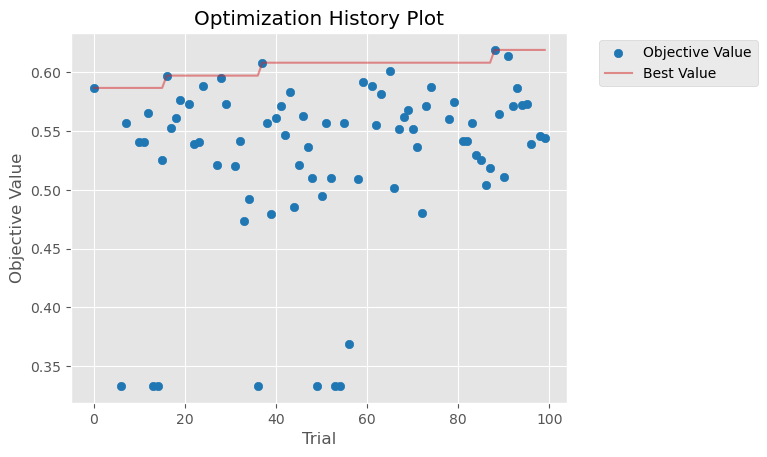

In [71]:
# Visualize the optimization history
plot_optimization_history(study)

[I 2024-06-11 00:52:50,272] A new study created in memory with name: no-name-7ee3cfc4-ced4-4eeb-8758-91b518d95a7c
/tmp/ipykernel_36455/3414932042.py:7: ExperimentalWarning: plot_intermediate_values is experimental (supported from v2.2.0). The interface can change in the future.
  plot_intermediate_values(plotted_study)


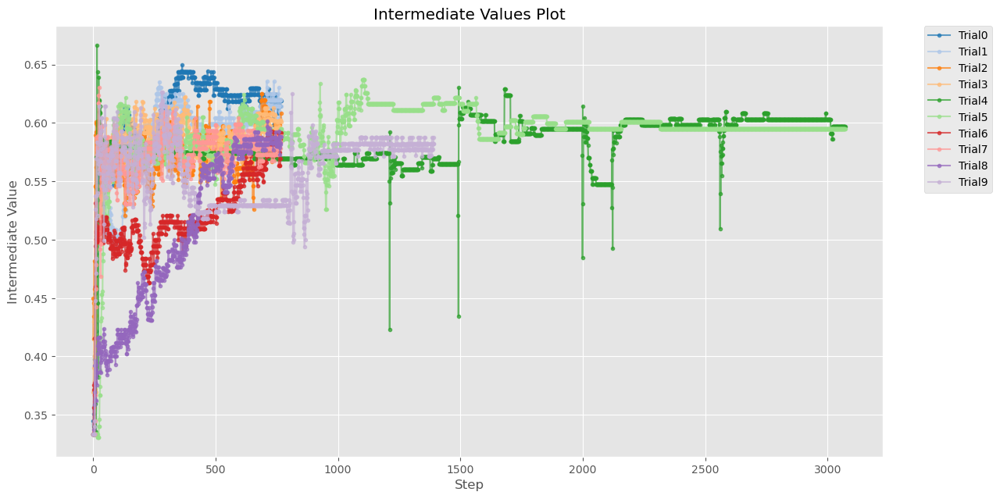

In [72]:
# Visualize the learning curves of the best 10 trials
trials = study.trials
plotted_trials = sorted(trials, key=lambda t: t.value, reverse=True)[:10]
plotted_study = optuna.create_study()
for trial in plotted_trials:
    plotted_study.add_trial(trial)
plot_intermediate_values(plotted_study)
set_size(10, 5)

/tmp/ipykernel_36455/2919792376.py:2: ExperimentalWarning: plot_parallel_coordinate is experimental (supported from v2.2.0). The interface can change in the future.
  plot_parallel_coordinate(study)


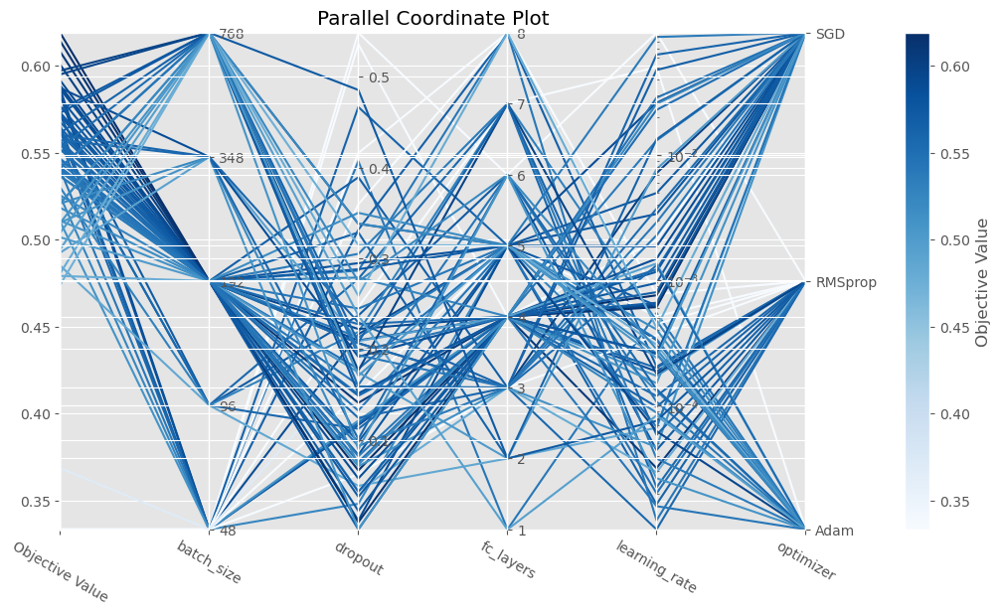

In [73]:
# Visualize high-dimensional parameter relationships.
plot_parallel_coordinate(study)
set_size(10, 5)

/tmp/ipykernel_36455/624402143.py:2: ExperimentalWarning: plot_contour is experimental (supported from v2.2.0). The interface can change in the future.
  plot_contour(study)
[W 2024-06-11 00:52:51,426] Output figures of this Matplotlib-based `plot_contour` function would be different from those of the Plotly-based `plot_contour`.


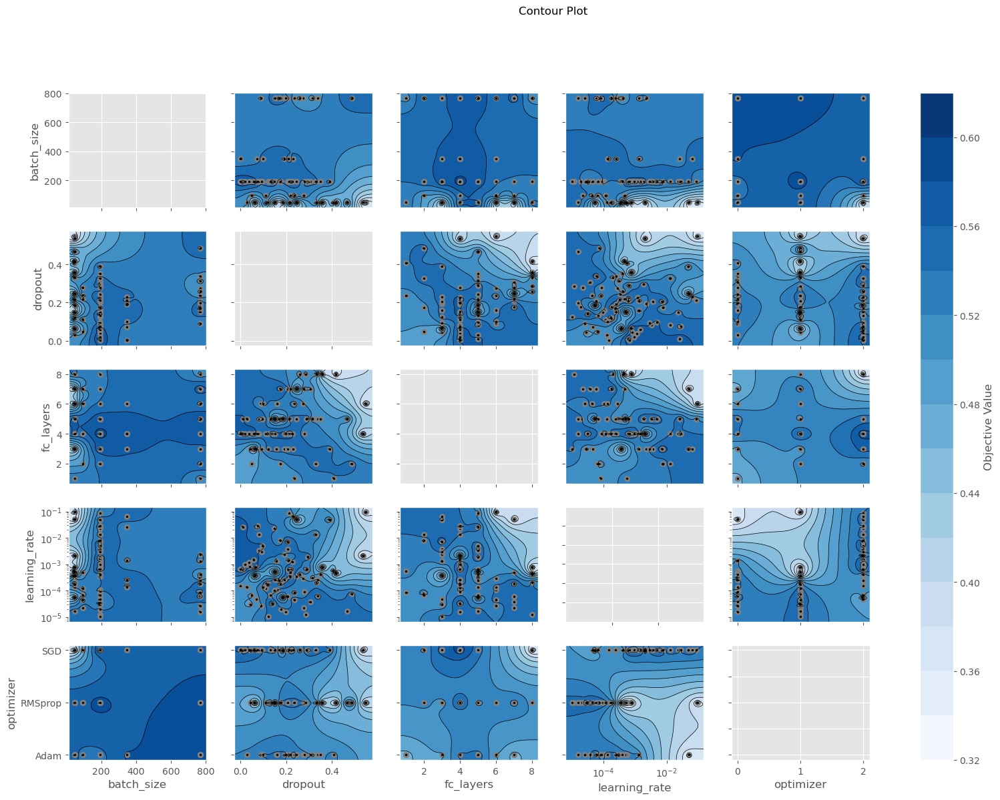

In [74]:
# Visualize hyperparameter relationships
plot_contour(study)
set_size(15, 10)

/tmp/ipykernel_36455/1888575690.py:2: ExperimentalWarning: plot_slice is experimental (supported from v2.2.0). The interface can change in the future.
  plot_slice(study)


array([<Axes: xlabel='batch_size', ylabel='Objective Value'>,
       <Axes: xlabel='dropout'>, <Axes: xlabel='fc_layers'>,
       <Axes: xlabel='learning_rate'>, <Axes: xlabel='optimizer'>],
      dtype=object)

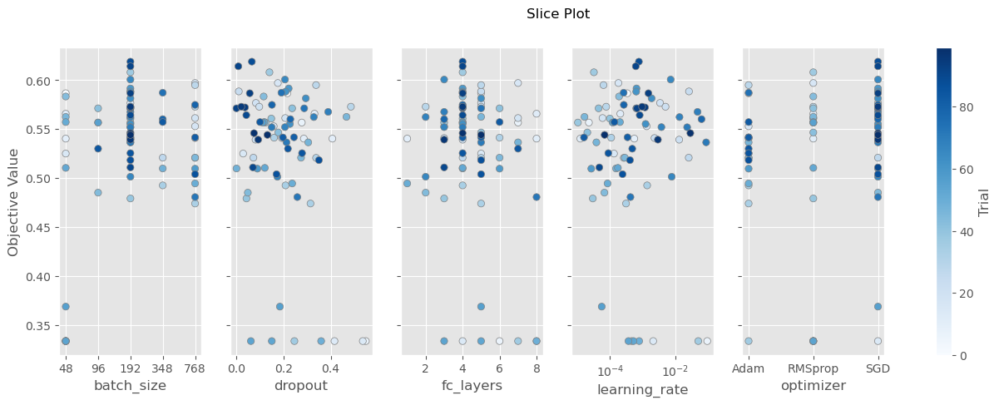

In [75]:
# Visualize individual hyperparameters as slice plot
plot_slice(study)

/tmp/ipykernel_36455/1473508994.py:2: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(study)


<Axes: title={'left': 'Hyperparameter Importances'}, xlabel='Hyperparameter Importance', ylabel='Hyperparameter'>

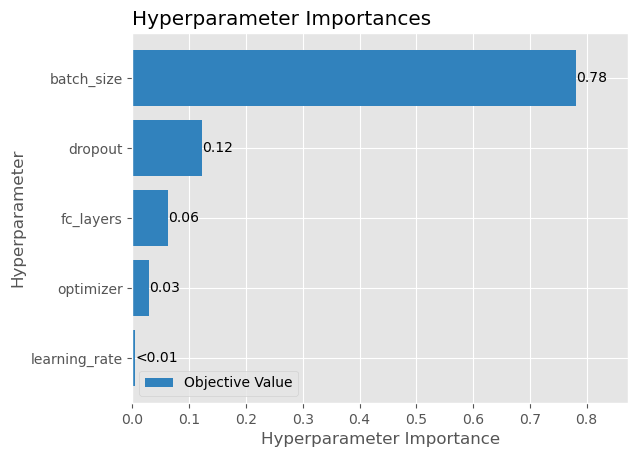

In [76]:
# Visualize parameter importances.
plot_param_importances(study)

/tmp/ipykernel_36455/3113371256.py:2: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


<Axes: title={'left': 'Hyperparameter Importances'}, xlabel='Hyperparameter Importance', ylabel='Hyperparameter'>

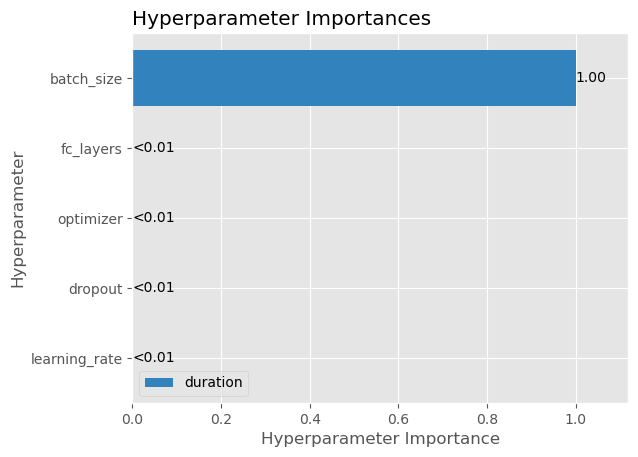

In [77]:
# Learn which hyperparameters are affecting the trial duration with hyperparameter importance.
plot_param_importances(
    study, target=lambda t: t.duration.total_seconds(), target_name="duration"
)

/tmp/ipykernel_36455/1828777839.py:2: ExperimentalWarning: plot_edf is experimental (supported from v2.2.0). The interface can change in the future.
  plot_edf(study)


<Axes: title={'center': 'Empirical Distribution Function Plot'}, xlabel='Objective Value', ylabel='Cumulative Probability'>

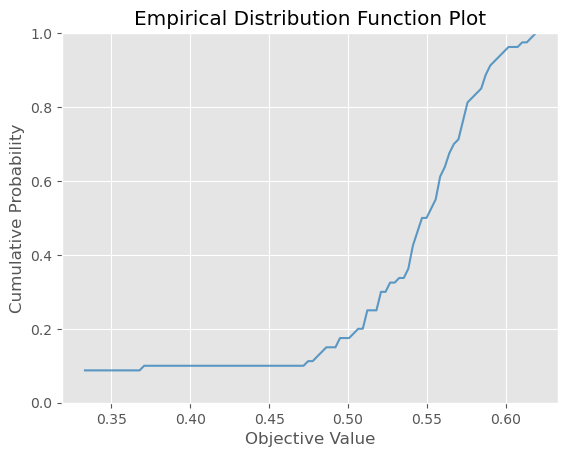

In [78]:
# Visualize empirical distribution function.
plot_edf(study)

/tmp/ipykernel_36455/1172520691.py:2: ExperimentalWarning: plot_rank is experimental (supported from v3.2.0). The interface can change in the future.
  plot_rank(study)
[W 2024-06-11 00:52:58,746] Output figures of this Matplotlib-based `plot_rank` function would be different from those of the Plotly-based `plot_rank`.


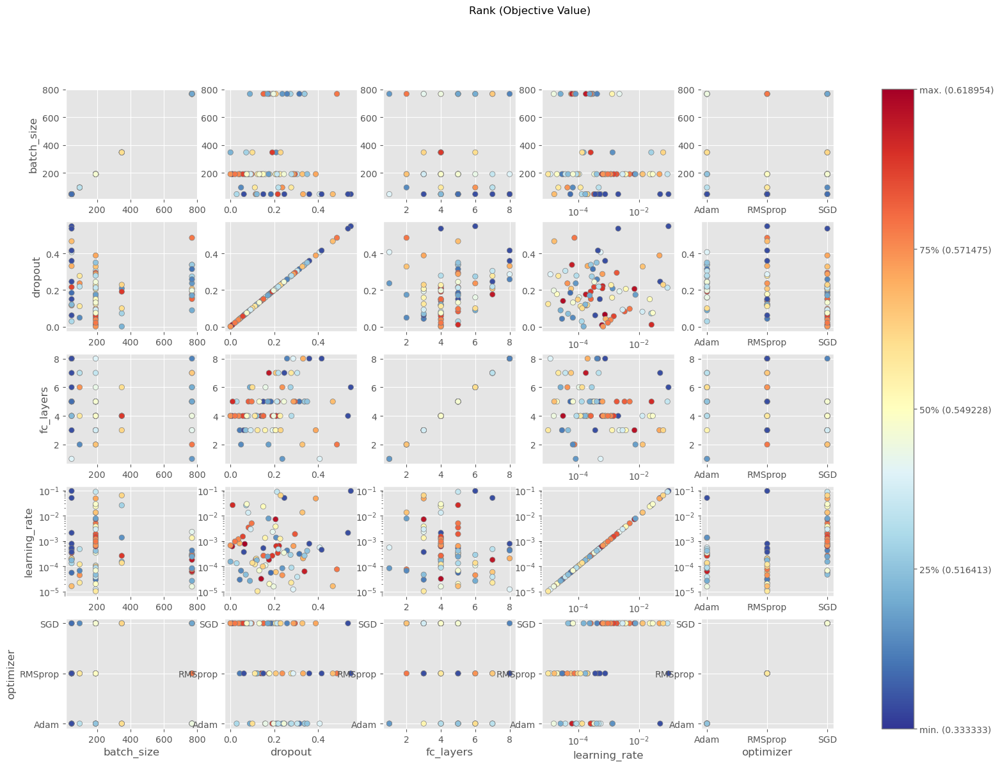

In [79]:
# Visualize parameter relations with scatter plots colored by objective values.
plot_rank(study)
set_size(15, 10)

/tmp/ipykernel_36455/124343896.py:2: ExperimentalWarning: plot_timeline is experimental (supported from v3.2.0). The interface can change in the future.
  plot_timeline(study)


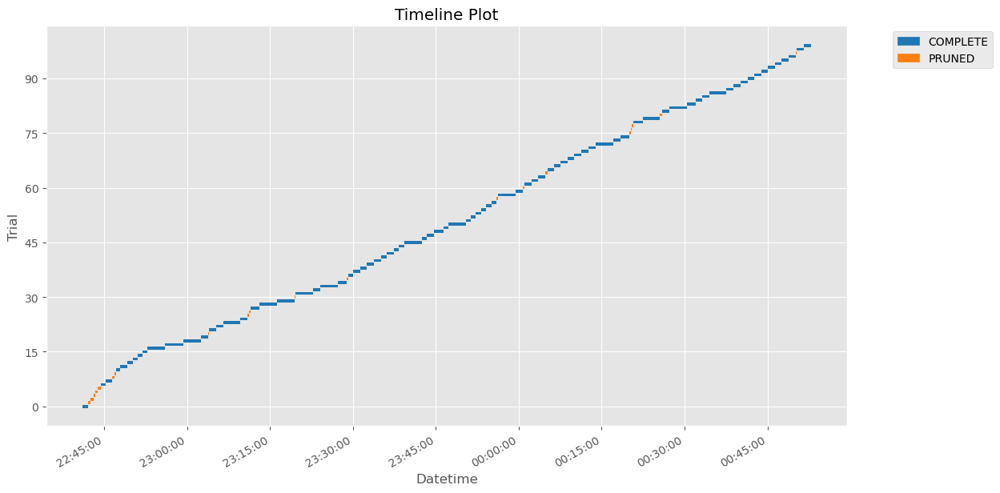

In [80]:
# Visualize the optimization timeline of performed trials.
plot_timeline(study)
set_size(10, 5)

### Model: graphLambda with edge_attr

In [81]:
import optuna
from optuna.integration import PyTorchLightningPruningCallback
from lightning.pytorch import Trainer
from lightning.pytorch.callbacks import RichProgressBar
import logging
import warnings

warnings.filterwarnings("ignore", ".*Consider increasing the value of the `num_workers` argument*")
warnings.filterwarnings("ignore", "Trying to infer the `batch_size` from an ambiguous collection.*")
torch.set_float32_matmul_precision('high')
logging.getLogger("lightning.pytorch.utilities.rank_zero").setLevel(logging.WARNING)
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

def objective(trial):
    # Suggest values for the hyperparameters
    learning_rate = trial.suggest_float('learning_rate', 1e-5, 1e-1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    batch_size = trial.suggest_categorical('batch_size', [48, 96, 192, 348, 768])
    fc_layers = trial.suggest_int('fc_layers', 1, 8)
    dropout = trial.suggest_float('dropout', 0, 0.8)
    hyperparameters = dict(learning_rate=learning_rate, optimizer_name=optimizer_name, batch_size=batch_size, fc_layers=fc_layers, dropout=dropout)
    print(f'Tested parameters: {hyperparameters}')
    n_epochs = batch_size * 4 # vary training epochs based on batch size


    # Create the model
    model = graphLambda_w_edge_attr(learning_rate=learning_rate, optimizer_name=optimizer_name, fc_layers=fc_layers, dropout=dropout)

    

    # Create the PyTorch Lightning trainer
    trainer = Trainer(
        accelerator='gpu',
        devices=1,
        max_epochs=n_epochs,
        callbacks=[PyTorchLightningPruningCallback(trial, monitor="val_f1")],
        enable_progress_bar=False,
        enable_model_summary=False,
        logger=True,
        enable_checkpointing=False
    )

    # Define the data loaders
    train_loader = DataLoader(X_train, batch_size=batch_size, shuffle=True,
                              drop_last=True) # , num_workers=0, persistent_workers=True
    val_loader = DataLoader(X_val, batch_size=len(X_val), shuffle=False,
                            drop_last=True) # , num_workers=0, persistent_workers=True

    # Log the hyperparameters
    trainer.logger.log_hyperparams(hyperparameters)

    # Train the model
    trainer.fit(model, train_loader, val_loader)

    # Evaluate the model
    val_f1 = trainer.callback_metrics["val_f1"].item()

    return val_f1

study = optuna.create_study(direction='maximize', pruner=optuna.pruners.ThresholdPruner(lower=0.35, n_warmup_steps=200))
study.optimize(objective, n_trials=100)

print("Best trial:")
trial = study.best_trial

print("  Value: {}".format(trial.value))

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

df = study.trials_dataframe()
df.to_pickle('ratio_ADHD_results_w_edge_attrs_trials.pkl')

[I 2024-06-11 00:53:01,741] A new study created in memory with name: no-name-9b7569b6-2038-4364-aaee-5f797270977c
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (16) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Tested parameters: {'learning_rate': 8.602914451724707e-05, 'optimizer_name': 'RMSprop', 'batch_size': 48, 'fc_layers': 3, 'dropout': 0.2589061659348521}


[I 2024-06-11 00:53:58,218] Trial 0 finished with value: 0.5739527940750122 and parameters: {'learning_rate': 8.602914451724707e-05, 'optimizer': 'RMSprop', 'batch_size': 48, 'fc_layers': 3, 'dropout': 0.2589061659348521}. Best is trial 0 with value: 0.5739527940750122.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (1) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Tested parameters: {'learning_rate': 0.010436444844867308, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 8, 'dropout': 0.39336236918845924}


[I 2024-06-11 00:54:13,789] Trial 1 pruned. Trial was pruned at epoch 200.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (8) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Tested parameters: {'learning_rate': 0.0006514706655925144, 'optimizer_name': 'SGD', 'batch_size': 96, 'fc_layers': 6, 'dropout': 0.4747910578822794}


[I 2024-06-11 00:54:50,485] Trial 2 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.0025095064550554767, 'optimizer_name': 'Adam', 'batch_size': 96, 'fc_layers': 8, 'dropout': 0.2106493577782665}


[I 2024-06-11 00:55:30,982] Trial 3 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 3.341743098735029e-05, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 2, 'dropout': 0.14309610715587723}


[I 2024-06-11 00:59:15,580] Trial 4 finished with value: 0.5361437797546387 and parameters: {'learning_rate': 3.341743098735029e-05, 'optimizer': 'Adam', 'batch_size': 768, 'fc_layers': 2, 'dropout': 0.14309610715587723}. Best is trial 0 with value: 0.5739527940750122.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (4) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Tested parameters: {'learning_rate': 9.691295481872605e-05, 'optimizer_name': 'Adam', 'batch_size': 192, 'fc_layers': 5, 'dropout': 0.07295986718387147}


[I 2024-06-11 01:00:40,519] Trial 5 finished with value: 0.5392167568206787 and parameters: {'learning_rate': 9.691295481872605e-05, 'optimizer': 'Adam', 'batch_size': 192, 'fc_layers': 5, 'dropout': 0.07295986718387147}. Best is trial 0 with value: 0.5739527940750122.


Tested parameters: {'learning_rate': 0.04792561561450604, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 2, 'dropout': 0.3280919609830833}


[I 2024-06-11 01:02:02,466] Trial 6 finished with value: 0.5563167333602905 and parameters: {'learning_rate': 0.04792561561450604, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 2, 'dropout': 0.3280919609830833}. Best is trial 0 with value: 0.5739527940750122.


Tested parameters: {'learning_rate': 0.0029979136621384296, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.2997443757507113}


[I 2024-06-11 01:05:45,927] Trial 7 finished with value: 0.5730170607566833 and parameters: {'learning_rate': 0.0029979136621384296, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.2997443757507113}. Best is trial 0 with value: 0.5739527940750122.


Tested parameters: {'learning_rate': 0.06564611344769397, 'optimizer_name': 'SGD', 'batch_size': 96, 'fc_layers': 2, 'dropout': 0.2924402390528507}


[I 2024-06-11 01:06:54,770] Trial 8 finished with value: 0.4573850929737091 and parameters: {'learning_rate': 0.06564611344769397, 'optimizer': 'SGD', 'batch_size': 96, 'fc_layers': 2, 'dropout': 0.2924402390528507}. Best is trial 0 with value: 0.5739527940750122.


Tested parameters: {'learning_rate': 0.002386999853330142, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.30257708567514013}


[I 2024-06-11 01:10:40,001] Trial 9 finished with value: 0.5829260349273682 and parameters: {'learning_rate': 0.002386999853330142, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 3, 'dropout': 0.30257708567514013}. Best is trial 9 with value: 0.5829260349273682.
/home/tsmolders/.conda/envs/py3117/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:298: The number of training batches (2) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Tested parameters: {'learning_rate': 0.00036957385525725097, 'optimizer_name': 'RMSprop', 'batch_size': 348, 'fc_layers': 4, 'dropout': 0.656866741842719}


[I 2024-06-11 01:10:56,419] Trial 10 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 1.274059150513763e-05, 'optimizer_name': 'RMSprop', 'batch_size': 48, 'fc_layers': 4, 'dropout': 0.5301146967123413}


[I 2024-06-11 01:11:53,798] Trial 11 finished with value: 0.3333333432674408 and parameters: {'learning_rate': 1.274059150513763e-05, 'optimizer': 'RMSprop', 'batch_size': 48, 'fc_layers': 4, 'dropout': 0.5301146967123413}. Best is trial 9 with value: 0.5829260349273682.


Tested parameters: {'learning_rate': 0.00018500128846728322, 'optimizer_name': 'RMSprop', 'batch_size': 48, 'fc_layers': 3, 'dropout': 0.7730249995379781}


[I 2024-06-11 01:12:50,183] Trial 12 finished with value: 0.3333333432674408 and parameters: {'learning_rate': 0.00018500128846728322, 'optimizer': 'RMSprop', 'batch_size': 48, 'fc_layers': 3, 'dropout': 0.7730249995379781}. Best is trial 9 with value: 0.5829260349273682.


Tested parameters: {'learning_rate': 0.0014886566690801904, 'optimizer_name': 'RMSprop', 'batch_size': 48, 'fc_layers': 6, 'dropout': 0.011435655311325399}


[I 2024-06-11 01:13:48,976] Trial 13 finished with value: 0.3333333432674408 and parameters: {'learning_rate': 0.0014886566690801904, 'optimizer': 'RMSprop', 'batch_size': 48, 'fc_layers': 6, 'dropout': 0.011435655311325399}. Best is trial 9 with value: 0.5829260349273682.


Tested parameters: {'learning_rate': 0.010381562335612075, 'optimizer_name': 'SGD', 'batch_size': 348, 'fc_layers': 3, 'dropout': 0.18671655986282226}


[I 2024-06-11 01:15:40,123] Trial 14 finished with value: 0.5149803161621094 and parameters: {'learning_rate': 0.010381562335612075, 'optimizer': 'SGD', 'batch_size': 348, 'fc_layers': 3, 'dropout': 0.18671655986282226}. Best is trial 9 with value: 0.5829260349273682.


Tested parameters: {'learning_rate': 5.164864570137403e-05, 'optimizer_name': 'RMSprop', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.4611252035004837}


[I 2024-06-11 01:19:23,522] Trial 15 finished with value: 0.5311990976333618 and parameters: {'learning_rate': 5.164864570137403e-05, 'optimizer': 'RMSprop', 'batch_size': 768, 'fc_layers': 1, 'dropout': 0.4611252035004837}. Best is trial 9 with value: 0.5829260349273682.


Tested parameters: {'learning_rate': 0.00026273220126261655, 'optimizer_name': 'RMSprop', 'batch_size': 48, 'fc_layers': 3, 'dropout': 0.6066083676809101}


[I 2024-06-11 01:20:20,501] Trial 16 finished with value: 0.3333333432674408 and parameters: {'learning_rate': 0.00026273220126261655, 'optimizer': 'RMSprop', 'batch_size': 48, 'fc_layers': 3, 'dropout': 0.6066083676809101}. Best is trial 9 with value: 0.5829260349273682.


Tested parameters: {'learning_rate': 0.009704842797958057, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.37762413102896275}


[I 2024-06-11 01:20:35,617] Trial 17 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 1.0969899718114606e-05, 'optimizer_name': 'RMSprop', 'batch_size': 48, 'fc_layers': 4, 'dropout': 0.2201442975163172}


[I 2024-06-11 01:21:32,441] Trial 18 finished with value: 0.531046450138092 and parameters: {'learning_rate': 1.0969899718114606e-05, 'optimizer': 'RMSprop', 'batch_size': 48, 'fc_layers': 4, 'dropout': 0.2201442975163172}. Best is trial 9 with value: 0.5829260349273682.


Tested parameters: {'learning_rate': 0.0008157853742717467, 'optimizer_name': 'SGD', 'batch_size': 348, 'fc_layers': 6, 'dropout': 0.11156974509305131}


[I 2024-06-11 01:21:48,636] Trial 19 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.0049503065796702925, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 3, 'dropout': 0.2590445090535753}


[I 2024-06-11 01:23:12,759] Trial 20 finished with value: 0.5884411931037903 and parameters: {'learning_rate': 0.0049503065796702925, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 3, 'dropout': 0.2590445090535753}. Best is trial 20 with value: 0.5884411931037903.


Tested parameters: {'learning_rate': 0.00554416920264723, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 3, 'dropout': 0.27711422631665217}


[I 2024-06-11 01:24:34,913] Trial 21 finished with value: 0.5601614713668823 and parameters: {'learning_rate': 0.00554416920264723, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 3, 'dropout': 0.27711422631665217}. Best is trial 20 with value: 0.5884411931037903.


Tested parameters: {'learning_rate': 0.029108961154043413, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 2, 'dropout': 0.2505831894977163}


[I 2024-06-11 01:25:57,801] Trial 22 finished with value: 0.5195299983024597 and parameters: {'learning_rate': 0.029108961154043413, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 2, 'dropout': 0.2505831894977163}. Best is trial 20 with value: 0.5884411931037903.


Tested parameters: {'learning_rate': 0.0015690043265775436, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 3, 'dropout': 0.3579934271276914}


[I 2024-06-11 01:26:20,283] Trial 23 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.021359534080410806, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.16336178417256447}


[I 2024-06-11 01:30:05,983] Trial 24 finished with value: 0.5883452892303467 and parameters: {'learning_rate': 0.021359534080410806, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.16336178417256447}. Best is trial 20 with value: 0.5884411931037903.


Tested parameters: {'learning_rate': 0.024754342675875663, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.1444721792252095}


[I 2024-06-11 01:33:52,588] Trial 25 finished with value: 0.5257200002670288 and parameters: {'learning_rate': 0.024754342675875663, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.1444721792252095}. Best is trial 20 with value: 0.5884411931037903.


Tested parameters: {'learning_rate': 0.004868273857604009, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.005368540648962583}


[I 2024-06-11 01:37:38,096] Trial 26 finished with value: 0.5354375839233398 and parameters: {'learning_rate': 0.004868273857604009, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.005368540648962583}. Best is trial 20 with value: 0.5884411931037903.


Tested parameters: {'learning_rate': 0.020469513427663833, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.08231187373160925}


[I 2024-06-11 01:41:25,099] Trial 27 finished with value: 0.5721738934516907 and parameters: {'learning_rate': 0.020469513427663833, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.08231187373160925}. Best is trial 20 with value: 0.5884411931037903.


Tested parameters: {'learning_rate': 0.08703739427602346, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 5, 'dropout': 0.4565305147240405}


[I 2024-06-11 01:42:48,872] Trial 28 finished with value: 0.6039947867393494 and parameters: {'learning_rate': 0.08703739427602346, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 5, 'dropout': 0.4565305147240405}. Best is trial 28 with value: 0.6039947867393494.


Tested parameters: {'learning_rate': 0.04110423785984805, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 5, 'dropout': 0.42789108338502907}


[I 2024-06-11 01:44:12,434] Trial 29 finished with value: 0.5624525547027588 and parameters: {'learning_rate': 0.04110423785984805, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 5, 'dropout': 0.42789108338502907}. Best is trial 28 with value: 0.6039947867393494.


Tested parameters: {'learning_rate': 0.0778973674432789, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 7, 'dropout': 0.5485902974391978}


[I 2024-06-11 01:44:35,310] Trial 30 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.0955296238839651, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.3248102337406179}


[I 2024-06-11 01:45:59,056] Trial 31 finished with value: 0.5781135559082031 and parameters: {'learning_rate': 0.0955296238839651, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.3248102337406179}. Best is trial 28 with value: 0.6039947867393494.


Tested parameters: {'learning_rate': 0.011971983307389885, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.24264618996550774}


[I 2024-06-11 01:49:45,084] Trial 32 finished with value: 0.6091098785400391 and parameters: {'learning_rate': 0.011971983307389885, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.24264618996550774}. Best is trial 32 with value: 0.6091098785400391.


Tested parameters: {'learning_rate': 0.01655797275314726, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 6, 'dropout': 0.17509507765366591}


[I 2024-06-11 01:51:09,277] Trial 33 finished with value: 0.5829260349273682 and parameters: {'learning_rate': 0.01655797275314726, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 6, 'dropout': 0.17509507765366591}. Best is trial 32 with value: 0.6091098785400391.


Tested parameters: {'learning_rate': 0.006716180588260569, 'optimizer_name': 'Adam', 'batch_size': 96, 'fc_layers': 7, 'dropout': 0.4159578160063917}


[I 2024-06-11 01:51:45,324] Trial 34 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.013496526239762845, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.23091779159326664}


[I 2024-06-11 01:55:32,105] Trial 35 finished with value: 0.5467643737792969 and parameters: {'learning_rate': 0.013496526239762845, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.23091779159326664}. Best is trial 32 with value: 0.6091098785400391.


Tested parameters: {'learning_rate': 0.03096702435022919, 'optimizer_name': 'Adam', 'batch_size': 192, 'fc_layers': 7, 'dropout': 0.49106523184870976}


[I 2024-06-11 01:55:54,711] Trial 36 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.04501625967721449, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.3594098357733852}


[I 2024-06-11 01:59:40,585] Trial 37 finished with value: 0.6034782528877258 and parameters: {'learning_rate': 0.04501625967721449, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.3594098357733852}. Best is trial 32 with value: 0.6091098785400391.


Tested parameters: {'learning_rate': 0.05423785698689109, 'optimizer_name': 'Adam', 'batch_size': 96, 'fc_layers': 6, 'dropout': 0.3569730825144356}


[I 2024-06-11 02:00:16,128] Trial 38 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.003872341650646298, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 5, 'dropout': 0.38314517908612356}


[I 2024-06-11 02:01:40,731] Trial 39 finished with value: 0.5468627214431763 and parameters: {'learning_rate': 0.003872341650646298, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 5, 'dropout': 0.38314517908612356}. Best is trial 32 with value: 0.6091098785400391.


Tested parameters: {'learning_rate': 0.008408043380960545, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.4466883823623067}


[I 2024-06-11 02:01:55,904] Trial 40 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.040711590046794734, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.19265108320017296}


[I 2024-06-11 02:05:41,435] Trial 41 finished with value: 0.5462719202041626 and parameters: {'learning_rate': 0.040711590046794734, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.19265108320017296}. Best is trial 32 with value: 0.6091098785400391.


Tested parameters: {'learning_rate': 0.015200151335424532, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 6, 'dropout': 0.2531234087322516}


[I 2024-06-11 02:09:28,707] Trial 42 finished with value: 0.5467643737792969 and parameters: {'learning_rate': 0.015200151335424532, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 6, 'dropout': 0.2531234087322516}. Best is trial 32 with value: 0.6091098785400391.


Tested parameters: {'learning_rate': 0.09808637619105681, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.3253756931257432}


[I 2024-06-11 02:13:15,321] Trial 43 finished with value: 0.6034782528877258 and parameters: {'learning_rate': 0.09808637619105681, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.3253756931257432}. Best is trial 32 with value: 0.6091098785400391.


Tested parameters: {'learning_rate': 0.06803961388784495, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.3257701659324404}


[I 2024-06-11 02:17:01,229] Trial 44 finished with value: 0.5832880735397339 and parameters: {'learning_rate': 0.06803961388784495, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.3257701659324404}. Best is trial 32 with value: 0.6091098785400391.


Tested parameters: {'learning_rate': 0.09828088885798132, 'optimizer_name': 'SGD', 'batch_size': 348, 'fc_layers': 6, 'dropout': 0.5376178763779034}


[I 2024-06-11 02:17:18,112] Trial 45 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.039177470965002834, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.403124056308824}


[I 2024-06-11 02:17:32,897] Trial 46 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.055116468561298065, 'optimizer_name': 'SGD', 'batch_size': 96, 'fc_layers': 6, 'dropout': 0.2976814555217523}


[I 2024-06-11 02:18:38,143] Trial 47 finished with value: 0.5572797060012817 and parameters: {'learning_rate': 0.055116468561298065, 'optimizer': 'SGD', 'batch_size': 96, 'fc_layers': 6, 'dropout': 0.2976814555217523}. Best is trial 32 with value: 0.6091098785400391.


Tested parameters: {'learning_rate': 0.03011511519230975, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 2, 'dropout': 0.49778375491613724}


[I 2024-06-11 02:18:59,409] Trial 48 pruned. Trial was pruned at epoch 201.


Tested parameters: {'learning_rate': 0.0025625727463046747, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.34029947021748796}


[I 2024-06-11 02:19:14,345] Trial 49 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.013193783733618864, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 7, 'dropout': 0.5726870217846807}


[I 2024-06-11 02:19:29,094] Trial 50 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.024122079466192783, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.15346597628728623}


[I 2024-06-11 02:23:14,624] Trial 51 finished with value: 0.55084627866745 and parameters: {'learning_rate': 0.024122079466192783, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.15346597628728623}. Best is trial 32 with value: 0.6091098785400391.


Tested parameters: {'learning_rate': 0.0581358743450188, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.27107394926552947}


[I 2024-06-11 02:26:59,503] Trial 52 finished with value: 0.5440923571586609 and parameters: {'learning_rate': 0.0581358743450188, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.27107394926552947}. Best is trial 32 with value: 0.6091098785400391.


Tested parameters: {'learning_rate': 0.01912924295252794, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.20636416025509724}


[I 2024-06-11 02:30:45,832] Trial 53 finished with value: 0.5468627214431763 and parameters: {'learning_rate': 0.01912924295252794, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.20636416025509724}. Best is trial 32 with value: 0.6091098785400391.


Tested parameters: {'learning_rate': 0.00800528189149412, 'optimizer_name': 'SGD', 'batch_size': 348, 'fc_layers': 3, 'dropout': 0.10268393976052798}


[I 2024-06-11 02:32:37,314] Trial 54 finished with value: 0.6030899882316589 and parameters: {'learning_rate': 0.00800528189149412, 'optimizer': 'SGD', 'batch_size': 348, 'fc_layers': 3, 'dropout': 0.10268393976052798}. Best is trial 32 with value: 0.6091098785400391.


Tested parameters: {'learning_rate': 0.0019254798052739015, 'optimizer_name': 'SGD', 'batch_size': 348, 'fc_layers': 1, 'dropout': 0.05000784659420124}


[I 2024-06-11 02:34:33,251] Trial 55 finished with value: 0.5569912195205688 and parameters: {'learning_rate': 0.0019254798052739015, 'optimizer': 'SGD', 'batch_size': 348, 'fc_layers': 1, 'dropout': 0.05000784659420124}. Best is trial 32 with value: 0.6091098785400391.


Tested parameters: {'learning_rate': 0.0004974123274848942, 'optimizer_name': 'RMSprop', 'batch_size': 348, 'fc_layers': 3, 'dropout': 0.10563274805404793}


[I 2024-06-11 02:34:50,766] Trial 56 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.00328557478261013, 'optimizer_name': 'SGD', 'batch_size': 348, 'fc_layers': 3, 'dropout': 0.6583302187412444}


[I 2024-06-11 02:35:06,810] Trial 57 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.006936298820987812, 'optimizer_name': 'SGD', 'batch_size': 348, 'fc_layers': 2, 'dropout': 0.30895983247832415}


[I 2024-06-11 02:36:56,895] Trial 58 finished with value: 0.5361437797546387 and parameters: {'learning_rate': 0.006936298820987812, 'optimizer': 'SGD', 'batch_size': 348, 'fc_layers': 2, 'dropout': 0.30895983247832415}. Best is trial 32 with value: 0.6091098785400391.


Tested parameters: {'learning_rate': 0.001189653248043627, 'optimizer_name': 'Adam', 'batch_size': 48, 'fc_layers': 4, 'dropout': 0.2360595779881064}


[I 2024-06-11 02:37:55,768] Trial 59 finished with value: 0.3333333432674408 and parameters: {'learning_rate': 0.001189653248043627, 'optimizer': 'Adam', 'batch_size': 48, 'fc_layers': 4, 'dropout': 0.2360595779881064}. Best is trial 32 with value: 0.6091098785400391.


Tested parameters: {'learning_rate': 0.07631314100999953, 'optimizer_name': 'RMSprop', 'batch_size': 192, 'fc_layers': 3, 'dropout': 0.3645640492458363}


[I 2024-06-11 02:38:17,737] Trial 60 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.01024655375165129, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.16340442486414195}


[I 2024-06-11 02:42:01,971] Trial 61 finished with value: 0.5884411931037903 and parameters: {'learning_rate': 0.01024655375165129, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.16340442486414195}. Best is trial 32 with value: 0.6091098785400391.


Tested parameters: {'learning_rate': 0.004926316869959731, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.11036163777793648}


[I 2024-06-11 02:45:47,592] Trial 62 finished with value: 0.5398693084716797 and parameters: {'learning_rate': 0.004926316869959731, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 5, 'dropout': 0.11036163777793648}. Best is trial 32 with value: 0.6091098785400391.


Tested parameters: {'learning_rate': 0.03404495049361452, 'optimizer_name': 'SGD', 'batch_size': 348, 'fc_layers': 3, 'dropout': 0.12964797306762704}


[I 2024-06-11 02:47:41,334] Trial 63 finished with value: 0.5152962803840637 and parameters: {'learning_rate': 0.03404495049361452, 'optimizer': 'SGD', 'batch_size': 348, 'fc_layers': 3, 'dropout': 0.12964797306762704}. Best is trial 32 with value: 0.6091098785400391.


Tested parameters: {'learning_rate': 0.010346852119327463, 'optimizer_name': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.04766496001617355}


[I 2024-06-11 02:51:26,833] Trial 64 finished with value: 0.5311990976333618 and parameters: {'learning_rate': 0.010346852119327463, 'optimizer': 'SGD', 'batch_size': 768, 'fc_layers': 4, 'dropout': 0.04766496001617355}. Best is trial 32 with value: 0.6091098785400391.


Tested parameters: {'learning_rate': 0.047073531376910456, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 5, 'dropout': 0.27469401584579056}


[I 2024-06-11 02:52:50,055] Trial 65 finished with value: 0.6293940544128418 and parameters: {'learning_rate': 0.047073531376910456, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 5, 'dropout': 0.27469401584579056}. Best is trial 65 with value: 0.6293940544128418.


Tested parameters: {'learning_rate': 0.04508686206613244, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 5, 'dropout': 0.2698256441445359}


[I 2024-06-11 02:54:14,064] Trial 66 finished with value: 0.5586206912994385 and parameters: {'learning_rate': 0.04508686206613244, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 5, 'dropout': 0.2698256441445359}. Best is trial 65 with value: 0.6293940544128418.


Tested parameters: {'learning_rate': 0.09948640901934042, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 6, 'dropout': 0.4500378024008531}


[I 2024-06-11 02:55:42,999] Trial 67 finished with value: 0.6130719184875488 and parameters: {'learning_rate': 0.09948640901934042, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 6, 'dropout': 0.4500378024008531}. Best is trial 65 with value: 0.6293940544128418.


Tested parameters: {'learning_rate': 0.09597817788436566, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 6, 'dropout': 0.46986968869694773}


[I 2024-06-11 02:56:05,217] Trial 68 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.06797064114773811, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 6, 'dropout': 0.40272083320080465}


[I 2024-06-11 02:57:29,162] Trial 69 finished with value: 0.5408695936203003 and parameters: {'learning_rate': 0.06797064114773811, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 6, 'dropout': 0.40272083320080465}. Best is trial 65 with value: 0.6293940544128418.


Tested parameters: {'learning_rate': 0.0530044719395105, 'optimizer_name': 'SGD', 'batch_size': 48, 'fc_layers': 6, 'dropout': 0.430141893237389}


[I 2024-06-11 02:58:27,358] Trial 70 finished with value: 0.522296667098999 and parameters: {'learning_rate': 0.0530044719395105, 'optimizer': 'SGD', 'batch_size': 48, 'fc_layers': 6, 'dropout': 0.430141893237389}. Best is trial 65 with value: 0.6293940544128418.


Tested parameters: {'learning_rate': 0.07557807370510275, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 5, 'dropout': 0.34577818852768305}


[I 2024-06-11 02:59:50,891] Trial 71 finished with value: 0.5231310725212097 and parameters: {'learning_rate': 0.07557807370510275, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 5, 'dropout': 0.34577818852768305}. Best is trial 65 with value: 0.6293940544128418.


Tested parameters: {'learning_rate': 0.028946872992772796, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 5, 'dropout': 0.5041100058011023}


[I 2024-06-11 03:00:13,078] Trial 72 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.046623621804142645, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 8, 'dropout': 0.28858652293205095}


[I 2024-06-11 03:01:38,780] Trial 73 finished with value: 0.5988603234291077 and parameters: {'learning_rate': 0.046623621804142645, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 8, 'dropout': 0.28858652293205095}. Best is trial 65 with value: 0.6293940544128418.


Tested parameters: {'learning_rate': 0.045979752245633464, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 8, 'dropout': 0.4467444424451418}


[I 2024-06-11 03:02:01,096] Trial 74 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.08154272016430532, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 8, 'dropout': 0.2869559209559852}


[I 2024-06-11 03:03:26,422] Trial 75 finished with value: 0.5349318385124207 and parameters: {'learning_rate': 0.08154272016430532, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 8, 'dropout': 0.2869559209559852}. Best is trial 65 with value: 0.6293940544128418.


Tested parameters: {'learning_rate': 9.362265823527859e-05, 'optimizer_name': 'RMSprop', 'batch_size': 96, 'fc_layers': 7, 'dropout': 0.38726808461698964}


[I 2024-06-11 03:04:33,697] Trial 76 finished with value: 0.5879939794540405 and parameters: {'learning_rate': 9.362265823527859e-05, 'optimizer': 'RMSprop', 'batch_size': 96, 'fc_layers': 7, 'dropout': 0.38726808461698964}. Best is trial 65 with value: 0.6293940544128418.


Tested parameters: {'learning_rate': 0.06549806360330268, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 5, 'dropout': 0.30482871967451614}


[I 2024-06-11 03:05:57,769] Trial 77 finished with value: 0.5676027536392212 and parameters: {'learning_rate': 0.06549806360330268, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 5, 'dropout': 0.30482871967451614}. Best is trial 65 with value: 0.6293940544128418.


Tested parameters: {'learning_rate': 0.03780480103412471, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 8, 'dropout': 0.37136425839252396}


[I 2024-06-11 03:07:23,601] Trial 78 finished with value: 0.5254108309745789 and parameters: {'learning_rate': 0.03780480103412471, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 8, 'dropout': 0.37136425839252396}. Best is trial 65 with value: 0.6293940544128418.


Tested parameters: {'learning_rate': 0.0236986015689388, 'optimizer_name': 'Adam', 'batch_size': 192, 'fc_layers': 6, 'dropout': 0.32326872370297083}


[I 2024-06-11 03:07:45,869] Trial 79 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 2.2497270824503667e-05, 'optimizer_name': 'SGD', 'batch_size': 348, 'fc_layers': 5, 'dropout': 0.21484496882774515}


[I 2024-06-11 03:09:38,108] Trial 80 finished with value: 0.4113377332687378 and parameters: {'learning_rate': 2.2497270824503667e-05, 'optimizer': 'SGD', 'batch_size': 348, 'fc_layers': 5, 'dropout': 0.21484496882774515}. Best is trial 65 with value: 0.6293940544128418.


Tested parameters: {'learning_rate': 0.09711973268169766, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 5, 'dropout': 0.2550827799223055}


[I 2024-06-11 03:11:02,804] Trial 81 finished with value: 0.541218638420105 and parameters: {'learning_rate': 0.09711973268169766, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 5, 'dropout': 0.2550827799223055}. Best is trial 65 with value: 0.6293940544128418.


Tested parameters: {'learning_rate': 0.018844723446884717, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 2, 'dropout': 0.23326663446529566}


[I 2024-06-11 03:12:26,219] Trial 82 finished with value: 0.5363451242446899 and parameters: {'learning_rate': 0.018844723446884717, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 2, 'dropout': 0.23326663446529566}. Best is trial 65 with value: 0.6293940544128418.


Tested parameters: {'learning_rate': 0.013814963152607097, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.1978890953021309}


[I 2024-06-11 03:13:49,091] Trial 83 finished with value: 0.5307917594909668 and parameters: {'learning_rate': 0.013814963152607097, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 4, 'dropout': 0.1978890953021309}. Best is trial 65 with value: 0.6293940544128418.


Tested parameters: {'learning_rate': 0.007620331594516631, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 6, 'dropout': 0.2833919844593745}


[I 2024-06-11 03:15:16,227] Trial 84 finished with value: 0.5691297054290771 and parameters: {'learning_rate': 0.007620331594516631, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 6, 'dropout': 0.2833919844593745}. Best is trial 65 with value: 0.6293940544128418.


Tested parameters: {'learning_rate': 0.05948612992981867, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 5, 'dropout': 0.33546583767165644}


[I 2024-06-11 03:16:41,713] Trial 85 finished with value: 0.592644989490509 and parameters: {'learning_rate': 0.05948612992981867, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 5, 'dropout': 0.33546583767165644}. Best is trial 65 with value: 0.6293940544128418.


Tested parameters: {'learning_rate': 0.05841212986951425, 'optimizer_name': 'SGD', 'batch_size': 192, 'fc_layers': 5, 'dropout': 0.4135203295218267}


[I 2024-06-11 03:18:05,707] Trial 86 finished with value: 0.5462719202041626 and parameters: {'learning_rate': 0.05841212986951425, 'optimizer': 'SGD', 'batch_size': 192, 'fc_layers': 5, 'dropout': 0.4135203295218267}. Best is trial 65 with value: 0.6293940544128418.


Tested parameters: {'learning_rate': 0.04392231143447867, 'optimizer_name': 'SGD', 'batch_size': 48, 'fc_layers': 5, 'dropout': 0.3460177754428583}


[I 2024-06-11 03:19:04,223] Trial 87 finished with value: 0.5520347356796265 and parameters: {'learning_rate': 0.04392231143447867, 'optimizer': 'SGD', 'batch_size': 48, 'fc_layers': 5, 'dropout': 0.3460177754428583}. Best is trial 65 with value: 0.6293940544128418.


Tested parameters: {'learning_rate': 0.051201182528668676, 'optimizer_name': 'SGD', 'batch_size': 96, 'fc_layers': 7, 'dropout': 0.31614666632161786}


[I 2024-06-11 03:20:10,297] Trial 88 finished with value: 0.6041666865348816 and parameters: {'learning_rate': 0.051201182528668676, 'optimizer': 'SGD', 'batch_size': 96, 'fc_layers': 7, 'dropout': 0.31614666632161786}. Best is trial 65 with value: 0.6293940544128418.


Tested parameters: {'learning_rate': 0.028129174716976426, 'optimizer_name': 'SGD', 'batch_size': 96, 'fc_layers': 7, 'dropout': 0.4370249515498188}


[I 2024-06-11 03:21:17,121] Trial 89 finished with value: 0.5416169166564941 and parameters: {'learning_rate': 0.028129174716976426, 'optimizer': 'SGD', 'batch_size': 96, 'fc_layers': 7, 'dropout': 0.4370249515498188}. Best is trial 65 with value: 0.6293940544128418.


Tested parameters: {'learning_rate': 0.03599186516915262, 'optimizer_name': 'RMSprop', 'batch_size': 96, 'fc_layers': 7, 'dropout': 0.48018604671008797}


[I 2024-06-11 03:21:52,301] Trial 90 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.07955602882825531, 'optimizer_name': 'SGD', 'batch_size': 96, 'fc_layers': 8, 'dropout': 0.3384475437005261}


[I 2024-06-11 03:22:59,585] Trial 91 finished with value: 0.6223776340484619 and parameters: {'learning_rate': 0.07955602882825531, 'optimizer': 'SGD', 'batch_size': 96, 'fc_layers': 8, 'dropout': 0.3384475437005261}. Best is trial 65 with value: 0.6293940544128418.


Tested parameters: {'learning_rate': 0.08069704902918817, 'optimizer_name': 'SGD', 'batch_size': 96, 'fc_layers': 8, 'dropout': 0.3124526426274575}


[I 2024-06-11 03:24:06,467] Trial 92 finished with value: 0.5650536417961121 and parameters: {'learning_rate': 0.08069704902918817, 'optimizer': 'SGD', 'batch_size': 96, 'fc_layers': 8, 'dropout': 0.3124526426274575}. Best is trial 65 with value: 0.6293940544128418.


Tested parameters: {'learning_rate': 0.0001439524715253594, 'optimizer_name': 'SGD', 'batch_size': 96, 'fc_layers': 8, 'dropout': 0.3902078112133032}


[I 2024-06-11 03:24:43,392] Trial 93 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.04962071146070221, 'optimizer_name': 'SGD', 'batch_size': 96, 'fc_layers': 8, 'dropout': 0.4581612354093866}


[I 2024-06-11 03:25:54,797] Trial 94 finished with value: 0.5318740606307983 and parameters: {'learning_rate': 0.04962071146070221, 'optimizer': 'SGD', 'batch_size': 96, 'fc_layers': 8, 'dropout': 0.4581612354093866}. Best is trial 65 with value: 0.6293940544128418.


Tested parameters: {'learning_rate': 0.0839579565498423, 'optimizer_name': 'SGD', 'batch_size': 96, 'fc_layers': 7, 'dropout': 0.5152262636753233}


[I 2024-06-11 03:26:31,342] Trial 95 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.06460010755713491, 'optimizer_name': 'SGD', 'batch_size': 96, 'fc_layers': 7, 'dropout': 0.36109941477065677}


[I 2024-06-11 03:27:37,224] Trial 96 finished with value: 0.5844725370407104 and parameters: {'learning_rate': 0.06460010755713491, 'optimizer': 'SGD', 'batch_size': 96, 'fc_layers': 7, 'dropout': 0.36109941477065677}. Best is trial 65 with value: 0.6293940544128418.


Tested parameters: {'learning_rate': 0.0996113456105385, 'optimizer_name': 'Adam', 'batch_size': 768, 'fc_layers': 8, 'dropout': 0.32305493019338916}


[I 2024-06-11 03:27:52,563] Trial 97 pruned. Trial was pruned at epoch 200.


Tested parameters: {'learning_rate': 0.03388449722480033, 'optimizer_name': 'SGD', 'batch_size': 96, 'fc_layers': 6, 'dropout': 0.2913081037683711}


[I 2024-06-11 03:28:57,088] Trial 98 finished with value: 0.5691297054290771 and parameters: {'learning_rate': 0.03388449722480033, 'optimizer': 'SGD', 'batch_size': 96, 'fc_layers': 6, 'dropout': 0.2913081037683711}. Best is trial 65 with value: 0.6293940544128418.


Tested parameters: {'learning_rate': 0.04865251148330621, 'optimizer_name': 'SGD', 'batch_size': 348, 'fc_layers': 8, 'dropout': 0.24315001469829478}


[I 2024-06-11 03:30:51,885] Trial 99 finished with value: 0.5520833134651184 and parameters: {'learning_rate': 0.04865251148330621, 'optimizer': 'SGD', 'batch_size': 348, 'fc_layers': 8, 'dropout': 0.24315001469829478}. Best is trial 65 with value: 0.6293940544128418.


Best trial:
  Value: 0.6293940544128418
  Params: 
    learning_rate: 0.047073531376910456
    optimizer: SGD
    batch_size: 192
    fc_layers: 5
    dropout: 0.27469401584579056


In [82]:
df_trials = pd.read_pickle('ratio_ADHD_results_w_edge_attrs_trials.pkl')
df_trials.sort_values('value', ascending=False).head(10)

,number,value,datetime_start,datetime_complete,duration,params_batch_size,params_dropout,params_fc_layers,params_learning_rate,params_optimizer,state
65,65,0.629394,2024-06-11 02:51:26.834084,2024-06-11 02:52:50.054261,0 days 00:01:23.220177,192,0.274694,5,0.047074,SGD,COMPLETE
91,91,0.622378,2024-06-11 03:21:52.302300,2024-06-11 03:22:59.584367,0 days 00:01:07.282067,96,0.338448,8,0.079556,SGD,COMPLETE
67,67,0.613072,2024-06-11 02:54:14.065689,2024-06-11 02:55:42.998597,0 days 00:01:28.932908,192,0.450038,6,0.099486,SGD,COMPLETE
32,32,0.609110,2024-06-11 01:45:59.057567,2024-06-11 01:49:45.080434,0 days 00:03:46.022867,768,0.242646,5,0.011972,SGD,COMPLETE
88,88,0.604167,2024-06-11 03:19:04.223921,2024-06-11 03:20:10.296528,0 days 00:01:06.072607,96,0.316147,7,0.051201,SGD,COMPLETE
28,28,0.603995,2024-06-11 01:41:25.100978,2024-06-11 01:42:48.871241,0 days 00:01:23.770263,192,0.456531,5,0.087037,SGD,COMPLETE
43,43,0.603478,2024-06-11 02:09:28.707792,2024-06-11 02:13:15.317537,0 days 00:03:46.609745,768,0.325376,5,0.098086,SGD,COMPLETE
37,37,0.603478,2024-06-11 01:55:54.711988,2024-06-11 01:59:40.581337,0 days 00:03:45.869349,768,0.359410,5,0.045016,SGD,COMPLETE
54,54,0.603090,2024-06-11 02:30:45.833191,2024-06-11 02:32:37.311819,0 days 00:01:51.478628,348,0.102684,3,0.008005,SGD,COMPLETE
73,73,0.598860,2024-06-11 03:00:13.079724,2024-06-11 03:01:38.779807,0 days 00:01:25.700083,192,0.288587,8,0.046624,SGD,COMPLETE


#### Visualizations

/tmp/ipykernel_36455/1755039964.py:2: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(study)


<Axes: title={'center': 'Optimization History Plot'}, xlabel='Trial', ylabel='Objective Value'>

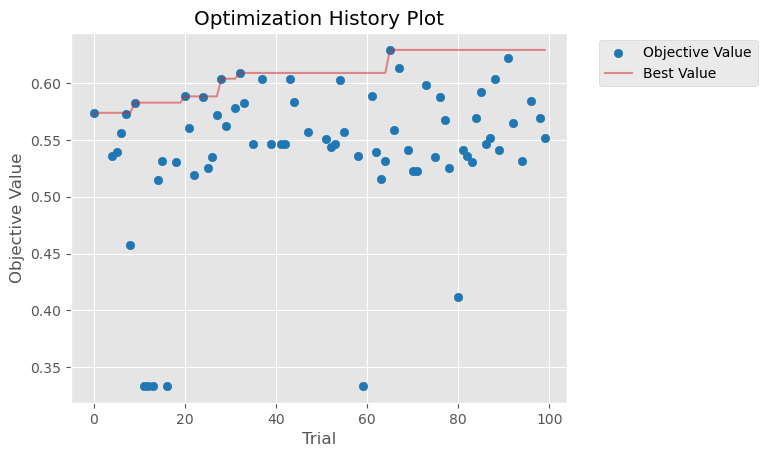

In [83]:
# Visualize the optimization history
plot_optimization_history(study)

[I 2024-06-11 03:30:52,243] A new study created in memory with name: no-name-2a943d5a-ba64-4d68-a314-ef81cb182bec
/tmp/ipykernel_36455/3414932042.py:7: ExperimentalWarning: plot_intermediate_values is experimental (supported from v2.2.0). The interface can change in the future.
  plot_intermediate_values(plotted_study)


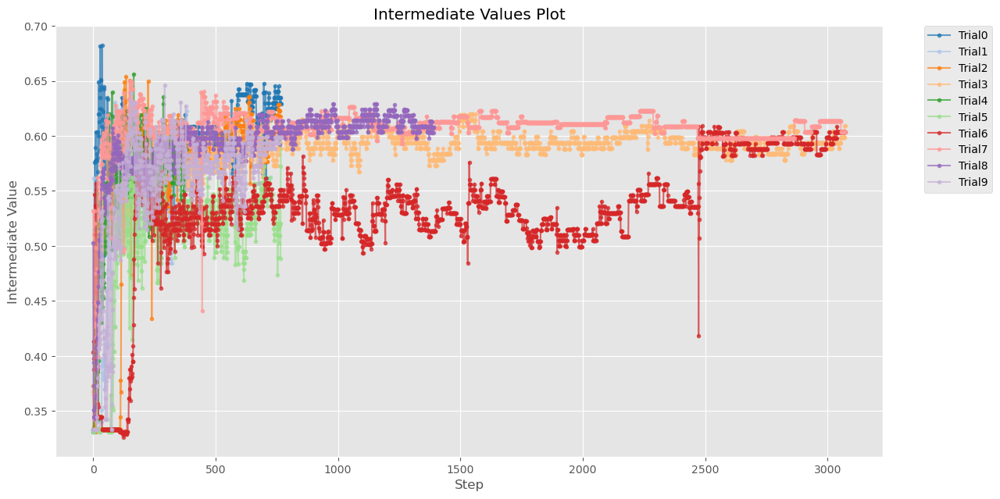

In [84]:
# Visualize the learning curves of the best 10 trials
trials = study.trials
plotted_trials = sorted(trials, key=lambda t: t.value, reverse=True)[:10]
plotted_study = optuna.create_study()
for trial in plotted_trials:
    plotted_study.add_trial(trial)
plot_intermediate_values(plotted_study)
set_size(10, 5)

/tmp/ipykernel_36455/2919792376.py:2: ExperimentalWarning: plot_parallel_coordinate is experimental (supported from v2.2.0). The interface can change in the future.
  plot_parallel_coordinate(study)


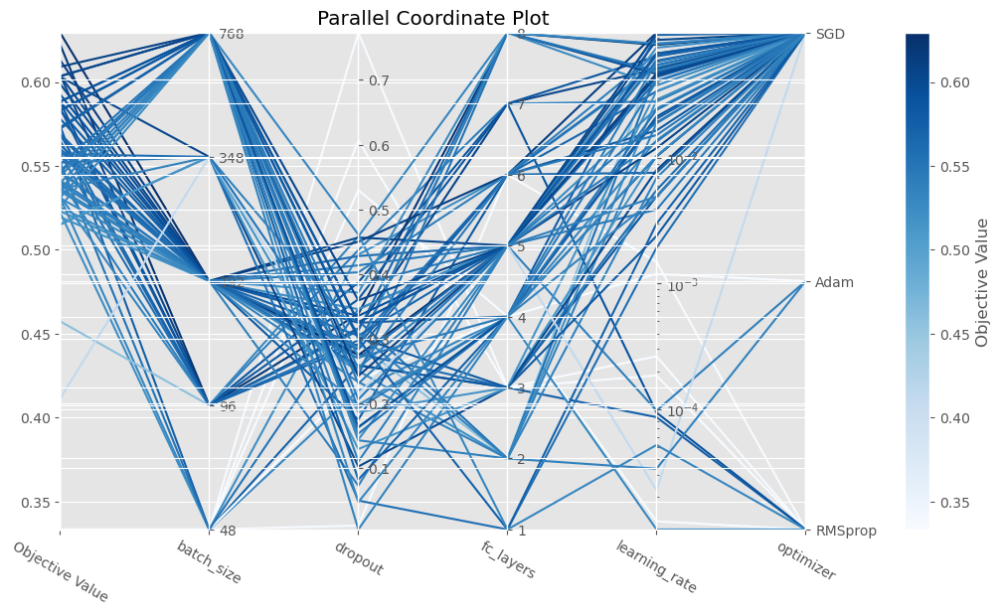

In [85]:
# Visualize high-dimensional parameter relationships.
plot_parallel_coordinate(study)
set_size(10, 5)

/tmp/ipykernel_36455/624402143.py:2: ExperimentalWarning: plot_contour is experimental (supported from v2.2.0). The interface can change in the future.
  plot_contour(study)
[W 2024-06-11 03:30:53,407] Output figures of this Matplotlib-based `plot_contour` function would be different from those of the Plotly-based `plot_contour`.


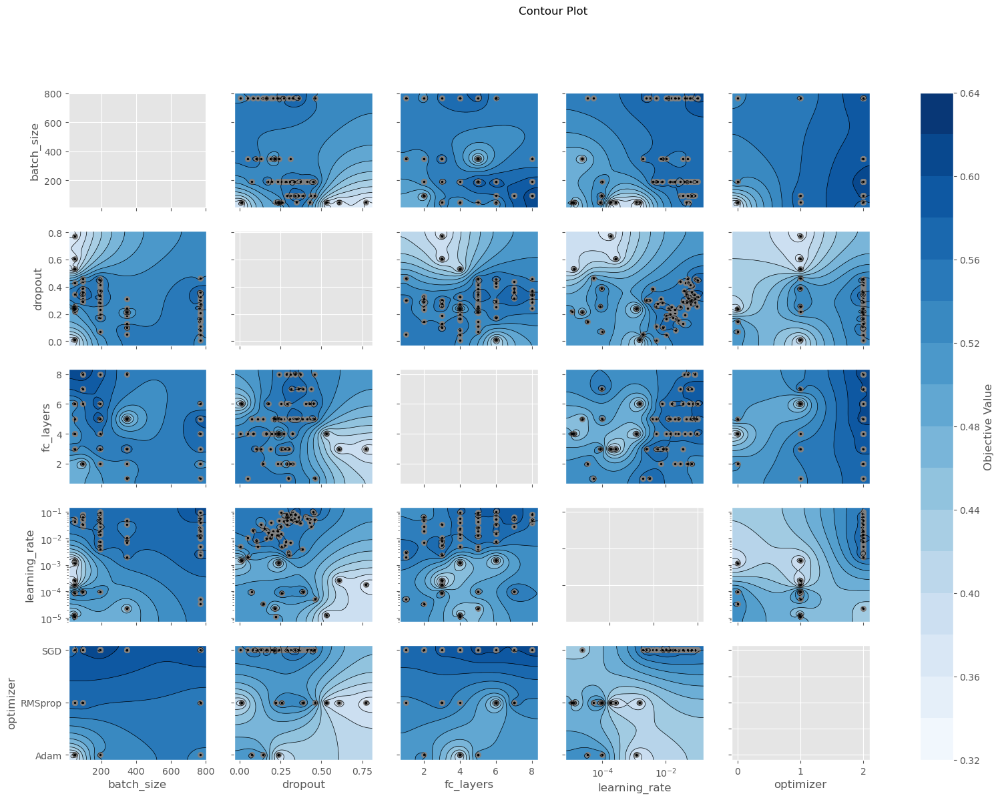

In [86]:
# Visualize hyperparameter relationships
plot_contour(study)
set_size(15, 10)

/tmp/ipykernel_36455/1888575690.py:2: ExperimentalWarning: plot_slice is experimental (supported from v2.2.0). The interface can change in the future.
  plot_slice(study)


array([<Axes: xlabel='batch_size', ylabel='Objective Value'>,
       <Axes: xlabel='dropout'>, <Axes: xlabel='fc_layers'>,
       <Axes: xlabel='learning_rate'>, <Axes: xlabel='optimizer'>],
      dtype=object)

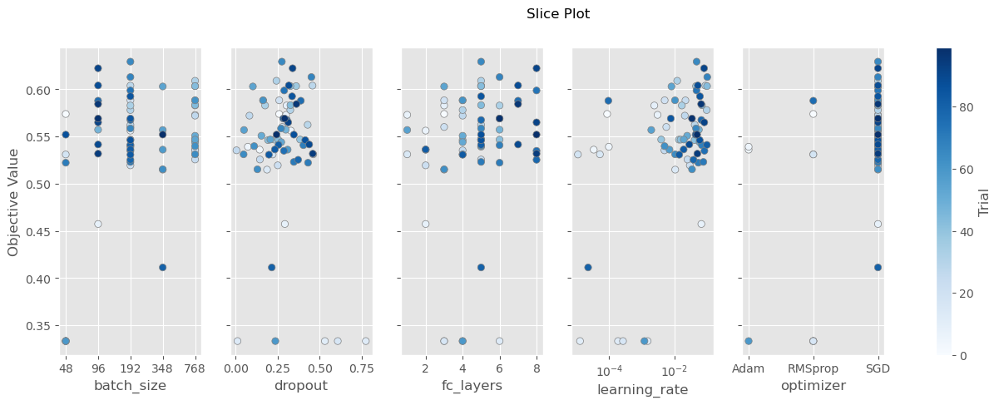

In [87]:
# Visualize individual hyperparameters as slice plot
plot_slice(study)

/tmp/ipykernel_36455/1473508994.py:2: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(study)


<Axes: title={'left': 'Hyperparameter Importances'}, xlabel='Hyperparameter Importance', ylabel='Hyperparameter'>

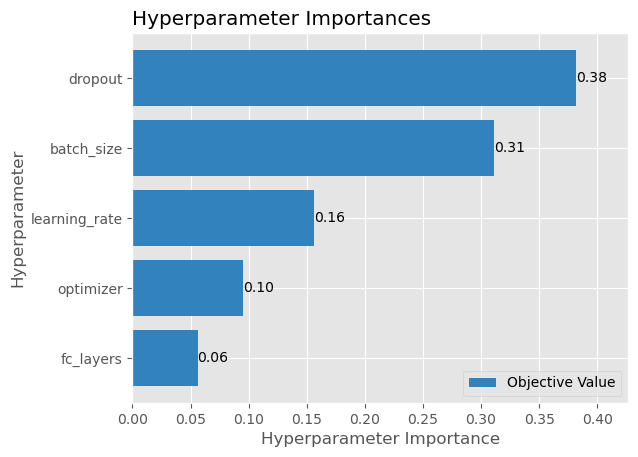

In [88]:
# Visualize parameter importances.
plot_param_importances(study)

/tmp/ipykernel_36455/3113371256.py:2: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


<Axes: title={'left': 'Hyperparameter Importances'}, xlabel='Hyperparameter Importance', ylabel='Hyperparameter'>

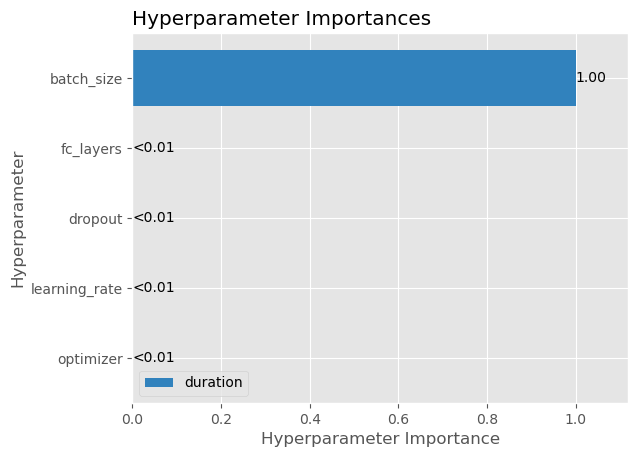

In [89]:
# Learn which hyperparameters are affecting the trial duration with hyperparameter importance.
plot_param_importances(
    study, target=lambda t: t.duration.total_seconds(), target_name="duration"
)

/tmp/ipykernel_36455/1828777839.py:2: ExperimentalWarning: plot_edf is experimental (supported from v2.2.0). The interface can change in the future.
  plot_edf(study)


<Axes: title={'center': 'Empirical Distribution Function Plot'}, xlabel='Objective Value', ylabel='Cumulative Probability'>

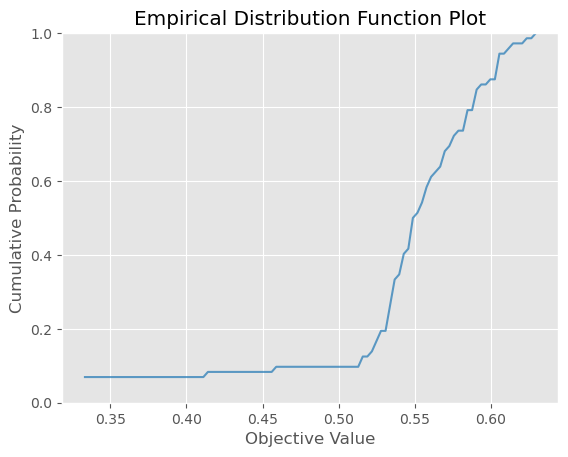

In [90]:
# Visualize empirical distribution function.
plot_edf(study)

/tmp/ipykernel_36455/1172520691.py:2: ExperimentalWarning: plot_rank is experimental (supported from v3.2.0). The interface can change in the future.
  plot_rank(study)
[W 2024-06-11 03:31:00,377] Output figures of this Matplotlib-based `plot_rank` function would be different from those of the Plotly-based `plot_rank`.


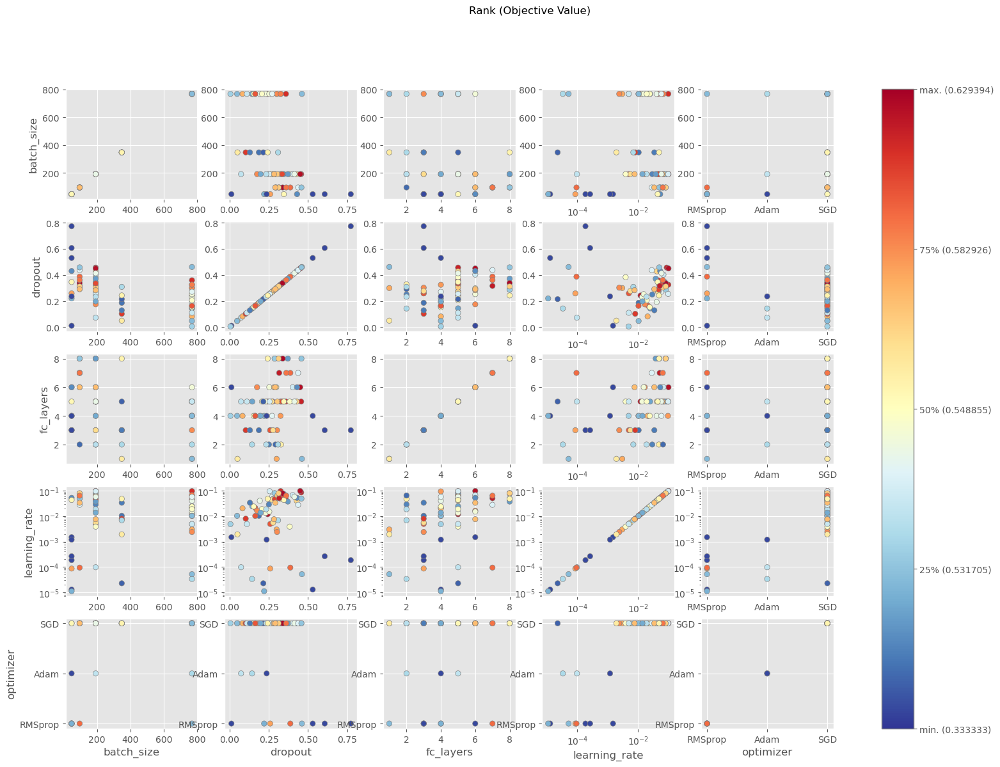

In [91]:
# Visualize parameter relations with scatter plots colored by objective values.
plot_rank(study)
set_size(15, 10)

/tmp/ipykernel_36455/124343896.py:2: ExperimentalWarning: plot_timeline is experimental (supported from v3.2.0). The interface can change in the future.
  plot_timeline(study)


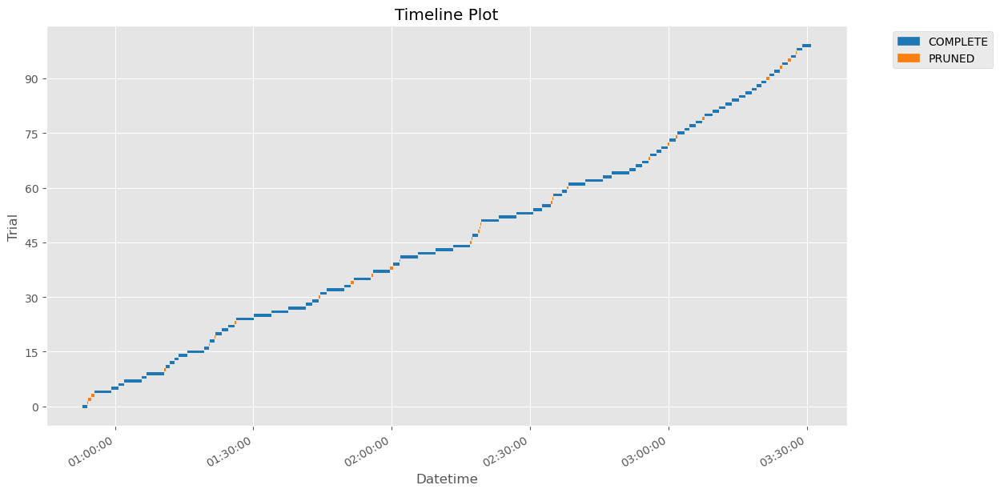

In [92]:
# Visualize the optimization timeline of performed trials.
plot_timeline(study)
set_size(10, 5)